In [2]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import copy

import torch
import torch.nn.functional as F

import sys

sys.path.append('/content/drive/MyDrive/neuro_research/stp_networks/stable_paper/')
# sys.path.append('/content/drive/MyDrive/neuro_research/stp_networks/')
import networks as nets
import net_utils as net_utils
import int_data as syn
import analysis as analysis
import context_data as context
from data import generate_recog_data, generate_recog_data_batch
from plotting import plot_generalization, get_recog_positive_rates

c_vals = ['firebrick', 'darkgreen', 'blue', 'darkorange', 'm', 'deeppink', 'r', 'gray', 'g', 'navy', 
                'y', 'purple', 'cyan', 'olive', 'skyblue', 'pink', 'tan']
c_vals_l = ['salmon', 'limegreen', 'cornflowerblue', 'bisque', 'plum', 'pink', 'tomato', 'lightgray', 'g', 'b', 
                      'y', 'purple', 'cyan', 'olive', 'skyblue', 'pink', 'tan']

def participation_ratio_vector(C):
    """Computes the participation ratio of a vector of variances."""
    return np.sum(C) ** 2 / np.sum(C*C)

### Reload

In [7]:
# Reload modules if changes have been made to them
from importlib import reload

reload(net_utils)
reload(nets)
reload(syn)
reload(analysis)
reload(context)

<module 'context_data' from '/home/sc256/mpn/paper/context_data.py'>

In [5]:
from net_utils import xe_classifier_accuracy

import os
import pickle
import copy

def default_params(net_params):
    # Applies default parameters. Note this was implemented only when writing
    # rebuttal, so if certain parameters are not in saved nets they are default

    if 'modulation_bounds' not in net_params: net_params['modulation_bounds'] = False
    if 'mod_bound_val' not in net_params: net_params['mod_bound_val'] = 1.0

    return net_params

def init_net(net_params, verbose=True):
    print(net_params)
    # Set defaults
    net_params = default_params(net_params)

    # initialize net with default values
    if net_params['netType'] == 'nnLSTM':
        net = nets.nnLSTM([net_params['n_inputs'], net_params['n_hidden'], net_params['n_outputs']])
    elif net_params['netType'] == 'GRU':
        net = nets.GRU([net_params['n_inputs'], net_params['n_hidden'], net_params['n_outputs']],
                       trainableState0=net_params['trainable_state0'], 
                       hiddenBias=net_params['hidden_bias'], roBias=net_params['ro_bias'], 
                       fAct=net_params['f_act'], fOutAct=net_params['f0_act'],
                       freezeInputs=net_params['freeze_inputs'],
                       sparsification=net_params['sparsification'], noiseType=net_params['noise_type'],
                       noiseScale=net_params['noise_scale'], verbose=verbose)
    elif net_params['netType'] == 'VanillaRNN':
        net = nets.VanillaRNN([net_params['n_inputs'], net_params['n_hidden'], net_params['n_outputs']],
                              trainableState0=net_params['trainable_state0'], 
                              hiddenBias=net_params['hidden_bias'], roBias=net_params['ro_bias'], 
                              fAct=net_params['f_act'], fOutAct=net_params['f0_act'],
                              freezeInputs=net_params['freeze_inputs'],
                              sparsification=net_params['sparsification'], noiseType=net_params['noise_type'],
                              noiseScale=net_params['noise_scale'], verbose=verbose)
    elif net_params['netType'] in ('HebbNet', 'HebbNet_M', 'rHebbNet', 'rHebbNet_M', 'GHU', 'GHU_M'):
        if net_params['netType'] in ('HebbNet_M', 'rHebbNet_M', 'GHU_M'):
            stpType = 'mult'
        else:
            stpType = 'add'
        if net_params['netType'] in ('HebbNet', 'HebbNet_M'):
            netClass = nets.HebbNet
        elif net_params['netType'] in ('rHebbNet', 'rHebbNet_M'):
            netClass = nets.RecHebbNet
        elif net_params['netType'] in ('GHU', 'GHU_M'):
            netClass = nets.GHU

        net = netClass([net_params['n_inputs'], net_params['n_hidden'], net_params['n_outputs']],
                       trainableState0=net_params['trainable_state0'], stpType=stpType, 
                       hiddenBias=net_params['hidden_bias'], roBias=net_params['ro_bias'], updateType='hebb', 
                       lamClamp=net_params['lam_clamp'], hebbType=net_params['hebb_type'],
                       etaType=net_params['eta_type'], freezeInputs=net_params['freeze_inputs'], 
                       sparsification=net_params['sparsification'], noiseType=net_params['noise_type'],
                       noiseScale=net_params['noise_scale'], AAct=net_params['A_act'], 
                       modulation_bounds=net_params['modulation_bounds'], mod_bound_val=net_params['mod_bound_val'],
                       fAct=net_params['f_act'], fOutAct=net_params['f0_act'], verbose=verbose)

        if net_params['eta_force'] == 'Hebb':
            net.forceHebb = torch.tensor(True)
            net.init_hebb(eta=net.eta.item(), lam=net.lam.item()) #need to re-init for this to work
        elif net_params['eta_force'] == 'Anti':
            net.forceAnti = torch.tensor(True)
            net.init_hebb(eta=net.eta.item(), lam=net.lam.item())
        elif net_params['eta_force'] is not None:
            raise ValueError
    else:
        raise ValueError

    return net

def save_net(net, net_params, dataset_details, root_path, overwrite=False, verbose=True):
    """ 
    Saves the network as well as the dicts net_params and toy_params which 
    will allow the network be reinitialized. Unfortunately couldn't figure 
    out how to do this without saving to two different files.

    INPUTS:
    dataset_details: either toy_params or a dictionary of neuroGym parameters

    """

    save_file = True

    if 'data_type' in dataset_details: # toy_params case
        filename = root_path + '{}[{},{},{}]_train={}_task={}_{}class_{}len_seed{}.pkl'.format(
            net_params['netType'], net_params['n_inputs'], net_params['n_hidden'],
            net_params['n_outputs'], net_params['train_mode'],
            dataset_details['data_type'], dataset_details['n_classes'], 
            dataset_details['phrase_length'], net_params['seed'],
        )
    elif 'dataset' in dataset_details: # neruoGym case
        dataset_details = copy.deepcopy(dataset_details)
        del dataset_details['dataset'] # Sometimes cant pickle this, so just remove the dataset
        filename = root_path + '{}[{},{},{}]_train={}_task={}_{}len_seed{}.pkl'.format(
            net_params['netType'], net_params['n_inputs'], net_params['n_hidden'],
            net_params['n_outputs'], net_params['train_mode'],
            dataset_details['dataset_name'], 
            dataset_details['seq_length'], net_params['seed'],
        )
    else:
        raise ValueError('dataset_details not recognized')

    directory = os.path.split(filename)[0]
    if directory != '' and not os.path.exists(directory):
        os.makedirs(directory)

    if os.path.exists(filename):
        print('  File already exists at:', filename)
        override = input('Override? (Y/N):')
        if override == 'N':
            save_file = False
        elif override != 'Y':
            raise ValueError(f'Input {override} not recognized!')

    # if not overwrite:
    #     base, ext = os.path.splitext(filename)
    #     n = 2
    #     while os.path.exists(filename):
    #         filename = '{}_({}){}'.format(base, n, ext)
    #         n+=1

    state_filename = filename[:filename.find('.pkl')] + '_netstate.pkl'

    if save_file:
        if verbose:
            print('  Params filename:', filename)
        with open(filename, 'wb') as save_file:
            # Saves additional parameters so the network can be re-initialized 
            pickle.dump(net_params, save_file, protocol=pickle.HIGHEST_PROTOCOL)
            pickle.dump(dataset_details, save_file, protocol=pickle.HIGHEST_PROTOCOL)

        # Calls a reset state to set batch size to default (=1)
        # (doesn't affect anything, just prevents a warning when loading)
        if net_params['netType'] in ('HebbNet', 'HebbNet_M',):
            net.reset_state()

        if verbose:
            print('  State filename:', state_filename)
        with open(state_filename, 'wb') as save_file:    
            # Uses Pytorch's internal saving protocal for the network last
            net.save(save_file)
    else:
        print('  File not saved!')

def get_data_type_fns(toy_params, verbose=True):
     # Sets some dataset dependent parameters/functions
    special_data_gen_fn = None
    if toy_params['data_type'] == 'int':
        if verbose: print('Toy integration data...')
        data_gen_fn = syn.generate_data
        special_data_gen_fn = syn.generate_special_data
    elif toy_params['data_type'] in ('context', 'retro_context'):
        if verbose: print('Contextual integration data (continuous)...')
        assert toy_params['n_classes'] == 2 # Only defined for 2 outputs at the moment
        data_gen_fn = context.generate_data
        special_data_gen_fn = context.generate_special_data
    elif toy_params['data_type'] in ('context_int', 'retro_context_int',):
        if verbose: print('Contextual integration data (discrete)...')
        data_gen_fn = syn.generate_data_context
    elif toy_params['data_type'] in ('context_anti', 'retro_context_anti',):
        if verbose: print('Contextual anti-integration task...')
        data_gen_fn = syn.generate_data_anti_context
    elif toy_params['data_type'] in ('cont_int',):
        if verbose: print('Continuous integration task (no context)...')
        data_gen_fn = context.generate_cont_int_data
    elif toy_params['data_type'] in ('smnist_rows', 'smnist_columns',):
        if verbose: print('Serialized MNIST...')
        data_gen_fn = convert_serialized_mnist
    else:
        raise ValueError('Data_type {} not recognized'.format(toy_params['data_type']))

    run_special = False if special_data_gen_fn is None else True
    
    return data_gen_fn, special_data_gen_fn, run_special

def load_net(filename, seed):
    """
    Loads the net_params and toy_params, and uses this to re-init a network.

    filename: should be the filename of the pkl file where the net_params
        and toy_params are located WITHOUT SEED OR .pkl
    """
    filename = filename + '_seed{}.pkl'.format(seed)

    if not os.path.exists(filename):
        raise ValueError('No file at path:', filename)
    else:
        state_filename = filename[:filename.find('.pkl')] + '_netstate.pkl'

        with open(filename, 'rb') as load_file:
            net_params_load = pickle.load(load_file)
            dataset_details_load = pickle.load(load_file) # toy_params or dataset_details
        
        # Using loaded net and toy parameters, creates new network
        net_load = init_net(net_params_load, verbose=False)

        with open(state_filename, 'rb') as load_file:
            net_load.load(load_file)

        return net_load, net_params_load, dataset_details_load

def get_align_angle(x, y):
    dot = np.dot(x,y)/(
         np.linalg.norm(x) * np.linalg.norm(y)
     )
    if dot > 1.0:
         dot = 1.0
    elif dot < -1.0:
        dot = -1.0
    
    return 180/np.pi * np.arccos(dot)

def get_running_scores(word_labels, toy_params):
    """
    Returns the running score for a dataset 

    OUTPUTS:
    running_score: (n_batch, seq_len, score_vec_size)
    """

    running_score = np.zeros((word_labels.shape[0],
                              word_labels.shape[1],
                              toy_params['base_word_vals']['evid0'].shape[0]))

    for batch_idx in range(word_labels.shape[0]):
        batch_score = np.zeros((running_score.shape[-1],))
        for seq_idx in range(word_labels.shape[1]):
            current_word = toy_params['words'][word_labels[batch_idx, seq_idx]]
            if current_word in toy_params['base_word_vals']:
                batch_score = batch_score + toy_params['base_word_vals'][current_word]
            running_score[batch_idx, seq_idx] = batch_score

    return running_score

def HebbNet_word_proj(word, As, net, toy_params):
    if toy_params['data_type'] == 'int':
        word_input = toy_params['word_to_input_vector'][word]
    elif toy_params['data_type'] == 'retro_context_int':
        assert word == '<eos>'
        word_input = np.concatenate((
            toy_params['toy_params_1']['word_to_input_vector']['<eos>'],
            toy_params['toy_params_2']['word_to_input_vector']['<eos>']
        ), axis=0)
    else:
        assert word == '<eos>'
        word_input = np.array([0, 0, 0.5, 0.5])

    if net.stpType == 'add':
        Aword = np.matmul(As, word_input)
        Winpword = np.matmul(net.w1.detach().numpy(), word_input)
        if len(As.shape) == 4: # sequence and batch idx
            Winpword = Winpword[np.newaxis, np.newaxis, :]
        elif len(As.shape) == 3: # only one idx
            Winpword = Winpword[np.newaxis, :]
        else:
            raise ValueError('As shape not implemented')
        
        a1 = Aword + Winpword + net.b1.detach().numpy()
        if not torch.is_tensor(a1):
            a1 = torch.tensor(a1)
        h_word = net.f(a1) if net.f is not None else a1

    elif net.stpType == 'mult':
        if len(As.shape) == 4: # sequence and batch idx
            w1 = net.w1.detach().cpu().numpy()[np.newaxis, np.newaxis, :, :]
        elif len(As.shape) == 3: # only one idx
            w1 = net.w1.detach().cpu().numpy()[np.newaxis, :, :]
        else:
            raise ValueError('As shape not implemented')
        AWword = np.matmul(As*w1, word_input)
        h_word = net.f(torch.tensor(AWword) + net.b1.detach().cpu()) if net.f is not None else torch.tensor(AWword) + net.b1.detach()

    return h_word.numpy()


### Train a single network

In [13]:
train = True
save = False
save_root = './neuro_research/stp_networks/saved_nets/'
# save_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/anti_task_'

########## Toy data parameters ##########
toy_params = {
    'data_type': 'int', # int, context, retro_context, context_int, retro_context_int, retro_context_anti, cont_int, 
    
    'phrase_length': 20,
    'n_classes': 2,
    'input_type': 'binary',    # one_hot, binary, binary1-1
    'input_size': 50,          # defaults to length of words
    'include_eos': True,

    'stack_phrases': False,
    'n_stack': 1,
    'include_sos': False,
    'n_delay': 0, # Inserts delay words (>0: at end, <0: at beginning)
    'delay_word': '<delay>', # '<delay>' or 'null'

    'uniform_score': True, # Uniform distribution over scores=
}

net_params = {
    'netType': 'HebbNet_M', # HebbNet, HebbNet_M, VanillaRNN, GRU, rHebbNet, rHebbNet_M, GHU, GHU_M
    'n_inputs': toy_params['input_size'],           # input dim
    'n_hidden': 100,                                # hidden dim
    'n_outputs': toy_params['n_classes'],         # output dim
    # 'n_outputs': 10,                                # train with larger number of outputs for generalization tests    
    'f_act': 'tanh',         # 1st layer actiivation function # linear, sigmoid, tanh, relu
    'f0_act': 'linear',          # 2nd layer actiivation function
    'trainable_state0': False,
    
    # STPN Features
    'A_act': None,            # Activation on the A update (tanh or None)
    'lam_clamp': 0.95,          # Maximum lambda value
    'eta_type': 'scalar',       # scalar or vector
    'eta_force': None,        # ensure either Hebbian or anti-Hebbian plasticity
    'hebb_type': 'input',      # input, output, inputOutput
    'modulation_bounds': False, # bound modulations 
    'mod_bound_val': 0.1, 

    # Train parameters
    'train_mode': 'seq_inf',   # 'seq' or 'seq_inf'
    'weight_reg': 'L1',
    'reg_lambda': 1e-4,
    'hidden_bias': True,
    'ro_bias': False,           # use readout bias or not
    'gradient_clip': 10,
    'freeze_inputs': False,      # freeze the input layer (and hidden bias)
    'sparsification': 0.0,      # Amount to sparsify network's weights (0.0 = no sparsification)
    'noise_type': 'input',      # None, 'input', 'hidden'
    'noise_scale': 0.1,         # Expected magnitude of noise vector
    'cuda': True,
    'validEarlyStop': False,     # Early stop when average validation loss saturates
    'accEarlyStop': 0.97,       # Accuracy to stop early at (None to ignore)
    'minMaxIter': (2000, 8000),  # Bounds on training time
    'seed': 1000,               # This seed is used to generate training/valid data too

    'train_set_size': 3200,
    'valid_set_size': 500,
    'batch_size': 64,
    'epochs': 40,
}

# Keep forgetting to turn this on for RNNs, so just automate it
net_params['hidden_bias'] = False if net_params['netType'] in ('HebbNet', 'HebbNet_M') else True

def train_network(net_params, toy_params, current_net=None, save=False, save_root='', 
                  set_seed=True, verbose=True):
    """ 
    Code to train a single network. 
    
    OUTPUTS:
    net: the trained network
    toy_params: these are updated when data is generated

    """
    # Sets some dataset dependent parameters/functions
    data_gen_fn, special_data_gen_fn, _ = get_data_type_fns(toy_params, verbose=verbose)

    # Sets the random seed for reproducibility (this affects both data generation and network)
    if 'seed' in net_params and set_seed:
        if net_params['seed'] is not None: 
            np.random.seed(seed=net_params['seed'])
            torch.manual_seed(net_params['seed'])
    
    # Intitializes network and puts it on device
    if net_params['cuda']:
        if verbose: print('Using CUDA...')
        device = torch.device('cuda')
    else:
        if verbose: print('Using CPU...')
        device = torch.device('cpu')
    if current_net is None: # Creates a new network
        net = init_net(net_params, verbose=verbose)
        # print('w1:', net.w1.detach().numpy()[:2,:2])
        # print('b1:', net.b1.detach().numpy()[:2])
        # print('wr:', net.wr.detach().numpy()[:2,:2])
        # print('wri:', net.wri.detach().numpy()[:2,:2])
        net.to(device)
    else:
        net = current_net

    # Creats the data and trains the network, this is done different for different training setups
    if net_params['train_mode'] == 'seq':
        trainData, trainOutputMask, toy_params = data_gen_fn(
            net_params['train_set_size'], toy_params, net_params['n_outputs'], 
            verbose=False, auto_balance=False, device=device)
        validData, validOutputMask, _ = data_gen_fn(
            net_params['valid_set_size'], toy_params, net_params['n_outputs'], 
            verbose=False, auto_balance=False, device=device)

        # print('Train data - input shape:', trainData.tensors[0].shape, '// label shape:', trainData.tensors[1].shape)
        # print('Valid data - input shape:', validData.tensors[0].shape, '// label shape:', validData.tensors[1].shape)

        # db = net.evaluate_debug(validData[0:test_set_size,:,:], batchMask=validOutputMask)
        # print('Evaluated!')

        _ = net.fit('sequence', epochs=net_params['epochs'], 
                    trainData=trainData, batchSize=net_params['batch_size'],
                    validBatch=validData[:,:,:], learningRate=1e-3,
                    monitorFreq=50, weightReg=net_params['weight_reg'], 
                    regLambda=net_params['reg_lambda'], gradientClip=net_params['gradient_clip'],
                    trainOutputMask=trainOutputMask, validOutputMask=validOutputMask, 
                    earlyStopValid=net_params['validEarlyStop'], minMaxIter=net_params['minMaxIter'])
    elif net_params['train_mode'] == 'seq_inf': # Continually generates new data to train on
        # This will iterate in loop so that it only sees each type of data a set amount of times
        net_params['epochs'] = 0 if current_net is None else net.hist['epoch']
        validData, validOutputMask, _ = data_gen_fn(
            net_params['valid_set_size'], toy_params, net_params['n_outputs'], 
            verbose=False, auto_balance=False, device=device)
        early_stop = False
        new_thresh = True # Triggers threshold setting for first call of .fit, but turns off after first call

        while not early_stop:
            net_params['epochs'] += 10 # Number of times it sees each example
            trainData, trainOutputMask, toy_params = data_gen_fn(
                net_params['train_set_size'], toy_params, net_params['n_outputs'], 
                verbose=False, auto_balance=False, device=device)
            
            # print('Train data - input shape:', trainData.tensors[0].shape, '// label shape:', trainData.tensors[1].shape)

            early_stop = net.fit('sequence', epochs=net_params['epochs'], 
                                 trainData=trainData, batchSize=net_params['batch_size'],
                                 validBatch=validData[:,:,:], learningRate=1e-3,
                                 newThresh=new_thresh, monitorFreq=50, 
                                 trainOutputMask=trainOutputMask, validOutputMask=validOutputMask,
                                 validStopThres=net_params['accEarlyStop'], weightReg=net_params['weight_reg'], 
                                 regLambda=net_params['reg_lambda'], gradientClip=net_params['gradient_clip'],
                                 earlyStopValid=net_params['validEarlyStop'], minMaxIter=net_params['minMaxIter']) 
            new_thresh = False   
    else:
        raise ValueError

    if save:
        save_net(net, net_params, toy_params, save_root, overwrite=False, verbose=verbose)
    else:
        print('Not saving network.')

    return net, toy_params, net_params

if train:
    net, toy_params, net_params = train_network(net_params, toy_params, save=save, save_root=save_root)
else:
    print('Not training (set train=True if you want to train).')

# print('w1:', net.w1.cpu().detach().numpy()[:2,:2])
# print('b1:', net.b1.cpu().detach().numpy()[:2])
# print('wr:', net.wr.cpu().detach().numpy()[:2,:2])
# print('wri:', net.wri.cpu().detach().numpy()[:2,:2])

Toy integration data...
Using CUDA...
Net parameters:
  Net Type: Multiplicative
  Structure: f: tanh // fOut: linear // (Nx, Nh, Ny) = (50, 100, 2)
  No hidden bias // No readout bias // Sparsification: 0.00 // Noise type: input (scl: 1.0e-01)
  A parameters:
    A update: Hebbian // Pre-Syn Only // A Act: linear // Eta: scalar // Lam: scalar // Lambda_max: 0.95
    A0: zeros // A unbounded
Train parameters:
  Loss: XE // LR: 1.00e-03 // Weight reg: L1, coef: 1.0e-04 // Gradient clip: 1.0e+01
Iter:0 grad:8.617 train_loss:0.7367 train_acc:0.672 valid_loss:0.7382 valid_acc:0.684
Iter:50 grad:7.896 train_loss:0.6737 train_acc:0.594 valid_loss:0.6793 valid_acc:0.586
Iter:100 grad:7.586 train_loss:0.6087 train_acc:0.922 valid_loss:0.5987 valid_acc:0.916
Iter:150 grad:7.659 train_loss:0.4978 train_acc:0.922 valid_loss:0.5029 valid_acc:0.894
Iter:200 grad:7.975 train_loss:0.4327 train_acc:0.844 valid_loss:0.4062 valid_acc:0.936
Iter:250 grad:8.342 train_loss:0.3873 train_acc:0.891 valid_loss

See training history

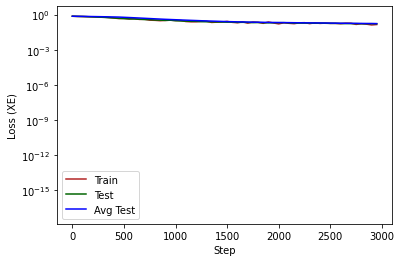

In [ ]:
fig, ax1 = plt.subplots(1, 1, figsize=(6,4))

ax1.plot(net.hist['iters_monitor'], net.hist['train_loss'], color=c_vals[0], label='Train')
ax1.plot(net.hist['iters_monitor'], net.hist['valid_loss'], color=c_vals[1], label='Test')
ax1.plot(net.hist['iters_monitor'], net.hist['avg_valid_loss'], color=c_vals[2], label='Avg Test')

ax1.set_xlabel('Step')
ax1.set_ylabel('Loss (XE)')
ax1.legend()

ax1.axhline(0.0, color='k', linestyle='dashed')

ax1.set_yscale('log')

# ax1.set_ylim((0.5, 2.5))

In [ ]:
A = net.A.detach().cpu().numpy()
W_inp = net.w1.detach().cpu().numpy()

print('Average weight strength - W_inp {:.3e}'.format(np.mean(np.abs(W_inp))))
print('Eta: {:.2f}, lambda: {:.2f}'.format(
    net.eta.detach().cpu().numpy()[0, 0, 0], net.lam.detach().cpu()
))

print(A.shape)
print(W_inp.shape)

ratio = (A * W_inp) / W_inp

print('Max ratio: {:.3f}, Min ratio: {:.3f}'.format(np.max(ratio), np.min(ratio)))

Average weight strength - W_inp 1.133e-01
Eta: 1.58, lambda: 0.95
(500, 100, 50)
(100, 50)
Max ratio: 0.100, Min ratio: -0.100


### Evaluate

In [ ]:
turn_off_noise = False
test_set_size = 1000
run_special = True

data_gen_fn, special_data_gen_fn, run_special = get_data_type_fns(toy_params, verbose=False)

if toy_params['data_type'] in ('smnist_rows', 'smnist_columns',):
    test_set_size = test_data_mnist

device = net.w1.device

if turn_off_noise:
    print('Turning off noise for test set.')
    net_noise_type = net.noiseType
    net.noiseType = None

testData, testOutputMask, testRaw, _ = data_gen_fn(
    test_set_size, toy_params, net_params['n_outputs'], auto_balance=False, 
    raw_data=True, device=device)
db = net.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)

print('Accuracy: {:.3f}'.format(db['acc']))
labels = np.array(testData[:,:,:][1][:, -1, 0].cpu())

if run_special:
    # Special inputs specificially used for analysis
    specialData, specialMask = special_data_gen_fn(toy_params, net_params['n_outputs'], device=device)
    db_special = net.evaluate_debug(specialData[:,:,:], batchMask=specialMask)
    hs_spec = db_special['h'].numpy()
    spec_labels = np.array(specialData[:,:,:][1][:, -1, 0].cpu())

if toy_params['data_type'] == 'int':
    # Generates labels for each word in input sequences 
    word_to_input_vector_mat = np.zeros((len(toy_params['words']), net_params['n_inputs'],))
    for word_idx, word in enumerate(toy_params['words']):
        word_to_input_vector_mat[word_idx] = toy_params['word_to_input_vector'][word]
    word_labels = np.argmax(np.matmul(testData.tensors[0].cpu().numpy(), word_to_input_vector_mat.T), axis=-1)
elif toy_params['data_type'] in ('context',):
    testColorOff, testMotionOff, testRawInputs = testRaw
    
    # context_vals is a 0 for color, 1 for motion
    context_vals = np.zeros((testRawInputs.shape[0],))
    for batch_idx in range(testRawInputs.shape[0]):
        if np.sum(testRawInputs[batch_idx, :, 2]) < np.sum(testRawInputs[batch_idx, :, 3]):
            context_vals[batch_idx] = 1.0

    # Modifies labels so it takes into account context as well
    labels = np.array(labels + 2*context_vals, dtype=np.int32)
    
    spec_context_vals = np.array(specialData[:,:,:][0][:, 0, 3].cpu())
    spec_labels = np.array(specialData[:,:,:][1][:, -1, 0].cpu())
    spec_labels = np.array(spec_labels + 2*spec_context_vals, dtype=np.int32)
elif toy_params['data_type'] in ('context_int', 'retro_context_int',):
    context_mask, labels_1, labels_2, epoch_idxs = testRaw
    labels_1 = labels_1[:, -1, 0] # (n_batch, n_seq, 1) -> (n_batch,)
    labels_2 = labels_2[:, -1, 0]
    # Modifies labels so it takes into account context as well
    labels = np.array(labels + toy_params['n_classes']*context_mask, dtype=np.int32)
elif toy_params['data_type'] in ('retro_context_anti',):
    context_mask, labels_1, anti_labels_1, epoch_idxs = testRaw
    labels_1 = labels_1[:, -1, 0] # (n_batch, n_seq, 1) -> (n_batch,)
    anti_labels_1 = anti_labels_1[:, -1, 0]
    # Modifies labels so it takes into account context as well
    labels = np.array(labels + toy_params['n_classes']*context_mask, dtype=np.int32)

hs = db['h'].detach().numpy()
print('Hidden states shape', hs.shape)
ro_matrix = np.array(net.w2.detach().cpu())
print('RO shape', ro_matrix.shape)

if toy_params['stack_phrases'] and toy_params['n_stack'] > 1:
    print('This code needs to be generalized...')
    # eos_vals = np.array([9, 19, 29, 39, 49])
    eos_vals = np.array([19, 39, 59, 79, 99])

    labels_pred = np.argmax(db['out'][:, eos_vals, :], axis=-1).numpy()
    labels = validData.tensors[1][:, eos_vals, 0].numpy()

    print(labels_pred.shape)
    print(labels.shape)

    np.sum(labels_pred == labels, axis=0)/100

# Restores noise if it has been turned off
if turn_off_noise:
    net.noiseType = net_noise_type

Synthentic data generated in: 0.27 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
Accuracy: 0.979
Hidden states shape (1000, 20, 100)
RO shape (2, 100)


PCA shape: (1000, 20, 100)
Variances: ['11.90', '0.26', '0.07', '0.04', '0.02', '0.01', '0.01', '0.00', '0.00', '0.00']
PR: 1.07, eta: 2.30, lambda: 0.95


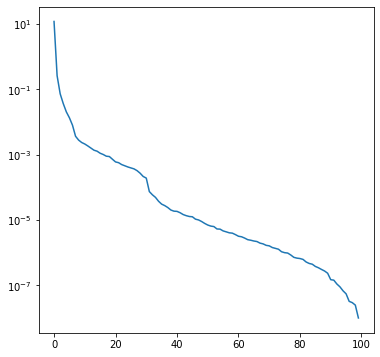

In [ ]:
seq_subset = False
n_components = 100
hidden_PCA = PCA(n_components=n_components)

hs_fit = hs
# start_seq, end_seq  = 0, epoch_idxs[0] # Signal
# start_seq, end_seq  = epoch_idxs[0], epoch_idxs[1] # 1st delay
# start_seq, end_seq  = epoch_idxs[1], epoch_idxs[2] # context
# start_seq, end_seq  = toy_params['phrase_length']-1, toy_params['phrase_length'] # Eos

# Adds initial hidden state to h
if net_params['netType'] in ('VanillaRNN', 'GRU'):
    h0 = net.h0.cpu().numpy()
    h0_batch = np.repeat(h0[np.newaxis, np.newaxis, :], hs_fit.shape[0], axis=0)
    hs_fit = np.concatenate((h0_batch, hs_fit), axis=1)
    # Adjusts seq indices accordingly (note if start_seq = 0, keeps start_seq = 0)
    start_seq = start_seq + 1 if start_seq > 0 else start_seq
    end_seq = end_seq + 1

if seq_subset:
    print('Using sequence bounds {} to {}'.format(start_seq, end_seq))
    hs_fit = hs[:, start_seq:end_seq, :]
hidden_PCA.fit(hs_fit.reshape((-1, hs_fit.shape[-1])))

hs_pca = np.zeros((hs_fit.shape[0], hs_fit.shape[1], n_components,))

for batch_idx in range(hs_fit.shape[0]):
    hs_pca[batch_idx] = hidden_PCA.transform(hs_fit[batch_idx])

if run_special:
    hs_spec_pca = np.zeros((hs_spec.shape[0], hs_spec.shape[1], n_components,))
    for batch_idx in range(hs_spec.shape[0]):
        hs_spec_pca[batch_idx] = hidden_PCA.transform(hs_spec[batch_idx])

zero_matrix_pca = hidden_PCA.transform(np.zeros_like(ro_matrix))
ro_matrix_pca = hidden_PCA.transform(ro_matrix)

print('PCA shape:', hs_pca.shape)
print('Variances:', ['{:.2f}'.format(var) for var in hidden_PCA.explained_variance_[:10]])
if net_params['netType'] in ('HebbNet', 'HebbNet_M'):
    print('PR: {:.2f}, eta: {:.2f}, lambda: {:.2f}'.format(
        participation_ratio_vector(hidden_PCA.explained_variance_),
        net.eta.detach().cpu().numpy()[0, 0, 0], net.lam.detach().cpu()
        ))
elif net_params['netType'] in ('VanillaRNN', 'GRU'):
    print('PR: {:.2f}'.format(
        participation_ratio_vector(hidden_PCA.explained_variance_)))

fig, ax1 = plt.subplots(1, 1, figsize=(6,6))

ax1.plot(hidden_PCA.explained_variance_)
ax1.set_yscale('log')

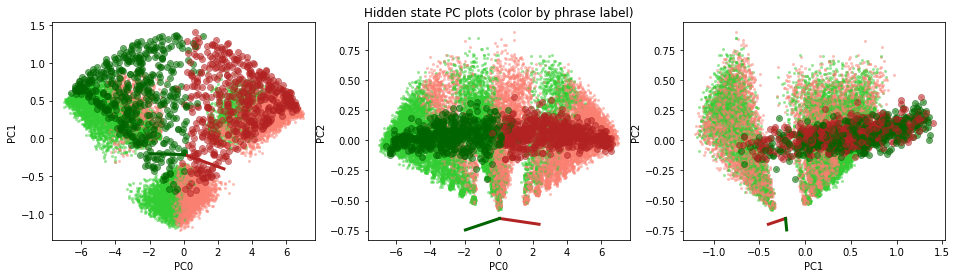

In [ ]:
color_type = 'labels' # 'labels', 'words', 'seq_idx', 'labels_1', 'labels_2'

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4))

pcxs = (0, 0, 1)
pcys = (1, 2, 2)
ax_pair_lims = (None, None, None)

cmap = plt.cm.get_cmap('plasma')
phrase_len = hs.shape[1]

for ax, pcx, pcy, ax_pair_lim in zip((ax1, ax2, ax3), pcxs, pcys, ax_pair_lims):
    for batch_idx in range(hs.shape[0]):
        if color_type == 'labels':
            color_labels_l = c_vals_l[labels[batch_idx]]
            color_labels = c_vals[labels[batch_idx]]
        elif color_type == 'words':
            color_labels_l = [c_vals_l[word_labels[batch_idx, seq_idx]] for seq_idx in range(phrase_len)]
            if net_params['netType'] in ('VanillaRNN', 'GRU'):
                color_labels_l.insert(0, 'black') # initial hidden state
            color_labels = c_vals[word_labels[batch_idx, -1]]
        elif color_type == 'seq_idx':
            color_labels_l = [cmap(seq_idx/phrase_len) for seq_idx in range(phrase_len)]
            color_labels = cmap((phrase_len-1)/phrase_len)

        ax.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], linewidth=0.0,
                   marker='.', color=color_labels_l, zorder=0, alpha=0.5)
        ax.scatter(hs_pca[batch_idx, -1, pcx], hs_pca[batch_idx, -1, pcy], marker='o',
                   color=color_labels, zorder=5, alpha=0.5)

    # for batch_idx in range(hs_spec.shape[0]):
    # # for batch_idx in range(len(toy_params['words'])-2):
    #     ax.plot(hs_spec_pca[batch_idx, :, pcx], hs_spec_pca[batch_idx, :, pcy], 
    #             color=c_vals[spec_labels[batch_idx]], marker='.')

    for ro_idx in range(net_params['n_outputs']):
        ax.plot([zero_matrix_pca[ro_idx, pcx], ro_matrix_pca[ro_idx, pcx]], 
                [zero_matrix_pca[ro_idx, pcy], ro_matrix_pca[ro_idx, pcy]],
                 color=c_vals[ro_idx], linewidth=3.0, zorder=10)

    # Some sample paths
    # for batch_idx in range(2):
    #     ax.plot(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], marker='.',
    #             color=c_vals[labels[batch_idx]], zorder=1)

    # Initial hidden (only well-defined for RNNs)
    if net_params['netType'] in ('VanillaRNN', 'GRU'):
        ax.plot(hs_pca[0, 0, pcx], hs_pca[0, 0, pcy], marker='s',
                color='k', zorder=10)

    ax.set_xlabel('PC{}'.format(pcx))
    ax.set_ylabel('PC{}'.format(pcy))
    # Sets square limits if desired
    if ax_pair_lim is not None:
        ax.set_xlim((-ax_pair_lim, ax_pair_lim))
        ax.set_ylim((-ax_pair_lim, ax_pair_lim))

if color_type == 'labels':
    ax2.set_title('Hidden state PC plots (color by phrase label)')
elif color_type == 'words':
    ax2.set_title('Hidden state PC plots (color by input word)')
elif color_type == 'seq_idx':
    ax2.set_title('Hidden state PC plots (color by sequence location)')

In [ ]:
print(np.linalg.norm(toy_params['word_to_input_vector']['evid0']))
print(hs.shape)
print(np.mean(np.linalg.norm(hs, axis=-1)))

Winp = net.w1.detach().cpu().numpy()
eta = net.eta.detach().cpu().numpy()

Winp_x = np.matmul(Winp, toy_params['word_to_input_vector']['evid0'])
print(np.linalg.norm(Winp_x))
Winp_xx = np.matmul(Winp, toy_params['word_to_input_vector']['evid0']*toy_params['word_to_input_vector']['evid1'])
print(np.linalg.norm(Winp_xx))

tanh_Winp_xx = eta*np.tanh(Winp_x) * Winp_xx
print(np.linalg.norm(tanh_Winp_xx))

5.0
(1000, 20, 100)
4.95269
3.2226984119163675
2.6986061816296223
2.419048429900038


Hidden state plot by mapping As into hs using word projections

In [ ]:
def timeAndPCAProject(state_seq, pc_comps=None):
    """
    Projects a state sequence onto a set of axes determined by a "time" direction
    and PCA on the remaining directions.

    INPUT:
    state_seq: tensor of shape (n_batches, n_seq, state_dim)
    """

    if pc_comps is None:
        pc_comps = state_seq.shape[-1]

    # Averages over batches to get average state for each sequence at a given time step
    state_time_mean = np.mean(state_seq, axis=0)
    # Determines time dirction by fitting to batch-averaged sequence
    time_PCA = PCA(n_components=1)
    time_PCA.fit(state_time_mean)
    time_dir = time_PCA.components_.T

    time_proj = time_dir.dot(np.linalg.norm(time_dir.T.dot(time_dir))).dot(time_dir.T)

    # Centers data, flattens over batch and sequence directions
    state_seq_mean = np.mean(state_seq.reshape((-1, state_seq.shape[-1])), axis=0)
    state_seq_center = state_seq - state_seq_mean[np.newaxis, np.newaxis, :]

    # Fits PCA to sequence with time direction projected out (batch and sequence flattened)
    state_seq_time = np.matmul(state_seq_center, time_proj.T)
    state_seq_notime = state_seq_center - state_seq_time
    notime_PCA = PCA(n_components=pc_comps-1)
    notime_PCA.fit(state_seq_notime.reshape((-1, state_seq_notime.shape[-1])))

    # Transformed sequence to be returned
    state_seq_pca =  np.zeros((state_seq.shape[0], state_seq.shape[1], pc_comps))
    proj_matrix = np.zeros((pc_comps, state_seq.shape[-1]))

    # Projection onto time direction
    state_seq_pca[:, :, 0] = np.matmul(state_seq_center, time_dir[:, 0])
    proj_matrix[0, :] = time_PCA.components_

    # PCA projection ont the remaining states
    for batch_idx in range(state_seq.shape[0]):
        state_seq_pca[batch_idx, :, 1:] = notime_PCA.transform(state_seq_center[batch_idx])
    proj_matrix[1:, :] = notime_PCA.components_

    return state_seq_pca, proj_matrix, state_seq_mean

In [ ]:
seq_subset = False
projection_type = 'PCA' # 'PCA', 'time_PCA'
word_proj = '<eos>' 
# word_proj = 'null'

As = db['A'].cpu().numpy()

# start_seq, end_seq  = 0, epoch_idxs[0] # Signal
# start_seq, end_seq  = epoch_idxs[0], epoch_idxs[1] # 1st delay
# start_seq, end_seq  = epoch_idxs[1], epoch_idxs[2] # context
start_seq, end_seq  = epoch_idxs[2], toy_params['phrase_length']-1 # pre: stimuli
# start_seq, end_seq  = toy_params['phrase_length']-1, toy_params['phrase_l

# Adds A0 as initial state for all sequences
As = db['A'].cpu().numpy()
A0 = net.A0.cpu().numpy()
A0_batch = np.repeat(A0[np.newaxis, np.newaxis, :, :], As.shape[0], axis=0)
As = np.concatenate((A0_batch, As), axis=1)
As_fit = As

if seq_subset:
    print('Using sequence bounds {} to {}'.format(start_seq, end_seq))
    As_fit = As[:, start_seq:end_seq, :, :]

h_word = HebbNet_word_proj(word_proj, As_fit, net, toy_params)

if projection_type == 'PCA':
    h_word_PCA = PCA(n_components=100)

    h_word_PCA.fit(h_word.reshape((-1, h_word.shape[-1])))
    h_word_pca = np.zeros(h_word.shape)

    for batch_idx in range(As.shape[0]):
        h_word_pca[batch_idx] = h_word_PCA.transform(h_word[batch_idx])

    if toy_params['data_type'] == 'int':
        h_spec_word = HebbNet_word_proj(word_proj, db_special['A'], net, toy_params)
        h_spec_word_pca = np.zeros(hs_spec.shape)
        for batch_idx in range(hs_spec.shape[0]):
            h_spec_word_pca[batch_idx] = h_word_PCA.transform(h_spec_word[batch_idx])

    ro_matrix_word_pca = h_word_PCA.transform(ro_matrix)
    zero_matrix_pca = h_word_PCA.transform(np.zeros_like(ro_matrix))
elif projection_type == 'time_PCA':
    h_word_pca, proj_matrix, center_vector = timeAndPCAProject(h_word)

    ro_matrix_word_pca = np.matmul(ro_matrix-center_vector[np.newaxis, :], proj_matrix.T)
    zero_matrix_pca = np.matmul(np.zeros_like(ro_matrix)-center_vector[np.newaxis, :], proj_matrix.T)

print('PCA shape:', h_word_pca.shape)
print('Variances:', ['{:.2f}'.format(var) for var in h_word_PCA.explained_variance_[:10]])
print('PR: {:.2f}'.format(
    participation_ratio_vector(h_word_PCA.explained_variance_)))

NameError: ignored

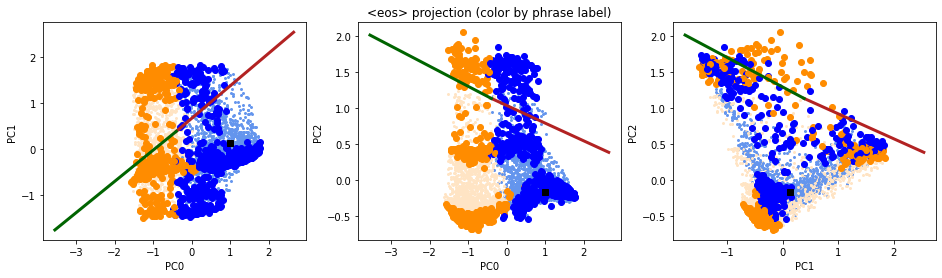

In [ ]:
color_type = 'labels' # 'labels', 'words', 'seq_idx'

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4))

pcxs = (0, 0, 1)
pcys = (1, 2, 2)
cmap = plt.cm.get_cmap('plasma')
phrase_len = hs.shape[1]

ax_lim = None

for ax, pcx, pcy in zip((ax1, ax2, ax3), pcxs, pcys):

    for batch_idx in range(hs.shape[0]):
        if color_type == 'labels':
            color_labels_l = c_vals_l[labels_1[batch_idx]+2]
            color_labels = c_vals[labels_1[batch_idx]+2]
        elif color_type == 'words':
            color_labels_l = [c_vals_l[word_labels[batch_idx, seq_idx]] for seq_idx in range(phrase_len)]
            color_labels = c_vals[word_labels[batch_idx, -1]]
        elif color_type == 'seq_idx':
            color_labels_l = [cmap(seq_idx/phrase_len) for seq_idx in range(phrase_len)]
            color_labels = cmap((phrase_len-1)/phrase_len)

        ax.scatter(h_word_pca[batch_idx, :, pcx], h_word_pca[batch_idx, :, pcy], linewidth=0.0,
                   marker='.', color=color_labels_l, zorder=0)
        ax.scatter(h_word_pca[batch_idx, -1, pcx], h_word_pca[batch_idx, -1, pcy], marker='o',
                   color=color_labels, zorder=5)
        
    # for batch_idx in range(hs_spec.shape[0]):
    # for batch_idx in range(len(toy_params['words'])-1):
    #     ax.plot(h_spec_word_pca[batch_idx, :, pcx], h_spec_word_pca[batch_idx, :, pcy], 
    #             color=c_vals[batch_idx], marker='.')

    for ro_idx in range(net_params['n_outputs']):
        ax.plot([zero_matrix_pca[ro_idx, pcx], ro_matrix_word_pca[ro_idx, pcx]], 
                [zero_matrix_pca[ro_idx, pcy], ro_matrix_word_pca[ro_idx, pcy]],
                color=c_vals[ro_idx], linewidth=3.0, zorder=10)

    # Some sample paths
    # for batch_idx in range(2):
    #     ax.plot(h_word_pca[batch_idx, :, pcx], h_word_pca[batch_idx, :, pcy], marker='.',
    #             color=c_vals[labels[batch_idx]], zorder=1)

    # Initial point (only uses first batch)
    ax.plot(h_word_pca[0, 0, pcx], h_word_pca[0, 0, pcy], marker='s',
            color='k', zorder=10)

    ax.set_xlabel('PC{}'.format(pcx))
    ax.set_ylabel('PC{}'.format(pcy))

    if ax_lim is not None:
        ax.set_xlim((-ax_lim, ax_lim,))
        ax.set_ylim((-ax_lim, ax_lim,))

if color_type == 'labels':
    ax2.set_title('{} projection (color by phrase label)'.format(word_proj))
elif color_type == 'words':
    ax2.set_title('{} projection (color by input word)'.format(word_proj))
elif color_type == 'seq_idx':
    ax2.set_title('{} projection (color by sequence location)'.format(word_proj))

Investigate A explicitly and project into its PCA space

In [ ]:
# Flatten matrix dimensions (but not batch and seq)
seq_subset = False
projection_type = 'PCA' # 'PCA', 'time_PCA'
pc_comps = 200

As = db['A'].cpu().numpy()

# start_seq, end_seq  = 0, epoch_idxs[0] # Signal
# start_seq, end_seq  = epoch_idxs[0], epoch_idxs[1] # 1st delay
# start_seq, end_seq  = epoch_idxs[1], epoch_idxs[2] # context
# start_seq, end_seq  = 20, toy_params['phrase_length']-1 # pre: stimuli
# start_seq, end_seq  = toy_params['phrase_length']-1, toy_params['phrase_l

# Adds A0 as initial state for all sequences
A0 = net.A0.cpu().numpy()
A0_batch = np.repeat(A0[np.newaxis, np.newaxis, :, :], As.shape[0], axis=0)
As = np.concatenate((A0_batch, As), axis=1)
start_seq = start_seq + 1 if start_seq > 0 else start_seq
end_seq = end_seq + 1
As_fit = As

if seq_subset:
    print('Using sequence bounds {} to {}'.format(start_seq, end_seq))
    As_fit = As[:, start_seq:end_seq, :, :]

As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))
A_diffs = As_flat[:, 1:, :] - As_flat[:, :-1, :] # note, already flattened

if projection_type == 'PCA':
    a_PCA = PCA(n_components=pc_comps)

    a_PCA.fit(As_flat.reshape((-1, As_flat.shape[-1])))
    
    # # Fit to one subset, but plot the other
    # As_fit = As[:, epoch_idxs[2]:toy_params['phrase_length']-1, :, :]
    # As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))

    As_pca = np.zeros((As_flat.shape[0], As_flat.shape[1], pc_comps))
    A_diffs_pca = np.zeros((A_diffs.shape[0], A_diffs.shape[1], pc_comps))
    # A_diffs_pca = np.zeros((As_flat.shape[0], As_flat.shape[1]-1, pc_comps))
    A_zeros = np.zeros_like(As_flat[0, 0:1, :])
    for batch_idx in range(As.shape[0]):
        As_pca[batch_idx] = a_PCA.transform(As_flat[batch_idx])
        A_diffs_pca[batch_idx] = a_PCA.transform(A_diffs[batch_idx])
        A_diffs_pca[batch_idx] = np.matmul(A_diffs[batch_idx], a_PCA.components_.T)
        # A_diffs_ca
    A_zeros_pca = a_PCA.transform(A_zeros)

    if toy_params['data_type'] == 'int':
        As_spec = np.copy(db_special['A'])
        As_spec_flat = As_spec.reshape((As_spec.shape[0], As_spec.shape[1], As_spec.shape[2]*As_spec.shape[3]))
        As_spec_pca = np.zeros((As_spec_flat.shape[0], As_spec_flat.shape[1], pc_comps))
        for batch_idx in range(hs_spec.shape[0]):
            As_spec_pca[batch_idx] = a_PCA.transform(As_spec_flat[batch_idx])
elif projection_type == 'time_PCA':
    As_pca, proj_matrix, center_vector = timeAndPCAProject(As_flat, pc_comps=pc_comps)

print('PCA shape:', As_pca.shape)
print('Variances:', ['{:.2f}'.format(var) for var in a_PCA.explained_variance_[:10]])
print('PR: {:.2f}'.format(
    participation_ratio_vector(a_PCA.explained_variance_)))

PCA shape: (1000, 21, 200)
Variances: ['0.04', '0.00', '0.00', '0.00', '0.00', '0.00', '0.00', '0.00', '0.00', '0.00']
PR: 1.21


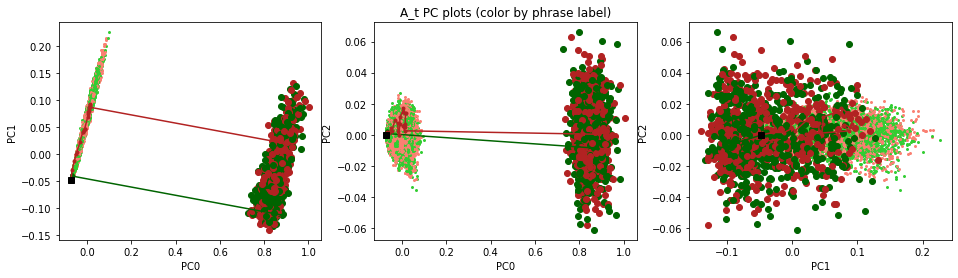

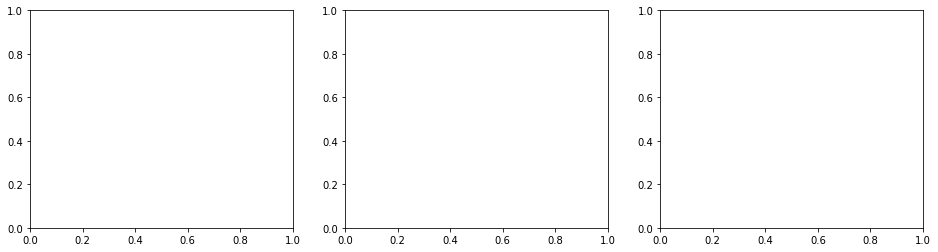

In [ ]:
color_type = 'labels' # 'labels', 'words', 'seq_idx'

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4))
fig, (ax4, ax5, ax6) = plt.subplots(1, 3, figsize=(16,4))

pcxs = (0, 0, 1)
pcys = (1, 2, 2)
# pcxs = (0, 1, 2)
# pcys = (3, 3, 3)

cmap = plt.cm.get_cmap('plasma')
phrase_len = hs.shape[1]

for ax, pcx, pcy in zip((ax1, ax2, ax3), pcxs, pcys):
    for batch_idx in range(hs.shape[0]):
        if color_type == 'labels':
            color_labels_l = c_vals_l[labels[batch_idx]]
            color_labels = c_vals[labels[batch_idx]]
        elif color_type == 'words':
            color_labels_l = [c_vals_l[word_labels[batch_idx, seq_idx]] for seq_idx in range(phrase_len)]
            color_labels = c_vals[word_labels[batch_idx, -1]]
        elif color_type == 'seq_idx':
            color_labels_l = [cmap(seq_idx/phrase_len) for seq_idx in range(phrase_len)]
            color_labels = cmap((phrase_len-1)/phrase_len)

        ax.scatter(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy], linewidth=0.0,
                   marker='.', color=color_labels_l, zorder=0)
        ax.scatter(As_pca[batch_idx, -1, pcx], As_pca[batch_idx, -1, pcy], marker='o',
                   color=color_labels, zorder=5)

    # for batch_idx in range(hs_spec.shape[0]):
    # for batch_idx in range(len(toy_params['words'])-1):
    #     ax.plot(As_spec_pca[batch_idx, :, pcx], As_spec_pca[batch_idx, :, pcy], 
    #             color=c_vals[batch_idx], marker='.', zorder=5)
   
    # Initial point (only uses first batch)
    ax.plot(As_pca[0, 0, pcx], As_pca[0, 0, pcy], marker='s',
            color='k', zorder=10)
    
    for batch_idx in range(2):
        ax.plot(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy], 
                color=c_vals[labels[batch_idx]], marker='.', zorder=5)

    ax.set_xlabel('PC{}'.format(pcx))
    ax.set_ylabel('PC{}'.format(pcy))

if color_type == 'labels':
    ax2.set_title('A_t PC plots (color by phrase label)')
elif color_type == 'words':
    ax2.set_title('A_t PC plots (color by input word)')
elif color_type == 'seq_idx':
    ax2.set_title('A_t PC plots (color by sequence location)')

# # Deflection plotting stuff
# for ax, pcx, pcy in zip((ax4, ax5, ax6), pcxs, pcys):
#     for batch_idx in range(hs.shape[0]):
#         color_labels_l = [c_vals_l[word_labels[batch_idx, seq_idx]] for seq_idx in range(phrase_len)]
#         color_labels = c_vals[word_labels[batch_idx, -1]]

#         ax.scatter(A_diffs_pca[batch_idx, :, pcx], A_diffs_pca[batch_idx, :, pcy], linewidth=0.0,
#                    marker='.', color=color_labels_l, zorder=0)
        
#     ax.set_xlabel('PC{}'.format(pcx))
#     ax.set_ylabel('PC{}'.format(pcy))

#### Change Speed/Random Neurons

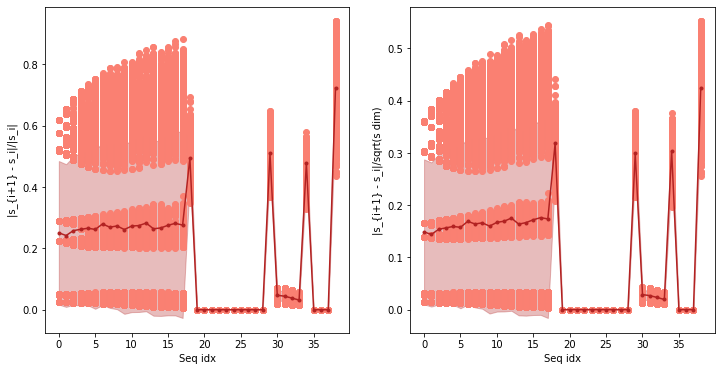

In [ ]:
delta_hs = np.zeros((hs.shape[0], hs.shape[1]-1, hs.shape[2]))

for batch_idx in range(hs.shape[0]):
    for seq_idx in range(hs.shape[1] - 1):
        delta_hs[batch_idx, seq_idx] = hs[batch_idx, seq_idx+1] - hs[batch_idx, seq_idx]

if net_params['netType'] in ('HebbNet', 'HebbNet_M'):
    As = np.copy(db['A'])
    delta_As = np.zeros((As.shape[0], As.shape[1]-1, As.shape[2], As.shape[3]))
    for batch_idx in range(hs.shape[0]):
        for seq_idx in range(hs.shape[1] - 1):
            delta_As[batch_idx, seq_idx] = As[batch_idx, seq_idx+1] - As[batch_idx, seq_idx] 

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

y_labels = ('|s_{i+1} - s_i|/|s_i|', '|s_{i+1} - s_i|/sqrt(s dim)')

for norm_idx, ax in zip((0,1), (ax1, ax2)):
    if norm_idx == 0:
        delta_hs_norm = np.linalg.norm(delta_hs, axis=-1) / np.linalg.norm(hs[:, :-1, :], axis=-1)
    elif norm_idx == 1:
        delta_hs_norm = np.linalg.norm(delta_hs, axis=-1) / np.sqrt(hs.shape[-1])

    mean_delta_hs = np.mean(delta_hs_norm, axis=0)
    std_delta_hs = np.std(delta_hs_norm, axis=0)

    seq_vals = np.arange(delta_hs.shape[1])

    ax.fill_between(seq_vals, mean_delta_hs-std_delta_hs,
                    mean_delta_hs+std_delta_hs, alpha=0.3,
                    color=c_vals[0])
    ax.plot(seq_vals, mean_delta_hs, marker='.',
            color=c_vals[0])
    for seq_idx in range(hs.shape[1] - 1):
        ax.scatter(seq_idx*np.ones_like(delta_hs_norm[:, seq_idx]),
                   delta_hs_norm[:, seq_idx], color=c_vals_l[0])
        
    if net_params['netType'] in ('HebbNet', 'HebbNet_M'):
        if norm_idx == 0:
            delta_As_norm = np.linalg.norm(delta_As, axis=(2,3)) / np.linalg.norm(As[:, :-1, :, :], axis=(2,3))
        elif norm_idx == 1:
            delta_As_norm = np.linalg.norm(delta_As, axis=(2,3)) / np.sqrt(As.shape[2]*As.shape[3])
            
        mean_delta_As = np.mean(delta_As_norm, axis=0)
        std_delta_As = np.std(delta_As_norm, axis=0)

        ax.fill_between(seq_vals, mean_delta_As-std_delta_As,
                        mean_delta_As+std_delta_As, alpha=0.3,
                        color=c_vals[1])
        ax.plot(seq_vals, mean_delta_As, marker='.',
                color=c_vals[1])
        for seq_idx in range(hs.shape[1] - 1):
            ax.scatter(seq_idx*np.ones_like(delta_As_norm[:, seq_idx]),
                    delta_As_norm[:, seq_idx], color=c_vals_l[1])
    
    ax.set_xlabel('Seq idx')
    ax.set_ylabel(y_labels[norm_idx])

#### **Deflections theory prediction**

Finds deflections: average changes of the state from the validation set

In [ ]:
run = False

def get_word_deflections(net, db, word_labels, toy_params, net_params, word_proj='<eos>', return_theory=False, verbose=True):
    """ 
    Gets deflections due to various words.
    """

    word_to_input_matrix = []
    for word in toy_params['word_to_input_vector']:
        word_to_input_matrix.append(toy_params['word_to_input_vector'][word])
    word_to_input_matrix = np.array(word_to_input_matrix)

    if net_params['netType'] in ('HebbNet', 'HebbNet_M'): # Change in A
        lam = net.lam.detach().cpu().numpy()

        # h_states = HebbNet_word_proj(word_proj, db['A'], net, toy_params)
        # Initial h
        # h0_state = HebbNet_word_proj(word_proj, np.zeros_like(db['A'][:, 0:1, :, :]), net, toy_params).numpy()
        hs = db['h'].numpy()

        As = db['A'].numpy()
        # Adds initial A0
        A0 = net.A0.cpu().numpy()
        A0_batch = np.repeat(A0[np.newaxis, np.newaxis, :, :], As.shape[0], axis=0)
        As = np.concatenate((A0_batch, As), axis=1)
        seq_steps = As.shape[1] - 1 # -1 for diffs

        As_theory = np.zeros((db['A'].shape[0], seq_steps, db['A'].shape[-2], db['A'].shape[-1]))
        delta_As = [[] for _ in range(word_to_input_matrix.shape[0])]
        delta_As_theory = [[] for _ in range(word_to_input_matrix.shape[0])]
        delta_As_theory_seq = [[] for _ in range(seq_steps)]
        delta_As_theory_dA = [[] for _ in range(word_to_input_matrix.shape[0])]

        # Some quantities used later for theoretical predictions
        word_proj_idx = toy_params['words'].index(word_proj)
        eta = net.eta.detach().cpu().numpy()[0, 0]
        lam = net.lam.detach().cpu().numpy() 
        W_inp = net.w1.detach().cpu().numpy()
        hidden_bias = net.b1.detach().cpu().numpy()
        W_inp_x = np.matmul(word_to_input_matrix, W_inp.T) # (n_words, n_hidden)
        f_W_inp_x = net.f(torch.tensor(W_inp_x) + hidden_bias).numpy() if net.f is not None else torch.tensor(W_inp_x) + hidden_bias # (n_words, n_hidden)
        eta_mult_term = (net.eta.detach().cpu().numpy()[0] * f_W_inp_x *
                        np.matmul(word_to_input_matrix*word_to_input_matrix[word_proj_idx][np.newaxis, :], 
                                  net.w1.detach().cpu().numpy().T)
        ) # (n_words, n_hidden)
        eta_mult_term_A = np.zeros((len(toy_params['words']), As.shape[-2], As.shape[-1]))
        for word_idx in range(len(toy_params['words'])):
            eta_mult_term_A[word_idx] = net.eta.detach().cpu().numpy()[0] * f_W_inp_x[word_idx, :, np.newaxis] * word_to_input_matrix[word_idx][np.newaxis, :]
    elif net_params['netType'] in ('VanillaRNN', 'GRU'): # Change in h
        hs = db['h'].numpy()
        # Adds h0 as initial state
        h0 = net.h0.cpu().numpy()
        h0_batch = np.repeat(h0[np.newaxis, np.newaxis, :], hs.shape[0], axis=0)
        hs = np.concatenate((h0_batch, hs), axis=1)

        seq_steps = hs.shape[1] - 1 # -1 for diffs
        
    # List for each possible word
    hs_theory = np.zeros((db['h'].shape[0], seq_steps, db['h'].shape[-1]))
    delta_hs = [[] for _ in range(word_to_input_matrix.shape[0])]
    delta_hs_theory = [[] for _ in range(word_to_input_matrix.shape[0])] # Difference between theoretical and actual predictions |h_theory - h_real| / |h_real|
    delta_hs_theory_seq = [[] for _ in range(seq_steps)] 
    delta_hs_update_only = [[] for _ in range(word_to_input_matrix.shape[0])] # Difference between only current update and actual predictions |h_theory - h_real| / |h_real|
    # delta_hs_theory_aligns = [[] for _ in range(word_to_input_matrix.shape[0])]


    for batch_idx in range(hs.shape[0]):
        for seq_idx in range(seq_steps):
            input_idx = word_labels[batch_idx, seq_idx] # input word index for the current batch/seq step
            if net_params['netType'] in ('HebbNet', 'HebbNet_M'):
                delta_As[input_idx].append(As[batch_idx, seq_idx+1] - As[batch_idx, seq_idx])
                if seq_idx > 0: # h0 doesn't exist in STPNs, so skip calculation for first seq_idx, offset by 1 to account for said diff
                    delta_hs[input_idx].append(hs[batch_idx, seq_idx] - hs[batch_idx, seq_idx-1])
                
                # Theoretical predictions (different for the different STPNs)
                if net_params['netType'] in ('HebbNet_M',):
                    ### Next h state based on theoretical prediction ###
                    # Leading order only
                    # h_state_theory = f_W_inp_x[input_idx] # Literally just the current input passed through the network
                    # Leading and next-to-leading:
                    hpre_state_theory = W_inp_x[input_idx] + hidden_bias
                    for seq_idx2 in range(seq_idx):
                        input_idx2 = word_labels[batch_idx, seq_idx2]
                        hpre_state_theory += lam**(seq_idx - seq_idx2 - 1) * (
                            np.matmul(
                                eta_mult_term_A[input_idx2]*W_inp, word_to_input_matrix[input_idx]
                            )
                        )
                    h_state_theory = net.f(torch.tensor(hpre_state_theory)).numpy() if net.f is not None else hpre_state_theory

                    delta_hs_diff = (
                        np.linalg.norm(h_state_theory - hs[batch_idx, seq_idx])/
                        np.linalg.norm(hs[batch_idx, seq_idx])
                    )

                    delta_hs_theory[input_idx].append(delta_hs_diff)
                    delta_hs_theory_seq[seq_idx].append(delta_hs_diff)
                    # delta_hs_theory_aligns[input_idx].append(
                    #     np.dot(
                    #         f_W_inp_x[input_idx], hs[batch_idx, seq_idx]
                    #     )/
                    #     (np.linalg.norm(f_W_inp_x[input_idx])*
                    #     np.linalg.norm(hs[batch_idx, seq_idx]))
                    # )

                        # # This is all for the EoS prediction
                        # h_state_theory = hs[batch_idx, seq_idx] + eta_mult_term[input_idx]
                        # delta_h_theory[input_idx].append(
                        #     np.linalg.norm(h_state_theory - hs[batch_idx, seq_idx+1])/
                        #     np.linalg.norm(hs[batch_idx, seq_idx+1])
                        # )
                        # delta_h_theory_aligns[input_idx].append(
                        #     np.dot(
                        #         eta_mult_term[input_idx], delta_hs[input_idx][-1]
                        #     )/
                        #     (np.linalg.norm(eta_mult_term[input_idx])*
                        #     np.linalg.norm(delta_hs[input_idx][-1]))
                        # )
                        
                        # # Next h if we only consider the update (ignore previous state)
                        # h_state_update_only = eta_mult_term[input_idx]
                        # delta_h_update_only[input_idx].append(
                        #     np.linalg.norm(h_state_update_only - h_states[batch_idx, seq_idx+1])/
                        #     np.linalg.norm(h_states[batch_idx, seq_idx+1])
                        # )

                    # # Next A state based on theoretical prediction
                    # eta_mult_term_A = net.eta.detach().cpu().numpy()[0] * f_W_inp_x[input_idx][:, np.newaxis] * word_to_input_matrix[input_idx][np.newaxis, :]
                    A_state_theory = lam*As[batch_idx, seq_idx] + eta_mult_term_A[input_idx]
                    delta_As_diff = (
                        np.linalg.norm(A_state_theory - As[batch_idx, seq_idx+1])/
                        np.linalg.norm(As[batch_idx, seq_idx+1])
                    )
                    delta_As_theory[input_idx].append(delta_As_diff)
                    delta_As_theory_seq[seq_idx].append(delta_As_diff)

                    # Difference between deltaAs
                    dA_theory = eta_mult_term_A[input_idx]
                    dA_true = As[batch_idx, seq_idx+1] - As[batch_idx, seq_idx]
                    delta_As_theory_dA[input_idx].append(
                        np.linalg.norm(dA_theory - dA_true)/
                        np.linalg.norm(dA_true)
                    )

                    if return_theory:
                        hs_theory[batch_idx, seq_idx] = h_state_theory
                        As_theory[batch_idx, seq_idx] = A_state_theory
                else:
                    print('Skipping calculation of theory for additive.')
            elif net_params['netType'] in ('VanillaRNN', 'GRU'):
                delta_hs[input_idx].append(hs[batch_idx, seq_idx+1] - hs[batch_idx, seq_idx])
                
    for word_idx, word in enumerate(toy_params['words']):
        delta_hs[word_idx] = np.array(delta_hs[word_idx])
        if verbose: print('  Word \'{}\' count: {}'.format(word, delta_hs[word_idx].shape[0]))
        if net_params['netType'] in ('HebbNet', 'HebbNet_M'):
            delta_As[word_idx] = np.array(delta_As[word_idx])
    
    if verbose:
        for word_idx, word in enumerate(toy_params['words']):
            if net_params['netType'] in ('HebbNet', 'HebbNet_M'):
                # print('  Word \'{}\' theory acc: h {:.3f} // update only: {:.3f} // A {:.3f}'.format(
                #     word, np.mean(delta_hs_theory[word_idx]), np.mean(delta_hs_update_only[word_idx]),
                #     np.mean(np.mean(delta_As_theory[word_idx]))))
                print('  Word \'{}\' theory acc: h {:.3f} // A {:.3f} // dA {:.3f}'.format(
                    word, np.mean(delta_hs_theory[word_idx]),
                    np.mean(delta_As_theory[word_idx]), 
                    np.mean(delta_As_theory_dA[word_idx])))
            else:
                print('  Word \'{}\' theory acc: h {:.3f}'.format(
                    word, np.mean(delta_hs_theory[word_idx])))

    if net_params['netType'] in ('HebbNet_M',):
        print('Outputing for HebbNet_M')
        if return_theory:
            return hs_theory, As_theory
        else:
            return delta_hs, delta_As, delta_hs_theory, delta_hs_theory_seq, delta_As_theory, delta_As_theory_seq
    elif net_params['netType'] in ('VanillaRNN', 'GRU'):
        print('Outputing for RNNs')
        return delta_hs
    elif net_params['netType'] in ('HebbNet',):
        print('Outputing for HebbNet')
        return delta_hs, delta_As
    else:
        raise ValueError('Net type not implemented yet!')

if run:
    if net_params['netType'] in ('HebbNet', 'HebbNet_M'):
        delta_hs, delta_As, delta_hs_theory, delta_hs_theory_seq, delta_As_theory, delta_As_theory_seq = get_word_deflections(net, db, word_labels, toy_params, net_params)
        # plot_PCA = h_word_PCA
    elif net_params['netType'] in ('VanillaRNN', 'GRU'):
        delta_hs = get_word_deflections(net, db, word_labels, toy_params, net_params,)
        plot_PCA = hidden_PCA

Trains networks to analyze

In [ ]:
n_trials = 10
acc_thresh = 0.98
# input_size = 10
hidden_size = 10

save = True
save_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/analytics_'
# save_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/analytics_nonoise_'

# for hidden_size in (10, 50, 100, 500):
for input_size in (50, 100, 500):
    for trial_idx in range(n_trials):
        # Note redefines toy_params internal to the loop so that a new random 
        # set of word vectors will be drawn for each trial
        ########## Toy data parameters ##########
        toy_params = {
            'data_type': 'int', # int, context
            
            'phrase_length': 20,
            'n_classes': 2,
            'input_type': 'binary',    # one hot, binary, binary1-1
            'input_size': input_size,          # defaults to length of words
            'include_eos': True,

            'stack_phrases': False,
            'n_stack': 1,
            'include_sos': False,
            'n_delay': 0, # Inserts delay words between at end of phrase (but before eos trigger)
            'delay_word': '<delay>', # '<delay>' or 'null'

            'uniform_score': True, # Uniform distribution over scores=
        }

        net_params = {
            'netType': 'HebbNet_M', # HebbNet, HebbNet_M, VanillaRNN, GRU, rHebbNet, rHebbNet_M, GHU, GHU_M
            'n_inputs': toy_params['input_size'],         # input dim
            'n_hidden': hidden_size,                      # hidden dim
            'n_outputs': toy_params['n_classes'],         # output dim
            # 'n_outputs': 10,                                # train with larger number of outputs for generalization tests    
            'f_act': 'tanh',         # 1st layer actiivation function # linear, sigmoid, tanh, relu
            'f0_act': 'linear',      # 2nd layer actiivation function
            'trainable_state0': False,
            
            # STPN Features
            'A_act': None,            # Activation on the A update (tanh or None)
            'lam_clamp': 0.95,          # Maximum lambda value
            'eta_type': 'scalar',       # scalar or vector
            'eta_force': None,        # ensure either Hebbian or anti-Hebbian plasticity
            'hebb_type': 'inputOutput',      # input, output, inputOutput

            # Train parameters
            'train_mode': 'seq_inf',   # 'seq' or 'seq_inf'
            'weight_reg': 'L1',
            'reg_lambda': 1e-4,
            'hidden_bias': False,
            'ro_bias': False,           # use readout bias or not
            'gradient_clip': 10,
            'freeze_inputs': False,      # freeze the input layer (and hidden bias)
            'sparsification': 0.0,      # Amount to sparsify network's weights (0.0 = no sparsification)
            'noise_type': 'input',      # None, 'input', 'hidden'
            'noise_scale': 0.1,         # Expected magnitude of noise vector
            'cuda': True,
            'validEarlyStop': False,     # Early stop when average validation loss saturates
            'accEarlyStop': acc_thresh,   
            'seed': 2005 + trial_idx,   # This seed is used to generate training/valid data too

            'train_set_size': 3200,
            'valid_set_size': 500,
            'batch_size': 64,
            'epochs': 1,
        }
        # Keep forgetting to turn this on for RNNs, so just automate it
        net_params['hidden_bias'] = False if net_params['netType'] in ('HebbNet', 'HebbNet_M') else True

        print('Trial: {}'.format(trial_idx))
        verbose = True if trial_idx == 0 else False

        net, toy_params, net_params = train_network(net_params, toy_params, save=save, 
                                                    save_root=save_root, verbose=verbose)

Trial: 0
Toy integration data...
Using CUDA...
Net parameters:
  Net Type: Multiplicative
  Structure: f: tanh // fOut: linear // (Nx, Nh, Ny) = (50, 10, 2)
  No hidden bias // No readout bias // Sparsification: 0.00 // Noise type: input (scl: 1.0e-01)
  A parameters:
    A update: Hebbian // A Act: linear // Eta: scalar // Lambda_max: 0.95
    A0: zeros


KeyboardInterrupt: ignored

Calculate theoretical predictions over all units.

In [ ]:
load_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/analytics_' # 0.1 input noise
# load_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/analytics_nonoise_' # no noise

# Hidden variance
STPN_hidden = ['HebbNet_M[10,{},2]_train=seq_inf_task=int_2class_20len'.format(n) for n in (10, 50, 100, 500,)]
# Input variance
STPN_input = ['HebbNet_M[{},10,2]_train=seq_inf_task=int_2class_20len'.format(d) for d in (10, 50, 100, 500,)]

n_trials = 10
init_seed = 2005
test_set_size = 1000

hidden_h_errors = []
hidden_A_errors = []
input_h_errors = []
input_A_errors = []

for hidden_idx in range(4):
    print('Hidden idx: {}'.format(hidden_idx))
    hidden_h_errors.append([])
    hidden_A_errors.append([])

    for trial_idx in range(n_trials):
        # STPN
        load_path = load_root + STPN_hidden[hidden_idx]
        net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
        
        testData, testOutputMask, _ = syn.generate_data(
            test_set_size, toy_params_load, net_params_load['n_outputs'],
            raw_data=False, device=torch.device('cpu'), verbose=False)
        db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)

        word_to_input_vector_mat = np.zeros((len(toy_params_load['words']), net_params_load['n_inputs'],))
        for word_idx, word in enumerate(toy_params_load['words']):
            word_to_input_vector_mat[word_idx] = toy_params_load['word_to_input_vector'][word]
        word_labels = np.argmax(np.matmul(testData.tensors[0].cpu().numpy(), word_to_input_vector_mat.T), axis=-1)

        _, _, _, delta_hs_theory_seq, _, delta_As_theory_seq = get_word_deflections(
            net_load, db_load, word_labels, toy_params_load, net_params_load, word_proj='<eos>', verbose=False
        )

        hidden_h_errors[-1].append(delta_hs_theory_seq)
        hidden_A_errors[-1].append(delta_As_theory_seq)

for input_idx in range(4):
    print('Input idx: {}'.format(input_idx))
    input_h_errors.append([])
    input_A_errors.append([])

    for trial_idx in range(n_trials):
        # STPN
        load_path = load_root + STPN_input[input_idx]
        net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
        
        testData, testOutputMask, _ = syn.generate_data(
            test_set_size, toy_params_load, net_params_load['n_outputs'],
            raw_data=False, device=torch.device('cpu'), verbose=False)
        db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)

        word_to_input_vector_mat = np.zeros((len(toy_params_load['words']), net_params_load['n_inputs'],))
        for word_idx, word in enumerate(toy_params_load['words']):
            word_to_input_vector_mat[word_idx] = toy_params_load['word_to_input_vector'][word]
        word_labels = np.argmax(np.matmul(testData.tensors[0].cpu().numpy(), word_to_input_vector_mat.T), axis=-1)

        _, _, _, delta_hs_theory_seq, _, delta_As_theory_seq = get_word_deflections(
            net_load, db_load, word_labels, toy_params_load, net_params_load, word_proj='<eos>', verbose=False
        )

        input_h_errors[-1].append(delta_hs_theory_seq)
        input_A_errors[-1].append(delta_As_theory_seq)

hidden_h_errors = np.array(hidden_h_errors)
hidden_A_errors = np.array(hidden_A_errors)
input_h_errors = np.array(input_h_errors)
input_A_errors = np.array(input_A_errors)
print('Done!')

Hidden idx: 0
Hidden idx: 1
Hidden idx: 2
Hidden idx: 3
Input idx: 0
Input idx: 1
Input idx: 2
Input idx: 3
Done!


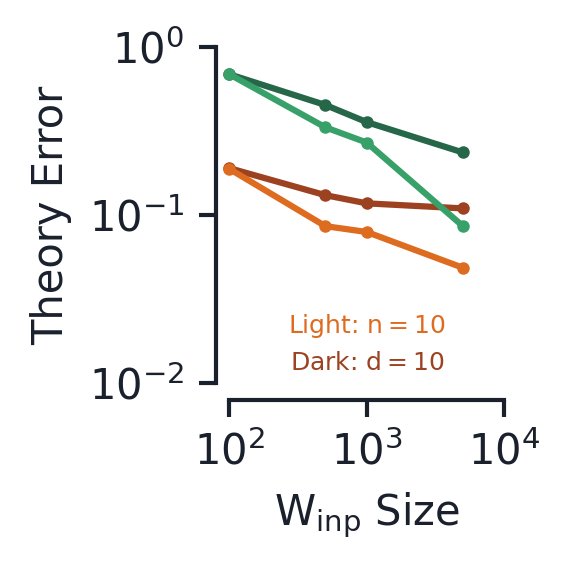

In [ ]:
import jetplot
fig, ax1 = plt.subplots(1, 1, figsize=(2, 2))

h_idx = 2
A_idx = 4

mean_hidden_h_error = np.mean(hidden_h_errors, axis=(1, 2, 3))
mean_hidden_A_error = np.mean(hidden_A_errors, axis=(1, 2, 3))
mean_input_h_error = np.mean(input_h_errors, axis=(1, 2, 3))
mean_input_A_error = np.mean(input_A_errors, axis=(1, 2, 3))

std_hidden_h_error = np.std(np.mean(hidden_h_errors, axis=(2, 3)), axis=-1)
std_hidden_A_error = np.std(np.mean(hidden_A_errors, axis=(2, 3)), axis=-1)
std_input_h_error = np.std(np.mean(input_h_errors, axis=(2, 3)), axis=-1)
std_input_A_error = np.std(np.mean(input_A_errors, axis=(2, 3)), axis=-1)

hidden_sizes = (10*10, 50*10, 100*10, 500*10) 
input_sizes = (10*10, 50*10, 100*10, 500*10)

ax1.plot(hidden_sizes, mean_hidden_h_error, color=c_vals_d[h_idx],
         linestyle='solid', label='hidden h (d=10)', marker='.')
# ax1.fill_between(hidden_sizes, mean_hidden_h_error-std_hidden_h_error,
#                  mean_hidden_h_error+std_hidden_h_error, color=c_vals[0],
#                  alpha=0.3, zorder=-1)
ax1.plot(hidden_sizes, mean_hidden_A_error, color=c_vals_d[A_idx],
         linestyle='solid', label='hidden A (d=10)', marker='.')
# ax1.fill_between(hidden_sizes, mean_hidden_A_error-std_hidden_A_error,
#                  mean_hidden_A_error+std_hidden_A_error, color=c_vals[0],
#                  alpha=0.3, zorder=-1)

ax1.plot(input_sizes, mean_input_h_error, color=c_vals[h_idx],
         linestyle='solid', label='input h (n=10)', marker='.')
# ax1.fill_between(input_sizes, mean_input_h_error-std_input_h_error,
#                  mean_input_h_error+std_input_h_error, color=c_vals[1],
#                  alpha=0.3, zorder=-1)
ax1.plot(input_sizes, mean_input_A_error, color=c_vals[A_idx],
         linestyle='solid', label='input A (n=10)', marker='.')
# ax1.fill_between(input_sizes, mean_input_A_error-std_input_A_error,
#                  mean_input_A_error+std_input_A_error, color=c_vals[1],
#                  alpha=0.3, zorder=-1))

ax1.set_xscale('log')
ax1.set_yscale('log')

ax1.set_xlim((100, 10000))
ax1.set_ylim((.05, 1))

ax1.set_xlabel('$W_{inp}$ Size')
ax1.set_ylabel('Theory Error')

ax1.set_xticks((100, 1000, 10000))
ax1.set_xticklabels(('$10^2$', '$10^3$', '$10^4$'))

# ax1.set_yticks((0.1, 1.0))
ax1.set_yticks((0.01, 0.1, 1))
ax1.set_yticklabels(('$10^{-2}$', '$10^{-1}$', '$10^0$'))

ax1.text(0.5, 0.2, 'Light: $n=10$', 
        horizontalalignment='center', verticalalignment='center', 
        color=c_vals[A_idx], fontsize=6, transform=ax1.transAxes)
ax1.text(0.5, 0.1, 'Dark: $d=10$', 
        horizontalalignment='center', verticalalignment='center', 
        color=c_vals_d[A_idx], fontsize=6, transform=ax1.transAxes)

plt.minorticks_off()

jetplot.breathe(ax=ax1)

Plots some example neurons and their corresponding theoretical predictions

In [ ]:
load_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/analytics_' # 0.1 input noise
# load_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/analytics_nonoise_' # no noise

trial_idx = 5
hidden_count = 10
input_count = 500 

# Input variance
STPN_input = ['HebbNet_M[{},{},2]_train=seq_inf_task=int_2class_20len'.format(input_count, hidden_count),]

init_seed = 2005
test_set_size = 1000

# STPN
load_path = load_root + STPN_input[0]
net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)

testData, testOutputMask, _ = syn.generate_data(
    test_set_size, toy_params_load, net_params_load['n_outputs'],
    raw_data=False, device=torch.device('cpu'), verbose=False)
db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)

word_to_input_vector_mat = np.zeros((len(toy_params_load['words']), net_params_load['n_inputs'],))
for word_idx, word in enumerate(toy_params_load['words']):
    word_to_input_vector_mat[word_idx] = toy_params_load['word_to_input_vector'][word]
word_labels = np.argmax(np.matmul(testData.tensors[0].cpu().numpy(), word_to_input_vector_mat.T), axis=-1)

hs_theory, As_theory = get_word_deflections(
    net_load, db_load, word_labels, toy_params_load, net_params_load, word_proj='<eos>', verbose=False,
    return_theory=True,
)

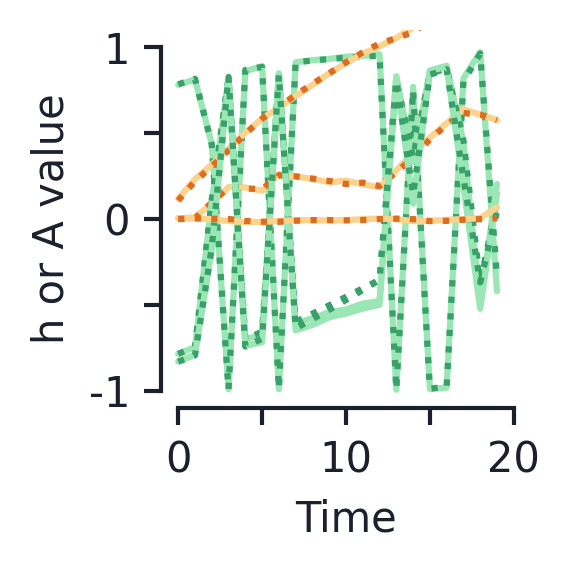

In [ ]:
# Finds the elements with the largest variance and plots their theoretical predictions

fig, ax1 = plt.subplots(1, 1, figsize=(2, 2))

batch_idx = 15
n_count = 3

hs_load = db_load['h'].numpy()
As_load = db_load['A'].numpy()

h_idx = 2
A_idx = 4

rand_offset = (22, 31, 77)

hs_var = np.var(hs_load[batch_idx], axis=0)
As_var = np.var(As_load[batch_idx], axis=0).flatten()

for count_idx in range(n_count):

    h_max_idx = np.argmax(hs_var)
    A_max_idx = np.argmax(As_var)
    A_max_idx = A_max_idx + rand_offset[count_idx]

    ax1.plot(hs_load[batch_idx, :, h_max_idx], color=c_vals_l[h_idx])
    ax1.plot(hs_theory[batch_idx, :, h_max_idx], color=c_vals[h_idx], linestyle='dotted')

    ax1.plot(As_load[batch_idx].reshape((As_load.shape[1], -1))[:, A_max_idx], color=c_vals_l[A_idx])
    ax1.plot(As_theory[batch_idx].reshape((As_theory.shape[1], -1))[:, A_max_idx], color=c_vals[A_idx], linestyle='dotted')

    ax1.set_xlabel('Seq. Idx')
    ax1.set_ylabel('A and h values')

    hs_var[h_max_idx] = 0.0
    As_var[A_max_idx] = 0.0

ax1.set_xlim((0, 20))
ax1.set_xticks((0, 5, 10, 15, 20))
ax1.set_xticklabels((0, None, 10, None, 20))
ax1.set_xlabel('Time')

ax1.set_ylim((-1, 1))
ax1.set_yticks((-1, -0.5, 0, 0.5, 1))
ax1.set_yticklabels((-1, None, 0, None, 1))
ax1.set_ylabel('h or A value')

jetplot.breathe(ax=ax1)

Old code:

A1 diff: 1.260269691607616e-07
A2 diff: 9.859729865279163e-08
  A2 diff 1 only: 0.013666308407770032
h2 diff: 8.201120124841766e-08
  h2_pre_1 mag: 5.035738025842457
  h2_pre_2 mag: 0.1442416047627954
  w1: 2 w2: 1
  h2 diff 1 only: 0.015928072256929344


Text(0, 0.5, 'Error')

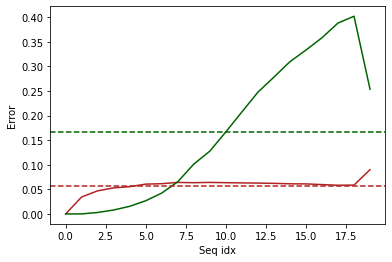

In [ ]:
As = db['A'].numpy()
hs = db['h'].numpy()
Wxbs = db['Wxb'].numpy()
batch_idx = 30

word_to_input_matrix = []
for word in toy_params['word_to_input_vector']:
    word_to_input_matrix.append(toy_params['word_to_input_vector'][word])
word_to_input_matrix = np.array(word_to_input_matrix)

eta = net.eta.detach().cpu().numpy()[0,0] 
lam = net.lam.detach().cpu().numpy() 
W_inp = net.w1.detach().cpu().numpy()
hidden_bias = net.b1.detach().cpu().numpy()

w1 = word_to_input_matrix[word_labels[batch_idx, 0]]
# w1 = word_to_input_matrix[4]
A1_approx = eta*np.tanh(np.matmul(W_inp, w1) + hidden_bias)[:, np.newaxis] * w1[np.newaxis, :]
A1_true = As[batch_idx, 0, :, :]
print('A1 diff:', np.linalg.norm(A1_approx - A1_true)/np.linalg.norm(A1_true))

w2 = word_to_input_matrix[word_labels[batch_idx, 1]]
h2_pre_1 = np.matmul(W_inp, w2) + hidden_bias
h2_pre_2 = eta*np.tanh(np.matmul(W_inp, w1) + hidden_bias) * np.matmul(W_inp, w1*w2)
h2 = np.tanh(h2_pre_1 + h2_pre_2)
h2_true = hs[batch_idx, 1, :]
A2_approx = lam*A1_true + eta*h2[:, np.newaxis] * w2[np.newaxis, :]
A2_true = As[batch_idx, 1, :, :]

A2_approx_1 = lam*A1_true + eta*np.tanh(h2_pre_1)[:, np.newaxis] * w2[np.newaxis, :]
print('A2 diff:', np.linalg.norm(A2_approx - A2_true)/np.linalg.norm(A2_true))
print('  A2 diff 1 only:', np.linalg.norm(A2_approx_1 - A2_true)/np.linalg.norm(A2_true))

print('h2 diff:', np.linalg.norm(h2 - h2_true)/np.linalg.norm(h2_true))
print('  h2_pre_1 mag:', np.linalg.norm(h2_pre_1))
print('  h2_pre_2 mag:', np.linalg.norm(h2_pre_2))
print('  w1: {} w2: {}'.format(word_labels[batch_idx, 0], word_labels[batch_idx, 1]))
print('  h2 diff 1 only:', np.linalg.norm(np.tanh(h2_pre_1) - h2_true)/np.linalg.norm(h2_true))

fig, ax1 = plt.subplots(1, 1, figsize=(6,4))

delta_As_theory_seq = np.array(delta_As_theory_seq)
delta_hs_theory_seq = np.array(delta_hs_theory_seq)
ax1.plot(np.mean(delta_As_theory_seq, axis=-1), color=c_vals[0])
ax1.plot(np.mean(delta_hs_theory_seq, axis=-1), color=c_vals[1])

ax1.axhline(np.mean(delta_As_theory_seq), color=c_vals[0], linestyle='dashed')
ax1.axhline(np.mean(delta_hs_theory_seq), color=c_vals[1], linestyle='dashed')

ax1.set_xlabel('Seq idx')
ax1.set_ylabel('Error')

ValueError: ignored

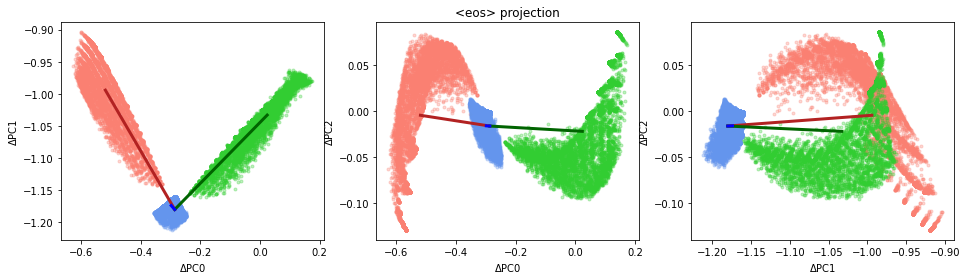

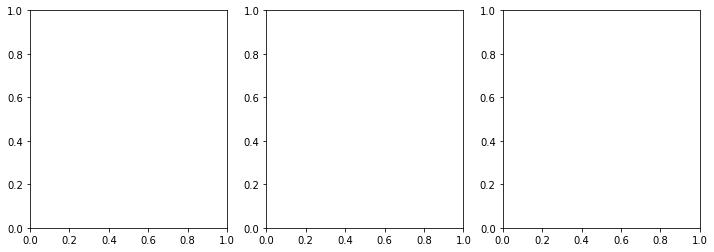

In [ ]:
delta_hs_pca = []

for word_idx, word in enumerate(toy_params['word_to_input_vector'].keys()):
    if delta_hs[word_idx].shape[0] > 0:
        delta_hs_pca.append(plot_PCA.transform(delta_hs[word_idx]))
        # delta_hs_pca.append(np.matmul(delta_hs[word_idx], plot_PCA.components_.T))

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4))

pcxs = (0, 0, 1)
pcys = (1, 2, 2)

ax_lim = None

ro_matrix_def_pca = plot_PCA.transform(ro_matrix)
zero_matrix_def_pca = plot_PCA.transform(np.zeros_like(ro_matrix))

for ax, pcx, pcy in zip((ax1, ax2, ax3), pcxs, pcys):

    for word_idx, word in enumerate(toy_params['word_to_input_vector'].keys()):
        if delta_hs[word_idx].shape[0] > 0: # Must have a nonzero number of occurences
            ax.plot(delta_hs_pca[word_idx][:, pcx], delta_hs_pca[word_idx][:, pcy], linewidth=0.0,
            marker='.', color=c_vals_l[word_idx], alpha=0.3)
            mean_delta_hs_pca = np.mean(delta_hs_pca[word_idx], axis=0)
            ax.plot((zero_matrix_def_pca[0, pcx], mean_delta_hs_pca[pcx]), 
                    (zero_matrix_def_pca[0, pcy], mean_delta_hs_pca[pcy]), linewidth=3.0,
                    color=c_vals[word_idx], zorder=10)

    # for ro_idx in range(net_params['n_outputs']):
    #     ax.plot([zero_matrix_def_pca[ro_idx, pcx], ro_matrix_def_pca[ro_idx, pcx]], 
    #             [zero_matrix_def_pca[ro_idx, pcy], ro_matrix_def_pca[ro_idx, pcy]],
    #             color=c_vals[ro_idx], linewidth=3.0)

    ax.set_xlabel('$\Delta$PC{}'.format(pcx))
    ax.set_ylabel('$\Delta$PC{}'.format(pcy))

    if ax_lim is not None:
        ax.set_xlim((-ax_lim, ax_lim,))
        ax.set_ylim((-ax_lim, ax_lim,))

if net_params['netType'] in ('HebbNet', 'HebbNet_M'):
    ax2.set_title('{} projection'.format(word_proj))

    fig2, (ax4, ax5, ax6) = plt.subplots(1, 3, figsize=(12,4))

    mean_delta_hs = []
    for word_idx, word in enumerate(toy_params['word_to_input_vector'].keys()):
        if delta_hs[word_idx].shape[0] > 0: # Must have a nonzero number of occurences
            mean_delta_hs.append(np.mean(delta_hs[word_idx], axis=0))

    mean_delta_hs = np.array(mean_delta_hs)
    eta_Winp_xs = net.eta.detach().cpu().numpy() * np.matmul(toy_params['word_to_input_vector'], net.w1.detach().cpu().numpy().T)
    
    # Term for multiplicative network 
    word_proj_idx = toy_params['words'].index(word_proj)
    W_inp = np.matmul(toy_params['word_to_input_vector'], net.w1.detach().numpy().T)
    f_W_inp = net.f(torch.tensor(W_inp)).numpy() if net.f is not None else W_inp
    eta_mult_term = (net.eta.detach().numpy() * f_W_inp *
                    np.matmul(toy_params['word_to_input_vector']*toy_params['word_to_input_vector'][word_proj_idx][np.newaxis, :], net.w1.detach().numpy().T)
    ) 
    # print(eta_mult_term.shape)
    # print(word_proj_idx)
    # print(toy_params['word_to_input_vector'].shape)
    # print(toy_params['word_to_input_vector'][word_proj_idx][np.newaxis, :].shape)
    # print((toy_params['word_to_input_vector']*toy_params['word_to_input_vector'][word_proj_idx][np.newaxis, :]).shape)

    # ROs and Delta hs
    ro_delta_hs_dot = np.matmul(ro_matrix, mean_delta_hs.T)
    # ROs and Delta hs
    add_term_delta_hs_dot = np.matmul(eta_Winp_xs, mean_delta_hs.T)
    mult_term_delta_hs_dot = np.matmul(eta_mult_term, mean_delta_hs.T)

    norm_matrix = np.outer(
        np.linalg.norm(ro_matrix, axis=-1),
        np.linalg.norm(mean_delta_hs, axis=-1)
    )
    ro_delta_hs_aligns = ro_delta_hs_dot/norm_matrix

    norm_matrix = np.outer(
        np.linalg.norm(eta_Winp_xs, axis=-1),
        np.linalg.norm(mean_delta_hs, axis=-1)
    )
    add_term_delta_hs_aligns = add_term_delta_hs_dot/norm_matrix

    norm_matrix = np.outer(
        np.linalg.norm(eta_mult_term, axis=-1),
        np.linalg.norm(mean_delta_hs, axis=-1)
    )
    mult_term_delta_hs_aligns = mult_term_delta_hs_dot/norm_matrix

    ax4.matshow(ro_delta_hs_aligns, cmap='Reds')
    for (i, j), z in np.ndenumerate(ro_delta_hs_aligns):
        ax4.text(j, i, '{:0.2f}'.format(z), ha='center', va='center')

    ax5.matshow(add_term_delta_hs_aligns, cmap='Reds')
    for (i, j), z in np.ndenumerate(inp_delta_hs_aligns):
        ax5.text(j, i, '{:0.2f}'.format(z), ha='center', va='center')

    ax6.matshow(mult_term_delta_hs_aligns, cmap='Reds')
    for (i, j), z in np.ndenumerate(mult_term_delta_hs_aligns):
        ax6.text(j, i, '{:0.2f}'.format(z), ha='center', va='center')

    ax4.set_xlabel('delta h idx')
    ax4.set_ylabel('RO idx')
    # ax4.set_xticks(rotation=90)
    ax4.set_xticklabels(['',] + toy_params['words'][:-1], rotation=90)
    ax4.set_yticklabels(['',] + toy_params['classes'])

    ax5.set_xlabel('delta h idx')
    ax5.set_ylabel('eta*Winpx idx')
    ax5.set_xticklabels(['',] + toy_params['words'][:-1], rotation=90)
    ax5.set_yticklabels(['',] + toy_params['words'])

    ax6.set_xlabel('delta h idx')
    ax6.set_ylabel('eta*Winpx*Winp(x+x_proj) idx')
    ax6.set_xticklabels(['',] + toy_params['words'][:-1], rotation=90)
    ax6.set_yticklabels(['',] + toy_params['words'])

elif net_params['netType'] in ('VanillaRNN', 'GRU'):
    ax2.set_title('hidden state projection')


(5, 50)
[[0.20851441 0.13650473 0.16357216 0.13459548 0.12842022]
 [0.13650473 0.21821789 0.14193844 0.13363062 0.12156613]
 [0.16357216 0.14193844 0.19611614 0.14978617 0.13130643]
 [0.13459548 0.13363062 0.14978617 0.20412415 0.14182716]
 [0.12842022 0.12156613 0.13130643 0.14182716 0.18569534]]
[[2.79074096 1.45967928 1.66852706 1.33608505 1.80841208]
 [1.45967928 2.72776375 1.50433325 1.28557645 1.65107479]
 [1.66852706 1.50433325 2.1703832  1.58022188 1.95480026]
 [1.33608505 1.28557645 1.58022188 1.92219796 0.64455943]
 [1.80841208 1.65107479 1.95480026 0.64455943 0.97945981]]


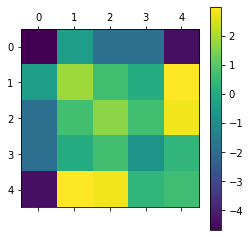

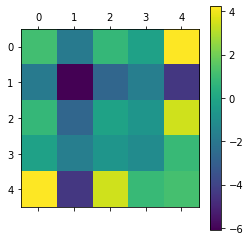

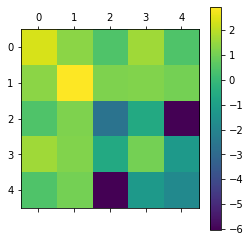

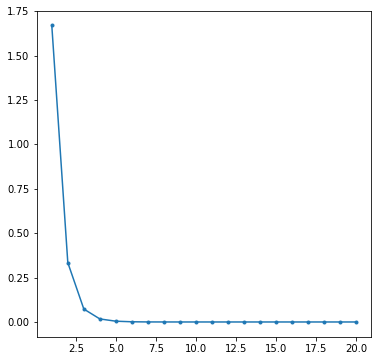

In [ ]:
print(toy_params['word_to_input_vector'].shape)

n_words = toy_params['word_to_input_vector'].shape[0]

word_prods = np.zeros((n_words, n_words,
                       net_params['n_inputs']))
winp_word_prods = np.zeros((n_words, n_words,
                            net_params['n_hidden']))


for word_idx1 in range(n_words):
    for word_idx2 in range(n_words):
        word_prods[word_idx1, word_idx2] = (
            toy_params['word_to_input_vector'][word_idx1] *
            toy_params['word_to_input_vector'][word_idx2]
        )
        winp_word_prods[word_idx1, word_idx2] = np.matmul(
            net.w1.detach().numpy(), word_prods[word_idx1, word_idx2]
        )

print(np.linalg.norm(word_prods, axis=-1))
print(np.linalg.norm(winp_word_prods, axis=-1))

trials = 100
lens = np.arange(1, 21)
mag_vals = np.zeros((len(lens)))
for len_idx, length in enumerate(lens):
    mags = []
    for _ in range(trials):
        vec = np.ones((net_params['n_hidden'],))
        for seq_idx in range(length):
            idx1 = np.random.randint(5)
            idx2 = np.random.randint(5)
            vec = vec * winp_word_prods[idx1, idx2]
        mags.append(np.linalg.norm(vec))
    
    mag_vals[len_idx] = np.mean(mags)

ro_winp_word_prods = np.matmul(winp_word_prods, ro_matrix.T)
plt.matshow(ro_winp_word_prods[:, :, 0])
plt.colorbar()
plt.matshow(ro_winp_word_prods[:, :, 1])
plt.colorbar()
plt.matshow(ro_winp_word_prods[:, :, 2])
plt.colorbar()

fig, ax = plt.subplots(1, 1, figsize=(6,6))
ax.plot(lens, mag_vals, marker='.')

# winp_word_prods = winp_word_prods.reshape((-1, net_params['n_hidden']))
# winp_winp = = np.zeros((n_words**2, n_words**2,
#                         net_params['n_hidden']))


Checks alignments of W_inp x with the respective readouts

torch.Size([8, 100])
(3, 100)


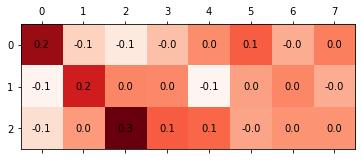

In [ ]:
# Take only the first in each sequence of special
winp = net.Wx if net_params['netType'] else net.w1

WinpXs = np.matmul(specialData.tensors[0][:, 0, :], winp.detach().numpy().T)
print(WinpXs.shape)
print(ro_matrix.shape)
ro_wx_dots = np.matmul(ro_matrix, WinpXs.T)

norm_matrix = np.outer(
    np.linalg.norm(ro_matrix, axis=-1),
    np.linalg.norm(WinpXs, axis=-1)
)
ro_wx_aligns = ro_wx_dots/norm_matrix

fig, ax1 = plt.subplots(1, 1, figsize=(6,6))

ax1.matshow(ro_wx_aligns, cmap='Reds')

for (i, j), z in np.ndenumerate(ro_wx_aligns):
    ax1.text(j, i, '{:0.1f}'.format(z), ha='center', va='center')

#### **Fixed Points**

Finds fixed points from hidden state seeds

In [ ]:
def get_word_tensor(word, n_batches, phrase_len, toy_params, device):
    if word == 'random':
        NOISE_SCALE = 0.1
        x_star_seq = np.random.randint(0, 2, size=(
            n_batches, phrase_len, net_params['n_inputs']))
        x_star_seq = NOISE_SCALE * x_star_seq / np.linalg.norm(x_star_seq, axis=-1, keepdims=True)
    else:
        if word == 'avg':
            word_count = 0
            word_tensor = np.zeros(net_params['n_inputs'])
            for word in toy_params['word_to_input_vector']:
                if word in ('<eos>', '<sos>', '<delay>'):
                    continue
                word_tensor += toy_params['word_to_input_vector'][word]
                word_count += 1
            word_tensor = word_tensor / word_count
        elif word == 'all_zeros':
            word_tensor = np.zeros((net_params['n_inputs'],))
        elif word == 'all_ones':
            word_tensor = np.ones((net_params['n_inputs'],))
            word_tensor = np.sqrt(2) * word_tensor/np.linalg.norm(word_tensor)
        elif word == 'random': # New random input tensor
            word_tensor = syn.generateInputVectors(toy_params)[0]
        else:
            word_tensor = toy_params['word_to_input_vector'][word]

        x_star_seq =  np.repeat(np.repeat(word_tensor[np.newaxis, np.newaxis, :], n_batches, axis=0),
                            phrase_len, axis=1)
    
    return torch.tensor(x_star_seq, dtype=torch.float, device=device)

FP Network - NetType: HebbNet, Points size: torch.Size([1000, 100, 50])
Init speeds - Max: 4.20e+01 /Min: 6.34e+00
  Step 0 - Loss: 1.118e-02
  Step 100 - Loss: 1.026e-03
  Step 200 - Loss: 5.234e-04
  Step 300 - Loss: 3.746e-04
  Step 400 - Loss: 3.128e-04
  Step 500 - Loss: 2.776e-04
  Step 600 - Loss: 2.543e-04
  Step 700 - Loss: 2.376e-04
  Step 800 - Loss: 2.246e-04
  Step 900 - Loss: 2.140e-04
Final speeds - Max: 6.66e-01 /Min: 2.75e-02


Text(0, 0.5, 'FP loss')

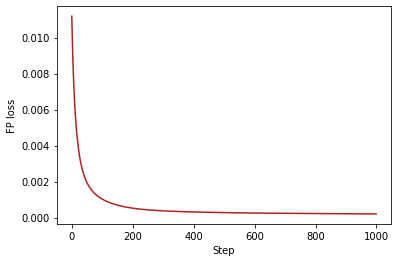

In [ ]:
# Gets hs to use as seeds for hidden states
# db = dbs[6] # Seeds with longer phrases
n_batches = 50
db = net.evaluate_debug(testData[0:n_batches,:,:], batchMask=testOutputMask[:n_batches])

if net_params['netType'] in ('VanillaRNN', 'GRU'):
    states = db['h'].numpy()
    states_flat = np.reshape(states, (-1, states.shape[-1]))
    lr = 1e-2
elif net_params['netType'] in ('HebbNet', 'HebbNet_M',):
    states = db['A'].numpy()[:50, :, :, :] # Only the first 50 batche because this is large
    states_flat = np.reshape(states, (-1, states.shape[-2], states.shape[-1]))
    lr = 1e-1 # Since there are a lot more parameters these seem to need higher learning rates

word = 'evid1' # 'avg', 'null', 'all_zeros', 'random', '<eos>'
x_star_seq = get_word_tensor(word, states_flat.shape[0], 1, toy_params, device=device)

fp_net = analysis.fixedPointNetwork(net, states_flat)
fp_net.to(device)
fps, loss_hist, fp_speeds = fp_net.find_fixed_points(x_star_seq[:, 0, :], steps=1000, printPeriod=100, learningRate=lr)
fps = fps.cpu().numpy()

fig, ax1 = plt.subplots(1, 1, figsize=(6,4))

ax1.plot(loss_hist, color=c_vals[0])
ax1.set_xlabel('Step')
ax1.set_ylabel('FP loss')

In [ ]:
from torch.utils.data import TensorDataset

# Gets hs to use as seeds for hidden states
flow_steps = 200
db = net.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)

if net_params['netType'] in ('VanillaRNN', 'GRU'):
    n_batches = db['h'].shape[0]
    states = db['h'][:n_batches, 1:] 
    states_flat = np.reshape(states, (-1, states.shape[-1]))
    net.h = torch.tensor(states_flat, device=device)

elif net_params['netType'] in ('HebbNet', 'HebbNet_M',):
    n_batches = 50 # Only the first 50 batche because this is large
    states = db['A'][:n_batches, 1:]  
    states_flat = np.reshape(states, (-1, states.shape[-2], states.shape[-1]))
    net.A = torch.tensor(states_flat, device=device)

labels_flow = testData.tensors[1][:n_batches, 1:].cpu().numpy()
labels_flat = np.reshape(labels_flow, (-1, 1))
labels_seq = np.repeat(labels_flat[:, np.newaxis, :], flow_steps, axis=1)
labels_seq = torch.tensor(labels_seq, dtype=torch.long, device=device)

word = 'null' # 'avg', 'null', 'all_zeros', 'all_ones', 'random', '<eos>'
x_star_seq = get_word_tensor(word, states_flat.shape[0], flow_steps, toy_params, device=device)

# Note this sets reset to false so it flows from given states
db_flow = net.evaluate_debug(TensorDataset(x_star_seq, labels_seq)[:,:,:], batchMask=None, acc=False, reset=False)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  # This is added back by InteractiveShellApp.init_path()


hs flow shape: (19000, 200, 100)


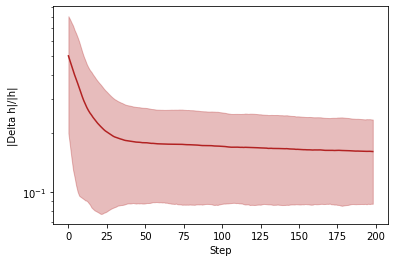

In [ ]:
hs_flow = db_flow['h'].numpy()
print('hs flow shape:', hs_flow.shape)

hs_diff = hs_flow[:, 1:, :] - hs_flow[:, :-1, :] 

delta_h_mags = (np.linalg.norm(hs_diff, axis=-1) /
                np.linalg.norm(hs_flow[:, :-1, :], axis=-1))

delta_h_mean = np.mean(delta_h_mags, axis=0)
delta_h_std = np.std(delta_h_mags, axis=0)

fig, ax1 = plt.subplots(1, 1, figsize=(6, 4))

ax1.plot(np.arange(flow_steps-1), delta_h_mean, color=c_vals[0])
ax1.fill_between(np.arange(flow_steps-1), delta_h_mean-delta_h_std, 
                 delta_h_mean+delta_h_std, alpha=0.3, color=c_vals[0])
ax1.set_xlabel('Step')
ax1.set_yscale('log')
ax1.set_ylabel('|Delta h|/|h|')

# These aren't actually fixed points but this is a nice hack for plotting. 
if net_params['netType'] in ('VanillaRNN', 'GRU'):
    fps = hs_flow[:, -1, :]
    fp_speeds = delta_h_mags[:, -1]
elif net_params['netType'] in ('HebbNet', 'HebbNet_M',):
    As_flow = db_flow['A'].numpy()
    fps = As_flow[:, -1, :, :]
    fp_speeds = (np.linalg.norm(As_flow[:, -1] - As_flow[:, -2], axis=(1, 2))/
                 np.linalg.norm(As_flow[:, -2], axis=(1, 2)))

Plots raw state fixed points (hidden state space for RNNs, A state space for HNNs)

Max speed: 6.66e-01, Min speed: 2.75e-02


[Text(1, 0, '2.7e-02'), Text(1, 0, '6.7e-01')]

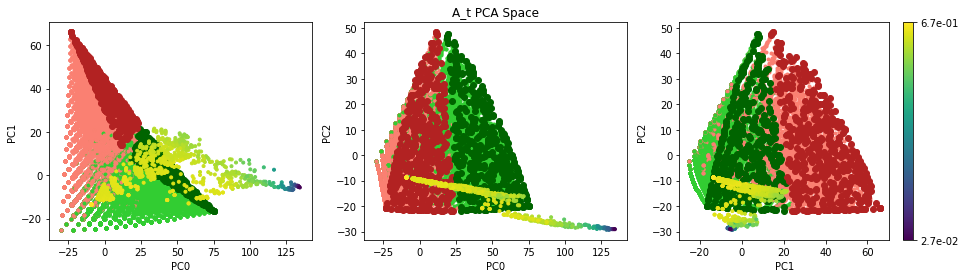

In [ ]:
# Converts fixed point speeds into colors
max_speed = np.max(fp_speeds)
min_speed = np.min(fp_speeds) #10**(-5)

print('Max speed: {:.2e}, Min speed: {:.2e}'.format(np.max(fp_speeds), np.min(fp_speeds)))

cmap = plt.cm.get_cmap('viridis')

fp_speeds_norm = np.zeros(fps.shape[0])
fp_colors = []
for fp_idx in range(fps.shape[0]):
    if fp_speeds[fp_idx] < min_speed:
        fp_speeds_norm[fp_idx] = 0
    else:
        fp_speeds_norm[fp_idx] = (
            (np.log10(fp_speeds[fp_idx]) - np.log10(min_speed))/
            (np.log10(max_speed) - np.log10(min_speed))
        )

    fp_colors.append(cmap(fp_speeds_norm[fp_idx]))

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4))

if net_params['netType'] in ('VanillaRNN', 'GRU'):
    ax2.set_title('h_t PCA Space')
    fps_pca = hidden_PCA.transform(fps)
elif net_params['netType'] in ('HebbNet', 'HebbNet_M',):
    ax2.set_title('A_t PCA Space')
    fps_pca = a_PCA.transform(np.reshape(fps, (fps.shape[0], -1)))

pcxs = (0, 0, 1)
pcys = (1, 2, 2)
# pcxs = (3, 3, 4)
# pcys = (4, 5, 5)


for ax, pcx, pcy in zip((ax1, ax2, ax3), pcxs, pcys):  
    c_plt = ax.scatter(fps_pca[:, pcx], fps_pca[:, pcy],
                       marker='.', color=fp_colors, zorder=10)

    # for batch_idx in range(hs_spec.shape[0]):
    # for batch_idx in range(len(toy_params['words'])-1):
    #     ax.plot(hs_spec_pca[batch_idx, :, pcx], hs_spec_pca[batch_idx, :, pcy], 
    #             color=c_vals[batch_idx], marker='.')

    # for ro_idx in range(net_params['n_outputs']):
    #     ax1.plot([0, ro_matrix_pca[ro_idx, pcx]], [0, ro_matrix_pca[ro_idx, pcy]],
    #              color=c_vals[ro_idx], linewidth=3.0)

    # Plots raw states for comparison
    if net_params['netType'] in ('VanillaRNN', 'GRU'):
        for batch_idx in range(hs.shape[0]): 
            ax.plot(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], linewidth=0.0,
                    marker='.', color=c_vals_l[labels[batch_idx]], zorder=0, alpha=0.3)
            ax.plot(hs_pca[batch_idx, -1, pcx], hs_pca[batch_idx, -1, pcy], marker='o',
                    color=c_vals[labels[batch_idx]], zorder=5)
    elif net_params['netType'] in ('HebbNet', 'HebbNet_M',):
        for batch_idx in range(hs.shape[0]):
            ax.plot(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy], linewidth=0.0,
                    marker='.', color=c_vals_l[labels[batch_idx]], zorder=0)
            ax.plot(As_pca[batch_idx, -1, pcx], As_pca[batch_idx, -1, pcy], marker='o',
                    color=c_vals[labels[batch_idx]], zorder=5)
        
    ax.set_xlabel('PC{}'.format(pcx))
    ax.set_ylabel('PC{}'.format(pcy))

cbar = fig.colorbar(c_plt, ax=ax3, ticks=[0, 1])
cbar.ax.set_yticklabels(['{:.1e}'.format(min_speed), '{:.1e}'.format(max_speed)])

Hidden state word projection of fixed point A's

[Text(1, 0, '7.2e-04'), Text(1, 0, '1.2e-02')]

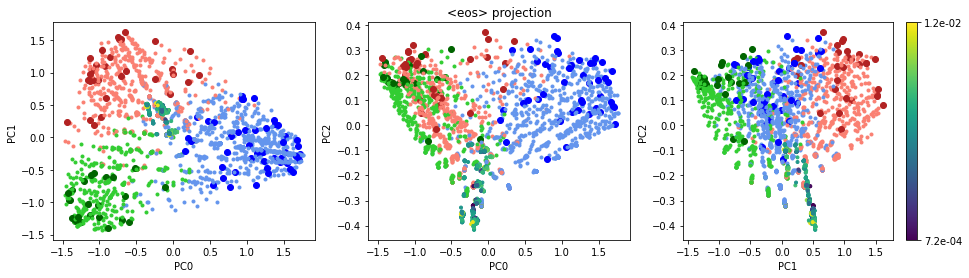

In [ ]:
word_proj = '<eos>' 
# word_proj = 'evid0' 

h_fp_word = HebbNet_word_proj(word_proj, fps, net, toy_params)
h_fp_word_pca = h_word_PCA.transform(h_fp_word)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4))

pcxs = (0, 0, 1)
pcys = (1, 2, 2)

ax_lim = None

for ax, pcx, pcy in zip((ax1, ax2, ax3), pcxs, pcys):

    ax.scatter(h_fp_word_pca[:, pcx], h_fp_word_pca[:, pcy],
               marker='.', color=fp_colors, zorder=5)

    for batch_idx in range(hs.shape[0]):
        ax.plot(h_word_pca[batch_idx, :, pcx], h_word_pca[batch_idx, :, pcy], linewidth=0.0,
                marker='.', color=c_vals_l[labels[batch_idx]])
        ax.plot(h_word_pca[batch_idx, -1, pcx], h_word_pca[batch_idx, -1, pcy], marker='o',
                color=c_vals[labels[batch_idx]])
        
    # for batch_idx in range(hs_spec.shape[0]):
    #     ax.plot(h_spec_word_pca[batch_idx, :, pcx], h_spec_word_pca[batch_idx, :, pcy], 
    #             color=c_vals[batch_idx], marker='.')

    # for ro_idx in range(net_params['n_outputs']):
    #     ax.plot([0, ro_matrix_word_pca[ro_idx, pcx]], [0, ro_matrix_word_pca[ro_idx, pcy]],
    #             color=c_vals[ro_idx], linewidth=3.0)

    ax.set_xlabel('PC{}'.format(pcx))
    ax.set_ylabel('PC{}'.format(pcy))

    if ax_lim is not None:
        ax.set_xlim((-ax_lim, ax_lim,))
        ax.set_ylim((-ax_lim, ax_lim,))

ax2.set_title('{} projection'.format(word_proj))

cbar = fig.colorbar(c_plt, ax=ax3, ticks=[0, 1])
cbar.ax.set_yticklabels(['{:.1e}'.format(min_speed), '{:.1e}'.format(max_speed)])

#### **Flow Longer Phrases**

Trains several STPNs at different lambda clamps

In [ ]:
n_trials = 10
acc_thresh = 0.98
# input_size = 10

save = True
# save_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/lambdas_'
# save_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/lambdasMinIt_'
save_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/lambdasMinIt_1factorsmall_'
# save_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/lambdasMinIt_relu_'


# lam_vals = (0.8, 0.9, 0.95, 1.0,)
# lam_vals = ('vanilla',)
# lam_vals = ('gru',)
lam_vals = (0.95,)

for lam_clamp in lam_vals:
    save_root = save_root_start+str(lam_clamp).replace('.', '')+'_'
    for trial_idx in range(n_trials):
        # Note redefines toy_params internal to the loop so that a new random 
        # set of word vectors will be drawn for each trial
        ########## Toy data parameters ##########
        toy_params = {
            'data_type': 'int', # int, context
            
            'phrase_length': 20,
            'n_classes': 2,
            'input_type': 'binary',    # one hot, binary, binary1-1
            'input_size': 50,          # defaults to length of words
            'include_eos': True,

            'stack_phrases': False,
            'n_stack': 1,
            'include_sos': False,
            'n_delay': 0, # Inserts delay words between at end of phrase (but before eos trigger)
            'delay_word': '<delay>', # '<delay>' or 'null'

            'uniform_score': True, # Uniform distribution over scores=
        }

        net_params = {
            'netType': 'HebbNet_M', # HebbNet, HebbNet_M, VanillaRNN, GRU, rHebbNet, rHebbNet_M, GHU, GHU_M
            'n_inputs': toy_params['input_size'],         # input dim
            'n_hidden': 100,                      # hidden dim
            'n_outputs': toy_params['n_classes'],         # output dim
            # 'n_outputs': 10,                                # train with larger number of outputs for generalization tests    
            'f_act': 'tanh',         # 1st layer actiivation function # linear, sigmoid, tanh, relu
            'f0_act': 'linear',      # 2nd layer actiivation function
            'trainable_state0': False,
            
            # STPN Features
            'A_act': None,            # Activation on the A update (tanh or None)
            'lam_clamp': lam_clamp,   # Maximum lambda value
            'eta_type': 'scalar',     # scalar or vector
            'eta_force': None,        # ensure either Hebbian or anti-Hebbian plasticity
            'hebb_type': 'input',      # input, output, inputOutput

            # Train parameters
            'train_mode': 'seq_inf',   # 'seq' or 'seq_inf'
            'weight_reg': 'L1',
            'reg_lambda': 1e-4,
            'hidden_bias': True,
            'ro_bias': False,           # use readout bias or not
            'gradient_clip': 10,
            'freeze_inputs': False,      # freeze the input layer (and hidden bias)
            'sparsification': 0.0,      # Amount to sparsify network's weights (0.0 = no sparsification)
            'noise_type': 'input',      # None, 'input', 'hidden'
            'noise_scale': 0.1,         # Expected magnitude of noise vector
            'cuda': True,
            'validEarlyStop': False,     # Early stop when average validation loss saturates
            'accEarlyStop': acc_thresh,   
            'minMaxIter': (2000, 1e6),
            'seed': 1001 + trial_idx,   # This seed is used to generate training/valid data too

            'train_set_size': 3200,
            'valid_set_size': 500,
            'batch_size': 64,
            'epochs': 1,
        }
        # Keep forgetting to turn this on for RNNs, so just automate it
        net_params['hidden_bias'] = False if net_params['netType'] in ('HebbNet', 'HebbNet_M') else True

        print('Trial: {}'.format(trial_idx))
        verbose = True if trial_idx == 0 else False

        net, toy_params, net_params = train_network(net_params, toy_params, save=save, 
                                                    save_root=save_root, verbose=verbose)

Trial: 0
Toy integration data...
Using CUDA...
Net parameters:
  Net Type: Multiplicative
  Structure: f: tanh // fOut: linear // (Nx, Nh, Ny) = (50, 100, 2)
  No hidden bias // No readout bias // Sparsification: 0.00 // Noise type: input (scl: 1.0e-01)
  A parameters:
    A update: Hebbian // Pre-Syn Only // A Act: linear // Eta: scalar // Lam: scalar // Lambda_max: 0.95
    A0: zeros // A unbounded
Train parameters:
  Loss: XE // LR: 1.00e-03 // Weight reg: L1, coef: 1.0e-04 // Gradient clip: 1.0e+01
Iter:0 grad:8.662 train_loss:0.7519 train_acc:0.469 valid_loss:0.7477 valid_acc:0.498
Iter:50 grad:7.833 train_loss:0.6842 train_acc:0.906 valid_loss:0.6709 valid_acc:0.958
Iter:100 grad:7.574 train_loss:0.5481 train_acc:0.953 valid_loss:0.5682 valid_acc:0.886
Iter:150 grad:7.830 train_loss:0.4812 train_acc:0.906 valid_loss:0.4466 valid_acc:0.964
Iter:200 grad:8.346 train_loss:0.3511 train_acc:0.938 valid_loss:0.3424 valid_acc:0.960
Iter:250 grad:8.876 train_loss:0.2499 train_acc:0.953 v

Oberserves trends for the network passed longer and longer phrases

In [ ]:
# load_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/lambdas_'
load_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/lambdasMinIt_'


STPN_load = ['HebbNet_M[50,100,2]_train=seq_inf_task=int_2class_20len',]
vanilla_load = ['VanillaRNN[50,100,2]_train=seq_inf_task=int_2class_20len',]
gru_load = ['GRU[50,100,2]_train=seq_inf_task=int_2class_20len',]
STPN1_load = ['HebbNet_M[50,100,2]_train=seq_inf_task=int_2class_20len',]

n_pl = 10

phrase_lengths = np.logspace(1, np.log10(200), n_pl)
phrase_lengths = [int(pl) for pl in phrase_lengths]
print('Phrase lengths:', phrase_lengths)

n_trials = 10
init_seed = 1001
test_set_size = 100

lam_vals = ('vanilla', 'gru', 0.8, 0.9, 0.95, 1.0, '0.95_1')

lam_mags = np.zeros((len(lam_vals), n_trials, n_pl))
lam_accs = np.zeros((len(lam_vals), n_trials, n_pl))

for lam_idx, lam_clamp in enumerate(lam_vals):
    load_root = load_root_start+str(lam_clamp).replace('.', '')+'_'
    
    print('Lambda idx: {} (lam clamp: {})'.format(lam_idx, lam_clamp))

    for trial_idx in range(n_trials):
        # Loads network
        if lam_clamp == 'vanilla':
            load_path = load_root + vanilla_load[0]
        elif lam_clamp == 'gru':
            load_path = load_root + gru_load[0]
        elif lam_clamp in ('0.95_1',):
            load_path = load_root_start+'1factorsmall_'+str(0.95).replace('.', '')+'_' + STPN1_load[0]
        else:
            load_path = load_root + STPN_load[0]
        net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
        
        for len_idx, phrase_len in enumerate(phrase_lengths):
            toy_params_load['phrase_length'] = phrase_len
            testData, testOutputMask, _ = syn.generate_data(
                test_set_size, toy_params_load, net_params_load['n_outputs'],
                raw_data=False, device=torch.device('cpu'), verbose=False)
            
            db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)

            if net_params_load['netType'] in ('VanillaRNN', 'GRU'):
                final_state_mags = (np.linalg.norm(db_load['h'][:, -1, :], axis=(1,)) / 
                                    np.sqrt(net_params_load['n_hidden']))
            elif net_params_load['netType'] in ('HebbNet', 'HebbNet_M',): # Final state for 'A' is -2 because it doesn't actually use final A for any calculation          
                final_state_mags = (np.linalg.norm(db_load['A'][:, -2, :, :], axis=(1, 2)) / 
                                    np.sqrt(net_params_load['n_hidden']*net_params_load['n_inputs'])) 
            lam_mags[lam_idx, trial_idx, len_idx] = np.mean(final_state_mags, axis=0) # Average over test_set

            lam_accs[lam_idx, trial_idx, len_idx] = db_load['acc']

print('Lam mags shape', lam_mags.shape)
print('Lam accs shape', lam_accs.shape)

Phrase lengths: [10, 13, 19, 27, 37, 52, 73, 102, 143, 200]
Lambda idx: 0 (lam clamp: vanilla)
Lambda idx: 1 (lam clamp: gru)
Lambda idx: 2 (lam clamp: 0.8)
Lambda idx: 3 (lam clamp: 0.9)
Lambda idx: 4 (lam clamp: 0.95)
Lambda idx: 5 (lam clamp: 1.0)
Lambda idx: 6 (lam clamp: 0.95_1)
Lam mags shape (7, 10, 10)
Lam accs shape (7, 10, 10)


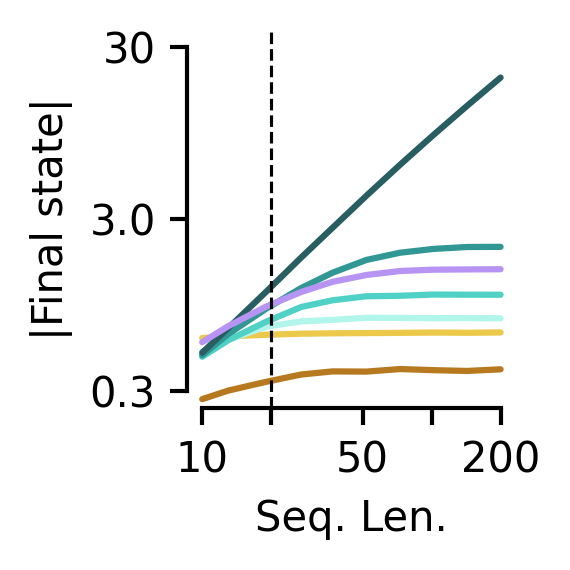

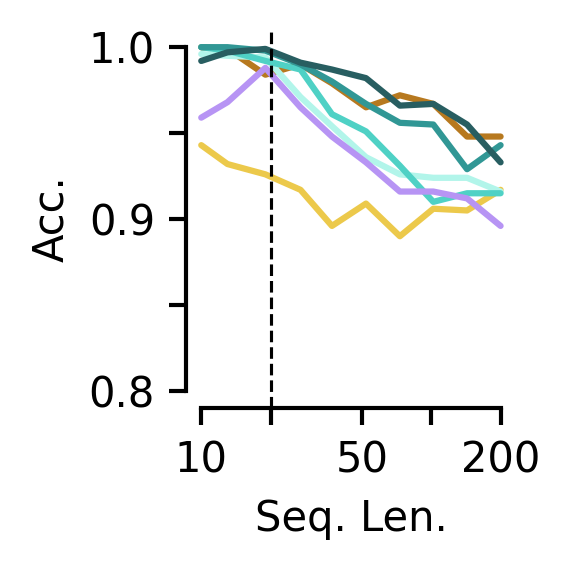

In [ ]:
fig1, ax1 = plt.subplots(1, 1, figsize=(2, 2))

fig2, ax2 = plt.subplots(1, 1, figsize=(2, 2))

# lam_colors = (jetplot.colors.yellow.v5, jetplot.colors.yellow.v7, 
#               jetplot.colors.teal.v2, jetplot.colors.teal.v4,
#               jetplot.colors.teal.v6, jetplot.colors.teal.v8)

# Yellow v5, yellow v7, Teal v2, v4, v6, v8, Purple v4
lam_colors = ('#ecc94b', '#b7791f',  '#b2f5ea', '#4fd1c5', '#319795', '#285e61', '#b794f4')

for lam_idx, lam_clamp in enumerate(lam_vals):
    ax1.plot(phrase_lengths, np.mean(lam_mags[lam_idx], axis=0),
             color=lam_colors[lam_idx], alpha=1.0, marker=None, 
             label='lam: {}'.format(lam_clamp))
    
    ax2.plot(phrase_lengths, np.mean(lam_accs[lam_idx], axis=0),
             color=lam_colors[lam_idx], alpha=1.0, marker=None,
             label='lam: {}'.format(lam_clamp))

ax1.axvline(20, color='k', linestyle='dashed', linewidth=0.75)

ax1.set_xscale('log')
ax1.set_yscale('log')
ax1.set_xlabel('Seq. Len.')
ax1.set_ylabel('|Final state|')
# ax1.legend()
ax1.set_ylim((0.3, 30.0))
ax1.set_yticks((0.3, 3.0, 30.0))
ax1.set_yticklabels((0.3, 3.0, 30))
# ax1.set_yticklabels((0.8, None, 0.9, None, 1.0)

ax1.minorticks_off()

ax2.axvline(20, color='k', linestyle='dashed', linewidth=0.75)

ax2.set_xscale('log')
ax2.set_xlabel('Seq. Len.')
ax2.set_ylabel('Acc.')
# ax2.legend()
ax2.set_ylim((0.8, 1.0))
ax2.set_yticks((0.8, 0.85, 0.9, 0.95, 1.0))
ax2.set_yticklabels((0.8, None, 0.9, None, 1.0))

for ax in (ax1, ax2):
    ax.set_xlim((10, 200))
    ax.set_xticks((10, 20, 50, 100, 200))
    ax.set_xticklabels((10, None, 50, None, 200))

    jetplot.breathe(ax=ax)

In [ ]:
np.mean(lam_accs[-1], axis=0)

array([0.69499999, 0.699     , 0.702     , 0.726     , 0.755     ,
       0.758     , 0.76      , 0.76799999, 0.741     , 0.736     ])

**Plots of network dynamics**


Now lets make some plots to give an intuition as to what's happening in the final state in these setups. Note this loads a specific network since we want these to be the same networks used in the dynamics plots

In [ ]:
load_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/lambdasMinIt_'
vanilla_load = ['VanillaRNN[50,100,2]_train=seq_inf_task=int_2class_20len',]
trial_idx = 0
init_seed = 1001

n_pl = 10
phrase_lengths = np.logspace(1, np.log10(200), n_pl)
phrase_lengths = [int(pl) for pl in phrase_lengths]
# Adds 20
phrase_lengths.pop(2)
phrase_lengths.insert(2, 20)
print('Phrase lengths:', phrase_lengths)

turn_off_noise = True
test_set_size = 100

# Loads network
load_root = load_root_start+str('vanilla').replace('.', '')+'_'
load_path = load_root + vanilla_load[0]
net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)

final_states_pl = []

if turn_off_noise:
    print('Turning off noise for test set.')
    net_noise_type = net_load.noiseType
    net_load.noiseType = None

for len_idx, phrase_len in enumerate(phrase_lengths):
    toy_params_load['phrase_length'] = phrase_len

    testData, testOutputMask, _ = syn.generate_data(
        test_set_size, toy_params_load, net_params_load['n_outputs'],
        raw_data=False, device=torch.device('cpu'), verbose=False)

    db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)
    final_states_pl.append(db_load['h'][:, -1, :].numpy())    

    if phrase_len == 20: # Some additional metrics for plotting 
        db_load_orig = db_load
        # Generates labels for each word in input sequences 
        word_to_input_vector_mat = np.zeros((len(toy_params_load['words']), net_params_load['n_inputs'],))
        for word_idx, word in enumerate(toy_params_load['words']):
            word_to_input_vector_mat[word_idx] = toy_params_load['word_to_input_vector'][word]
        word_labels = np.argmax(np.matmul(testData.tensors[0].cpu().numpy(), word_to_input_vector_mat.T), axis=-1)

        # Gets running score from the sequence
        running_score = get_running_scores(word_labels, toy_params_load)
        score_diffs = running_score[:, :, 1] - running_score[:, :, 0]

final_states_pl = np.array(final_states_pl)
print('Final states shape:', final_states_pl.shape)

# Restores noise if it has been turned off
if turn_off_noise:
    net_load.noiseType = net_noise_type

Phrase lengths: [10, 13, 20, 27, 37, 52, 73, 102, 143, 200]
Turning off noise for test set.
Final states shape: (10, 100, 100)


In [ ]:
# Flatten matrix dimensions (but not batch and seq)
hs = db_load_orig['h'].cpu().numpy()

# Adds A0 as initial state for all sequences
h0 = net_load.h0.cpu().numpy()
h0_batch = np.repeat(h0[np.newaxis, np.newaxis, :,], hs.shape[0], axis=0)
hs = np.concatenate((h0_batch, hs), axis=1)
hs_fit = hs

h_PCA = PCA()
h_PCA.fit(hs_fit.reshape((-1, hs_fit.shape[-1])))

hs_pca = np.zeros((hs_fit.shape))
for batch_idx in range(hs_fit.shape[0]):
    hs_pca[batch_idx] = h_PCA.transform(hs_fit[batch_idx])

hs_pl_pca = np.zeros((len(phrase_lengths), final_states_pl.shape[1], hs_fit.shape[-1]))
# Fits all the final states as well
for len_idx, phrase_len in enumerate(phrase_lengths):
    hs_pl_pca[len_idx] = h_PCA.transform(final_states_pl[len_idx])        

Pl20


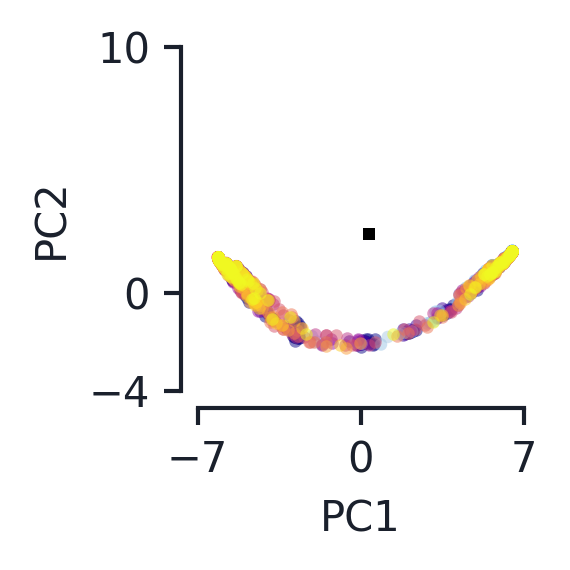

In [ ]:
phase_idxs = np.arange(len(phrase_lengths))

color_type = 'phrase_idx' # 'labels', 'phrase_idx'
cmap = plt.cm.get_cmap('plasma')

fig, ax1 = plt.subplots(1, 1, figsize=(2,2))

pcx = 0
pcy = 1

label_cmap_d = matplotlib.colors.LinearSegmentedColormap.from_list("", [
    c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], jetplot.colors.gray.v4, 
    c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1],
])

len_cmap = plt.cm.get_cmap('plasma')

# len_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", [
#     jetplot.colors.teal.v2, jetplot.colors.teal.v3,
#     jetplot.colors.teal.v4, jetplot.colors.teal.v5, jetplot.colors.teal.v6,
#     jetplot.colors.teal.v7, jetplot.colors.teal.v8, jetplot.colors.teal.v9
# ])

max_pl, min_pl = np.log10(np.max(phrase_lengths)), np.log10(np.min(phrase_lengths))

for len_idx, phrase_len in enumerate(phrase_lengths):
    if phrase_len == 20:
        print('Pl20')
        ax1.scatter(hs_pl_pca[len_idx, :, pcx], hs_pl_pca[len_idx, :, pcy], c=score_diffs[:, -1],
                   linewidth=0.0, marker='.', zorder=len_idx, alpha=0.5,
                   cmap=label_cmap_d, vmin=-max_score, vmax=max_score)
        # Initial point (only uses first batch)
        ax1.plot(hs_pca[0, 0, pcx], hs_pca[0, 0, pcy], marker='s',
                color='k', zorder=50, markersize=3)
    else:
        cmap_val = (np.log10(phrase_len) - min_pl)/(max_pl-min_pl)
        ax1.scatter(hs_pl_pca[len_idx, :, pcx], hs_pl_pca[len_idx, :, pcy],
                    color=len_cmap(cmap_val),
                    linewidth=0.0, marker='.', zorder=len_idx, alpha=0.5,)
    

ax1.set_xlabel('PC{}'.format(pcx+1))
ax1.set_ylabel('PC{}'.format(pcy+1))
ax1.set_xlim((-7, 7))
ax1.set_ylim((-4, 10))
ax1.set_xticks((-7, 0, 7))
ax1.set_yticks((-4, 0, 10))

jetplot.breathe(ax=ax1)

Same thing for STPN

In [ ]:
load_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/lambdasMinIt_'
STPN_load = ['HebbNet_M[50,100,2]_train=seq_inf_task=int_2class_20len',]
trial_idx = 4
init_seed = 1001

n_pl = 10
phrase_lengths = np.logspace(1, np.log10(200), n_pl)
phrase_lengths = [int(pl) for pl in phrase_lengths]
# Adds 20
phrase_lengths.pop(2)
phrase_lengths.insert(2, 20)
print('Phrase lengths:', phrase_lengths)

turn_off_noise = True
test_set_size = 500

# Loads network
load_root = load_root_start+str('0.95').replace('.', '')+'_'
load_path = load_root + STPN_load[0]
net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)

final_states_pl = []

if turn_off_noise:
    print('Turning off noise for test set.')
    net_noise_type = net_load.noiseType
    net_load.noiseType = None

for len_idx, phrase_len in enumerate(phrase_lengths):
    toy_params_load['phrase_length'] = phrase_len

    testData, testOutputMask, _ = syn.generate_data(
        test_set_size, toy_params_load, net_params_load['n_outputs'],
        raw_data=False, device=torch.device('cpu'), verbose=False)

    db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)
    final_states_pl.append(db_load['A'][:, -2, :, :].numpy())    

    if phrase_len == 20: # Some additional metrics for plotting 
        db_load_orig = db_load
        # Generates labels for each word in input sequences 
        word_to_input_vector_mat = np.zeros((len(toy_params_load['words']), net_params_load['n_inputs'],))
        for word_idx, word in enumerate(toy_params_load['words']):
            word_to_input_vector_mat[word_idx] = toy_params_load['word_to_input_vector'][word]
        word_labels = np.argmax(np.matmul(testData.tensors[0].cpu().numpy(), word_to_input_vector_mat.T), axis=-1)

        # Gets running score from the sequence
        running_score = get_running_scores(word_labels, toy_params_load)
        score_diffs = running_score[:, :, 1] - running_score[:, :, 0]

final_states_pl = np.array(final_states_pl)
print('Final states shape:', final_states_pl.shape)
final_states_pl = final_states_pl.reshape((len(phrase_lengths), final_states_pl.shape[1], -1))
print('Final states shape:', final_states_pl.shape)

# Restores noise if it has been turned off
if turn_off_noise:
    net_load.noiseType = net_noise_type

Phrase lengths: [10, 13, 20, 27, 37, 52, 73, 102, 143, 200]
Turning off noise for test set.
Final states shape: (10, 500, 100, 50)
Final states shape: (10, 500, 5000)


In [ ]:
# Flatten matrix dimensions (but not batch and seq)
pc_comps = 200

As = db_load_orig['A'].cpu().numpy()

# Adds A0 as initial state for all sequences
A0 = net_load.A0.cpu().numpy()
A0_batch = np.repeat(A0[np.newaxis, np.newaxis, :, :], As.shape[0], axis=0)
As = np.concatenate((A0_batch, As), axis=1)
As_fit = As

As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))

a_PCA = PCA(n_components=pc_comps)
a_PCA.fit(As_flat.reshape((-1, As_flat.shape[-1])))

As_pca = np.zeros((As_flat.shape[0], As_flat.shape[1], pc_comps))
for batch_idx in range(As.shape[0]):
    As_pca[batch_idx] = a_PCA.transform(As_flat[batch_idx])

As_pl_pca = np.zeros((len(phrase_lengths), final_states_pl.shape[1], pc_comps))
# Fits all the final states as well
for len_idx, phrase_len in enumerate(phrase_lengths):
    As_pl_pca[len_idx] = a_PCA.transform(final_states_pl[len_idx])        

Pl20


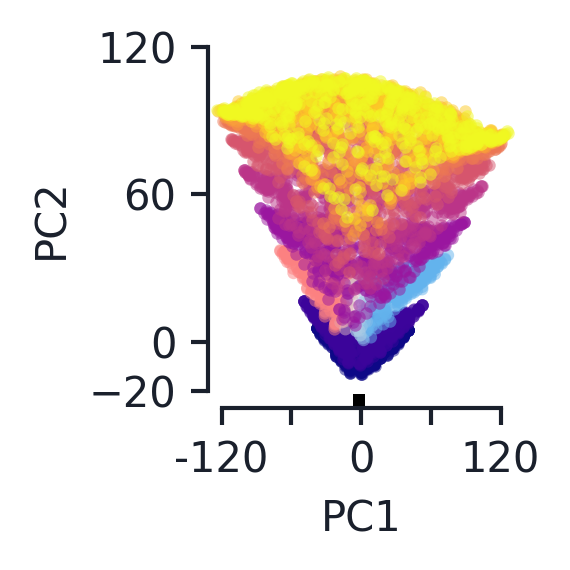

In [ ]:
import matplotlib.colors

phase_idxs = np.arange(len(phrase_lengths))

color_type = 'phrase_idx' # 'labels', 'phrase_idx'
cmap = plt.cm.get_cmap('plasma')

fig, ax1 = plt.subplots(1, 1, figsize=(2,2))

pcx = 0
pcy = 1

label_cmap_d = matplotlib.colors.LinearSegmentedColormap.from_list("", [
    c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], jetplot.colors.gray.v4, 
    c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1],
])

len_cmap = plt.cm.get_cmap('plasma')

# len_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", [
#     jetplot.colors.teal.v2, jetplot.colors.teal.v3,
#     jetplot.colors.teal.v4, jetplot.colors.teal.v5, jetplot.colors.teal.v6,
#     jetplot.colors.teal.v7, jetplot.colors.teal.v8, jetplot.colors.teal.v9
# ])

max_pl, min_pl = np.log10(np.max(phrase_lengths)), np.log10(np.min(phrase_lengths))
max_score = np.max(np.abs(score_diffs))

for len_idx, phrase_len in enumerate(phrase_lengths):
    if phrase_len == 20:
        print('Pl20')
        ax1.scatter(As_pl_pca[len_idx, :, pcx], As_pl_pca[len_idx, :, pcy], c=score_diffs[:, -1],
                   linewidth=0.0, marker='.', zorder=len_idx, alpha=0.5,
                   cmap=label_cmap_d, vmin=-max_score, vmax=max_score)
        # Initial point (only uses first batch)
        ax1.plot(As_pca[0, 0, pcx], As_pca[0, 0, pcy], marker='s',
                color='k', zorder=50, markersize=3)
    else:
        cmap_val = (np.log10(phrase_len) - min_pl)/(max_pl-min_pl)
        ax1.scatter(As_pl_pca[len_idx, :, pcx], As_pl_pca[len_idx, :, pcy],
                    color=len_cmap(cmap_val),
                    linewidth=0.0, marker='.', zorder=len_idx, alpha=0.5,)
    

ax1.set_xlabel('PC{}'.format(pcx+1))
ax1.set_ylabel('PC{}'.format(pcy+1))
ax1.set_ylim((-20, 120))
ax1.set_yticks((-20, 0, 60, 120))
ax1.set_xlim((-120, 120))
ax1.set_xticks((-120, -60, 0, 60, 120))
ax1.set_xticklabels((-120, None, 0, None, 120))

jetplot.breathe(ax=ax1)

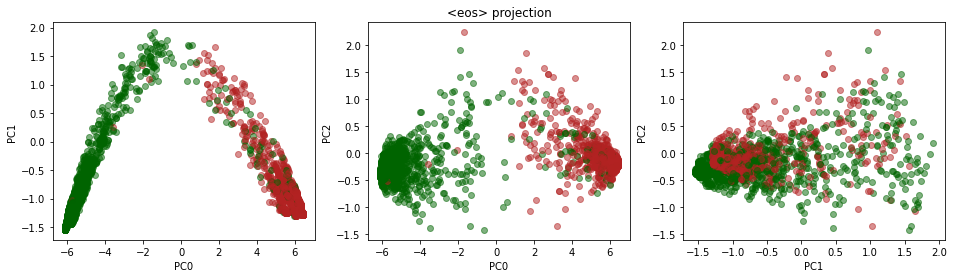

In [ ]:
phase_idxs = np.arange(len(phrase_lengths))
plot_contents = ('final_states',) #('all_states', 'final_states', 'sample_paths')

color_type = 'labels' # 'labels', 'phrase_idx'
cmap = plt.cm.get_cmap('plasma')

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4))

ax_lim = None

pcxs = (0, 0, 1)
pcys = (1, 2, 2)
# pcxs = (0, 1, 2)
# pcys = (3, 3, 3)

for phase_idx in phase_idxs:
    h_pl = dbs[phase_idx]['h']
    h_pl_pca = np.zeros_like(h_pl)
    for batch_idx in range(h_pl.shape[0]):
        h_pl_pca[batch_idx] = hidden_PCA.transform(h_pl[batch_idx])

    labels_pl = np.array(testDatasPL[phase_idx][:,:,:][1][:, -1, 0].cpu())

    for ax, pcx, pcy in zip((ax1, ax2, ax3), pcxs, pcys):

        for batch_idx in range(h_pl_pca.shape[0]):
            if color_type == 'labels':
                color_labels_l = c_vals_l[labels_pl[batch_idx]]
                color_labels = c_vals[labels_pl[batch_idx]]
            elif color_type == 'phrase_idx':
                color_labels_l = cmap(phase_idx/len(phase_idxs))
                color_labels = cmap(phase_idx/len(phase_idxs))

            if 'all_states' in plot_contents:
                ax.plot(h_pl_pca[batch_idx, :, pcx], h_pl_pca[batch_idx, :, pcy], linewidth=0.0,
                        marker='.', color=color_labels_l, zorder=0, alpha=0.1)
            if 'final_states' in plot_contents:
                ax.plot(h_pl_pca[batch_idx, -1, pcx], h_pl_pca[batch_idx, -1, pcy], marker='o',
                    color=color_labels, zorder=5, alpha=0.5)
            if 'sample_paths' in plot_contents and batch_idx < 2:
                ax.plot(h_pl_pca[batch_idx, :, pcx], h_pl_pca[batch_idx, :, pcy], linewidth=1.0,
                        marker='.', color=color_labels, zorder=1)

        # for batch_idx in range(hs_spec.shape[0]):
        #     ax.plot(h_spec_word_pca[batch_idx, :, pcx], h_spec_word_pca[batch_idx, :, pcy], 
        #             color=c_vals[batch_idx], marker='.')

        # for ro_idx in range(net_params['n_outputs']):
        #     ax.plot([0, ro_matrix_word_pca[ro_idx, pcx]], [0, ro_matrix_word_pca[ro_idx, pcy]],
        #             color=c_vals[ro_idx], linewidth=3.0)

        ax.set_xlabel('PC{}'.format(pcx))
        ax.set_ylabel('PC{}'.format(pcy))

        if ax_lim is not None:
            ax.set_xlim((-ax_lim, ax_lim,))
            ax.set_ylim((-ax_lim, ax_lim,))

    ax2.set_title('{} projection'.format(word_proj))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(Tru

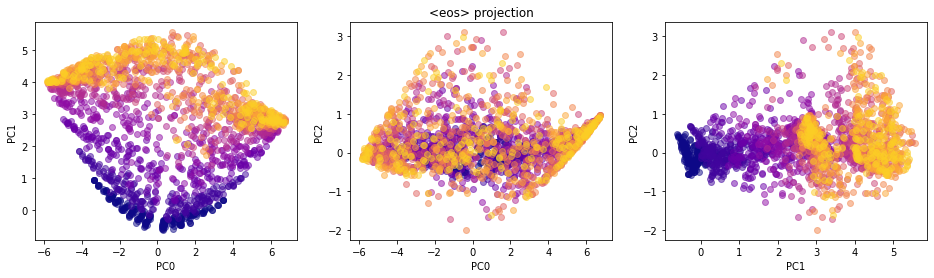

In [ ]:
word_proj = '<eos>' 

phase_idxs = np.arange(len(phrase_lengths))
plot_contents = ('final_states',) #('all_states', 'final_states', 'sample_paths')

color_type = 'phrase_idx' # 'labels', 'phrase_idx'
cmap = plt.cm.get_cmap('plasma')

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4))

ax_lim = None

pcxs = (0, 0, 1)
pcys = (1, 2, 2)
# pcxs = (0, 1, 2)
# pcys = (3, 3, 3)

for phase_idx in phase_idxs:
    h_pl_word = HebbNet_word_proj(word_proj, dbs[phase_idx]['A'], net, toy_params)
    h_pl_word_pca = np.zeros_like(h_pl_word)
    for batch_idx in range(h_pl_word.shape[0]):
        h_pl_word_pca[batch_idx] = h_word_PCA.transform(h_pl_word[batch_idx])

    labels_pl = np.array(testDatasPL[phase_idx][:,:,:][1][:, -1, 0].cpu())

    for ax, pcx, pcy in zip((ax1, ax2, ax3), pcxs, pcys):

        for batch_idx in range(h_pl_word_pca.shape[0]):
            if color_type == 'labels':
                color_labels_l = c_vals_l[labels_pl[batch_idx]]
                color_labels = c_vals[labels_pl[batch_idx]]
            elif color_type == 'phrase_idx':
                color_labels_l = cmap(phase_idx/len(phase_idxs))
                color_labels = cmap(phase_idx/len(phase_idxs))

            if 'all_states' in plot_contents:
                ax.plot(h_pl_word_pca[batch_idx, :, pcx], h_pl_word_pca[batch_idx, :, pcy], linewidth=0.0,
                        marker='.', color=color_labels_l, zorder=0, alpha=0.3)
            if 'final_states' in plot_contents:
                ax.plot(h_pl_word_pca[batch_idx, -1, pcx], h_pl_word_pca[batch_idx, -1, pcy], marker='o',
                    color=color_labels, zorder=5, alpha=0.5)
            if 'sample_paths' in plot_contents and batch_idx < 2:
                ax.plot(h_pl_word_pca[batch_idx, :, pcx], h_pl_word_pca[batch_idx, :, pcy], linewidth=1.0,
                        marker='.', color=color_labels, zorder=1)

        # for batch_idx in range(hs_spec.shape[0]):
        #     ax.plot(h_spec_word_pca[batch_idx, :, pcx], h_spec_word_pca[batch_idx, :, pcy], 
        #             color=c_vals[batch_idx], marker='.')

        # for ro_idx in range(net_params['n_outputs']):
        #     ax.plot([0, ro_matrix_word_pca[ro_idx, pcx]], [0, ro_matrix_word_pca[ro_idx, pcy]],
        #             color=c_vals[ro_idx], linewidth=3.0)

        ax.set_xlabel('PC{}'.format(pcx))
        ax.set_ylabel('PC{}'.format(pcy))

        if ax_lim is not None:
            ax.set_xlim((-ax_lim, ax_lim,))
            ax.set_ylim((-ax_lim, ax_lim,))

    ax2.set_title('{} projection'.format(word_proj))

#### **Flow Delay**

In [ ]:
n_trials = 10
acc_thresh = 0.95
# input_size = 10

save = True
# save_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/delaylambdas_'
save_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/delaylambdas_1factor_acc95_'

lam_vals = (0.9, 0.95, 0.99, 1.0)
lam_vals = (0.95, 0.99,)
# lam_vals = ('gru',)

for lam_clamp in lam_vals:
    save_root = save_root_start+str(lam_clamp).replace('.', '')+'_'
    for trial_idx in range(n_trials):
        # Note redefines toy_params internal to the loop so that a new random 
        # set of word vectors will be drawn for each trial
        ########## Toy data parameters ##########
        toy_params = {
            'data_type': 'int', # int, context
            
            'phrase_length': 40,
            'n_classes': 2,
            'input_type': 'binary',    # one hot, binary, binary1-1
            'input_size': 50,          # defaults to length of words
            'include_eos': True,

            'stack_phrases': False,
            'n_stack': 1,
            'include_sos': False,
            'n_delay': 20, # Inserts delay words between at end of phrase (but before eos trigger)
            'delay_word': '<delay>', # '<delay>' or 'null'

            'uniform_score': True, # Uniform distribution over scores=
        }

        net_params = {
            'netType': 'HebbNet_M', # HebbNet, HebbNet_M, VanillaRNN, GRU, rHebbNet, rHebbNet_M, GHU, GHU_M
            'n_inputs': toy_params['input_size'],         # input dim
            'n_hidden': 100,                      # hidden dim
            'n_outputs': toy_params['n_classes'],         # output dim
            # 'n_outputs': 10,                                # train with larger number of outputs for generalization tests    
            'f_act': 'tanh',         # 1st layer actiivation function # linear, sigmoid, tanh, relu
            'f0_act': 'linear',      # 2nd layer actiivation function
            'trainable_state0': False,
            
            # STPN Features
            'A_act': None,            # Activation on the A update (tanh or None)
            'lam_clamp': lam_clamp,   # Maximum lambda value
            'eta_type': 'scalar',     # scalar or vector
            'eta_force': None,        # ensure either Hebbian or anti-Hebbian plasticity
            'hebb_type': 'input',      # input, output, inputOutput

            # Train parameters
            'train_mode': 'seq_inf',   # 'seq' or 'seq_inf'
            'weight_reg': 'L1',
            'reg_lambda': 1e-4,
            'hidden_bias': False,
            'ro_bias': False,           # use readout bias or not
            'gradient_clip': 10,
            'freeze_inputs': False,      # freeze the input layer (and hidden bias)
            'sparsification': 0.0,      # Amount to sparsify network's weights (0.0 = no sparsification)
            'noise_type': 'input',      # None, 'input', 'hidden'
            'noise_scale': 0.1,         # Expected magnitude of noise vector
            'cuda': True,
            'validEarlyStop': False,     # Early stop when average validation loss saturates
            'accEarlyStop': acc_thresh,
            'minMaxIter': (2000, 1e6),   
            'seed': 1001 + trial_idx,   # This seed is used to generate training/valid data too

            'train_set_size': 3200,
            'valid_set_size': 500,
            'batch_size': 64,
            'epochs': 1,
        }
        # Keep forgetting to turn this on for RNNs, so just automate it
        net_params['hidden_bias'] = False if net_params['netType'] in ('HebbNet', 'HebbNet_M') else True

        print('Trial: {}'.format(trial_idx))
        verbose = True if trial_idx == 0 else False

        net, toy_params, net_params = train_network(net_params, toy_params, save=save, 
                                                    save_root=save_root, verbose=verbose)

Trial: 0
Toy integration data...
Using CUDA...
Net parameters:
  Net Type: Multiplicative
  Structure: f: tanh // fOut: linear // (Nx, Nh, Ny) = (50, 100, 2)
  No hidden bias // No readout bias // Sparsification: 0.00 // Noise type: input (scl: 1.0e-01)
  A parameters:
    A update: Hebbian // Pre-Syn Only // A Act: linear // Eta: scalar // Lam: scalar // Lambda_max: 0.95
    A0: zeros // A unbounded
Train parameters:
  Loss: XE // LR: 1.00e-03 // Weight reg: L1, coef: 1.0e-04 // Gradient clip: 1.0e+01
Iter:0 grad:8.662 train_loss:0.7547 train_acc:0.438 valid_loss:0.7473 valid_acc:0.502
Iter:50 grad:7.751 train_loss:0.7326 train_acc:0.453 valid_loss:0.7292 valid_acc:0.722
Iter:100 grad:7.123 train_loss:0.7146 train_acc:0.734 valid_loss:0.7119 valid_acc:0.770
Iter:150 grad:6.800 train_loss:0.6932 train_acc:0.859 valid_loss:0.6905 valid_acc:0.886
Iter:200 grad:6.732 train_loss:0.6601 train_acc:0.906 valid_loss:0.6628 valid_acc:0.856
Iter:250 grad:6.872 train_loss:0.6320 train_acc:0.922 v

Tests behavior of the network with longer delays. Note the final state magnitude is the second to last state now, so it misses the EoS

In [ ]:
load_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/delaylambdas_'

STPN_load = ['HebbNet_M[50,100,2]_train=seq_inf_task=int_2class_40len',]
gru_load = ['GRU[50,100,2]_train=seq_inf_task=int_2class_40len',]
STPN1_load = ['HebbNet_M[50,100,2]_train=seq_inf_task=int_2class_40len',]

n_delay = 10

delay_lengths = np.logspace(np.log10(10), np.log10(100), n_delay)
delay_lengths = [int(dl) for dl in delay_lengths]
print('Delay lengths:', delay_lengths)

n_trials = 10
init_seed = 1001
test_set_size = 100

lam_vals = ('gru', 0.9, 0.95, 0.99, 1.0, '0.95_1', '0.99_1',)

lam_mags = np.zeros((len(lam_vals), n_trials, n_delay))
lam_accs = np.zeros((len(lam_vals), n_trials, n_delay))

for lam_idx, lam_clamp in enumerate(lam_vals):
    load_root = load_root_start+str(lam_clamp).replace('.', '')+'_'
    
    print('Lambda idx: {} (lam clamp: {})'.format(lam_idx, lam_clamp))

    for trial_idx in range(n_trials):
        # Loads network
        if lam_clamp == 'gru':
            load_path = load_root + gru_load[0]
        elif lam_clamp in ('0.95_1',):
            load_path = load_root_start+'1factor_acc95_'+str(0.95).replace('.', '')+'_' + STPN1_load[0]
        elif lam_clamp in ('0.99_1',):
            load_path = load_root_start+'1factor_acc95_'+str(0.99).replace('.', '')+'_' + STPN1_load[0]
        else:
            load_path = load_root + STPN_load[0]
        net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
        
        base_phrase_len = toy_params_load['phrase_length'] - toy_params_load['n_delay']

        for len_idx, delay_len in enumerate(delay_lengths):
            toy_params_load['phrase_length'] = base_phrase_len + delay_len
            toy_params_load['n_delay'] = delay_len
            # print('Phrase length:', toy_params_load['phrase_length'], 'n_delay', toy_params_load['n_delay'])

            testData, testOutputMask, _ = syn.generate_data(
                test_set_size, toy_params_load, net_params_load['n_outputs'],
                raw_data=False, device=torch.device('cpu'), verbose=False)
            
            db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)

            if net_params_load['netType'] in ('VanillaRNN', 'GRU'):
                final_state_mags = (np.linalg.norm(db_load['h'][:, -1, :], axis=(1,)) / 
                                    np.sqrt(net_params_load['n_hidden']))
            elif net_params_load['netType'] in ('HebbNet', 'HebbNet_M',):             
                final_state_mags = (np.linalg.norm(db_load['A'][:, -2, :, :], axis=(1, 2)) / 
                                    np.sqrt(net_params_load['n_hidden']*net_params_load['n_inputs'])) 
            lam_mags[lam_idx, trial_idx, len_idx] = np.mean(final_state_mags, axis=0) # Average over test_set

            lam_accs[lam_idx, trial_idx, len_idx] = db_load['acc']

print('Lam mags shape', lam_mags.shape)
print('Lam accs shape', lam_accs.shape)

Delay lengths: [10, 12, 16, 21, 27, 35, 46, 59, 77, 100]
Lambda idx: 0 (lam clamp: gru)
Lambda idx: 1 (lam clamp: 0.9)
Lambda idx: 2 (lam clamp: 0.95)
Lambda idx: 3 (lam clamp: 0.99)
Lambda idx: 4 (lam clamp: 1.0)
Lambda idx: 5 (lam clamp: 0.95_1)
Lambda idx: 6 (lam clamp: 0.99_1)
Lam mags shape (7, 10, 10)
Lam accs shape (7, 10, 10)


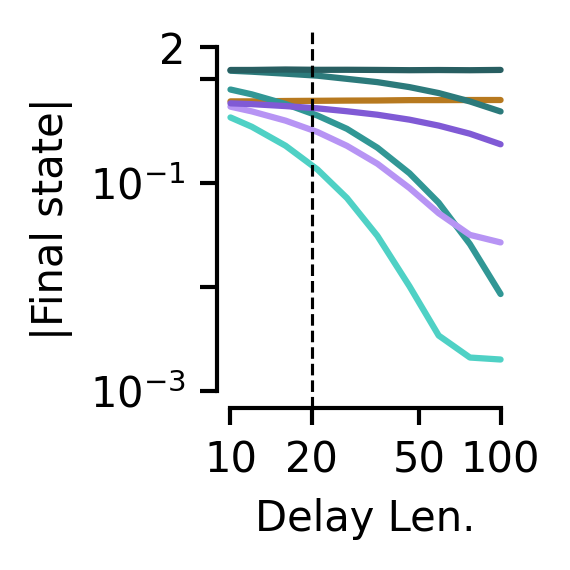

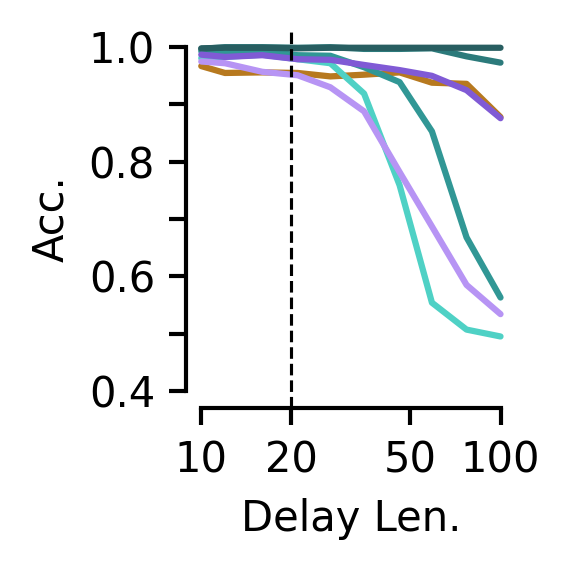

In [ ]:
fig1, ax1 = plt.subplots(1, 1, figsize=(2, 2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2, 2))

# lam_colors = (jetplot.colors.yellow.v7, jetplot.colors.teal.v4,
#               jetplot.colors.teal.v6, jetplot.colors.teal.v7, jetplot.colors.teal.v8)

# yellow v7, Teal v4, v6, v7 v8, Purple v4, v6
lam_colors = ('#b7791f', '#4fd1c5', '#319795', '#2c7a7b', '#285e61', '#b794f4', '#805ad5')

for lam_idx, lam_clamp in enumerate(lam_vals):
    ax1.plot(delay_lengths, np.mean(lam_mags[lam_idx], axis=0),
             color=lam_colors[lam_idx], alpha=1.0, marker=None, 
             label='lam: {}'.format(lam_clamp))
    
    ax2.plot(delay_lengths, np.mean(lam_accs[lam_idx], axis=0),
             color=lam_colors[lam_idx], alpha=1.0, marker=None,
             label='lam: {}'.format(lam_clamp))

ax1.axvline(20, color='k', linestyle='dashed', linewidth=0.75)

ax1.set_xscale('log')
ax1.set_yscale('log')
ax1.set_xlabel('Delay Len.')
ax1.set_ylabel('|Final state|')
# ax1.legend()
ax1.set_ylim((0.001, 2))
ax1.set_yticks((0.001, 0.01, 0.1, 1, 2))
ax1.set_yticklabels(('$10^{-3}$', None, '$10^{-1}$', None, 2))
# ax1.set_yticklabels((0.8, None, 0.9, None, 1.0)

ax1.minorticks_off()

ax2.axvline(20, color='k', linestyle='dashed', linewidth=0.75)

ax2.set_xscale('log')
ax2.set_xlabel('Delay Len.')
ax2.set_ylabel('Acc.')
# ax2.legend()
ax2.set_ylim((0.5, 1.0))
ax2.set_yticks((0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0))
ax2.set_yticklabels((0.4, None, 0.6, None, 0.8, None, 1.0))

for ax in (ax1, ax2):
    ax.set_xlim((10, 100))
    ax.set_xticks((10, 20, 50, 100))
    ax.set_xticklabels((10, 20, 50, 100))

    jetplot.breathe(ax=ax)

**Plots of network dynamics**


Now lets make some plots to give an intuition as to what's happening in the final state in these setups. 

In [ ]:
load_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/delaylambdas_'
gru_load = ['GRU[50,100,2]_train=seq_inf_task=int_2class_40len',]
trial_idx = 9
init_seed = 1001

n_delay = 10
delay_lengths = np.logspace(np.log10(10), np.log10(100), n_delay)
delay_lengths = [int(dl) for dl in delay_lengths]
# Adds 20
delay_lengths.pop(3)
delay_lengths.insert(3, 20)
delay_lengths.insert(0, 0)
print('Delay lengths:', delay_lengths)

turn_off_noise = True
test_set_size = 200

# Loads network
load_root = load_root_start+str('gru').replace('.', '')+'_'
load_path = load_root + gru_load[0]
net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)

final_states_delay = []

if turn_off_noise:
    print('Turning off noise for test set.')
    net_noise_type = net_load.noiseType
    net_load.noiseType = None

base_phrase_len = toy_params_load['phrase_length'] - toy_params_load['n_delay']

for len_idx, delay_len in enumerate(delay_lengths):
    toy_params_load['phrase_length'] = base_phrase_len + delay_len
    toy_params_load['n_delay'] = delay_len

    testData, testOutputMask, _ = syn.generate_data(
        test_set_size, toy_params_load, net_params_load['n_outputs'],
        raw_data=False, device=torch.device('cpu'), verbose=False)

    db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)
    final_states_delay.append(db_load['h'][:, -1, :].numpy())    
    print('Delay: {} Acc: {:.2f}'.format(delay_len, db_load['acc']))
    if delay_len == 0: # Some additional metrics for plotting 
        print('0!')
        db_load_orig = db_load
        # Generates labels for each word in input sequences 
        word_to_input_vector_mat = np.zeros((len(toy_params_load['words']), net_params_load['n_inputs'],))
        for word_idx, word in enumerate(toy_params_load['words']):
            word_to_input_vector_mat[word_idx] = toy_params_load['word_to_input_vector'][word]
        word_labels = np.argmax(np.matmul(testData.tensors[0].cpu().numpy(), word_to_input_vector_mat.T), axis=-1)

        # Gets running score from the sequence
        running_score = get_running_scores(word_labels, toy_params_load)
        score_diffs = running_score[:, :, 1] - running_score[:, :, 0]

final_states_delay = np.array(final_states_delay)
print('Final states shape:', final_states_delay.shape)

# Restores noise if it has been turned off
if turn_off_noise:
    net_load.noiseType = net_noise_type

Delay lengths: [0, 10, 12, 16, 20, 27, 35, 46, 59, 77, 100]
Turning off noise for test set.
Delay: 0 Acc: 0.95
0!
Delay: 10 Acc: 0.93
Delay: 12 Acc: 0.93
Delay: 16 Acc: 0.97
Delay: 20 Acc: 0.94
Delay: 27 Acc: 0.94
Delay: 35 Acc: 0.95
Delay: 46 Acc: 0.96
Delay: 59 Acc: 0.92
Delay: 77 Acc: 0.94
Delay: 100 Acc: 0.91
Final states shape: (11, 200, 100)


In [ ]:
hs = db_load_orig['h'].cpu().numpy()

# Adds A0 as initial state for all sequences
h0 = net_load.h0.cpu().numpy()
h0_batch = np.repeat(h0[np.newaxis, np.newaxis, :,], hs.shape[0], axis=0)
hs = np.concatenate((h0_batch, hs), axis=1)
hs_fit = hs

h_PCA = PCA()
h_PCA.fit(hs_fit.reshape((-1, hs_fit.shape[-1])))

hs_pca = np.zeros((hs_fit.shape))
for batch_idx in range(hs_fit.shape[0]):
    hs_pca[batch_idx] = h_PCA.transform(hs_fit[batch_idx])

hs_delay_pca = np.zeros((len(delay_lengths), final_states_delay.shape[1], hs_fit.shape[-1]))
# Fits all the final states as well
for len_idx, delay_len in enumerate(delay_lengths):
    hs_delay_pca[len_idx] = h_PCA.transform(final_states_delay[len_idx])        

Pl20


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:38: RuntimeWarning: divide by zero encountered in log10


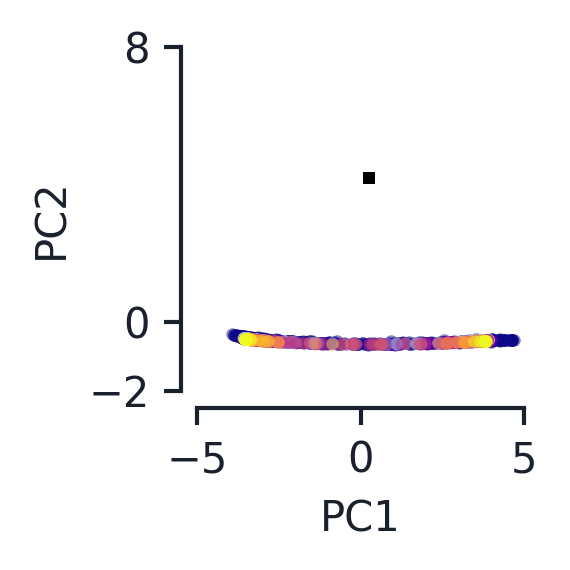

In [ ]:
phase_idxs = np.arange(len(phrase_lengths))

color_type = 'phrase_idx' # 'labels', 'phrase_idx'
cmap = plt.cm.get_cmap('plasma')

fig, ax1 = plt.subplots(1, 1, figsize=(2,2))

pcx = 0
pcy = 1

label_cmap_d = matplotlib.colors.LinearSegmentedColormap.from_list("", [
    c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], jetplot.colors.gray.v4, 
    c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1],
])

len_cmap = plt.cm.get_cmap('plasma')

# len_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", [
#     jetplot.colors.teal.v2, jetplot.colors.teal.v3,
#     jetplot.colors.teal.v4, jetplot.colors.teal.v5, jetplot.colors.teal.v6,
#     jetplot.colors.teal.v7, jetplot.colors.teal.v8, jetplot.colors.teal.v9
# ])

delay_len_nozero = delay_lengths.copy()
delay_len_nozero.pop(0)
max_dl, min_dl = np.log10(np.max(delay_len_nozero)), np.log10(np.min(delay_len_nozero))

for len_idx, delay_len in enumerate(delay_lengths):
    if delay_len == 20:
        print('Pl20')
        ax1.scatter(hs_delay_pca[len_idx, :, pcx], hs_delay_pca[len_idx, :, pcy], c=score_diffs[:, -1],
                   linewidth=0.0, marker='.', zorder=len_idx, alpha=0.5,
                   cmap=label_cmap_d, vmin=-max_score, vmax=max_score)
        # Initial point (only uses first batch)
        ax1.plot(hs_pca[0, 0, pcx], hs_pca[0, 0, pcy], marker='s',
                color='k', zorder=50, markersize=3)
    else:
        cmap_val = (np.log10(delay_len) - min_dl)/(max_dl-min_dl)
        ax1.scatter(hs_delay_pca[len_idx, :, pcx], hs_delay_pca[len_idx, :, pcy],
                    color=len_cmap(cmap_val),
                    linewidth=0.0, marker='.', zorder=len_idx, alpha=0.5,)
    

ax1.set_xlabel('PC{}'.format(pcx+1))
ax1.set_ylabel('PC{}'.format(pcy+1))
ax1.set_xlim((-5, 5))
ax1.set_ylim((-2, 8))
ax1.set_xticks((-5, 0, 5))
ax1.set_yticks((-2, 0, 8))

jetplot.breathe(ax=ax1)

Same thing for STPNs

In [ ]:
load_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/delaylambdas_'
STPN_load = ['HebbNet_M[50,100,2]_train=seq_inf_task=int_2class_40len',]
trial_idx = 4
init_seed = 1001

n_delay = 10
delay_lengths = np.logspace(np.log10(10), np.log10(100), n_delay)
delay_lengths = [int(dl) for dl in delay_lengths]
# Adds 20
delay_lengths.pop(3)
delay_lengths.insert(3, 20)
delay_lengths.insert(0, 0)
print('Delay lengths:', delay_lengths)

turn_off_noise = True
test_set_size = 500

# Loads network
load_root = load_root_start+str('0.95').replace('.', '')+'_'
load_path = load_root + STPN_load[0]
net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)

final_states_delay = []

if turn_off_noise:
    print('Turning off noise for test set.')
    net_noise_type = net_load.noiseType
    net_load.noiseType = None

base_phrase_len = toy_params_load['phrase_length'] - toy_params_load['n_delay']

for len_idx, delay_len in enumerate(delay_lengths):
    toy_params_load['phrase_length'] = base_phrase_len + delay_len
    toy_params_load['n_delay'] = delay_len

    testData, testOutputMask, _ = syn.generate_data(
        test_set_size, toy_params_load, net_params_load['n_outputs'],
        raw_data=False, device=torch.device('cpu'), verbose=False)

    db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)
    final_states_delay.append(db_load['A'][:, -2, :, :].numpy())    
    print('Delay: {} Acc: {:.2f}'.format(delay_len, db_load['acc']))

    if delay_len == 0: # Some additional metrics for plotting 
        print('0!')
        db_load_orig = db_load
        # Generates labels for each word in input sequences 
        word_to_input_vector_mat = np.zeros((len(toy_params_load['words']), net_params_load['n_inputs'],))
        for word_idx, word in enumerate(toy_params_load['words']):
            word_to_input_vector_mat[word_idx] = toy_params_load['word_to_input_vector'][word]
        word_labels = np.argmax(np.matmul(testData.tensors[0].cpu().numpy(), word_to_input_vector_mat.T), axis=-1)

        # Gets running score from the sequence
        running_score = get_running_scores(word_labels, toy_params_load)
        score_diffs = running_score[:, :, 1] - running_score[:, :, 0]

final_states_delay = np.array(final_states_delay)
print('Final states shape:', final_states_delay.shape)
final_states_delay = final_states_delay.reshape((len(delay_lengths), final_states_delay.shape[1], -1))
print('Final states shape:', final_states_delay.shape)

# Restores noise if it has been turned off
if turn_off_noise:
    net_load.noiseType = net_noise_type

Delay lengths: [0, 10, 12, 16, 20, 27, 35, 46, 59, 77, 100]
Turning off noise for test set.
Delay: 0 Acc: 0.99
0!
Delay: 10 Acc: 0.99
Delay: 12 Acc: 1.00
Delay: 16 Acc: 1.00
Delay: 20 Acc: 1.00
Delay: 27 Acc: 1.00
Delay: 35 Acc: 1.00
Delay: 46 Acc: 1.00
Delay: 59 Acc: 0.98
Delay: 77 Acc: 0.84
Delay: 100 Acc: 0.53
Final states shape: (11, 500, 100, 50)
Final states shape: (11, 500, 5000)


In [ ]:
# Flatten matrix dimensions (but not batch and seq)
pc_comps = 200

As = db_load_orig['A'].cpu().numpy()

# Adds A0 as initial state for all sequences
A0 = net_load.A0.cpu().numpy()
A0_batch = np.repeat(A0[np.newaxis, np.newaxis, :, :], As.shape[0], axis=0)
As = np.concatenate((A0_batch, As), axis=1)
As_fit = As

As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))

a_PCA = PCA(n_components=pc_comps)
a_PCA.fit(As_flat.reshape((-1, As_flat.shape[-1])))

As_pca = np.zeros((As_flat.shape[0], As_flat.shape[1], pc_comps))
for batch_idx in range(As.shape[0]):
    As_pca[batch_idx] = a_PCA.transform(As_flat[batch_idx])

As_dl_pca = np.zeros((len(delay_lengths), final_states_delay.shape[1], pc_comps))
# Fits all the final states as well
for len_idx, delay_len in enumerate(delay_lengths):
    As_dl_pca[len_idx] = a_PCA.transform(final_states_delay[len_idx])        

Delay0!


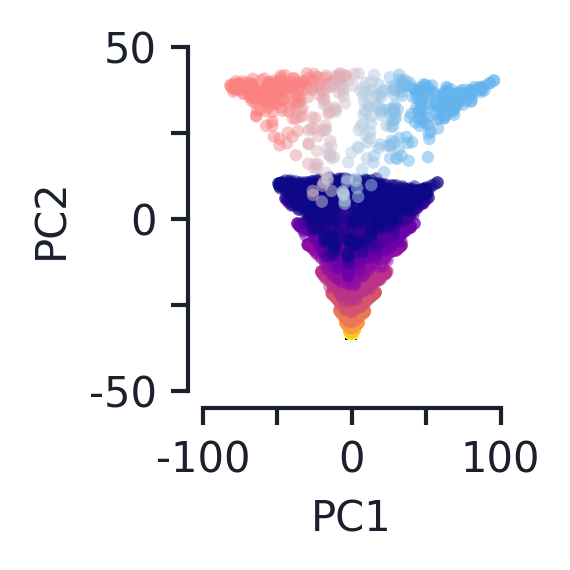

In [ ]:
cmap = plt.cm.get_cmap('plasma')

fig, ax1 = plt.subplots(1, 1, figsize=(2,2))

pcx = 0
pcy = 1

label_cmap_d = matplotlib.colors.LinearSegmentedColormap.from_list("", [
    c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], jetplot.colors.gray.v4, 
    c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1],
])

len_cmap = plt.cm.get_cmap('plasma')

# len_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", [
#     jetplot.colors.teal.v2, jetplot.colors.teal.v3,
#     jetplot.colors.teal.v4, jetplot.colors.teal.v5, jetplot.colors.teal.v6,
#     jetplot.colors.teal.v7, jetplot.colors.teal.v8, jetplot.colors.teal.v9
# ])

delay_len_nozero = delay_lengths.copy()
delay_len_nozero.pop(0)
max_dl, min_dl = np.log10(np.max(delay_len_nozero)), np.log10(np.min(delay_len_nozero))

for len_idx, delay_len in enumerate(delay_lengths):
    if delay_len == 0:
        print('Delay0!')
        ax1.scatter(As_dl_pca[len_idx, :, pcx], As_dl_pca[len_idx, :, pcy], c=score_diffs[:, -1],
                   linewidth=0.0, marker='.', zorder=len(delay_lengths) - len_idx, alpha=0.5,
                   cmap=label_cmap_d, vmin=-max_score, vmax=max_score)
        # Initial point (only uses first batch)
        ax1.plot(As_pca[0, 0, pcx], As_pca[0, 0, pcy], marker='s',
                color='k', zorder=-5, markersize=3)
    else:
        cmap_val = (np.log10(delay_len) - min_dl)/(max_dl-min_dl)
        ax1.scatter(As_dl_pca[len_idx, :, pcx], As_dl_pca[len_idx, :, pcy],
                    color=len_cmap(cmap_val),
                    linewidth=0.0, marker='.', zorder=len(delay_lengths) - len_idx, alpha=0.5,)
    

ax1.set_xlabel('PC{}'.format(pcx+1))
ax1.set_ylabel('PC{}'.format(pcy+1))
ax1.set_ylim((-50, 50))
ax1.set_yticks((-50, -25, 0, 25, 50))
ax1.set_yticklabels((-50, None, 0, None, 50))
ax1.set_xlim((-100, 100))
ax1.set_xticks((-100, -50, 0, 50, 100))
ax1.set_xticklabels((-100, None, 0, None, 100))

jetplot.breathe(ax=ax1)

#### Jacobians

In [ ]:
from torch.autograd.functional import jacobian

state_type = 'valid' 
n_jac_states = 100

word = 'all_zeros' # 'avg', 'null', 'all_zeros', 'random'
if word == 'avg':
    # word_tensor = np.zeros(rnn_specs['input_size'])
    if toy_params['include_eos']:
        word_tensor = np.mean(toy_params['word_to_input_vector'][:-1], axis=0)
    else:
        word_tensor = np.mean(toy_params['word_to_input_vector'], axis=0)
elif word == 'all_zeros':
    word_tensor = np.zeros((net_params['n_inputs'],))
elif word == 'random': # New random input tensor
    word_tensor = syn.generateInputVectors(toy_params)[0]
else:
    word_tensor = toy_params['word_to_input_vector'][toy_params['words'].index(word)]

# Makes input size (1, input_size)
x_star = torch.tensor(np.asarray(word_tensor)[np.newaxis, :], dtype=torch.float)

if net_params['netType'] in ('VanillaRNN', 'GRU'):
    jac_states = torch.tensor(hs[:n_jac_states, -1])
    def jac_fn(states):
        """Function whose input is the state of the network and returns the next state"""
        net.h = states
        return net(x_star, debug=False, stateOnly=True)

elif net_params['netType'] in ('HebbNet', 'HebbNet_M',):
    raise NotImplementedError()

rec_jacs = []

for batch_idx in range(n_jac_states):
    jac_state = jac_states[batch_idx:batch_idx+1] # Keeps batch dimension, so size (1, state_size)
    rec_jac = jacobian(jac_fn, jac_state).numpy() # Returns something that is (1, state_size, 1, state_size)
    rec_jacs.append(rec_jac[0, :, 0, :])

rec_jacs = np.array(rec_jacs)

print('Recurrent Jacobian shape:', rec_jacs.shape)

NotImplementedError: ignored

(-0.21659925431013108, 0.21659925431013108)

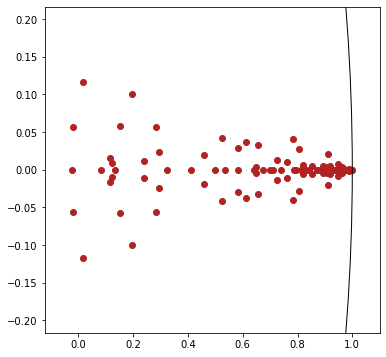

In [ ]:
batch_idx = 0

eigvals, eigvecs = np.linalg.eig(rec_jacs[batch_idx])
e_val_sort = np.argsort(eigvals)
eigvecs = eigvecs[:, e_val_sort]
eigvals = eigvals[e_val_sort]

fig, ax1 = plt.subplots(1, 1, figsize=(6,6))

ax1.scatter(np.real(eigvals), np.imag(eigvals), color=c_vals[0])

unit_circle = plt.Circle((0, 0), 1.0, color='k', fill=False)
ax1.add_patch(unit_circle)

x_max = np.max(np.real(eigvals)) + 0.1
x_min = np.min(np.real(eigvals)) - 0.1
ax1.set_xlim([x_min, x_max])
y_max = np.max(np.abs(np.imag(eigvals))) + 0.1
ax1.set_ylim([-y_max, y_max])


Calculates the integration direction from each sampled Jacobian and averages them together 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: ComplexWarning: Casting complex values to real discards the imaginary part
  


(array([14., 15.,  2.,  3., 10., 14.,  8.,  2., 12., 20.]),
 array([-0.70450696, -0.56480574, -0.42510451, -0.28540328, -0.14570206,
        -0.00600083,  0.1337004 ,  0.27340162,  0.41310285,  0.55280408,
         0.6925053 ]),
 <a list of 10 Patch objects>)

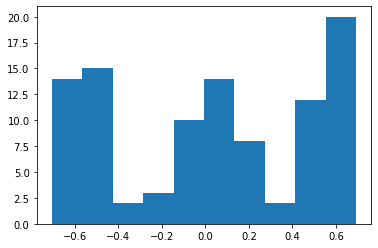

In [ ]:
integration_directions = np.zeros((n_jac_states, net_params['n_hidden'])) 
for batch_idx in range(n_jac_states):
    eigvals, eigvecs = np.linalg.eig(rec_jacs[batch_idx])
    e_val_sort = np.argsort(eigvals)
    eigvecs = eigvecs[:, e_val_sort]
    eigvals = eigvals[e_val_sort]

    integration_directions[batch_idx] = eigvecs[:, -1]

mean_int_dir = np.mean(integration_directions, axis=0)
mean_int_dir = mean_int_dir/np.linalg.norm(mean_int_dir)

mean_dots = np.matmul(integration_directions, mean_int_dir)

plt.hist(mean_dots)

### Capacity

Trains several networks to get robust capacity data

In [ ]:
n_trials = 10

save = True
# save_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/capacitytest_'
save_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/capacitytest_1factor_'

class_counts = (2, 3, 4, 5, 6,)
# class_counts = (4, 5, 6,)

for class_count in class_counts:
    for trial_idx in range(n_trials):
        # Note redefines toy_params internal to the loop so that a new random 
        # set of word vectors will be drawn for each trial
        ########## Toy data parameters ##########
        toy_params = {
            'data_type': 'int', # int, context
            
            'phrase_length': 20,
            'n_classes': class_count,
            'input_type': 'binary',    # one hot, binary, binary1-1
            'input_size': 40,          # defaults to length of words
            'include_eos': True,

            'stack_phrases': False,
            'n_stack': 1,
            'include_sos': False,
            'n_delay': 0, # Inserts delay words between at end of phrase (but before eos trigger)
            'delay_word': '<delay>', # '<delay>' or 'null'

            'uniform_score': True, # Uniform distribution over scores=
        }

        net_params = {
            'netType': 'HebbNet_M', # HebbNet, HebbNet_M, VanillaRNN, GRU, rHebbNet, rHebbNet_M, GHU, GHU_M
            'n_inputs': toy_params['input_size'],           # input dim
            'n_hidden': 3,                                # hidden dim
            'n_outputs': toy_params['n_classes'],         # output dim
            # 'n_outputs': 10,                                # train with larger number of outputs for generalization tests    
            'f_act': 'tanh',         # 1st layer actiivation function # linear, sigmoid, tanh, relu
            'f0_act': 'linear',      # 2nd layer actiivation function
            'trainable_state0': False,
            
            # STPN Features
            'A_act': None,            # Activation on the A update (tanh or None)
            'lam_clamp': 0.95,          # Maximum lambda value
            'eta_type': 'scalar',       # scalar or vector
            'eta_force': None,        # ensure either Hebbian or anti-Hebbian plasticity
            'hebb_type': 'input',      # input, output, inputOutput

            # Train parameters
            'train_mode': 'seq_inf',   # 'seq' or 'seq_inf'
            'weight_reg': 'L1',
            'reg_lambda': 1e-4,
            'hidden_bias': False,
            'ro_bias': False,           # use readout bias or not
            'gradient_clip': 10,
            'freeze_inputs': False,      # freeze the input layer (and hidden bias)
            'sparsification': 0.0,      # Amount to sparsify network's weights (0.0 = no sparsification)
            'noise_type': 'input',      # None, 'input', 'hidden'
            'noise_scale': 0.1,         # Expected magnitude of noise vector
            'cuda': True,
            'accEarlyStop': None,
            'minMaxIter': (-2, 1e7),
            'validEarlyStop': True,     # Early stop when average validation loss saturates
            'seed': 1000 + trial_idx,               # This seed is used to generate training/valid data too

            'train_set_size': 3200,
            'valid_set_size': 500,
            'batch_size': 64,
            'epochs': 1,
        }
        # Keep forgetting to turn this on for RNNs, so just automate it
        net_params['hidden_bias'] = False if net_params['netType'] in ('HebbNet', 'HebbNet_M') else True

        print('Trial: {}'.format(trial_idx))
        verbose = True if trial_idx == 0 else False
        net, toy_params, net_params = train_network(net_params, toy_params, save=save, 
                                                    save_root=save_root, verbose=verbose)


Trial: 0
Toy integration data...
Using CUDA...
Net parameters:
  Net Type: Multiplicative
  Structure: f: tanh // fOut: linear // (Nx, Nh, Ny) = (40, 3, 2)
  No hidden bias // No readout bias // Sparsification: 0.00 // Noise type: input (scl: 1.0e-01)
  A parameters:
    A update: Hebbian // Pre-Syn Only // A Act: linear // Eta: scalar // Lam: scalar // Lambda_max: 0.95
    A0: zeros // A unbounded
Train parameters:
  Loss: XE // LR: 1.00e-03 // Weight reg: L1, coef: 1.0e-04 // Gradient clip: 1.0e+01
Iter:0 grad:2.884 train_loss:0.7071 train_acc:0.469 valid_loss:0.6971 valid_acc:0.494
Iter:50 grad:2.878 train_loss:0.6236 train_acc:0.844 valid_loss:0.6253 valid_acc:0.892
Iter:100 grad:2.938 train_loss:0.5784 train_acc:0.891 valid_loss:0.5624 valid_acc:0.936
Iter:150 grad:3.036 train_loss:0.4939 train_acc:0.938 valid_loss:0.4862 valid_acc:0.954
Iter:200 grad:3.164 train_loss:0.4115 train_acc:0.984 valid_loss:0.4083 valid_acc:0.956
Iter:250 grad:3.303 train_loss:0.3539 train_acc:0.969 val

In [ ]:
# load_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/captest_' # Same word_to_input vector for all trials
load_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/capacitytest_' # Different word_to_input vector for each trial

num_net_types = 5 # Change between plot type (main text vs supplement)

# STPN (in=10)
STPN_10 = ['HebbNet_M[10,3,{}]_train=seq_inf_task=int_{}class_20len'.format(N, N) for N in range(2, 7)]
# Vanilla (in=10)
Vanilla_10 = ['VanillaRNN[10,3,{}]_train=seq_inf_task=int_{}class_20len'.format(N, N) for N in range(2, 7)]
# GRU (in=10)
GRU_10 = ['GRU[10,3,{}]_train=seq_inf_task=int_{}class_20len'.format(N, N) for N in range(2, 7)]
# # STPN (in=50)
# STPN_50 = ['HebbNet_M[50,3,{}]_train=seq_inf_task=int_{}class_20len'.format(N, N) for N in range(2, 7)]
# STPN (in=40) This just reuses the 50 names so I don't need to rename all the variables belows
STPN_50 = ['HebbNet_M[40,3,{}]_train=seq_inf_task=int_{}class_20len'.format(N, N) for N in range(2, 7)] 

STPNA_10 = ['HebbNet[10,3,{}]_train=seq_inf_task=int_{}class_20len'.format(N, N) for N in range(2, 7)]
STPNA_50 = ['HebbNet[40,3,{}]_train=seq_inf_task=int_{}class_20len'.format(N, N) for N in range(2, 7)] 

STPN1_50 = ['1factor_HebbNet_M[40,3,{}]_train=seq_inf_task=int_{}class_20len'.format(N, N) for N in range(2, 7)]

n_trials = 10
init_seed = 1000

test_set_size = 1000

stpn_10_accs = []
vanilla_10_accs = []
gru_10_accs = []
stpna_10_accs = []
stpn1_10_accs = []

# dim 10 inputs
for class_count in range(2, 7):
    print('Class count: {}'.format(class_count))
    stpn_10_accs.append([])
    vanilla_10_accs.append([])
    gru_10_accs.append([])
    stpna_10_accs.append([])
    stpn1_10_accs.append([])

    for trial_idx in range(n_trials):
        # STPN
        load_path = load_root + STPN_10[class_count-2]
        net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
        # print('.   w2i vec:', toy_params_load['word_to_input_vector']['null'][:5])
        testData_10, testOutputMask_10, testRaw, _ = syn.generate_data(
            test_set_size, toy_params_load, net_params_load['n_outputs'],
            raw_data=True, device=torch.device('cpu'), verbose=False)
        db_load = net_load.evaluate_debug(testData_10[:,:,:], batchMask=testOutputMask_10)
        stpn_10_accs[-1].append(db_load['acc'])

        # Vanilla
        load_path = load_root + Vanilla_10[class_count-2]
        net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
        # print('.       w2i vec:', toy_params_load['word_to_input_vector']['null'][:5])
        testData_10, testOutputMask_10, testRaw, _ = syn.generate_data(
            test_set_size, toy_params_load, net_params_load['n_outputs'],
            raw_data=True, device=torch.device('cpu'), verbose=False)
        db_load = net_load.evaluate_debug(testData_10[:,:,:], batchMask=testOutputMask_10)
        vanilla_10_accs[-1].append(db_load['acc'])
        
        # GRU
        load_path = load_root + GRU_10[class_count-2]
        net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
        # print('.       w2i vec:', toy_params_load['word_to_input_vector']['null'][:5])
        testData_10, testOutputMask_10, testRaw, _ = syn.generate_data(
            test_set_size, toy_params_load, net_params_load['n_outputs'],
            raw_data=True, device=torch.device('cpu'), verbose=False)
        db_load = net_load.evaluate_debug(testData_10[:,:,:], batchMask=testOutputMask_10)
        gru_10_accs[-1].append(db_load['acc'])

        if num_net_types > 3:
            # STPNA
            load_path = load_root + STPNA_10[class_count-2]
            net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
            # print('.   w2i vec:', toy_params_load['word_to_input_vector']['null'][:5])
            testData_10, testOutputMask_10, testRaw, _ = syn.generate_data(
                test_set_size, toy_params_load, net_params_load['n_outputs'],
                raw_data=True, device=torch.device('cpu'), verbose=False)
            db_load = net_load.evaluate_debug(testData_10[:,:,:], batchMask=testOutputMask_10)
            stpna_10_accs[-1].append(db_load['acc'])

        # if num_net_types > 4:
        #     # STPN1
        #     load_path = load_root + STPN1_10[class_count-2]
        #     net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
        #     # print('.   w2i vec:', toy_params_load['word_to_input_vector']['null'][:5])
        #     testData_10, testOutputMask_10, testRaw, _ = syn.generate_data(
        #         test_set_size, toy_params_load, net_params_load['n_outputs'],
        #         raw_data=True, device=torch.device('cpu'), verbose=False)
        #     db_load = net_load.evaluate_debug(testData_10[:,:,:], batchMask=testOutputMask_10)
        #     stpn1_10_accs[-1].append(db_load['acc'])

stpn_50_accs = []
stpna_50_accs = []
stpn1_50_accs = []
# vanilla_10_accs = []

# dim 50 inputs
for class_count in range(2, 7):
    print('Class count: {}'.format(class_count))
    stpn_50_accs.append([])
    stpna_50_accs.append([])
    stpn1_50_accs.append([])
    # vanilla_10_accs.append([])

    for trial_idx in range(n_trials):
        # STPN
        load_path = load_root + STPN_50[class_count-2]
        net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
        testData_50, testOutputMask_50, testRaw, _ = syn.generate_data(
            test_set_size, toy_params_load, net_params_load['n_outputs'],
            raw_data=True, device=torch.device('cpu'), verbose=False)
        db_load = net_load.evaluate_debug(testData_50[:,:,:], batchMask=testOutputMask_50)
        stpn_50_accs[-1].append(db_load['acc'])

        # # Vanilla
        # load_path = load_root + Vanilla_10[class_count-2]
        # net_load, _, _ = load_net(load_path, init_seed+trial_idx)
        # db_load = net_load.evaluate_debug(testData_10[:,:,:], batchMask=testOutputMask_10)
        # vanilla_10_accs[-1].append(db_load['acc'])
        if num_net_types > 3:
            load_path = load_root + STPNA_50[class_count-2]
            net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
            testData_50, testOutputMask_50, testRaw, _ = syn.generate_data(
                test_set_size, toy_params_load, net_params_load['n_outputs'],
                raw_data=True, device=torch.device('cpu'), verbose=False)
            db_load = net_load.evaluate_debug(testData_50[:,:,:], batchMask=testOutputMask_50)
            stpna_50_accs[-1].append(db_load['acc'])

        if num_net_types > 4:
            # STPN1
            load_path = load_root + STPN1_50[class_count-2]
            net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
            testData_50, testOutputMask_50, testRaw, _ = syn.generate_data(
                test_set_size, toy_params_load, net_params_load['n_outputs'],
                raw_data=True, device=torch.device('cpu'), verbose=False)
            db_load = net_load.evaluate_debug(testData_50[:,:,:], batchMask=testOutputMask_50)
            stpn1_50_accs[-1].append(db_load['acc'])
            
stpn_10_accs = np.array(stpn_10_accs)
vanilla_10_accs = np.array(vanilla_10_accs)
gru_10_accs = np.array(gru_10_accs)
stpn_50_accs = np.array(stpn_50_accs)

stpna_10_accs = np.array(stpna_10_accs)
stpna_50_accs = np.array(stpna_50_accs)
stpn1_50_accs = np.array(stpn1_50_accs)

Class count: 2
Class count: 3
Class count: 4
Class count: 5
Class count: 6
Class count: 2
Class count: 3
Class count: 4
Class count: 5
Class count: 6


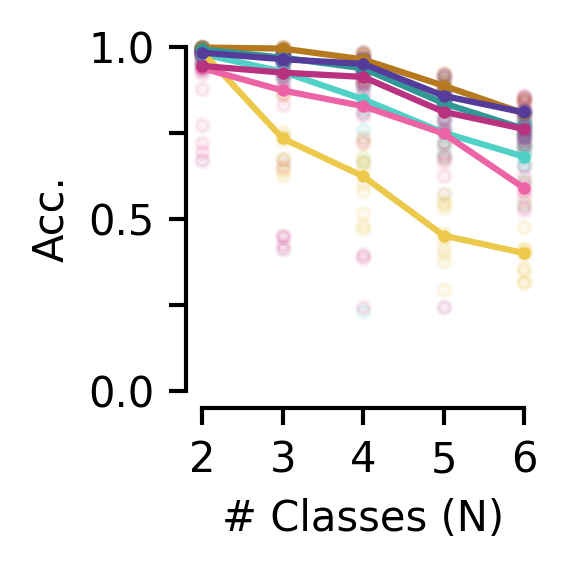

In [ ]:
fig, ax1 = plt.subplots(1, 1, figsize=(2, 2))

class_counts = [2, 3, 4, 5, 6]

# Teal v4, yellow v5, yellow v7, Teal v6, pink v5, pink v7, purple v8
cap_colors = ('#4fd1c5', '#ecc94b', '#b7791f', '#319795', '#ed64a6', '#b83280', '#553c9a',)

def plot_accs(ax, class_counts, net_accs, label='', c_idx=0):
    """
    Plots network accuacies 

    INPUTS:
    net_accs: (len(class_counts), n_trials)
    """
    N_SE = 2

    mean_accs = np.mean(net_accs, axis=-1)
    median_accs = np.median(net_accs, axis=-1)
    std_accs = np.std(net_accs, axis=-1)

    # ax.fill_between(class_counts, mean_accs-N_SE*std_accs,
    #                 mean_accs+N_SE*std_accs, color=c_vals_l[c_idx],
    #                 alpha=0.3, zorder=0)
    ax.plot(class_counts, median_accs,
            color=cap_colors[c_idx], label=label, marker='.', zorder=5)
    
    for class_idx, class_count in enumerate(class_counts):
        ax.scatter(class_count * np.ones(net_accs[class_idx].shape), 
                   net_accs[class_idx], color=cap_colors[c_idx], 
                   marker='.', zorder=-1, alpha=0.1)

plot_accs(ax1, class_counts, stpn_10_accs, label='STPN_10', c_idx=0)
plot_accs(ax1, class_counts, vanilla_10_accs, label='Vanilla_10', c_idx=1)
plot_accs(ax1, class_counts, gru_10_accs, label='GRU_10', c_idx=2)
plot_accs(ax1, class_counts, stpn_50_accs, label='STPN_50', c_idx=3)

if num_net_types > 3:
    plot_accs(ax1, class_counts, stpna_10_accs, label='STPNA_10', c_idx=4)
    plot_accs(ax1, class_counts, stpna_50_accs, label='STPNA_50', c_idx=5)
if num_net_types > 4:
    plot_accs(ax1, class_counts, stpn1_50_accs, label='STPN1_50', c_idx=6)

# ax1.legend()

ax1.set_xlabel('# Classes (N)')
ax1.set_ylabel('Acc.')
ax1.set_xticks(class_counts)

ax1.set_xlim((2,6))
ax1.set_xticks((2, 3, 4, 5, 6))

ax1.set_ylim((0.0, 1.0))
ax1.set_yticks((0.0, 0.25, 0.5, 0.75, 1.0))
ax1.set_yticklabels((0.0, None, 0.5, None, 1.0))

jetplot.breathe(ax=ax1)

#### **Sequence Length**

Just raw training for a given sequence length (as opposed to bootstrapping which is below)

In [ ]:
save = True
# save_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cap_length_'
save_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cap_length_1factor_'

n_trials = 10

n_pl = 7
phrase_lengths = np.logspace(np.log10(10), np.log10(200), n_pl)
phrase_lengths = [int(pl) for pl in phrase_lengths]
phrase_lengths = [73, 121, 200,]
print('Phrase lengths:', phrase_lengths)

for pl_idx, phrase_length in enumerate(phrase_lengths):
    print('------ Runnig for phrase length: {} ------'.format(phrase_length))
    for trial_idx in range(n_trials):
        # Note redefines toy_params internal to the loop so that a new random 
        # set of word vectors will be drawn for each trial
        ########## Toy data parameters ##########
        toy_params = {
            'data_type': 'int', # int, context
            
            'phrase_length': phrase_length,
            'n_classes': 2,
            'input_type': 'binary',    # one hot, binary, binary1-1
            'input_size': 10,          # defaults to length of words
            'include_eos': True,

            'stack_phrases': False,
            'n_stack': 1,
            'include_sos': False,
            'n_delay': 0, # Inserts delay words between at end of phrase (but before eos trigger)
            'delay_word': '<delay>', # '<delay>' or 'null'

            'uniform_score': True, # Uniform distribution over scores=
        }

        net_params = {
            'netType': 'HebbNet_M', # HebbNet, HebbNet_M, VanillaRNN, GRU, rHebbNet, rHebbNet_M, GHU, GHU_M
            'n_inputs': toy_params['input_size'],           # input dim
            'n_hidden': 3,                                # hidden dim
            'n_outputs': toy_params['n_classes'],         # output dim
            # 'n_outputs': 10,                                # train with larger number of outputs for generalization tests    
            'f_act': 'tanh',         # 1st layer actiivation function # linear, sigmoid, tanh, relu
            'f0_act': 'linear',      # 2nd layer actiivation function
            'trainable_state0': False,
            
            # STPN Features
            'A_act': None,            # Activation on the A update (tanh or None)
            'lam_clamp': 0.95,          # Maximum lambda value
            'eta_type': 'scalar',       # scalar or vector
            'eta_force': None,        # ensure either Hebbian or anti-Hebbian plasticity
            'hebb_type': 'input',      # input, output, inputOutput

            # Train parameters
            'train_mode': 'seq_inf',   # 'seq' or 'seq_inf'
            'weight_reg': 'L1',
            'reg_lambda': 1e-4,
            'hidden_bias': False,
            'ro_bias': False,           # use readout bias or not
            'gradient_clip': 10,
            'freeze_inputs': False,      # freeze the input layer (and hidden bias)
            'sparsification': 0.0,      # Amount to sparsify network's weights (0.0 = no sparsification)
            'noise_type': 'input',      # None, 'input', 'hidden'
            'noise_scale': 0.1,         # Expected magnitude of noise vector
            'cuda': True,
            'accEarlyStop': None,
            'minMaxIter': (-2, 1e7),
            'validEarlyStop': True,     # Early stop when average validation loss saturates
            'seed': 1009 + trial_idx,               # This seed is used to generate training/valid data too

            'train_set_size': 3200,
            'valid_set_size': 500,
            'batch_size': 64,
            'epochs': 1,
        }
        # Keep forgetting to turn this on for RNNs, so just automate it
        net_params['hidden_bias'] = False if net_params['netType'] in ('HebbNet', 'HebbNet_M') else True

        print('Trial: {}'.format(trial_idx))
        verbose = True if trial_idx == 0 else False
        net, toy_params, net_params = train_network(net_params, toy_params, save=save, 
                                                    save_root=save_root, verbose=verbose)

Phrase lengths: [73, 121, 200]
------ Runnig for phrase length: 73 ------
Trial: 0
Toy integration data...
Using CUDA...
Net parameters:
  Net Type: Multiplicative
  Structure: f: tanh // fOut: linear // (Nx, Nh, Ny) = (10, 3, 2)
  No hidden bias // No readout bias // Sparsification: 0.00 // Noise type: input (scl: 1.0e-01)
  A parameters:
    A update: Hebbian // Pre-Syn Only // A Act: linear // Eta: scalar // Lam: scalar // Lambda_max: 0.95
    A0: zeros // A unbounded
Train parameters:
  Loss: XE // LR: 1.00e-03 // Weight reg: L1, coef: 1.0e-04 // Gradient clip: 1.0e+01
Iter:0 grad:3.641 train_loss:1.2442 train_acc:0.562 valid_loss:0.9913 valid_acc:0.550
Iter:50 grad:3.574 train_loss:0.6805 train_acc:0.641 valid_loss:0.6559 valid_acc:0.582
Iter:100 grad:3.558 train_loss:0.5510 train_acc:0.656 valid_loss:0.5605 valid_acc:0.622
Iter:150 grad:3.574 train_loss:0.3391 train_acc:0.844 valid_loss:0.4658 valid_acc:0.758
Iter:200 grad:3.588 train_loss:0.4004 train_acc:0.844 valid_loss:0.4146

Load all the networks and gather accuracies

In [ ]:
load_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cap_length_' # Different word_to_input vector for each trial

n_pl = 7
phrase_lengths = np.logspace(np.log10(10), np.log10(200), n_pl)
phrase_lengths = [int(pl) for pl in phrase_lengths]

num_net_types = 5 # Change between plot type (main text vs supplement)

# STPN (in=10)
STPN_10 = ['HebbNet_M[10,3,2]_train=seq_inf_task=int_2class_{}len'.format(pl) for pl in phrase_lengths]
# Vanilla (in=10)
Vanilla_10 = ['VanillaRNN[10,3,2]_train=seq_inf_task=int_2class_{}len'.format(pl) for pl in phrase_lengths]
# GRU (in=10)
GRU_10 = ['GRU[10,3,2]_train=seq_inf_task=int_2class_{}len'.format(pl) for pl in phrase_lengths]
# STPN (in=10)
STPNA_10 = ['HebbNet[10,3,2]_train=seq_inf_task=int_2class_{}len'.format(pl) for pl in phrase_lengths]
# STPN1 (in=10)
STPN1_10 = ['1factor_HebbNet_M[10,3,2]_train=seq_inf_task=int_2class_{}len'.format(pl) for pl in phrase_lengths]

n_trials = 11 # Really only 10, see below
init_seed = 1000
init_seed_1factor = 1009 # For some reason started 1 factor data at seed 1009

test_set_size = 1000

stpn_10_accs = []
vanilla_10_accs = []
gru_10_accs = []
stpna_10_accs = []
stpn1_10_accs = []

# dim 10 inputs
for pl_idx, phrase_length in enumerate(phrase_lengths):
    print('Phrase length: {}'.format(phrase_length))
    stpn_10_accs.append([])
    vanilla_10_accs.append([])
    gru_10_accs.append([])
    stpna_10_accs.append([])
    stpn1_10_accs.append([])

    for trial_idx in range(n_trials):
        # STPN
        if trial_idx != 3: # This was a particularly bad trial across the board so skipping
            load_path = load_root + STPN_10[pl_idx]
            net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
            # print('.   w2i vec:', toy_params_load['word_to_input_vector']['null'][:5])
            testData_10, testOutputMask_10, testRaw, _ = syn.generate_data(
                test_set_size, toy_params_load, net_params_load['n_outputs'],
                raw_data=True, device=torch.device('cpu'), verbose=False)
            db_load = net_load.evaluate_debug(testData_10[:,:,:], batchMask=testOutputMask_10)
            stpn_10_accs[-1].append(db_load['acc'])

        if trial_idx < 10: # Trial idx 10 is only used for STPN
            # Vanilla
            load_path = load_root + Vanilla_10[pl_idx]
            net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
            # print('.       w2i vec:', toy_params_load['word_to_input_vector']['null'][:5])
            testData_10, testOutputMask_10, testRaw, _ = syn.generate_data(
                test_set_size, toy_params_load, net_params_load['n_outputs'],
                raw_data=True, device=torch.device('cpu'), verbose=False)
            db_load = net_load.evaluate_debug(testData_10[:,:,:], batchMask=testOutputMask_10)
            vanilla_10_accs[-1].append(db_load['acc'])
            
            # GRU
            load_path = load_root + GRU_10[pl_idx]
            net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
            # print('.       w2i vec:', toy_params_load['word_to_input_vector']['null'][:5])
            testData_10, testOutputMask_10, testRaw, _ = syn.generate_data(
                test_set_size, toy_params_load, net_params_load['n_outputs'],
                raw_data=True, device=torch.device('cpu'), verbose=False)
            db_load = net_load.evaluate_debug(testData_10[:,:,:], batchMask=testOutputMask_10)
            gru_10_accs[-1].append(db_load['acc'])

            # STPNA
            if num_net_types > 3:
                load_path = load_root + STPNA_10[pl_idx]
                net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
                # print('.   w2i vec:', toy_params_load['word_to_input_vector']['null'][:5])
                testData_10, testOutputMask_10, testRaw, _ = syn.generate_data(
                    test_set_size, toy_params_load, net_params_load['n_outputs'],
                    raw_data=True, device=torch.device('cpu'), verbose=False)
                db_load = net_load.evaluate_debug(testData_10[:,:,:], batchMask=testOutputMask_10)
                stpna_10_accs[-1].append(db_load['acc'])
            # STPN1 (note different starting seed)
            if num_net_types > 4:
                load_path = load_root + STPN1_10[pl_idx]
                net_load, net_params_load, toy_params_load = load_net(load_path, init_seed_1factor+trial_idx)
                # print('.   w2i vec:', toy_params_load['word_to_input_vector']['null'][:5])
                testData_10, testOutputMask_10, testRaw, _ = syn.generate_data(
                    test_set_size, toy_params_load, net_params_load['n_outputs'],
                    raw_data=True, device=torch.device('cpu'), verbose=False)
                db_load = net_load.evaluate_debug(testData_10[:,:,:], batchMask=testOutputMask_10)
                stpn1_10_accs[-1].append(db_load['acc'])

stpn_10_accs = np.array(stpn_10_accs)
vanilla_10_accs = np.array(vanilla_10_accs)
gru_10_accs = np.array(gru_10_accs)
stpna_10_accs = np.array(stpna_10_accs)
stpn1_10_accs = np.array(stpn1_10_accs)

Phrase length: 10
Phrase length: 16
Phrase length: 27
Phrase length: 44
Phrase length: 73
Phrase length: 121
Phrase length: 200


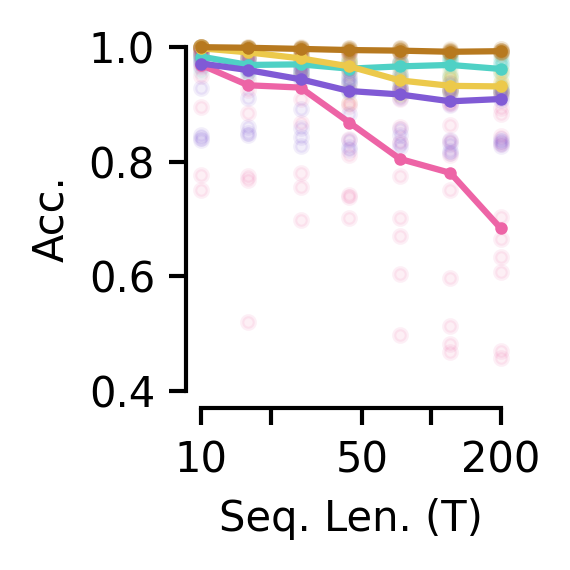

In [ ]:
fig, ax1 = plt.subplots(1, 1, figsize=(2, 2))

# Teal v4, yellow v5, yellow v7, pink v5, purple v6
cap_colors = ('#4fd1c5', '#ecc94b', '#b7791f', '#ed64a6', c_vals[3],)

def plot_accs(ax, phrase_lengths, net_accs, label='', c_idx=0):
    """
    Plots network accuacies 

    INPUTS:
    net_accs: (len(class_counts), n_trials)
    """
    N_SE = 2

    mean_accs = np.mean(net_accs, axis=-1)
    median_accs = np.median(net_accs, axis=-1)
    std_accs = np.std(net_accs, axis=-1)

    # ax.fill_between(class_counts, mean_accs-N_SE*std_accs,
    #                 mean_accs+N_SE*std_accs, color=c_vals_l[c_idx],
    #                 alpha=0.3, zorder=0)
    ax.plot(phrase_lengths, median_accs,
            color=cap_colors[c_idx], label=label, marker='.', zorder=5)
    
    for pl_idx, phrase_length in enumerate(phrase_lengths):
        ax.scatter(phrase_length * np.ones(net_accs[pl_idx].shape), 
                   net_accs[pl_idx], color=cap_colors[c_idx], 
                   marker='.', zorder=-1, alpha=0.1)

plot_accs(ax1, phrase_lengths, stpn_10_accs, label='STPN_10', c_idx=0)
plot_accs(ax1, phrase_lengths, vanilla_10_accs, label='Vanilla_10', c_idx=1)
plot_accs(ax1, phrase_lengths, gru_10_accs, label='GRU_10', c_idx=2)
if num_net_types > 3:
    plot_accs(ax1, phrase_lengths, stpna_10_accs, label='STPNA_10', c_idx=3)
if num_net_types > 4:
    plot_accs(ax1, phrase_lengths, stpn1_10_accs, label='STPN1_10', c_idx=4)
# ax1.legend()

ax1.set_xlabel('Seq. Len. (T)')
ax1.set_ylabel('Acc.')

ax1.set_xlim((10, 200))
ax1.set_xscale('log')
ax1.set_xticks((10, 20, 50, 100, 200))
ax1.set_xticklabels((10, None, 50, None, 200))

if num_net_types > 3:
    ax1.set_ylim((0.4, 1.0))
    ax1.set_yticks((0.4, 0.6, 0.8, 1.0))
    # ax1.set_yticklabels((0.9, None, None, None, 1.0))
# ax1.set_yticks((0.9, .925, .95, .975, 1.0))
# ax1.set_yticklabels((0.9, None, None, None, 1.0))
else:
    ax1.set_ylim((0.0, 1.0))
    ax1.set_yticks((0.0, .25, .5, .75, 1.0))
    ax1.set_yticklabels((0.0, None, 0.5, None, 1.0))

jetplot.breathe(ax=ax1)

Bootstrapped training (mostly used for VanillaRNNs because they're not good at training for long sequence lengths)

In [ ]:
bootstrap = True
length_it = 10
init_length = 20

n_trials = 1
test_set_size = 1000
acc_thresh = 0.95

save = False
save_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/captest_'

for trial_idx in range(n_trials):
    # Note redefines toy_params internal to the loop so that a new random 
    # set of word vectors will be drawn for each trial
    ########## Toy data parameters ##########
    toy_params = {
        'data_type': 'int', # int, context
        
        'phrase_length': init_length,
        'n_classes': 2,
        'input_type': 'binary',    # one hot, binary, binary1-1
        'input_size': 10,          # defaults to length of words
        'include_eos': True,

        'stack_phrases': False,
        'n_stack': 1,
        'include_sos': False,
        'n_delay': 0, # Inserts delay words between at end of phrase (but before eos trigger)
        'delay_word': '<delay>', # '<delay>' or 'null'

        'uniform_score': True, # Uniform distribution over scores=
    }

    net_params = {
        'netType': 'HebbNet_M', # HebbNet, HebbNet_M, VanillaRNN, GRU, rHebbNet, rHebbNet_M, GHU, GHU_M
        'n_inputs': toy_params['input_size'],           # input dim
        'n_hidden': 3,                                # hidden dim
        'n_outputs': toy_params['n_classes'],         # output dim
        # 'n_outputs': 10,                                # train with larger number of outputs for generalization tests    
        'f_act': 'tanh',         # 1st layer actiivation function # linear, sigmoid, tanh, relu
        'f0_act': 'linear',      # 2nd layer actiivation function
        'trainable_state0': False,
        
        # STPN Features
        'A_act': None,            # Activation on the A update (tanh or None)
        'lam_clamp': 0.95,          # Maximum lambda value
        'eta_type': 'scalar',       # scalar or vector
        'eta_force': None,        # ensure either Hebbian or anti-Hebbian plasticity
        'hebb_type': 'inputOutput',      # input, output, inputOutput

        # Train parameters
        'train_mode': 'seq_inf',   # 'seq' or 'seq_inf'
        'weight_reg': 'L1',
        'reg_lambda': 1e-4,
        'hidden_bias': False,
        'ro_bias': False,           # use readout bias or not
        'gradient_clip': 10,
        'freeze_inputs': False,      # freeze the input layer (and hidden bias)
        'sparsification': 0.0,      # Amount to sparsify network's weights (0.0 = no sparsification)
        'noise_type': 'input',      # None, 'input', 'hidden'
        'noise_scale': 0.1,         # Expected magnitude of noise vector
        'cuda': True,
        'validEarlyStop': True,     # Early stop when average validation loss saturates
        'seed': 2005 + trial_idx,   # This seed is used to generate training/valid data too

        'train_set_size': 3200,
        'valid_set_size': 500,
        'batch_size': 64,
        'epochs': 1,
    }
    # Keep forgetting to turn this on for RNNs, so just automate it
    net_params['hidden_bias'] = False if net_params['netType'] in ('HebbNet', 'HebbNet_M') else True

    print('Trial: {}'.format(trial_idx))
    verbose = True if trial_idx == 0 else False
    # First call will initialize the new network and set the initial seed
    net, toy_params, net_params = train_network(net_params, toy_params, save=save, 
                                                save_root=save_root, verbose=verbose)
    
    testData, testOutputMask, _, _ = syn.generate_data(
            test_set_size, toy_params, net_params['n_outputs'],
            raw_data=True, device=net.w1.device)
    
    db = net.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)

    while db['acc'] > acc_thresh:
        toy_params['phrase_length'] += length_it
        print('  Acc: {:.2f}, Iterating sequence length to: {}'.format(
            db['acc'], toy_params['phrase_length']))

        # Later calls keep the same network
        net, toy_params, net_params = train_network(
            net_params, toy_params, save=save, current_net=net, set_seed=False,
            save_root=save_root, verbose=verbose
        )

        testData, testOutputMask, _, _ = syn.generate_data(
            test_set_size, toy_params, net_params['n_outputs'],
            raw_data=True, device=net.w1.device)
        db = net.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)

    print('Threshold not met - acc {:.2f}, final seq_len {}'.format(
        db['acc'], toy_params['phrase_length']
    ))

Trial: 0
Toy integration data...
Using CUDA...
Net parameters:
  Net Type: Multiplicative
  Structure: f: tanh // fOut: linear // (Nx, Nh, Ny) = (10, 3, 2)
  No hidden bias // No readout bias // Sparsification: 0.00 // Noise type: input (scl: 1.0e-01)
  A parameters:
    A update: Hebbian // A Act: linear // Eta: scalar // Lambda_max: 0.95
    A0: zeros
Train parameters:
  Loss: XE // LR: 1.00e-03 // Weight reg: L1, lambda: 1.0e-02 // Gradient clip: 1.0e+01
Iter:0 grad:2.831 train_loss:0.6806 train_acc:0.531 valid_loss:0.6898 valid_acc:0.502
Iter:50 grad:2.811 train_loss:0.6800 train_acc:0.531 valid_loss:0.6829 valid_acc:0.502
Iter:100 grad:2.817 train_loss:0.6909 train_acc:0.453 valid_loss:0.6787 valid_acc:0.502
Iter:150 grad:2.834 train_loss:0.6715 train_acc:0.500 valid_loss:0.6729 valid_acc:0.502
Iter:200 grad:2.868 train_loss:0.6778 train_acc:0.438 valid_loss:0.6676 valid_acc:0.502
Iter:250 grad:2.926 train_loss:0.6595 train_acc:0.484 valid_loss:0.6564 valid_acc:0.546
Iter:300 grad

KeyboardInterrupt: ignored

### **Generalization**

#### **Different sequence lenghts**

Generalization by changing the phrase lengths

In [ ]:
testDatas = []
testMasks = []

phrase_lengths = np.arange(10, 70)
pl_accs = []

n_samples = 200

original_pharse_len = np.copy(toy_params['phrase_length'])

for len_idx, phrase_len in enumerate(phrase_lengths):
    toy_params['phrase_length'] = phrase_len
    testData, testOutputMask, _ = syn.generate_data(n_samples, toy_params, net_params['n_outputs'], auto_balance=False)

    testDatas.append(testData)
    testMasks.append(testOutputMask)
    
    db_len = net.evaluate_debug(testData[0:n_samples,:,:], batchMask=testOutputMask)

    pl_accs.append(db_len['acc'])

noise_vars = np.logspace(-2, 1, 20)
noise_accs = []

for noise_idx, noise_var in enumerate(noise_vars):

    toy_params['noise_var'] = noise_var
    testData, testOutputMask = syn.generate_data(n_samples, toy_params, net_params['n_outputs'], auto_balance=False)

    testDatas.append(testData)
    testMasks.append(testOutputMask)
    
    db_noise = net.evaluate_debug(testData[0:n_samples,:,:], batchMask=testOutputMask)

    noise_accs.append(db_noise['acc'])


# Resets phrase lengths
toy_params['phrase_length'] = original_pharse_len

Synthentic data generated in: 0.08 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
Synthentic data generated in: 0.08 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
Synthentic data generated in: 0.09 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
Synthentic data generated in: 0.09 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
Synthentic data generated in: 0.11 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
Synthentic data generated in: 0.09 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
Synthentic data generated in: 0.11 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
Synthentic data generated in: 0.11 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
Synthentic data generated in: 0.11 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
Synthentic data generated in: 0.12 sec. Autobalanced: False. Uniform scor

Text(0.5, 1.0, '(A + W)x In Noise Acc')

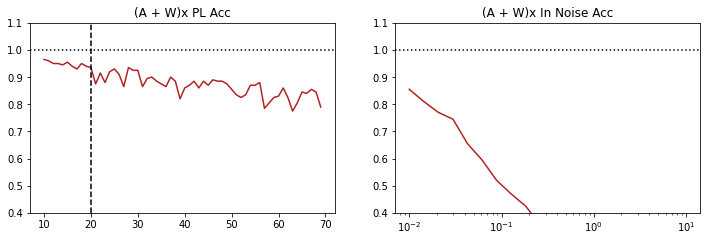

In [ ]:
if net_params['netType'] == 'HebbNet':
    plot_color = c_vals[0]
    plot_title = '(A + W)x'
elif net_params['netType'] == 'HebbNet_M':
    plot_color = c_vals[2]
    plot_title = '(A * W)x'
elif net_params['netType'] == 'VanillaRNN':
    plot_color = c_vals[1]  
    plot_title = 'Vanilla RNN'

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,3.5))
ax1.plot(phrase_lengths, pl_accs, color=plot_color)

ax2.plot(noise_vars, noise_accs, color=plot_color)

ax1.axvline(toy_params['phrase_length'], color='k', linestyle='dashed')

ax1.axhline(1.0, color='k', linestyle='dotted')
ax1.set_ylim([0.4, 1.1])

ax2.axhline(1.0, color='k', linestyle='dotted')
ax2.set_ylim([0.4, 1.1])
ax2.set_xscale('log')

ax1.set_title(plot_title + ' PL Acc')
ax2.set_title(plot_title + ' In Noise Acc')

#### **New Word Dynamics**

For a network trained on an 2-class task, what do the dynamics of a new word look like relative to the trained words?

In [ ]:
n_trials = 1

save = True
save_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/newwords_delay_'

for trial_idx in range(n_trials):
    # Note redefines toy_params internal to the loop so that a new random 
    # set of word vectors will be drawn for each trial
    ########## Toy data parameters ##########
    toy_params = {
        'data_type': 'int', # int, context
        
        'phrase_length': 40,
        'n_classes': 2,
        'input_type': 'binary',    # one hot, binary, binary1-1
        'input_size': 50,          # defaults to length of words
        'include_eos': True,

        'stack_phrases': False,
        'n_stack': 1,
        'include_sos': False,
        'n_delay': 20, # Inserts delay words between at end of phrase (but before eos trigger)
        'delay_word': '<delay>', # '<delay>' or 'null'

        'uniform_score': True, # Uniform distribution over scores=
    }

    net_params = {
        'netType': 'GRU', # HebbNet, HebbNet_M, VanillaRNN, GRU, rHebbNet, rHebbNet_M, GHU, GHU_M
        'n_inputs': toy_params['input_size'],           # input dim
        'n_hidden': 100,                                # hidden dim
        'n_outputs': toy_params['n_classes'],         # output dim
        # 'n_outputs': 10,                                # train with larger number of outputs for generalization tests    
        'f_act': 'tanh',         # 1st layer actiivation function # linear, sigmoid, tanh, relu
        'f0_act': 'linear',      # 2nd layer actiivation function
        'trainable_state0': False,
        
        # STPN Features
        'A_act': None,            # Activation on the A update (tanh or None)
        'lam_clamp': 0.95,          # Maximum lambda value
        'eta_type': 'scalar',       # scalar or vector
        'eta_force': None,        # ensure either Hebbian or anti-Hebbian plasticity
        'hebb_type': 'inputOutput',      # input, output, inputOutput

        # Train parameters
        'train_mode': 'seq_inf',   # 'seq' or 'seq_inf'
        'weight_reg': 'L1',
        'reg_lambda': 1e-4,
        'hidden_bias': False,
        'ro_bias': False,           # use readout bias or not
        'gradient_clip': 10,
        'freeze_inputs': False,      # freeze the input layer (and hidden bias)
        'sparsification': 0.0,      # Amount to sparsify network's weights (0.0 = no sparsification)
        'noise_type': 'input',      # None, 'input', 'hidden'
        'noise_scale': 0.1,         # Expected magnitude of noise vector
        'cuda': True,
        'validEarlyStop': False,     # Early stop when average validation loss saturates
        'minMaxIter': (2000, 1e7),
        'accEarlyStop': 0.98,        # 
        'seed': 1001 + trial_idx,    # This seed is used to generate training/valid data too

        'train_set_size': 3200,
        'valid_set_size': 500,
        'batch_size': 64,
        'epochs': 1,
    }
    # Keep forgetting to turn this on for RNNs, so just automate it
    net_params['hidden_bias'] = False if net_params['netType'] in ('HebbNet', 'HebbNet_M') else True

    print('Trial: {}'.format(trial_idx))
    verbose = True if trial_idx == 0 else False
    net, toy_params, net_params = train_network(net_params, toy_params, save=save, 
                                                save_root=save_root, verbose=verbose)


Trial: 0
Toy integration data...
Using CUDA...
Net parameters:
  Net Type: GRU
  Structure: f: tanh // fOut: linear // (Nx, Nh, Ny) = (50, 100, 2)
  Hidden bias: trainable // No readout bias // Sparsification: 0.00 // Noise type: input (scl: 1.0e-01)
  h0: zeros
Train parameters:
  Loss: XE // LR: 1.00e-03 // Weight reg: L1, coef: 1.0e-02 // Gradient clip: 1.0e+01
Iter:0 grad:22.569 train_loss:1.0182 train_acc:0.484 valid_loss:0.7338 valid_acc:0.536
Iter:50 grad:16.706 train_loss:0.9025 train_acc:0.609 valid_loss:0.7267 valid_acc:0.464
Iter:100 grad:12.504 train_loss:0.8303 train_acc:0.453 valid_loss:0.7088 valid_acc:0.534
Iter:150 grad:10.050 train_loss:0.7692 train_acc:0.562 valid_loss:0.7174 valid_acc:0.464
Iter:200 grad:8.939 train_loss:0.7703 train_acc:0.359 valid_loss:0.7006 valid_acc:0.544
Iter:250 grad:8.262 train_loss:0.7569 train_acc:0.453 valid_loss:0.7084 valid_acc:0.464
Iter:300 grad:7.726 train_loss:0.7331 train_acc:0.562 valid_loss:0.7076 valid_acc:0.464
Iter:350 grad:7.

KeyboardInterrupt: ignored

In [ ]:
import copy

# load_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/newwords_' # Different word_to_input vector for each trial

# path = ['HebbNet_M[50,100,2]_train=seq_inf_task=int_2class_20len',] # STPN
# # path = ['GRU[50,100,2]_train=seq_inf_task=int_2class_20len',] # GRU
# seed = 1000 # non-delay seed

load_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_samero_delay_'
path = ['HebbNet_M[50,100,2]_train=seq_inf_task=int_2class_40len',]
# path = ['GRU[50,100,2]_train=seq_inf_task=int_2class_40len',]
seed = 1001 # delay seed

test_set_size = 1000
    
load_path = load_root + path[0]
net_load, net_params_load, toy_params_load = load_net(load_path,seed)
testData_2, testOutputMask_2, _, _ = syn.generate_data(
    test_set_size, toy_params_load, net_params_load['n_outputs'],
    raw_data=True, device=torch.device('cpu'))
db_load_2 = net_load.evaluate_debug(testData_2[:,:,:], batchMask=testOutputMask_2)
hs_load_2 = db_load_2['h'].numpy()
ro_matrix = np.array(net_load.w2.detach().cpu())

toy_params_3 = copy.deepcopy(toy_params_load)
toy_params_3['words'].insert(2, 'evid2')
toy_params_3['n_classes'] += 1

print('original word_set:', toy_params_load['words'])
print('new word_set:', toy_params_3['words'])
print('new num classes:', toy_params_3['n_classes'])

# Generates the base word values again so that the data generator knows how to correctly score phrases with the new word.
toy_params_3['base_word_vals'] = syn.baseWordValues(toy_params_3)
toy_params_3['classes'] = ['class'+str(i) for i in range(toy_params_3['n_classes'])]

# Generates a new set of input vectors but only keeps the last one
new_input_vecs = syn.generateInputVectors(toy_params_3)
# Checks for the very small chance there is a repeat
for word in toy_params_3['word_to_input_vector']:
    if (toy_params_3['word_to_input_vector'][word] == new_input_vecs['evid2']).all():
        raise ValueError('Generated a repeat of a current input vector!')
toy_params_3['word_to_input_vector']['evid2'] = new_input_vecs['evid2']

# Generates new data, with output dim = 3, but note the number of outputs is 
# still only 2, so its not possible for the network to even give a new answer f
# or the new class, and so accuracy will be low.
testData_3, testOutputMask_3, raw_3, _ = syn.generate_data(
    test_set_size, toy_params_3, net_params_load['n_outputs']+1,
    raw_data=True, device=torch.device('cpu'))
    
db_load_3 = net_load.evaluate_debug(testData_3[:,:,:], batchMask=testOutputMask_3)
labels_3 = np.array(testData_3[:,:,:][1][:, -1, 0].cpu())
print('New acc: {:.3f}'.format(db_load_3['acc']))

Synthentic data generated in: 0.31 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
original word_set: ['evid0', 'evid1', 'null', '<eos>', '<delay>']
new word_set: ['evid0', 'evid1', 'evid2', 'null', '<eos>', '<delay>']
new num classes: 3
Synthentic data generated in: 0.83 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
New acc: 0.675


Separability in final states

In [ ]:
# state = db_load_3['h'].cpu().numpy() # GRU
state = db_load_3['A'].cpu().numpy() # STPN
state = state.reshape((state.shape[0], state.shape[1], -1))

final_state = []
avg_final_state = np.zeros((3, state.shape[-1]))
for label_idx in range(3):
    final_state.append(state[labels_3==label_idx, -1, :])
    avg_final_state[label_idx] = np.mean(final_state[-1], axis=0)

pairs = ((0, 1), (0, 2), (1, 2))

for pair in pairs:
    print('Pair: {} and {}'.format(pair[0], pair[1]))
    print('  Avg diff: {:.3f}'.format(
        np.linalg.norm(
            (avg_final_state[pair[0]] - avg_final_state[pair[1]])/
            (1/2*np.linalg.norm(avg_final_state[pair[0]])+
             1/2*np.linalg.norm(avg_final_state[pair[1]]))
        )
    ))

Pair: 0 and 1
  Avg diff: 0.633
Pair: 0 and 2
  Avg diff: 0.448
Pair: 1 and 2
  Avg diff: 0.486


Decoding accuracy when a new word is introduced.

In [ ]:
# load_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_samero' # Same readout, update only evid
load_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_samero_delay_' # Same readout, update only evid, with delay

n_classes = 2

pc_comps = 100
n_trials = 20
init_seed = 1001
test_set_size = 1000

# 2nd dim:
#   0: init acc
#   1: post-train orig acc
#   2: post-train new acc
n_folds = 10
stpn_decode_accs = np.zeros((n_trials, n_folds))
gru_decode_accs = np.zeros((n_trials, n_folds))

# No delay:
# STPN_cf = ['HebbNet_M[50,100,{}]_train=seq_inf_task=int_{}class_20len'.format(n_classes, n_classes),]
# GRU_cf = ['GRU[50,100,{}]_train=seq_inf_task=int_{}class_20len'.format(n_classes, n_classes),]
# Delay:
STPN_cf = ['HebbNet_M[50,100,{}]_train=seq_inf_task=int_{}class_40len'.format(n_classes, n_classes),]
GRU_cf = ['GRU[50,100,{}]_train=seq_inf_task=int_{}class_40len'.format(n_classes, n_classes),]
    
for trial_idx in range(n_trials):
    print('Trial_idx:', trial_idx)
    for net_idx in range(2):
        if net_idx == 0: # STPN
            load_path = load_root + STPN_cf[0]
        elif net_idx == 1: # GRU
            load_path = load_root + GRU_cf[0]
            
        net_load, net_params_load, toy_params_load = load_net(load_path, init_seed + trial_idx)
        # testData_2, testOutputMask_2, _, _ = syn.generate_data(
        #     test_set_size, toy_params_load, net_params_load['n_outputs'],
        #     raw_data=True, device=torch.device('cpu'))
        # db_load_2 = net_load.evaluate_debug(testData_2[:,:,:], batchMask=testOutputMask_2)
        # hs_load_2 = db_load_2['h'].numpy()
        # ro_matrix = np.array(net_load.w2.detach().cpu())

        toy_params_3 = copy.deepcopy(toy_params_load)
        toy_params_3['words'].insert(2, 'evid2')
        toy_params_3['n_classes'] += 1

        # Generates the base word values again so that the data generator knows how to correctly score phrases with the new word.
        toy_params_3['base_word_vals'] = syn.baseWordValues(toy_params_3)
        toy_params_3['classes'] = ['class'+str(i) for i in range(toy_params_3['n_classes'])]

        # Generates a new set of input vectors but only keeps the last one
        new_input_vecs = syn.generateInputVectors(toy_params_3)
        # Checks for the very small chance there is a repeat
        for word in toy_params_3['word_to_input_vector']:
            if (toy_params_3['word_to_input_vector'][word] == new_input_vecs['evid2']).all():
                raise ValueError('Generated a repeat of a current input vector!')
        toy_params_3['word_to_input_vector']['evid2'] = new_input_vecs['evid2']

        # Generates new data, with output dim = 3, but note the number of outputs is 
        # still only 2, so its not possible for the network to even give a new answer f
        # or the new class, and so accuracy will be low.
        testData_3, testOutputMask_3, raw_3, _ = syn.generate_data(
            test_set_size, toy_params_3, net_params_load['n_outputs']+1,
            raw_data=True, device=torch.device('cpu'), verbose=False)
            
        db_load_3 = net_load.evaluate_debug(testData_3[:,:,:], batchMask=testOutputMask_3)
        labels_3 = np.array(testData_3[:,:,:][1][:, -1, 0].cpu())
        # print('  New acc: {:.3f}'.format(db_load_3['acc']))

        if net_idx == 0: # STPN
            As_3 = db_load_3['A'].cpu().numpy()
            As_3_flat = As_3.reshape((As_3.shape[0], As_3.shape[1], -1))
            As_3_pca = np.zeros((As_3_flat.shape[0], As_3_flat.shape[1], pc_comps))

            a_PCA = PCA(n_components=pc_comps)
            a_PCA.fit(As_3_flat.reshape((-1, As_3_flat.shape[-1])))   
            for batch_idx in range(As_3.shape[0]):
                As_3_pca[batch_idx] = a_PCA.transform(As_3_flat[batch_idx])
    
            stpn_decode_accs[trial_idx] = decode_activity(As_3_pca[:, 39:40, :], labels_3, n_folds=n_folds, verbose=False)
            print('  STPN Decode acc: {:.3f}'.format(np.mean(stpn_decode_accs[trial_idx], axis=-1)))
        elif net_idx == 1: # GRU
            gru_decode_accs[trial_idx] = decode_activity(db_load_3['h'].cpu().numpy()[:, 39:40, :], labels_3, n_folds=n_folds, verbose=False)
            print('  GRU Decode acc: {:.3f}'.format(np.mean(gru_decode_accs[trial_idx], axis=-1)))

Trial_idx: 0
  STPN Decode acc: 0.998
  GRU Decode acc: 0.730
Trial_idx: 1
  STPN Decode acc: 1.000
  GRU Decode acc: 0.775
Trial_idx: 2
  STPN Decode acc: 0.998
  GRU Decode acc: 0.811
Trial_idx: 3
  STPN Decode acc: 0.999
  GRU Decode acc: 0.763
Trial_idx: 4
  STPN Decode acc: 1.000
  GRU Decode acc: 0.851
Trial_idx: 5
  STPN Decode acc: 0.999
  GRU Decode acc: 0.821
Trial_idx: 6
  STPN Decode acc: 1.000
  GRU Decode acc: 0.882
Trial_idx: 7
  STPN Decode acc: 0.999
  GRU Decode acc: 0.849
Trial_idx: 8
  STPN Decode acc: 0.999
  GRU Decode acc: 0.838
Trial_idx: 9
  STPN Decode acc: 0.999
  GRU Decode acc: 0.801
Trial_idx: 10
  STPN Decode acc: 1.000
  GRU Decode acc: 0.758
Trial_idx: 11
  STPN Decode acc: 0.999
  GRU Decode acc: 0.894
Trial_idx: 12
  STPN Decode acc: 1.000
  GRU Decode acc: 0.824
Trial_idx: 13
  STPN Decode acc: 0.996
  GRU Decode acc: 0.796
Trial_idx: 14
  STPN Decode acc: 0.996
  GRU Decode acc: 0.836
Trial_idx: 15
  STPN Decode acc: 0.996
  GRU Decode acc: 0.774
Tr

STPN: 0.998 (s.e. 0.0004)
GRU: 0.812 (s.e. 0.0094)


NameError: ignored

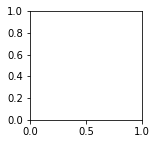

In [ ]:
fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))

# Mean over folds
mean_stpn_decode_accs = np.mean(stpn_decode_accs, axis=-1)
mean_gru_decode_accs = np.mean(gru_decode_accs, axis=-1)
print('STPN: {:.3f} (s.e. {:.4f})'.format(
    np.mean(mean_stpn_decode_accs), np.std(mean_stpn_decode_accs)/np.sqrt(n_trials)))
print('GRU: {:.3f} (s.e. {:.4f})'.format(
    np.mean(mean_gru_decode_accs), np.std(mean_gru_decode_accs)/np.sqrt(n_trials)))

plot_locs = (1, 2)

lam_colors = (jetplot.colors.yellow.v7, jetplot.colors.teal.v4,)

ax1.scatter(plot_locs[1], np.mean(mean_gru_decode_accs), color=lam_colors[0], marker='_',
            zorder=0)
ax1.scatter(plot_locs[0], np.mean(mean_stpn_decode_accs), color=lam_colors[1], marker='_', 
            zorder=1)
ax1.scatter(plot_locs[1]*np.ones((n_trials,)),
            mean_gru_decode_accs, color=lam_colors[0], alpha=0.3, 
            marker='.', zorder=-1)
ax1.scatter(plot_locs[0]*np.ones((n_trials,)),
            mean_stpn_decode_accs, color=lam_colors[1], alpha=0.3, 
            marker='.', zorder=-1)

ax1.set_xlim((0.5, 2.5))
ax1.set_xticks((1, 2))
ax1.set_xticklabels((None, None))
ax1.set_xlabel('Net. Type')

ax1.set_ylabel('Decode Acc.')
ax1.set_ylim((0.6, 1.0))
ax1.set_yticks((0.6, 0.7, 0.8, 0.9, 1.0))
ax1.set_yticklabels((0.6, None, 0.8, None, 1.0))
ax1.axhline(2/3, color='k', linewidth=0.75, linestyle='dotted')

jetplot.breathe(ax=ax1)

A state projection for new word sets (only works for STPNs). Fits the projectino to either the 2 or 3-class A values but plots the 3-class A values



In [ ]:
# Flatten matrix dimensions (but not batch and seq)
proj_fit = '3' # '2' or '3'
projection_type = 'PCA' # 'PCA', 'time_PCA'
pc_comps = 200

# Adds A0 as initial state for all sequences
As_2 = db_load_2['A'].cpu().numpy()
A0 = net_load.A0.cpu().numpy()
A0_batch = np.repeat(A0[np.newaxis, np.newaxis, :, :], As_2.shape[0], axis=0)
As_2 = np.concatenate((A0_batch, As_2), axis=1)

As_3 = db_load_3['A'].cpu().numpy()
A0_batch = np.repeat(A0[np.newaxis, np.newaxis, :, :], As_3.shape[0], axis=0)
As_3 = np.concatenate((A0_batch, As_3), axis=1)

As_2_flat = As_2.reshape((As_2.shape[0], As_2.shape[1], As_2.shape[2]*As_2.shape[3]))
As_3_flat = As_3.reshape((As_3.shape[0], As_3.shape[1], As_3.shape[2]*As_3.shape[3]))

As_3_pca = np.zeros((As_3_flat.shape[0], As_3_flat.shape[1], pc_comps))
if projection_type == 'PCA':
    a_PCA = PCA(n_components=pc_comps)

    if proj_fit == '2':
        a_PCA.fit(As_2_flat.reshape((-1, As_2_flat.shape[-1])))
    elif proj_fit == '3':
        a_PCA.fit(As_3_flat.reshape((-1, As_3_flat.shape[-1])))   
    for batch_idx in range(As_3.shape[0]):
        As_3_pca[batch_idx] = a_PCA.transform(As_3_flat[batch_idx])

elif projection_type == 'time_PCA':
    if proj_fit == '2':
        As_2_pca, proj_matrix, center_vector = timeAndPCAProject(As_2_flat, pc_comps=pc_comps)

        for batch_idx in range(As_3.shape[0]):
            As_3_pca[batch_idx] = np.matmul(As_3_flat[batch_idx] - center_vector, proj_matrix.T)
    elif proj_fit == '3':
        As_3_pca, proj_matrix, center_vector = timeAndPCAProject(As_3_flat, pc_comps=pc_comps)

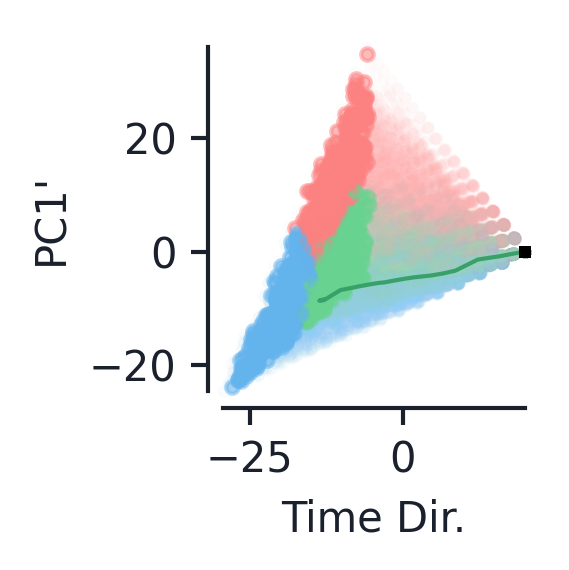

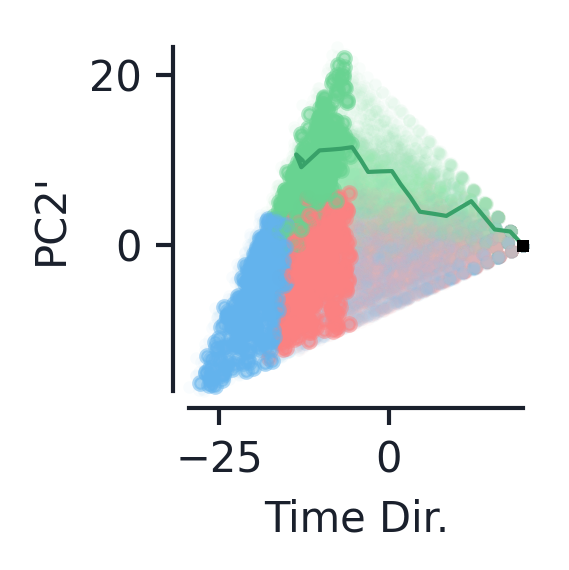

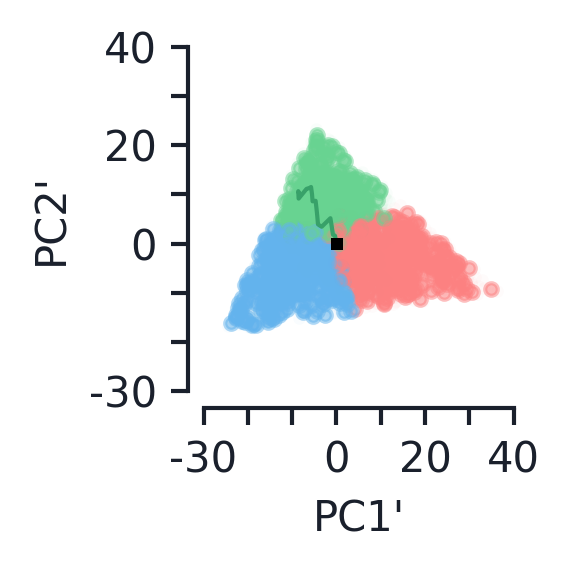

In [ ]:
color_type = 'labels' # 'labels', 'words', 'seq_idx'

fig1, ax1 = plt.subplots(1, 1, figsize=(2, 2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2, 2))
fig3, ax3 = plt.subplots(1, 1, figsize=(2, 2))

pcxs = (0, 0, 1)
pcys = (1, 2, 2)
# pcxs = (0, 1, 2)
# pcys = (3, 3, 3)

for ax, pcx, pcy in zip((ax1, ax2, ax3), pcxs, pcys):
    for batch_idx in range(As_3.shape[0]):
        ax.scatter(As_3_pca[batch_idx, :, pcx], As_3_pca[batch_idx, :, pcy], linewidth=0.0,
                   marker='.', color=c_vals_l[labels_3[batch_idx]], zorder=0, alpha=0.05)
        ax.scatter(As_3_pca[batch_idx, -1, pcx], As_3_pca[batch_idx, -1, pcy], marker='.',
                   color=c_vals_ld[labels_3[batch_idx]], zorder=1, alpha=0.5)

    for batch_idx in (12,):
        ax.plot(As_3_pca[batch_idx, :, pcx], As_3_pca[batch_idx, :, pcy], 
                color=c_vals[labels_3[batch_idx]], marker=None, zorder=2, linewidth=1.0)
   
    # Initial point (only uses first batch)
    ax.plot(As_3_pca[0, 0, pcx], As_3_pca[0, 0, pcy], marker='s',
            color='k', zorder=10, markersize=3.0)

    pcx_lab = 'Time Dir.' if pcx == 0 else 'PC{}\''.format(pcx)
    pcy_lab = 'Time Dir.' if pcy == 0 else 'PC{}\''.format(pcy)
    # pcx_lab = 'Time Dir.' if pcx == 0 else '$\Delta$PC{}'.format(pcx)
    # pcy_lab = 'Time Dir.' if pcy == 0 else '$\Delta$PC{}'.format(pcy)
    ax.set_xlabel(pcx_lab)
    ax.set_ylabel(pcy_lab)


# if color_type == 'labels':
#     ax2.set_title('A_t PC plots (color by phrase label)')
# elif color_type == 'words':
#     ax2.set_title('A_t PC plots (color by input word)')
# elif color_type == 'seq_idx':
#     ax2.set_title('A_t PC plots (color by sequence location)')

ax3.set_xlim((-30, 40))
ax3.set_xticks((-30, -20, -10, 0, 10, 20, 30, 40))
ax3.set_xticklabels((-30, None, None, 0, None, 20, None, 40))

ax3.set_ylim((-30, 40))
ax3.set_yticks((-30, -20, -10, 0, 10, 20, 30, 40))
ax3.set_yticklabels((-30, None, None, 0, None, 20, None, 40))

for ax in (ax1, ax2, ax3):
    jetplot.breathe(ax=ax)

EoS projections (STPN only)

PCA shape: (1000, 20, 100)
Variances: ['0.83', '0.29', '0.13', '0.02', '0.01', '0.00', '0.00', '0.00', '0.00', '0.00']
PR: 2.07


Text(0.5, 1.0, '<eos> projection')

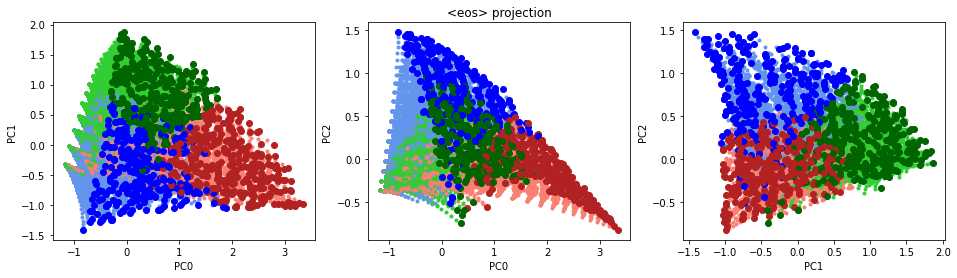

In [ ]:
raise ValueError('This needs to be adapted to the code above.')

word_proj = '<eos>' 
# word_proj = 'evid0' 

h_new_word = HebbNet_word_proj(word_proj, db_new['A'], net, toy_params_m)
# hs_spec_eos = HebbNet_word_proj(word_proj, db_special['A'], net, toy_params)

h_new_word_PCA = PCA(n_components=100)

h_new_word_PCA.fit(h_new_word.reshape((-1, h_new_word.shape[-1])))
h_new_word_pca = np.zeros(h_new_word.shape)
# hs_spec_eos_pca = np.zeros(hs_spec.shape)

for batch_idx in range(h_new_word.shape[0]):
    h_new_word_pca[batch_idx] = h_new_word_PCA.transform(h_new_word[batch_idx])
# for batch_idx in range(hs_spec.shape[0]):
#     hs_spec_eos_pca[batch_idx] = h_eos_PCA.transform(hs_spec_eos[batch_idx])

ro_matrix_new_word_pca = h_new_word_PCA.transform(ro_matrix)

print('PCA shape:', h_new_word_pca.shape)
print('Variances:', ['{:.2f}'.format(var) for var in h_new_word_PCA.explained_variance_[:10]])
print('PR: {:.2f}'.format(
    participation_ratio_vector(h_new_word_PCA.explained_variance_)))

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4))

pcxs = (0, 0, 1)
pcys = (1, 2, 2)

ax_lim = None

for ax, pcx, pcy in zip((ax1, ax2, ax3), pcxs, pcys):

    for batch_idx in range(h_new_word.shape[0]):
        ax.plot(h_new_word_pca[batch_idx, :, pcx], h_new_word_pca[batch_idx, :, pcy], linewidth=0.0,
                marker='.', color=c_vals_l[labels_new[batch_idx]], zorder=-5)
        ax.plot(h_new_word_pca[batch_idx, -1, pcx], h_new_word_pca[batch_idx, -1, pcy], marker='o',
                color=c_vals[labels_new[batch_idx]], zorder=0)
        
    # for batch_idx in range(hs_spec.shape[0]):
    #     ax.plot(hs_spec_eos_pca[batch_idx, :, pcx], hs_spec_eos_pca[batch_idx, :, pcy], 
    #             color=c_vals[batch_idx], marker='.')

    # for ro_idx in range(net_params['n_outputs']):
    #     ax.plot([0, ro_matrix_new_word_pca[ro_idx, pcx]], [0, ro_matrix_new_word_pca[ro_idx, pcy]],
    #             color=c_vals[ro_idx], linewidth=3.0)

    ax.set_xlabel('PC{}'.format(pcx))
    ax.set_ylabel('PC{}'.format(pcy))

    if ax_lim is not None:
        ax.set_xlim((-ax_lim, ax_lim,))
        ax.set_ylim((-ax_lim, ax_lim,))

ax2.set_title('{} projection'.format(word_proj))

Raw hidden state plotting for new word sets

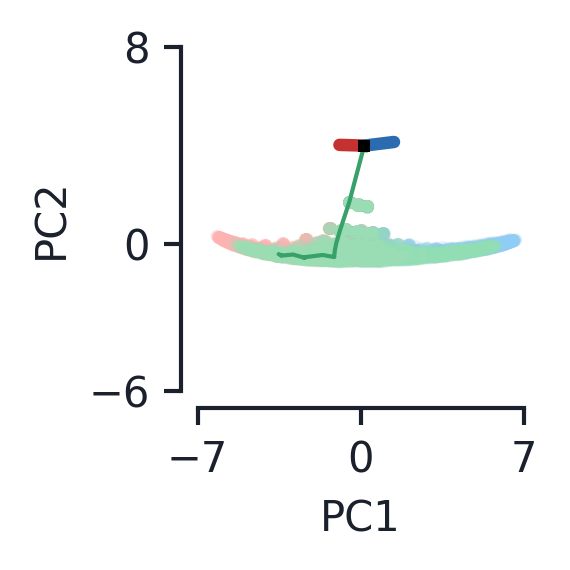

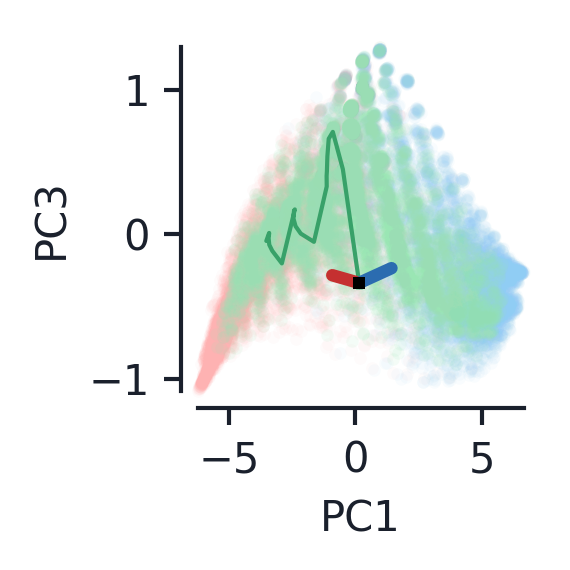

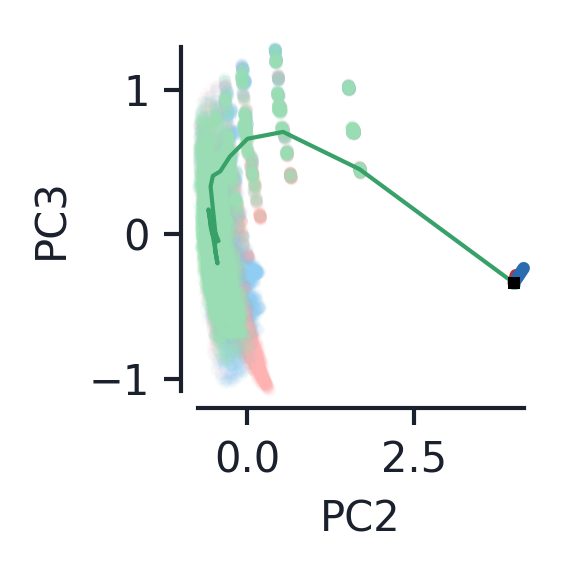

In [ ]:
proj_fit = '3' # '2' or '3'

hs_2 = db_load_2['h'].numpy()
hs_3 = db_load_3['h'].numpy()

if net_params_load['netType'] in ('VanillaRNN', 'GRU'):
    h0 = net_load.h0.cpu().numpy()
    h0_batch = np.repeat(h0[np.newaxis, np.newaxis, :], hs_2.shape[0], axis=0)
    hs_2 = np.concatenate((h0_batch, hs_2), axis=1)
    h0_batch = np.repeat(h0[np.newaxis, np.newaxis, :], hs_3.shape[0], axis=0)
    hs_3 = np.concatenate((h0_batch, hs_3), axis=1)

hs_PCA = PCA(n_components=100)

if proj_fit == '2':
    hs_PCA.fit(hs_2.reshape((-1, hs_2.shape[-1])))
elif proj_fit == '3':
    hs_PCA.fit(hs_3.reshape((-1, hs_3.shape[-1])))
hs_3_pca = np.zeros(hs_3.shape)

for batch_idx in range(hs_3.shape[0]):
    hs_3_pca[batch_idx] = hs_PCA.transform(hs_3[batch_idx])

ro_matrix_pca = hs_PCA.transform(ro_matrix)
zeros_matrix_pca = hs_PCA.transform(np.zeros_like(ro_matrix))

fig1, ax1 = plt.subplots(1, 1, figsize=(2, 2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2, 2))
fig3, ax3 = plt.subplots(1, 1, figsize=(2, 2))

pcxs = (0, 0, 1)
pcys = (1, 2, 2)
# pcxs = (0, 1, 2)
# pcys = (3, 3, 3)

for ax, pcx, pcy in zip((ax1, ax2, ax3), pcxs, pcys):
    for batch_idx in range(hs_3.shape[0]):
        if labels_3[batch_idx] == 2:
            ax.plot(hs_3_pca[batch_idx, :, pcx], hs_3_pca[batch_idx, :, pcy], linewidth=0.0,
                    marker='.', color=c_vals_l[labels_3[batch_idx]], zorder=1, alpha=0.1)
        else:
            ax.plot(hs_3_pca[batch_idx, :, pcx], hs_3_pca[batch_idx, :, pcy], linewidth=0.0,
                    marker='.', color=c_vals_l[labels_3[batch_idx]], zorder=0, alpha=0.05)
        # ax.plot(hs_3_pca[batch_idx, -1, pcx], hs_3_pca[batch_idx, -1, pcy], marker='o',
        #         color=c_vals[labels_3[batch_idx]], zorder=0)

    for batch_idx in (2,):
        ax.plot(hs_3_pca[batch_idx, :, pcx], hs_3_pca[batch_idx, :, pcy], 
                color=c_vals[batch_idx], zorder=2, linewidth=1.0)

    # Initial hidden (only well-defined for RNNs)
    if net_params_load['netType'] in ('VanillaRNN', 'GRU'):
        ax.plot(hs_3_pca[0, 0, pcx], hs_3_pca[0, 0, pcy], marker='s',
                color='k', zorder=50, markersize=3)

    for ro_idx in range(net_params_load['n_outputs']):
        ax.plot([zeros_matrix_pca[ro_idx, pcx], ro_matrix_pca[ro_idx, pcx]], 
                 [zeros_matrix_pca[ro_idx, pcy], ro_matrix_pca[ro_idx, pcy]],
                 color=c_vals_dl[ro_idx], linewidth=3.0)

    ax.set_xlabel('PC{}'.format(pcx+1))
    ax.set_ylabel('PC{}'.format(pcy+1))

    # ax.set_aspect(1.0, adjustable='datalim')

# ax2.set_title('Hidden state PC plots')
ax1.set_xlim((-7, 7))
ax1.set_xticks((-7, 0, 7))
ax1.set_ylim((-6, 8))
ax1.set_yticks((-6, 0, 8))

for ax in (ax1, ax2, ax3):
    jetplot.breathe(ax=ax)

#### **New Words Train**

Trains a network on gradually more and more words

In [ ]:
n_trials = 1

n_start_classes = 2
n_end_classes = 10

# Threshold to be achieved 
init_acc_thresh = 0.98
valid_acc_thresh = 0.95

save = False
save_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/newwordstrain_test_'

for trial_idx in range(n_trials):
    # Note redefines toy_params internal to the loop so that a new random 
    # set of word vectors will be drawn for each trial
    ########## Toy data parameters ##########
    toy_params = {
        'data_type': 'int', # int, context
        
        'phrase_length': 20,
        'n_classes': n_start_classes,
        'input_type': 'binary',    # one hot, binary, binary1-1
        'input_size': 50,          # defaults to length of words
        'include_eos': True,

        'stack_phrases': False,
        'n_stack': 1,
        'include_sos': False,
        'n_delay': 0, # Inserts delay words between at end of phrase (but before eos trigger)
        'delay_word': '<delay>', # '<delay>' or 'null'

        'uniform_score': True, # Uniform distribution over scores=
    }

    net_params = {
        'netType': 'GRU', # HebbNet, HebbNet_M, VanillaRNN, GRU, rHebbNet, rHebbNet_M, GHU, GHU_M
        'n_inputs': toy_params['input_size'],           # input dim
        'n_hidden': 100,                                # hidden dim
        'n_outputs': n_end_classes,         # train with larger number of outputs for generalization tests    
        'f_act': 'tanh',         # 1st layer actiivation function # linear, sigmoid, tanh, relu
        'f0_act': 'linear',      # 2nd layer actiivation function
        'trainable_state0': False,
        
        # STPN Features
        'A_act': None,            # Activation on the A update (tanh or None)
        'lam_clamp': 0.95,          # Maximum lambda value
        'eta_type': 'scalar',       # scalar or vector
        'eta_force': None,        # ensure either Hebbian or anti-Hebbian plasticity
        'hebb_type': 'inputOutput',      # input, output, inputOutput

        # Train parameters
        'train_mode': 'seq_inf',   # 'seq' or 'seq_inf'
        'weight_reg': None, # None, 'L1', or 'L2'
        'reg_lambda': 1e-5,
        'hidden_bias': False,
        'ro_bias': False,           # use readout bias or not
        'gradient_clip': 1000,
        'freeze_inputs': False,      # freeze the input layer (and hidden bias)
        'sparsification': 0.0,      # Amount to sparsify network's weights (0.0 = no sparsification)
        'noise_type': 'input',      # None, 'input', 'hidden'
        'noise_scale': 0.1,         # Expected magnitude of noise vector
        'cuda': True,
        'validEarlyStop': False,     # Early stop when average validation loss saturates
        'accEarlyStop': init_acc_thresh,   
        'seed': 1002 + trial_idx,    # This seed is used to generate training/valid data too

        'train_set_size': 3200,
        'valid_set_size': 500,
        'batch_size': 64,
        'epochs': 1,
    }
    # Keep forgetting to turn this on for RNNs, so just automate it
    net_params['hidden_bias'] = False if net_params['netType'] in ('HebbNet', 'HebbNet_M') else True

    print('Trial: {}'.format(trial_idx))
    verbose = True if trial_idx == 0 else False

    # This is the initial train at 2-classes
    net, toy_params, net_params = train_network(net_params, toy_params, save=save, 
                                                save_root=save_root, verbose=verbose)
    
    # For subsequent class trains, lower batch size to get more accurate count of number of examples
    net_params['batch_size'] = 1
    # A little more lenient on accuracy thresholds later on
    net_params['accEarlyStop'] = valid_acc_thresh

    net_next = copy.deepcopy(net)
    toy_params_next = copy.deepcopy(toy_params)

    for n_classes in range(n_start_classes+1, n_end_classes+1):
        print(f'Classes count: {n_classes}')
        n_class_idx = n_classes - (n_start_classes + 1)

        new_word = f'evid{n_classes-1}'
        toy_params_next['words'].insert(n_classes-1, new_word)
        toy_params_next['n_classes'] = n_classes

        print('  New word_set:', toy_params_next['words'])
        
        # Generates the base word values again so that the data generator knows how to correctly score phrases with the new word.
        toy_params_next['base_word_vals'] = syn.baseWordValues(toy_params_next)
        toy_params_next['classes'] = ['class'+str(i) for i in range(toy_params_next['n_classes'])]
        
        # Generates a new set of input vectors but only keeps the last one
        new_input_vecs = syn.generateInputVectors(toy_params_next)
        # Checks for the very small chance there is a repeat
        for word in toy_params_next['word_to_input_vector']:
            if (toy_params_next['word_to_input_vector'][word] == new_input_vecs[new_word]).all():
                raise ValueError('Generated a repeat of a current input vector!')
        toy_params_next['word_to_input_vector'][new_word] = new_input_vecs[new_word]

        net_next, toy_params_next, net_params = train_network(
            net_params, toy_params_next, current_net=net_next, save=save, 
            set_seed=False, save_root=save_root, verbose=verbose)

Trial: 0
Toy integration data...
Using CUDA...
Net parameters:
  Net Type: GRU
  Structure: f: tanh // fOut: linear // (Nx, Nh, Ny) = (50, 100, 10)
  Hidden bias: trainable // No readout bias // Sparsification: 0.00 // Noise type: input (scl: 1.0e-01)
  h0: zeros
Train parameters:
  Loss: XE // LR: 1.00e-03 // Weight reg: None // Gradient clip: 1.0e+03
Iter:0 grad:29.649 train_loss:2.0063 train_acc:0.000 valid_loss:2.0047 valid_acc:0.000
Iter:50 grad:30.030 train_loss:0.3596 train_acc:0.844 valid_loss:0.2994 valid_acc:0.982
Iter:100 grad:30.261 train_loss:0.0710 train_acc:0.969 valid_loss:0.0407 valid_acc:0.998
Iter:150 grad:30.359 train_loss:0.0222 train_acc:1.000 valid_loss:0.0301 valid_acc:0.990
Iter:200 grad:30.447 train_loss:0.0148 train_acc:1.000 valid_loss:0.0159 valid_acc:0.996
Iter:250 grad:30.530 train_loss:0.0076 train_acc:1.000 valid_loss:0.0167 valid_acc:0.990
Iter:300 grad:30.593 train_loss:0.0237 train_acc:0.984 valid_loss:0.0094 valid_acc:1.000
Iter:350 grad:30.654 trai

[0, 14, 65, 113, 183, 285, 372, 483, 581]


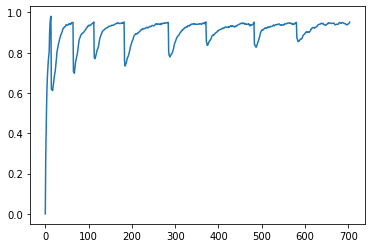

In [ ]:

print(net_next.hist['monitor_thresh'])

plt.plot(net_next.hist['avg_valid_acc'])

In [ ]:
import copy

n_start_classes = toy_params['n_classes']

assert n_start_classes != n_end_classes

# Threshold to be achieved 
valid_acc_thresh = 0.95

iter_new_classes = []

train_set_size = 10000 
test_set_size = 200
batch_size = 1
epochs_per_class = 60

net_m = copy.deepcopy(net)
toy_params_m = copy.deepcopy(toy_params)

dbs = []
net_ms = []

# Get data of trained network
validData, validOutputMask, _ = syn.generate_data(test_set_size, toy_params_m, net_params['n_outputs'], auto_balance=False)
dbs.append(net_m.evaluate_debug(validData[0:test_set_size,:,:], batchMask=validOutputMask))
net_ms.append(copy.deepcopy(net_m))

for n_classes in range(n_start_classes+1, n_end_classes+1):
    
    n_class_idx = n_classes - (n_start_classes + 1)

    toy_params_m['words'].insert(n_classes-1, f'evid{n_classes-1}')
    toy_params_m['n_classes'] = n_classes

    print('new word_set:', toy_params_m['words'])

    # Creates new input vector by generating a new set of input vectors but only keeps the last one
    raise NotImplementedError('Need to fix code below now that word_to_input_vector is dict')
    new_input_vecs = syn.generateInputVectors(toy_params_m)[-1:]
    toy_params_m['word_to_input_vector'] = np.concatenate(
        (toy_params_m['word_to_input_vector'], new_input_vecs),
        axis=0)

    toy_params_m['base_word_vals'] = syn.baseWordValues(toy_params_m)
    toy_params_m['classes'] = ['class'+str(i) for i in range(toy_params_m['n_classes'])]

    # Updates number of epochs
    epochs = net_m.hist['epoch'] + epochs_per_class

    iter_new_classes.append(net_m.hist['iter'])

    #train
    if net_params['train_mode'] == 'seq':
        
        trainData, trainOutputMask, _ = syn.generate_data(train_set_size, toy_params_m, net_params['n_outputs'], auto_balance=False)
        validData, validOutputMask, _ = syn.generate_data(test_set_size, toy_params_m, net_params['n_outputs'], auto_balance=False)

        # Runs fit on copied network, now with a validation stop threshold
        _ = net_m.fit('sequence', epochs=epochs, trainData=trainData, batchSize=batch_size,
                      validBatch=validData[0:test_set_size,:,:], earlyStop=False, learningRate=1e-3,
                      monitorFreq=100, validStopThres=net_params['accEarlyStop'],
                      trainOutputMask=trainOutputMask, validOutputMask=validOutputMask)
        
        dbs.append(net_m.evaluate_debug(validData[0:test_set_size,:,:], batchMask=validOutputMask))
        net_ms.append(copy.deepcopy(net_m))
    else:
        raise ValueError


Synthentic data generated in: 0.12 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True


RuntimeError: ignored

Transition locations: [2000, 6200, 12000, 17100, 23300, 30900, 43400] 49500


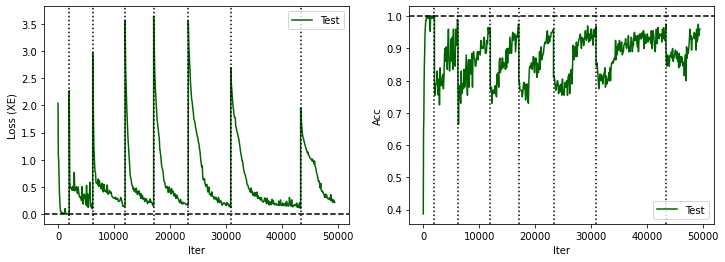

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,4))

# ax1.plot(net_m.hist['train_loss'], color=c_vals[0], label='Train')
ax1.plot(net_m.hist['iters_monitor'], net_m.hist['valid_loss'], color=c_vals[1], label='Test')
ax2.plot(net_m.hist['iters_monitor'], net_m.hist['valid_acc'], color=c_vals[1], label='Test')

for thresh in iter_new_classes:
    ax1.axvline(thresh, color='k', linestyle='dotted')
    ax2.axvline(thresh, color='k', linestyle='dotted')

ax1.set_xlabel('Iter')
ax1.set_ylabel('Loss (XE)')
ax1.legend()
ax1.axhline(0.0, color='k', linestyle='dashed')

ax2.set_xlabel('Iter')
ax2.set_ylabel('Acc')
ax2.legend()
ax2.axhline(1.0, color='k', linestyle='dashed')

print('Transition locations:', iter_new_classes, net_m.hist['iters_monitor'][-1])

Calcualtes whats changings between trains

In [ ]:
delta_class_counts

array([ 4,  5,  6,  7,  8,  9, 10, 11])

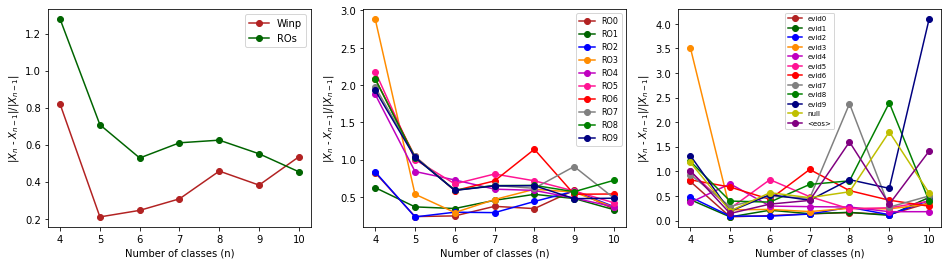

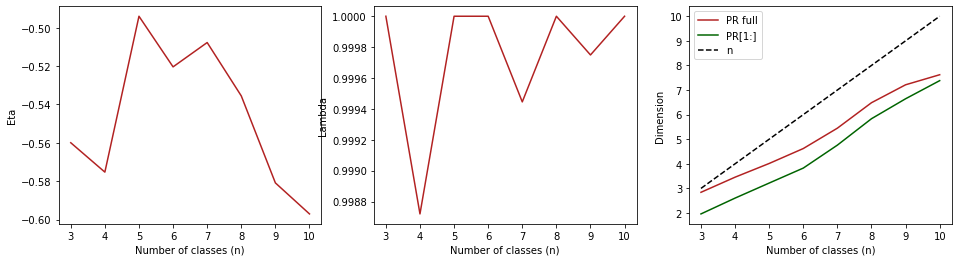

In [ ]:
n_trains = len(dbs)

winps = np.zeros((n_trains, net_params['n_hidden'], net_params['n_inputs']))
ros = np.zeros((n_trains, net_params['n_outputs'], net_params['n_hidden']))
etas = np.zeros((n_trains,))
lambdas = np.zeros((n_trains,))
prs = np.zeros((n_trains,))
prs_oneonward = np.zeros((n_trains,))

for train_idx in range(n_trains):
    winps[train_idx] = net_ms[train_idx].w1.detach().numpy()
    ros[train_idx] = net_ms[train_idx].w2.detach().numpy()

    etas[train_idx] = net_ms[train_idx].eta.detach().numpy()
    lambdas[train_idx] = net_ms[train_idx].lam.detach().numpy()

    hidden_PCA = PCA(n_components=100)
    hidden_PCA.fit(dbs[train_idx]['h'].reshape((-1, dbs[train_idx]['h'].shape[-1])))
    prs[train_idx] = participation_ratio_vector(hidden_PCA.explained_variance_)
    prs_oneonward[train_idx] = participation_ratio_vector(hidden_PCA.explained_variance_[1:])

winpxs = np.matmul(winps, toy_params_m['word_to_input_vector'].T) # (n_trains, n_hidden, n_words)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 4))
fig2, (ax4, ax5, ax6) = plt.subplots(1, 3, figsize=(16, 4))

class_counts = np.arange(n_start_classes, n_start_classes+n_trains)
delta_class_counts = np.arange(n_start_classes+1, n_start_classes+n_trains)

delta_winps = np.linalg.norm(
    winps[1:] - winps[:-1], axis=(1, 2)
)/np.linalg.norm(winps[:-1], axis=(1, 2))
delta_ros_total = np.linalg.norm(
    ros[1:] - ros[:-1], axis=(1, 2)
)/np.linalg.norm(ros[:-1], axis=(1, 2))

delta_ros = np.linalg.norm(
    ros[1:] - ros[:-1], axis=2
)/np.linalg.norm(ros[:-1], axis=2)

delta_winpxs = np.linalg.norm(
    winpxs[1:] - winpxs[:-1], axis=1
)/np.linalg.norm(winpxs[:-1], axis=1)

ax1.plot(delta_class_counts, delta_winps, marker='o', color=c_vals[0], label='Winp')
ax1.plot(delta_class_counts, delta_ros_total, marker='o', color=c_vals[1], label='ROs')
ax1.legend()
ax1.set_ylabel('|$X_n$ - $X_{n-1}$|/|$X_{n-1}$|')
ax1.set_xlabel('Number of classes (n)')

for out_idx in range(net_params['n_outputs']):
    ax2.plot(delta_class_counts, delta_ros[:, out_idx], marker='o', color=c_vals[out_idx], 
             label='RO{}'.format(out_idx))
    
for word_idx in range(len(toy_params_m['words'])):
    ax3.plot(delta_class_counts, delta_winpxs[:, word_idx], marker='o', color=c_vals[word_idx], 
             label=toy_params_m['words'][word_idx])

ax2.set_xlabel('Number of classes (n)')
ax2.set_ylabel('|$X_n$ - $X_{n-1}$|/|$X_{n-1}$|')
ax2.legend(prop={'size': 8})

ax3.set_xlabel('Number of classes (n)')
ax3.set_ylabel('|$X_n$ - $X_{n-1}$|/|$X_{n-1}$|')
ax3.legend(prop={'size': 7})

ax4.plot(class_counts, etas, color=c_vals[0])
ax4.set_xlabel('Number of classes (n)')
ax4.set_ylabel('Eta')

ax5.plot(class_counts, lambdas, color=c_vals[0])
ax5.set_xlabel('Number of classes (n)')
ax5.set_ylabel('Lambda')

ax6.plot(class_counts, prs, color=c_vals[0], label='PR full')
ax6.plot(class_counts, prs_oneonward, color=c_vals[1], label='PR[1:]')
ax6.plot(class_counts, class_counts, color='k', linestyle='dashed', label='n')
ax6.set_xlabel('Number of classes (n)')
ax6.set_ylabel('Dimension')
ax6.legend()

#### **Catastrophic Forgetting**

In [ ]:
n_trials = 15
n_classes = 2

# Threshold to be achieved 
init_acc_thresh = 0.97
valid_acc_thresh = 0.97
test_set_size = 1000

# Various ways of treating the readouts:
# 'all_tasks': 2N outputs, 1 to N for first task, N+1 to 2N for second
# 'copy_head': N outputs, after training on the first task, head is fixed and copied for evaluatation later
# 'same': N outputs, uses the same for both tasks
readout_type = 'same' # 'all_tasks', 'copy_head', 'same'
# Various ways of relating the next task to the orignal
# 'new': complete redraw of word bank
# 'only_evid': go and delay signals remain the same
next_word_type = 'only_evid' # 'new', 'only_evid'

save = True
# save_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_samero' # Same readout, update only evid
# save_root_next = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_next_samero' 
# save_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_samero_delay_' # Same readout, update only evid, delay task
# save_root_next = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_next_samero_delay_' 
# save_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_samero_delay_1factor' # Same readout, update only evid, delay task
# save_root_next = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_next_samero_delay_1factor' 
# save_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_samero_allnew_' # Same readout, update all inputs
# save_root_next = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_next_sameroallnew_' 
# save_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_allro_' # Different readouts, update all inputs
# save_root_next = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_next_allro_' 
# save_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_allro_delay_' # Different readouts, update all inputs, delay task
# save_root_next = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_next_allro_delay_' 

save_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_lam99_samero_delay_1factor' # Same readout, update only evid, delay task
save_root_next = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_next_lam99_samero_delay_1factor' 

for trial_idx in range(n_trials):
    # Note redefines toy_params internal to the loop so that a new random 
    # set of word vectors will be drawn for each trial
    ########## Toy data parameters ##########
    toy_params = {
        'data_type': 'int', # int, context
        
        'phrase_length': 40,
        'n_classes': n_classes,
        'input_type': 'binary',    # one hot, binary, binary1-1
        'input_size': 50,          # defaults to length of words
        'include_eos': True,

        'stack_phrases': False,
        'n_stack': 1,
        'include_sos': False,
        'n_delay': 20, # Inserts delay words between at end of phrase (but before eos trigger)
        'delay_word': '<delay>', # '<delay>' or 'null'

        'uniform_score': True, # Uniform distribution over scores=
    }

    net_params = {
        'netType': 'HebbNet_M', # HebbNet, HebbNet_M, VanillaRNN, GRU, rHebbNet, rHebbNet_M, GHU, GHU_M
        'n_inputs': toy_params['input_size'],           # input dim
        'n_hidden': 100,                                # hidden dim
        'n_outputs': toy_params['n_classes'],         # train with larger number of outputs for generalization tests    
        'f_act': 'tanh',         # 1st layer actiivation function # linear, sigmoid, tanh, relu
        'f0_act': 'linear',      # 2nd layer actiivation function
        'trainable_state0': False,
        
        # STPN Features
        'A_act': None,            # Activation on the A update (tanh or None)
        'lam_clamp': 0.99,          # Maximum lambda value
        'eta_type': 'scalar',       # scalar or vector
        'eta_force': None,        # ensure either Hebbian or anti-Hebbian plasticity
        'hebb_type': 'input',      # input, output, inputOutput

        # Train parameters
        'train_mode': 'seq_inf',   # 'seq' or 'seq_inf'
        'weight_reg': 'L1', # None, 'L1', or 'L2'
        'reg_lambda': 1e-6,
        'hidden_bias': True,
        'ro_bias': False,           # use readout bias or not
        'gradient_clip': 10,
        'freeze_inputs': False,      # freeze the input layer (and hidden bias)
        'sparsification': 0.0,      # Amount to sparsify network's weights (0.0 = no sparsification)
        'noise_type': 'input',      # None, 'input', 'hidden'
        'noise_scale': 0.1,         # Expected magnitude of noise vector
        'cuda': True,
        'validEarlyStop': False,     # Early stop when average validation loss saturates
        'accEarlyStop': init_acc_thresh,   
        'minMaxIter': (1500, 1e7),
        'seed': 1010 + trial_idx,    # This seed is used to generate training/valid data too

        'train_set_size': 3200,
        'valid_set_size': 500,
        'batch_size': 1,
        'epochs': 1,
    }

    # Keep forgetting to turn this on for RNNs, so just automate it
    net_params['hidden_bias'] = False if net_params['netType'] in ('HebbNet', 'HebbNet_M') else True

    if readout_type == 'all_tasks':
        net_params['n_outputs'] = 2*toy_params['n_classes']

    print('Trial: {}'.format(trial_idx))
    verbose = True if trial_idx == 0 else False

    # This is the initial train at N-classes
    net, toy_params, net_params = train_network(net_params, toy_params, save=save, 
                                                save_root=save_root, verbose=verbose)
    device = net.w1.device
    
    testData, testOutputMask, _ = syn.generate_data(
        test_set_size, toy_params, net_params['n_outputs'], auto_balance=False, 
        raw_data=False, device=device, verbose=False)
    db = net.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)

    ### Second train ###
    # For the next class train, lower batch size to get more accurate count of number of examples needed
    net_params['batch_size'] = 1
    # A little more lenient on accuracy thresholds later on
    net_params['accEarlyStop'] = valid_acc_thresh

    net_next = copy.deepcopy(net)
    toy_params_next = copy.deepcopy(toy_params)
    
    if next_word_type == 'new':
        toy_params_next['word_to_input_vector'] = syn.generateInputVectors(toy_params_next)
    elif next_word_type == 'only_evid':
        # Generates a new set of input vectors for all the evid words
        new_input_vecs = syn.generateInputVectors(toy_params_next)
        for input_idx in range(n_classes):
            new_word = f'evid{input_idx}'
            # Checks for the very small chance there is a repeat
            for word in toy_params_next['word_to_input_vector']:
                if (toy_params_next['word_to_input_vector'][word] == new_input_vecs[new_word]).all():
                    raise ValueError('Generated a repeat of a current input vector!')
            toy_params_next['word_to_input_vector'][new_word] = new_input_vecs[new_word]

    if readout_type == 'all_tasks': # Labels need shifting from default if using this setting
        toy_params_next['label_shift'] = n_classes

    net_next, toy_params_next, net_params = train_network(
        net_params, toy_params_next, current_net=net_next, save=save, 
        set_seed=False, save_root=save_root_next, verbose=verbose)
    
    testData_next, testOutputMask_next, _ = syn.generate_data(
        test_set_size, toy_params_next, net_params['n_outputs'], auto_balance=False, 
        raw_data=False, device=device, verbose=False)
    db_next = net_next.evaluate_debug(
        testData_next[:,:,:], batchMask=testOutputMask_next)

    if readout_type ==  'copy_head':
        # Copy readouts from original network over to new network
        temp_storage = net_next.w2
        net_next.w2 = net.w2
        db_original = net_next.evaluate_debug(
            testData[:,:,:], batchMask=testOutputMask)
        net_next.w2 = temp_storage
    else:
        db_original = net_next.evaluate_debug(
            testData[:,:,:], batchMask=testOutputMask)
        
    print('  Pre-train Acc: {:.3f}'.format(db['acc']))
    print('  New dataset Acc: {:.3f}'.format(db_next['acc']))
    print('  Post-train Acc: {:.3f}'.format(db_original['acc']))

Trial: 0
Toy integration data...
Using CUDA...
Net parameters:
  Net Type: Multiplicative
  Structure: f: tanh // fOut: linear // (Nx, Nh, Ny) = (50, 100, 2)
  No hidden bias // No readout bias // Sparsification: 0.00 // Noise type: input (scl: 1.0e-01)
  A parameters:
    A update: Hebbian // Pre-Syn Only // A Act: linear // Eta: scalar // Lam: scalar // Lambda_max: 0.99
    A0: zeros // A unbounded
Train parameters:
  Loss: XE // LR: 1.00e-03 // Weight reg: L1, coef: 1.0e-06 // Gradient clip: 1.0e+01
Iter:0 grad:8.503 train_loss:0.5920 train_acc:1.000 valid_loss:0.7106 valid_acc:0.520
Iter:50 grad:8.496 train_loss:0.5306 train_acc:1.000 valid_loss:0.7040 valid_acc:0.520
Iter:100 grad:8.493 train_loss:0.8179 train_acc:0.000 valid_loss:0.6975 valid_acc:0.520
Iter:150 grad:8.478 train_loss:0.9357 train_acc:0.000 valid_loss:0.7167 valid_acc:0.480
Iter:200 grad:8.467 train_loss:0.9005 train_acc:0.000 valid_loss:0.7100 valid_acc:0.480
Iter:250 grad:8.453 train_loss:0.6125 train_acc:1.000 v

KeyboardInterrupt: ignored

Load and analyze

In [ ]:
def get_network_diff(net1, net2):
    
    # Checks networks are of the same type and same number of parameters
    assert net1.__class__.__name__ == net2.__class__.__name__
    assert len(list(net1.parameters())) == len(list(net2.parameters()))
    if net1.__class__.__name__ == 'HebbNet':
        if len(list(net1.parameters())) != 4:
            raise NotImplementedError('Only have done this for the case of 4 parameters')

        w1_1 = net1.w1.detach().cpu().numpy()
        w2_1 = net1.w2.detach().cpu().numpy()
        eta_1 = net1.eta.detach().cpu().numpy()
        lam_1 = net1._lam.detach().cpu().numpy()

        w1_2 = net2.w1.detach().cpu().numpy()
        w2_2 = net2.w2.detach().cpu().numpy()
        eta_2 = net2.eta.detach().cpu().numpy()
        lam_2 = net2._lam.detach().cpu().numpy()

        # print('w1 diff:', np.linalg.norm(w1_1-w1_2)/np.sqrt(np.prod(w1_1.shape)))
        # print('w2 diff:', np.linalg.norm(w2_1-w2_2)/np.sqrt(np.prod(w2_1.shape)))
        w1_diff =  np.linalg.norm(w1_1-w1_2)/np.linalg.norm(w1_1)
        w2_diff = np.linalg.norm(w2_1-w2_2)/np.linalg.norm(w2_1)
        print('  w1 diff:', w1_diff)
        print('  w2 diff:', w2_diff)
        # print('eta diff:', np.abs(eta_1-eta_2))
        # print('lam diff:', np.abs(lam_1-lam_2))

        # print('STPN diff:', w1_diff+w2_diff)

        # for ro_idx in range(w2_1.shape[0]):
        #     print('RO angle diff', get_align_angle(w2_1[ro_idx], w2_2[ro_idx]))

        return w1_diff, w2_diff

    elif net1.__class__.__name__ == 'GRU':
        if len(list(net1.parameters())) != 10:
            raise NotImplementedError('Only have done this for the case of 10 parameters')

        ps_1 = []
        for p in net1.parameters():
            p_np = p.detach().cpu().numpy()
            # if p_np.shape == (net1.n_outputs, 100):
            #     continue # Skip the readout
            ps_1.append(p_np)
        ps_2 = []
        for p in net2.parameters():
            p_np = p.detach().cpu().numpy()
            # if p_np.shape == (net1.n_outputs, 100):
            #     continue # Skip the readout
            ps_2.append(p_np)

        total_diff = 0
        for p_1, p_2 in zip(ps_1, ps_2):
            # p_diff = np.linalg.norm(p_1-p_2)/np.sqrt(np.prod(p_1.shape))
            p_diff = np.linalg.norm(p_1-p_2)/np.linalg.norm(p_1)
            # print('shape {} diff: {:.3f}'.format(
            #     p_1.shape, p_diff
            # ))   
            total_diff += p_diff

            # if p_1.shape[0] == 2:
            #     for ro_idx in range(p_1.shape[0]):
            #         print('RO angle diff', get_align_angle(p_1[ro_idx], p_2[ro_idx]))

        print('GRU diff:', total_diff)     
    else:
        raise ValueError('Net type not recognized')


def get_dynamics_diff(h1, h2):
    
    assert h1.shape == h2.shape

    # dyn_diff = np.linalg.norm(h1-h2, axis=-1)/np.sqrt(h1.shape[-1])
    if len(h1.shape) == 4:
        norm_dims = (2, 3)
    elif len(h1.shape) == 3:
        norm_dims = (2,)
    
    dyn_diff = np.linalg.norm(h1-h2, axis=norm_dims)/np.linalg.norm(h1, axis=norm_dims)

    # Average over batches
    return np.mean(dyn_diff, axis=0)[-1]

def get_label_diff(h1, h2, labels):

    assert h1.shape == h2.shape

    # dyn_diff = np.linalg.norm(h1-h2, axis=-1)/np.sqrt(h1.shape[-1])
    if len(h1.shape) == 4:
        norm_dims = (2, 3)
    elif len(h1.shape) == 3:
        norm_dims = (2,)
    
    dyn_diff = np.linalg.norm(h1-h2, axis=norm_dims)/np.linalg.norm(h1, axis=norm_dims)

    # Average over batches
    return np.mean(dyn_diff, axis=0)[-1]

def get_word_cluster_diff(h1, h2, ro1, ro2, raw_data1, raw_data2, 
                          toy_params_load1, toy_params_load2):
    

    # labels = np.array(testData[:,:,:][1][:, -1, 0].cpu())

    # Generates labels for each word in input sequences 
    # word_to_input_vector_mat = np.zeros((len(toy_params_load['words']), testData[:,:,:][0].shape[-1],))
    # for word_idx, word in enumerate(toy_params_load['words']):
    #     word_to_input_vector_mat[word_idx] = toy_params_load['word_to_input_vector'][word]
    # print(word_to_input_vector_mat)
    # print(sdfsdfsd)
    # word_labels = np.argmax(np.matmul(testData.tensors[0].cpu().numpy(), word_to_input_vector_mat.T), axis=-1)
    phrases = raw_data1[0]
    word_labels1 = np.zeros((len(phrases), len(phrases[0])))
    for batch_idx in range(len(phrases)):
        for seq_idx in range(len(phrases[batch_idx])):
            word_labels1[batch_idx, seq_idx] = toy_params_load1['words'].index(phrases[batch_idx][seq_idx])
    
    phrases = raw_data2[0]
    word_labels2 = np.zeros((len(phrases), len(phrases[0])))
    for batch_idx in range(len(phrases)):
        for seq_idx in range(len(phrases[batch_idx])):
            word_labels2[batch_idx, seq_idx] = toy_params_load2['words'].index(phrases[batch_idx][seq_idx])

    # Gets alignment of individual clusters with ROs
    hs1_flat = h1.reshape((-1, h1.shape[-1]))
    hs2_flat = h2.reshape((-1, h2.shape[-1]))
    word_labels1_flat = word_labels1.flatten()
    word_labels2_flat = word_labels2.flatten()

    word_hs1 = []
    word_hs2 = []
    mean_word_aligns1 = []
    mean_word_aligns2 = []

    eos_idx = -2 if '<delay>' in toy_params_load1['words'] else -1 # -2 because delay

    eos_idx = len(toy_params_load1['words']) + eos_idx

    # print(toy_params_load1['words'][eos_idx])
    # print(toy_params_load2['words'][eos_idx])

    # 1st case
    for word_idx in range(len(toy_params_load1['words'])):
        word_hs1.append(hs1_flat[word_idx == word_labels1_flat])
        # print(word_hs[-1].shape)

        word_PCA1 = PCA()
        word_PCA1.fit(word_hs1[-1])

        word_aligns = []
        for ro_idx in range(ro1.shape[0]):
            min_angle = np.min((get_align_angle(word_PCA1.components_[0], ro1[ro_idx]),
                                get_align_angle(-1*word_PCA1.components_[0], ro1[ro_idx])))
            word_aligns.append(np.cos(np.pi/180*min_angle))
            # print('Word {} RO {} - angle: {:.2f}'.format(
            #     toy_params_load['words'][word_idx], ro_idx, np.cos(np.pi/180*min_angle)
            # ))
        mean_word_aligns1.append(np.mean(word_aligns))

          # 2nd case
        word_hs2.append(hs2_flat[word_idx == word_labels2_flat])
        
        word_PCA2 = PCA()
        word_PCA2.fit(word_hs2[-1])

        word_aligns = []
        for ro_idx in range(ro2.shape[0]):
            min_angle = np.min((get_align_angle(word_PCA2.components_[0], ro2[ro_idx]),
                                get_align_angle(-1*word_PCA2.components_[0], ro2[ro_idx])))
            word_aligns.append(np.cos(np.pi/180*min_angle))
            # print('Word {} RO {} - angle: {:.2f}'.format(
            #     toy_params_load['words'][word_idx], ro_idx, np.cos(np.pi/180*min_angle)
            # ))
        mean_word_aligns2.append(np.mean(word_aligns))
        
        if word_idx == eos_idx:
            eos_align = np.min((get_align_angle(word_PCA1.components_[0], word_PCA2.components_[0]),
                                get_align_angle(-1*word_PCA1.components_[0], word_PCA2.components_[0])))

    # Average alignment of non-eos clusters compared to eos cluster (pre set)

    return (
        np.mean(mean_word_aligns1[:eos_idx]), # Average alignment of non-eos clusters (pre set)
        mean_word_aligns1[eos_idx], # Average alignment of eos cluster (pre set)
        eos_align, # alignment of the two EoS clusters
    )

get_network_diff(net_load, net_load_next)
print('h_diff: {:.3f}'.format(get_dynamics_diff(db_load['out'].cpu().numpy(), db_load_orig['out'].cpu().numpy())))
get_word_cluster_diff(db_load['h'].cpu().numpy(), db_load_orig['h'].cpu().numpy(),
                      net_load.w2.detach().cpu().numpy(),
                      net_load_next.w2.detach().cpu().numpy(),
                      raw_data, raw_data_next, toy_params_load, toy_params_load_next)

  w1 diff: 0.5209254
  w2 diff: 0.85607636
h_diff: 1.982
<eos>
<eos>


(0.6847341765132718, 0.7562302008826753, 3.759475284279357)

In [ ]:
# load_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_samero' # Same readout, update only evid
# load_root_next = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_next_samero' 
load_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_samero_delay_' # Same readout, update only evid, with delay
load_root_next = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_next_samero_delay_' 
# load_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_samero_allnew_' # Same readout, update all inputs
# load_root_next = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_next_sameroallnew_' 
# load_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_allro_' # Different readouts, update all inputs
# load_root_next = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_next_allro_' 

load_roots = ('/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_samero_delay_',)
            #   '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_allro_')
load_root_nexts = ('/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_next_samero_delay_',)
                #    '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/cat_forget_next_allro_')

n_classes = 2

num_net_types = 4 # Change between plot type (main text vs supplement)

n_trials = 20
init_seed = 1001
test_set_size = 1000

# 2nd dim:
#   0: init acc
#   1: post-train orig acc
#   2: post-train new acc
stpn_accs = np.zeros((len(load_roots), n_trials, 3))
gru_accs = np.zeros((len(load_roots), n_trials, 3))
stpna_accs = np.zeros((len(load_roots), n_trials, 3))
stpn1_accs = np.zeros((len(load_roots), n_trials, 3))
stpn1_it = 0 # Helps skips the seeds that just didn't train at all for this setup

# 2nd dim:
#   0: w1_diff
#   1: w2_diff
#   2: h_diff
stpn_diffs = np.zeros((len(load_roots), n_trials, 3))
stpn1_diffs = np.zeros((len(load_roots), n_trials, 3))

stpn_cluster_info = np.zeros((len(load_roots), n_trials, 3))
stpn1_cluster_info = np.zeros((len(load_roots), n_trials, 3))

for load_idx, load_root, load_root_next in zip(np.arange(len(load_roots)), load_roots, load_root_nexts):
    if load_idx == 0:
        # No delay:
        # STPN_cf = ['HebbNet_M[50,100,{}]_train=seq_inf_task=int_{}class_20len'.format(n_classes, n_classes),]
        # GRU_cf = ['GRU[50,100,{}]_train=seq_inf_task=int_{}class_20len'.format(n_classes, n_classes),]
        # Delay:
        STPN_cf = ['HebbNet_M[50,100,{}]_train=seq_inf_task=int_{}class_40len'.format(n_classes, n_classes),]
        GRU_cf = ['GRU[50,100,{}]_train=seq_inf_task=int_{}class_40len'.format(n_classes, n_classes),]
        STPNA_cf = ['HebbNet[50,100,{}]_train=seq_inf_task=int_{}class_40len'.format(n_classes, n_classes),]
        STPN1_cf = ['1factorHebbNet_M[50,100,{}]_train=seq_inf_task=int_{}class_40len'.format(n_classes, n_classes),] # Skip seeds 1001, 1015, 1016
        # STPN1_cf = ['1factorHebbNet_M[50,100,{}]_train=seq_inf_task=int_{}class_40len'.format(n_classes, n_classes),] # Skip seeds 1001, 1008, 1009
    elif load_idx == 1: # Different readouts, so double n_classes
        STPN_cf = ['HebbNet_M[50,100,{}]_train=seq_inf_task=int_{}class_20len'.format(2*n_classes, n_classes),]
        GRU_cf = ['GRU[50,100,{}]_train=seq_inf_task=int_{}class_20len'.format(2*n_classes, n_classes),]
    
    for trial_idx in range(n_trials):
        print('Trial_idx:', trial_idx)
        # STPN
        load_path = load_root + STPN_cf[0]
        net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
        # print('Batch size:', net_params_load['batch_size'])
        testData, testOutputMask, raw_data, _ = syn.generate_data(
            test_set_size, toy_params_load, net_params_load['n_outputs'],
            raw_data=True, device=torch.device('cpu'), verbose=False)
        db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)
        stpn_accs[load_idx, trial_idx, 0] = db_load['acc']
        labels = np.array(testData[:,:,:][1][:, -1, 0].cpu())

        load_path_next = load_root_next + STPN_cf[0]
        net_load_next, net_params_load_next, toy_params_load_next = load_net(load_path_next, init_seed+trial_idx)
        # print('Batch size:', net_params_load['batch_size'])
        testData_next, testOutputMask_next, raw_data_next, _ = syn.generate_data(
            test_set_size, toy_params_load_next, net_params_load['n_outputs'],
            raw_data=True, device=torch.device('cpu'), verbose=False, )
        db_load_next = net_load_next.evaluate_debug(testData_next[:,:,:], batchMask=testOutputMask_next) # New data
        stpn_accs[load_idx, trial_idx, 2] = db_load_next['acc']
        db_load_orig = net_load_next.evaluate_debug(testData[:,:,:], batchMask=testOutputMask) # Original data
        stpn_accs[load_idx, trial_idx, 1] = db_load_orig['acc']

        print('STPN Acc: {:.2f}'.format(db_load_orig['acc']))
        stpn_diffs[load_idx, trial_idx, 0], stpn_diffs[load_idx, trial_idx, 1] = get_network_diff(net_load, net_load_next)
        stpn_diffs[load_idx, trial_idx, 2] = get_dynamics_diff(db_load['out'].cpu().numpy(), db_load_orig['out'].cpu().numpy())
        stpn_cluster_info[load_idx, trial_idx] = get_word_cluster_diff(
            db_load['h'].cpu().numpy(), db_load_next['h'].cpu().numpy(),
            net_load.w2.detach().cpu().numpy(),
            net_load_next.w2.detach().cpu().numpy(),
            raw_data, raw_data_next, toy_params_load, toy_params_load_next
        )
        # get_dynamics_diff(db_load['A'].cpu().numpy(), db_load_orig['A'].cpu().numpy())
        # get_dynamics_diff(db_load['out'].cpu().numpy(), db_load_orig['out'].cpu().numpy())
        # get_network_diff(net_load, net_load_next)

        # GRU
        load_path = load_root + GRU_cf[0]
        net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
        
        testData, testOutputMask, _ = syn.generate_data(
            test_set_size, toy_params_load, net_params_load['n_outputs'],
            raw_data=False, device=torch.device('cpu'), verbose=False)
        db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)
        gru_accs[load_idx, trial_idx, 0] = db_load['acc']

        load_path_next = load_root_next + GRU_cf[0]
        net_load_next, net_params_load, toy_params_load = load_net(load_path_next, init_seed+trial_idx)
        
        testData_next, testOutputMask_next, _ = syn.generate_data(
            test_set_size, toy_params_load, net_params_load['n_outputs'],
            raw_data=False, device=torch.device('cpu'), verbose=False)
        db_load_next = net_load_next.evaluate_debug(testData_next[:,:,:], batchMask=testOutputMask_next) # New data
        gru_accs[load_idx, trial_idx, 2] = db_load_next['acc']
        db_load_orig = net_load_next.evaluate_debug(testData[:,:,:], batchMask=testOutputMask) # Original data
        gru_accs[load_idx, trial_idx, 1] = db_load_orig['acc']

        print('GRU Acc: {:.2f}'.format(db_load_orig['acc']))
        # get_dynamics_diff(db_load['h'].cpu().numpy(), db_load_orig['h'].cpu().numpy())
        # get_dynamics_diff(db_load['out'].cpu().numpy(), db_load_orig['out'].cpu().numpy())
        # get_network_diff(net_load, net_load_next)

        # STPN (A)
        if num_net_types > 2:
            load_path = load_root + STPNA_cf[0]
            net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
            # print('Batch size:', net_params_load['batch_size'])
            testData, testOutputMask, _ = syn.generate_data(
                test_set_size, toy_params_load, net_params_load['n_outputs'],
                raw_data=False, device=torch.device('cpu'), verbose=False)
            db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)
            stpna_accs[load_idx, trial_idx, 0] = db_load['acc']
            labels = np.array(testData[:,:,:][1][:, -1, 0].cpu())

            load_path_next = load_root_next + STPNA_cf[0]
            net_load_next, net_params_load, toy_params_load = load_net(load_path_next, init_seed+trial_idx)
            # print('Batch size:', net_params_load['batch_size'])
            testData_next, testOutputMask_next, _ = syn.generate_data(
                test_set_size, toy_params_load, net_params_load['n_outputs'],
                raw_data=False, device=torch.device('cpu'), verbose=False, )
            db_load_next = net_load_next.evaluate_debug(testData_next[:,:,:], batchMask=testOutputMask_next) # New data
            stpna_accs[load_idx, trial_idx, 2] = db_load_next['acc']
            db_load_orig = net_load_next.evaluate_debug(testData[:,:,:], batchMask=testOutputMask) # Original data
            stpna_accs[load_idx, trial_idx, 1] = db_load_orig['acc']
            
            print('STPNA Acc: {:.2f}'.format(db_load_orig['acc']))
            # get_dynamics_diff(db_load['A'].cpu().numpy(), db_load_orig['A'].cpu().numpy())
            # get_dynamics_diff(db_load['out'].cpu().numpy(), db_load_orig['out'].cpu().numpy())
            # get_network_diff(net_load, net_load_next)

        # STPN1
        if num_net_types > 3:
            while init_seed+trial_idx+stpn1_it in (1001, 1015, 1016): # For some reason STPN1 just didnt train on certain seeds, so skip over those
                stpn1_it = stpn1_it + 1

            load_path = load_root + STPN1_cf[0]
            net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx+stpn1_it)
            # print('Batch size:', net_params_load['batch_size'])
            testData, testOutputMask, raw_data, _ = syn.generate_data(
                test_set_size, toy_params_load, net_params_load['n_outputs'],
                raw_data=True, device=torch.device('cpu'), verbose=False)
            db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)
            stpn1_accs[load_idx, trial_idx, 0] = db_load['acc']
            labels = np.array(testData[:,:,:][1][:, -1, 0].cpu())

            load_path_next = load_root_next + STPN1_cf[0]
            net_load_next, net_params_load, toy_params_load_next = load_net(load_path_next, init_seed+trial_idx+stpn1_it)
            # print('Batch size:', net_params_load['batch_size'])
            testData_next, testOutputMask_next, raw_data_next, _ = syn.generate_data(
                test_set_size, toy_params_load_next, net_params_load['n_outputs'],
                raw_data=True, device=torch.device('cpu'), verbose=False, )
            db_load_next = net_load_next.evaluate_debug(testData_next[:,:,:], batchMask=testOutputMask_next) # New data
            stpn1_accs[load_idx, trial_idx, 2] = db_load_next['acc']
            db_load_orig = net_load_next.evaluate_debug(testData[:,:,:], batchMask=testOutputMask) # Original data
            stpn1_accs[load_idx, trial_idx, 1] = db_load_orig['acc']
            
            print('STPNpre Acc: {:.2f}'.format(db_load_orig['acc']))
            stpn1_diffs[load_idx, trial_idx, 0], stpn1_diffs[load_idx, trial_idx, 1] = get_network_diff(net_load, net_load_next)
            stpn1_diffs[load_idx, trial_idx, 2] = get_dynamics_diff(db_load['h'].cpu().numpy(), db_load_orig['h'].cpu().numpy())
            stpn1_cluster_info[load_idx, trial_idx] = get_word_cluster_diff(
                db_load['h'].cpu().numpy(), db_load_next['h'].cpu().numpy(),
                net_load.w2.detach().cpu().numpy(),
                net_load_next.w2.detach().cpu().numpy(),
                raw_data, raw_data_next, toy_params_load, toy_params_load_next
            )
            # get_dynamics_diff(db_load['A'].cpu().numpy(), db_load_orig['A'].cpu().numpy())
            # get_dynamics_diff(db_load['out'].cpu().numpy(), db_load_orig['out'].cpu().numpy())
            # get_network_diff(net_load, net_load_next)

Trial_idx: 0
STPN Acc: 0.93
  w1 diff: 0.64818615
  w2 diff: 0.7774547
<eos>
<eos>
GRU Acc: 0.98
STPNA Acc: 0.54
STPNpre Acc: 0.53
  w1 diff: 0.79285055
  w2 diff: 1.0772098
<eos>
<eos>
Trial_idx: 1
STPN Acc: 0.93
  w1 diff: 0.5812489
  w2 diff: 0.44573158
<eos>
<eos>
GRU Acc: 0.93
STPNA Acc: 0.96
STPNpre Acc: 0.63
  w1 diff: 0.6584976
  w2 diff: 0.78700113
<eos>
<eos>
Trial_idx: 2
STPN Acc: 0.96
  w1 diff: 0.47432443
  w2 diff: 0.44490975
<eos>
<eos>
GRU Acc: 0.87
STPNA Acc: 0.93
STPNpre Acc: 0.50
  w1 diff: 0.9868743
  w2 diff: 0.79947895
<eos>
<eos>
Trial_idx: 3
STPN Acc: 0.99
  w1 diff: 0.3635701
  w2 diff: 0.30944574
<eos>
<eos>
GRU Acc: 0.97
STPNA Acc: 0.51
STPNpre Acc: 0.43
  w1 diff: 0.5342357
  w2 diff: 0.88033164
<eos>
<eos>
Trial_idx: 4
STPN Acc: 0.98
  w1 diff: 0.543723
  w2 diff: 0.42984244
<eos>
<eos>
GRU Acc: 1.00
STPNA Acc: 0.70
STPNpre Acc: 0.64
  w1 diff: 0.68378407
  w2 diff: 0.6007587
<eos>
<eos>
Trial_idx: 5
STPN Acc: 0.98
  w1 diff: 0.46262088
  w2 diff: 0.4729728

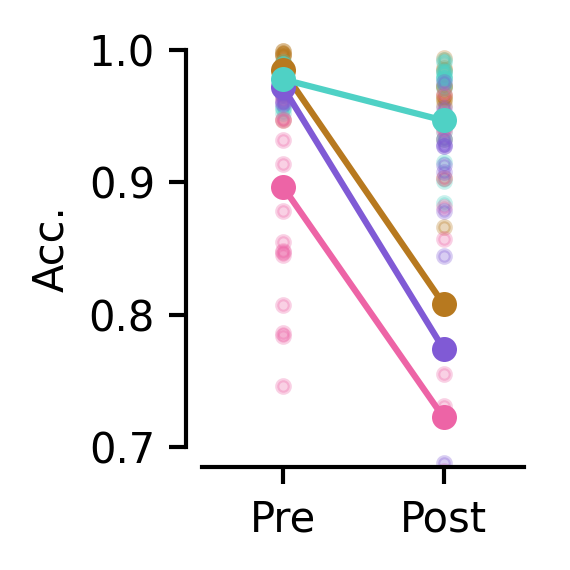

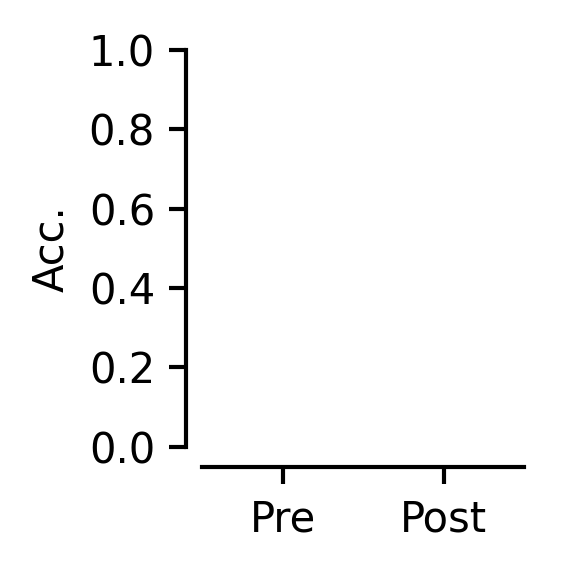

In [ ]:
fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2,2))

mean_stpn_accs = np.mean(stpn_accs, axis=1)
mean_gru_accs = np.mean(gru_accs, axis=1)
median_stpn_accs = np.median(stpn_accs, axis=1)
median_gru_accs = np.median(gru_accs, axis=1)

mean_stpna_accs = np.mean(stpna_accs, axis=1)
median_stpna_accs = np.median(stpna_accs, axis=1)
mean_stpn1_accs = np.mean(stpn1_accs, axis=1)
median_stpn1_accs = np.median(stpn1_accs, axis=1)

plot_locs = ((1, 2), (1, 2))

# Teal v4, yellow v7, pink v5, purple v6
lam_colors = ('#4fd1c5', '#b7791f', '#ed64a6', c_vals[3],)

for load_idx, ax in zip((0, 1), (ax1, ax2)):
    if load_idx == 0 or (load_idx == 1 and median_stpn_accs.shape[0] > 1):
        stpn_lab = 'STPN' if load_idx == 0 else None
        gru_lab = 'GRU' if load_idx == 0 else None
        
        ax.plot(plot_locs[load_idx], mean_gru_accs[load_idx, :2], color=lam_colors[1], marker='o',
                label=gru_lab, zorder=0)
        ax.plot(plot_locs[load_idx], mean_stpn_accs[load_idx, :2], color=lam_colors[0], marker='o', 
                label=stpn_lab, zorder=1)
        
        if num_net_types > 2:
            ax.plot(plot_locs[load_idx], mean_stpna_accs[load_idx, :2], color=lam_colors[2], marker='o',
                    zorder=0.5)
        if num_net_types > 3:
            ax.plot(plot_locs[load_idx], mean_stpn1_accs[load_idx, :2], color=lam_colors[3], marker='o',
                    zorder=0.5)
        

        for acc_idx in (0, 1):
            ax.scatter(plot_locs[load_idx][acc_idx]*np.ones((n_trials,)),
                        gru_accs[load_idx, :, acc_idx], color=lam_colors[1], alpha=0.3, 
                        marker='.', zorder=-1)
            ax.scatter(plot_locs[load_idx][acc_idx]*np.ones((n_trials,)),
                        stpn_accs[load_idx, :, acc_idx], color=lam_colors[0], alpha=0.3, 
                        marker='.', zorder=-1)
            
            if num_net_types > 2:
                ax.scatter(plot_locs[load_idx][acc_idx]*np.ones((n_trials,)),
                        stpna_accs[load_idx, :, acc_idx], color=lam_colors[2], alpha=0.3, 
                        marker='.', zorder=-1)
            if num_net_types > 2:
                ax.scatter(plot_locs[load_idx][acc_idx]*np.ones((n_trials,)),
                        stpn1_accs[load_idx, :, acc_idx], color=lam_colors[3], alpha=0.3, 
                        marker='.', zorder=-1)

        # ax1.plot(plot_locs[load_idx][1], mean_stpn_accs[load_idx, 2], color=c_vals_l[0], marker='o')
        # ax1.plot(plot_locs[load_idx][1], mean_gru_accs[load_idx, 2], color=c_vals_l[1], marker='o')

    # ax.legend()
    ax.set_xlim((0.5, 2.5))
    ax.set_xticks((1, 2))
    ax.set_xticklabels(('Pre', 'Post'))
    ax.set_ylabel('Acc.')

if num_net_types == 2: # GRU and MPN only
    ax1.set_ylim((0.7, 1.0))
    ax1.set_yticks((0.7, 0.8, 0.9, 1.0))
    ax1.set_yticklabels((0.7, 0.8, 0.9, 1.0))
if num_net_types > 2:
    ax1.set_ylim((0.7, 1.0))
    ax1.set_yticks((0.7, 0.8, 0.9, 1.0))
    ax1.set_yticklabels((0.7, 0.8, 0.9, 1.0))

ax2.set_ylim((0.0, 1.0))
ax2.set_yticks((0.0, 0.2, 0.4, 0.6, 0.8, 1.0))
ax2.set_yticklabels((0.0, 0.2, 0.4, 0.6, 0.8, 1.0))

jetplot.breathe(ax=ax1)
jetplot.breathe(ax=ax2)


In [ ]:
print('STPN: \n  w1_diff: {:.3f} (std: {:.3f})\n  w2_diff: {:.3f} (std: {:.3f})\n  h_diff: {:.3f} (std: {:.3f})'.format(
    stpn_diffs[0, :, 0].mean(), stpn_diffs[0, :, 0].std(),
    stpn_diffs[0, :, 1].mean(), stpn_diffs[0, :, 1].std(),
    stpn_diffs[0, :, 2].mean(), stpn_diffs[0, :, 2].std(),
))
print('STPN1: \n  w1_diff: {:.3f} (std: {:.3f})\n  w2_diff: {:.3f} (std: {:.3f})\n  h_diff: {:.3f} (std: {:.3f})'.format(
    stpn1_diffs[0, :, 0].mean(), stpn1_diffs[0, :, 0].std(),
    stpn1_diffs[0, :, 1].mean(), stpn1_diffs[0, :, 1].std(),
    stpn1_diffs[0, :, 2].mean(), stpn1_diffs[0, :, 2].std(),
))

print('STPN: \n  other RO align: {:.3f} (std: {:.3f})\n  eos RO align: {:.3f} (std: {:.3f})\n  eos diff: {:.3f} (std: {:.3f})'.format(
    stpn_cluster_info[0, :, 0].mean(), stpn_cluster_info[0, :, 0].std(),
    stpn_cluster_info[0, :, 1].mean(), stpn_cluster_info[0, :, 1].std(),
    stpn_cluster_info[0, :, 2].mean(), stpn_cluster_info[0, :, 2].std(),
))
print('STPN1: \n  other RO align: {:.3f} (std: {:.3f})\n  eos RO align: {:.3f} (std: {:.3f})\n  eos diff: {:.3f} (std: {:.3f})'.format(
    stpn1_cluster_info[0, :, 0].mean(), stpn1_cluster_info[0, :, 0].std(),
    stpn1_cluster_info[0, :, 1].mean(), stpn1_cluster_info[0, :, 1].std(),
    stpn1_cluster_info[0, :, 2].mean(), stpn1_cluster_info[0, :, 2].std(),
))

STPN: 
  w1_diff: 0.520 (std: 0.089)
  w2_diff: 0.450 (std: 0.131)
  h_diff: 0.841 (std: 0.615)
STPN1: 
  w1_diff: 0.645 (std: 0.139)
  w2_diff: 0.820 (std: 0.261)
  h_diff: 1.031 (std: 0.531)
STPN: 
  other RO align: 0.156 (std: 0.080)
  eos RO align: 0.838 (std: 0.024)
  eos diff: 45.902 (std: 10.142)
STPN1: 
  other RO align: 0.793 (std: 0.075)
  eos RO align: 0.867 (std: 0.054)
  eos diff: 39.491 (std: 17.355)


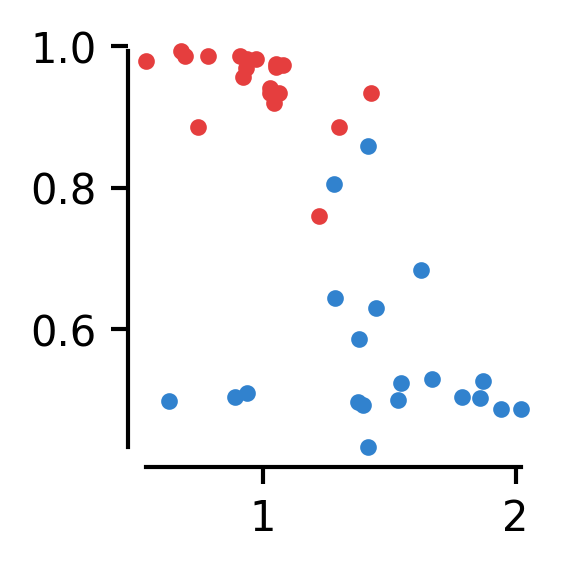

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(2,2))

# ax.scatter(stpn_cluster_info[0, :, 2], stpn_accs[0, :, 1], color=c_vals[0],
#            marker='.')
# ax.scatter(stpn1_cluster_info[0, :, 2], stpn1_accs[0, :, 1], color=c_vals[1],
#            marker='.')

ax.scatter(stpn_diffs[0, :, 0]+stpn_diffs[0, :, 1], stpn_accs[0, :, 1], color=c_vals[0],
           marker='.')
ax.scatter(stpn1_diffs[0, :, 0]+stpn1_diffs[0, :, 1], stpn1_accs[0, :, 1], color=c_vals[1],
           marker='.')

jetplot.breathe(ax=ax)

Let's try to visualize why the GRUs are so bad at generalization when there's many outputs

Integration angle: 36.90
Readout angles (old, new):
  RO0 angle: 15.48
  RO1 angle: 17.21
  RO2 angle: 7.62
  RO3 angle: 9.85
Hidden deflections (old, new):
  Orig word evid0 angle: 7.21
  Orig word evid1 angle: 6.30
  Orig word null angle: 9.65
  Orig word <eos> angle: 9.50


Text(0.5, 1.0, 'Hidden state PC plots (color by phrase label)')

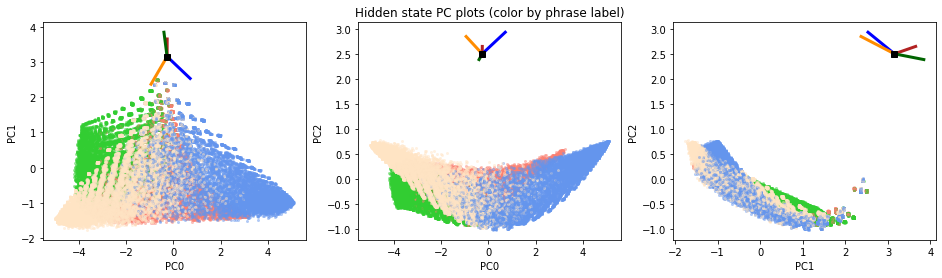

In [ ]:
ro_matrix = np.array(net_next.w2.detach().cpu())
ro_matrix_orig = np.array(net.w2.detach().cpu())

hs_orig = db_original['h'].cpu().numpy()
hs_new = db_next['h'].cpu().numpy()

labels_orig = np.array(testData[:,:,:][1][:, -1, 0].cpu())
labels_new = np.array(testData_next[:,:,:][1][:, -1, 0].cpu())

hidden_PCA = PCA(n_components=100)
hidden_PCA_orig = PCA(n_components=100)

# Adds initial hidden state to h
if net_params['netType'] in ('VanillaRNN', 'GRU'):
    h0 = net_next.h0.cpu().numpy()
    h0_batch = np.repeat(h0[np.newaxis, np.newaxis, :], hs_orig.shape[0], axis=0)
    hs_orig = np.concatenate((h0_batch, hs_orig), axis=1)

    h0_batch = np.repeat(h0[np.newaxis, np.newaxis, :], hs_new.shape[0], axis=0)
    hs_new = np.concatenate((h0_batch, hs_new), axis=1)

hidden_PCA.fit(hs_new.reshape((-1, hs_new.shape[-1])))
hidden_PCA_orig.fit(hs_orig.reshape((-1, hs_orig.shape[-1])))

hs_orig_pca = np.zeros(hs_orig.shape)
for batch_idx in range(hs_orig.shape[0]):
    hs_orig_pca[batch_idx] = hidden_PCA.transform(hs_orig[batch_idx])
hs_new_pca = np.zeros(hs_new.shape)
for batch_idx in range(hs_new.shape[0]):
    hs_new_pca[batch_idx] = hidden_PCA.transform(hs_new[batch_idx])

zero_matrix_pca = hidden_PCA.transform(np.zeros_like(ro_matrix))
ro_matrix_pca = hidden_PCA.transform(ro_matrix)

print('Integration angle: {:.2f}'.format(get_align_angle(
    hidden_PCA.components_[0], hidden_PCA_orig.components_[0]
)))
print('Readout angles (old, new):')
for ro_idx in range(ro_matrix.shape[0]):
    print('  RO{} angle: {:.2f}'.format(ro_idx, get_align_angle(
        ro_matrix[ro_idx], ro_matrix_orig[ro_idx]
    )))

print('Hidden deflections (old, new):')
winp_new = np.array(net.w1.detach().cpu())
b_new = np.array(net.b1.detach().cpu())
winp_orig = np.array(net_next.w1.detach().cpu())
b_orig = np.array(net_next.b1.detach().cpu())

h_deforig_new = np.zeros((len(toy_params_next['words']), net_next.n_hidden))
h_deforig_orig = np.zeros((len(toy_params['words']), net.n_hidden))
for word_idx, word in enumerate(toy_params['words']):
    h_deforig_new[word_idx] = np.matmul(winp_new, toy_params['word_to_input_vector'][word]) + b_new
    h_deforig_orig[word_idx] = np.matmul(winp_orig, toy_params['word_to_input_vector'][word]) + b_orig
    print('  Orig word {} angle: {:.2f}'.format(word, get_align_angle(
        h_deforig_new[word_idx], h_deforig_orig[word_idx]
    )))

color_type = 'labels' # 'labels', 'words', 'seq_idx'

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4))

pcxs = (0, 0, 1)
pcys = (1, 2, 2)
ax_pair_lims = (None, None, None)

for ax, pcx, pcy, ax_pair_lim in zip((ax1, ax2, ax3), pcxs, pcys, ax_pair_lims):
    for batch_idx in range(hs_orig_pca.shape[0]):
        ax.scatter(hs_orig_pca[batch_idx, :, pcx], hs_orig_pca[batch_idx, :, pcy], linewidth=0.0,
                   marker='.', color=c_vals_l[labels_orig[batch_idx]], zorder=0, alpha=0.5)
        # ax.scatter(hs_orig_pca[batch_idx, -1, pcx], hs_orig_pca[batch_idx, -1, pcy], marker='o',
        #            color=c_vals[labels_orig[batch_idx]], zorder=5, alpha=0.5)

    for batch_idx in range(hs_new_pca.shape[0]):
        ax.scatter(hs_new_pca[batch_idx, :, pcx], hs_new_pca[batch_idx, :, pcy], linewidth=0.0,
                   marker='.', color=c_vals_l[labels_new[batch_idx]], zorder=0, alpha=0.5)
        # ax.scatter(hs_new_pca[batch_idx, -1, pcx], hs_new_pca[batch_idx, -1, pcy], marker='o',
        #            color=c_vals[labels_new[batch_idx]], zorder=5, alpha=0.5)

    for ro_idx in range(net_params['n_outputs']):
        ax.plot([zero_matrix_pca[ro_idx, pcx], ro_matrix_pca[ro_idx, pcx]], 
                [zero_matrix_pca[ro_idx, pcy], ro_matrix_pca[ro_idx, pcy]],
                 color=c_vals[ro_idx], linewidth=3.0, zorder=10)

    # Initial hidden (only well-defined for RNNs)
    if net_params['netType'] in ('VanillaRNN', 'GRU'):
        ax.plot(hs_new_pca[0, 0, pcx], hs_new_pca[0, 0, pcy], marker='s',
                color='k', zorder=10)

    ax.set_xlabel('PC{}'.format(pcx))
    ax.set_ylabel('PC{}'.format(pcy))
    # Sets square limits if desired
    if ax_pair_lim is not None:
        ax.set_xlim((-ax_pair_lim, ax_pair_lim))
        ax.set_ylim((-ax_pair_lim, ax_pair_lim))

ax2.set_title('Hidden state PC plots (color by phrase label)')

#### **Noise Robustness**

Note that this code just uses the same set of networks (STPNs and VanillaRNNs) that were used to investigate flow under gradually longer phrases. Instead of plotting multiple lambda values this simply uses lambda=0.95.

In [ ]:
# load_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/lambdas_'
load_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/lambdasMinIt_'
load_root_start_alt = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/highernoise_1p0_'

num_net_types = 5

STPN_load = ['HebbNet_M[50,100,2]_train=seq_inf_task=int_2class_20len',]
vanilla_load = ['VanillaRNN[50,100,2]_train=seq_inf_task=int_2class_20len',]
gru_load = ['GRU[50,100,2]_train=seq_inf_task=int_2class_20len',]

STPNA_load = ['HebbNet[50,100,2]_train=seq_inf_task=int_2class_20len',]
STPN1_load = ['HebbNet_M[50,100,2]_train=seq_inf_task=int_2class_20len',]

n_noise = 20

noise_vars = np.logspace(np.log10(0.01), np.log10(100.0), n_noise)
print('Noise variations:', noise_vars)

n_trials = 10
init_seed = 1001
test_set_size = 100

# lam_vals = ('vanilla_alt', '0.95_alt', 'vanilla', 0.95, 1.0)
if num_net_types == 3:
    pass
    # lam_vals = ('gru', 'vanilla', 0.8, 0.9, 0.95, 1.0)
elif num_net_types == 5:
    lam_vals = ('gru', 'vanilla', 0.8, 0.9, 0.95, 1.0, '0.95_a', '1.0_a', '0.95_1')

lam_accs = np.zeros((len(lam_vals), n_trials, n_noise))

for lam_idx, lam_clamp in enumerate(lam_vals):
    if lam_clamp == '0.95_alt':
        load_root = load_root_start_alt+str(0.95).replace('.', '')+'_'
    elif lam_clamp == 'vanilla_alt':
        load_root = load_root_start_alt+str(0.95).replace('.', '')+'_'
    elif lam_clamp in ('0.95_a',):
        load_root = load_root_start+str(0.95).replace('.', '')+'_'
    elif lam_clamp in ('0.95_1',):
        load_root = load_root_start+'1factor_'+str(0.95).replace('.', '')+'_'
    elif lam_clamp == '1.0_a':
        load_root = load_root_start+str(1.0).replace('.', '')+'_'
    else:
        load_root = load_root_start+str(lam_clamp).replace('.', '')+'_'
    
    print('Lambda idx: {} (lam clamp: {})'.format(lam_idx, lam_clamp))

    for trial_idx in range(n_trials):
        # Loads network
        if lam_clamp in ('vanilla', 'vanilla_alt'):
            load_path = load_root + vanilla_load[0]
        elif lam_clamp in ('gru',):
            load_path = load_root + gru_load[0]
        elif lam_clamp in ('0.95_a', '1.0_a',):
            load_path = load_root + STPNA_load[0]
        elif lam_clamp in ('0.95_1',):
            load_path = load_root + STPN1_load[0]
        else:
            load_path = load_root + STPN_load[0]
        net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
        
        for var_idx, noise_var in enumerate(noise_vars):
            net_load.noiseScale = noise_var
            # toy_params_load['phrase_length'] = 100
            testData, testOutputMask, _ = syn.generate_data(
                test_set_size, toy_params_load, net_params_load['n_outputs'],
                raw_data=False, device=torch.device('cpu'), verbose=False)
            
            db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)
            lam_accs[lam_idx, trial_idx, var_idx] = db_load['acc']

print('Lam accs shape', lam_accs.shape)

Noise variations: [1.00000000e-02 1.62377674e-02 2.63665090e-02 4.28133240e-02
 6.95192796e-02 1.12883789e-01 1.83298071e-01 2.97635144e-01
 4.83293024e-01 7.84759970e-01 1.27427499e+00 2.06913808e+00
 3.35981829e+00 5.45559478e+00 8.85866790e+00 1.43844989e+01
 2.33572147e+01 3.79269019e+01 6.15848211e+01 1.00000000e+02]
Lambda idx: 0 (lam clamp: gru)
Lambda idx: 1 (lam clamp: vanilla)
Lambda idx: 2 (lam clamp: 0.8)
Lambda idx: 3 (lam clamp: 0.9)
Lambda idx: 4 (lam clamp: 0.95)
Lambda idx: 5 (lam clamp: 1.0)
Lambda idx: 6 (lam clamp: 0.95_a)
Lambda idx: 7 (lam clamp: 1.0_a)
Lambda idx: 8 (lam clamp: 0.95_1)
Lam accs shape (9, 10, 20)


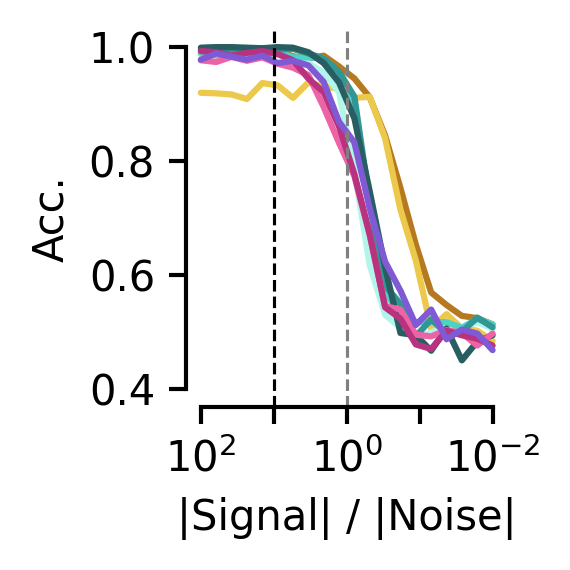

In [ ]:
fig, ax2 = plt.subplots(1, 1, figsize=(2, 2))

# Yellow v7, yellow v5, Teal v2, v4, v6, v8, Pink v5, Pink v7, Purple v6
lam_colors = ('#b7791f', '#ecc94b',  '#b2f5ea', '#4fd1c5', '#319795', '#285e61', '#ed64a6', '#b83280', '#805ad5')

for lam_idx, lam_clamp in enumerate(lam_vals):
    ax2.plot(noise_vars, np.mean(lam_accs[lam_idx], axis=0),
             color=lam_colors[lam_idx], alpha=1.0, marker=None,
             label='lam: {}'.format(lam_clamp))

ax2.axvline(0.1, color='k', linestyle='dashed', linewidth=0.75)
ax2.axvline(1.0, color='grey', linestyle='dashed', linewidth=0.75)

ax2.set_xscale('log')
ax2.set_xlabel('|Signal| / |Noise|')
ax2.set_ylabel('Acc.')

# ax2.set_ylim((0.4, 1.0))
# ax2.set_yticks((0.4, 0.6, 0.8, 1.0))

if num_net_types > 3:
    ax2.set_ylim((0.4, 1.0))
    ax2.set_yticks((0.4, 0.6, 0.8, 1.0))
else:
    ax2.set_ylim((0.0, 1.0))
    ax2.set_yticks((0.0, 0.25, 0.5, 0.75, 1.0))
    ax2.set_yticklabels((0.0, None, 0.5, None, 1.0))

ax2.set_xlim((.01, 100))
ax2.set_xticks((.01, 0.1, 1.0, 10, 100))
# SNR is 1/|noise| here, so flip labels
ax2.set_xticklabels(('$10^{2}$', None, '$10^{0}$', None, '$10^{-2}$'))

jetplot.breathe(ax=ax2)

Now actually train the networks at different noise levels and see if this affects their accuracy curves at all.

In [ ]:
n_trials = 10
acc_thresh = 0.97
# input_size = 10

save = True
save_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/highernoise_1p0_'


lam_vals = (0.95, 1.0,)
# lam_vals = ('vanilla',)

for lam_clamp in lam_vals:
    save_root = save_root_start+str(lam_clamp).replace('.', '')+'_'
    for trial_idx in range(n_trials):
        # Note redefines toy_params internal to the loop so that a new random 
        # set of word vectors will be drawn for each trial
        ########## Toy data parameters ##########
        toy_params = {
            'data_type': 'int', # int, context
            
            'phrase_length': 20,
            'n_classes': 2,
            'input_type': 'binary',    # one hot, binary, binary1-1
            'input_size': 50,          # defaults to length of words
            'include_eos': True,

            'stack_phrases': False,
            'n_stack': 1,
            'include_sos': False,
            'n_delay': 0, # Inserts delay words between at end of phrase (but before eos trigger)
            'delay_word': '<delay>', # '<delay>' or 'null'

            'uniform_score': True, # Uniform distribution over scores=
        }

        net_params = {
            'netType': 'VanillaRNN', # HebbNet, HebbNet_M, VanillaRNN, GRU, rHebbNet, rHebbNet_M, GHU, GHU_M
            'n_inputs': toy_params['input_size'],         # input dim
            'n_hidden': 100,                      # hidden dim
            'n_outputs': toy_params['n_classes'],         # output dim
            # 'n_outputs': 10,                                # train with larger number of outputs for generalization tests    
            'f_act': 'tanh',         # 1st layer actiivation function # linear, sigmoid, tanh, relu
            'f0_act': 'linear',      # 2nd layer actiivation function
            'trainable_state0': False,
            
            # STPN Features
            'A_act': None,            # Activation on the A update (tanh or None)
            'lam_clamp': lam_clamp,   # Maximum lambda value
            'eta_type': 'scalar',     # scalar or vector
            'eta_force': None,        # ensure either Hebbian or anti-Hebbian plasticity
            'hebb_type': 'inputOutput',      # input, output, inputOutput

            # Train parameters
            'train_mode': 'seq_inf',   # 'seq' or 'seq_inf'
            'weight_reg': 'L1',
            'reg_lambda': 1e-4,
            'hidden_bias': False,
            'ro_bias': False,           # use readout bias or not
            'gradient_clip': 10,
            'freeze_inputs': False,      # freeze the input layer (and hidden bias)
            'sparsification': 0.0,      # Amount to sparsify network's weights (0.0 = no sparsification)
            'noise_type': 'input',      # None, 'input', 'hidden'
            'noise_scale': 1.0,         # Expected magnitude of noise vector
            'cuda': True,
            'validEarlyStop': False,     # Early stop when average validation loss saturates
            'accEarlyStop': acc_thresh,   
            'minMaxIter': (2000, 1e6),
            'seed': 1001 + trial_idx,   # This seed is used to generate training/valid data too

            'train_set_size': 3200,
            'valid_set_size': 500,
            'batch_size': 64,
            'epochs': 1,
        }
        # Keep forgetting to turn this on for RNNs, so just automate it
        net_params['hidden_bias'] = False if net_params['netType'] in ('HebbNet', 'HebbNet_M') else True

        print('Trial: {}'.format(trial_idx))
        verbose = True if trial_idx == 0 else False

        net, toy_params, net_params = train_network(net_params, toy_params, save=save, 
                                                    save_root=save_root, verbose=verbose)

Trial: 0
Toy integration data...
Using CUDA...
Net parameters:
  Net Type: VanillaRNN
  Structure: f: tanh // fOut: linear // (Nx, Nh, Ny) = (50, 100, 2)
  Hidden bias: trainable // No readout bias // Sparsification: 0.00 // Noise type: input (scl: 1.0e+00)
  h0: zeros
Train parameters:
  Loss: XE // LR: 1.00e-03 // Weight reg: L1, coef: 1.0e-02 // Gradient clip: 1.0e+01
Iter:0 grad:17.096 train_loss:0.9764 train_acc:0.625 valid_loss:1.1291 valid_acc:0.510
Iter:50 grad:16.934 train_loss:0.3409 train_acc:0.922 valid_loss:0.2009 valid_acc:0.930
Iter:100 grad:16.875 train_loss:0.2268 train_acc:0.953 valid_loss:0.1474 valid_acc:0.948
Iter:150 grad:16.794 train_loss:0.2713 train_acc:0.938 valid_loss:0.1141 valid_acc:0.960
Iter:200 grad:16.716 train_loss:0.1613 train_acc:0.984 valid_loss:0.1102 valid_acc:0.958
Iter:250 grad:16.654 train_loss:0.1306 train_acc:1.000 valid_loss:0.1470 valid_acc:0.938
Iter:300 grad:16.596 train_loss:0.2650 train_acc:0.922 valid_loss:0.1342 valid_acc:0.950
Iter:3

#### **Delayed Answering**

Synthentic data generated in: 0.09 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
Synthentic data generated in: 0.10 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
Synthentic data generated in: 0.10 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
Synthentic data generated in: 0.11 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
Synthentic data generated in: 0.10 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
Synthentic data generated in: 0.10 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
Synthentic data generated in: 0.10 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
Synthentic data generated in: 0.11 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
Synthentic data generated in: 0.10 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
Synthentic data generated in: 0.11 sec. Autobalanced: False. Uniform scor

Text(0.5, 1.0, 'Vanilla RNN Delay Acc')

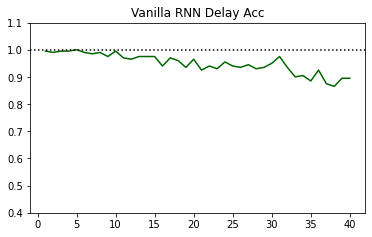

In [ ]:
import copy

n_delay_max = 40 #net_params['n_outputs']
n_delays = np.arange(1, n_delay_max+1)
base_pl = toy_params['phrase_length']

testDatas = []
testMasks = []

delay_accs = []

n_samples = 200

for delay_idx, n_delay in enumerate(n_delays):
    toy_params['n_delay'] = n_delay
    toy_params['phrase_length'] = base_pl + n_delay
    testData, testOutputMask, _ = syn.generate_data(n_samples, toy_params, net_params['n_outputs'], auto_balance=False)

    testDatas.append(testData)
    testMasks.append(testOutputMask)
    
    db_len = net.evaluate_debug(testData[0:n_samples,:,:], batchMask=testOutputMask)

    delay_accs.append(db_len['acc'])

toy_params['n_delay'] = 0
toy_params['phrase_length'] = base_pl

if net_params['netType'] == 'HebbNet':
    plot_color = c_vals[0]
    plot_title = '(A + W)x'
elif net_params['netType'] == 'HebbNet_M':
    plot_color = c_vals[2]
    plot_title = '(A * W)x'
elif net_params['netType'] == 'VanillaRNN':
    plot_color = c_vals[1]  
    plot_title = 'Vanilla RNN'
elif net_params['netType'] == 'GRU':
    plot_color = c_vals[1]  
    plot_title = 'GRU'

fig, ax1 = plt.subplots(1, 1, figsize=(6,3.5))
ax1.plot(n_delays, delay_accs, color=plot_color)

ax1.axhline(1.0, color='k', linestyle='dotted')
ax1.set_ylim([0.4, 1.1])

ax1.set_title(plot_title + ' Delay Acc')

#### **Echo State**

In [ ]:
save = True
# save_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/echostate_'
save_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/echostate_1factor_'
# save_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/echostate_anti_'

n_trials = 10

for trial_idx in range(n_trials):
    # Note redefines toy_params internal to the loop so that a new random 
    # set of word vectors will be drawn for each trial
    ########## Toy data parameters ##########
    toy_params = {
        'data_type': 'int', # int, context
        
        'phrase_length': 20,
        'n_classes': 2,
        'input_type': 'binary',    # one hot, binary, binary1-1
        'input_size': 50,          # defaults to length of words
        'include_eos': True,

        'stack_phrases': False,
        'n_stack': 1,
        'include_sos': False,
        'n_delay': 0, # Inserts delay words between at end of phrase (but before eos trigger)
        'delay_word': '<delay>', # '<delay>' or 'null'

        'uniform_score': True, # Uniform distribution over scores=
    }

    net_params = {
        'netType': 'HebbNet_M', # HebbNet, HebbNet_M, VanillaRNN, GRU, rHebbNet, rHebbNet_M, GHU, GHU_M
        'n_inputs': toy_params['input_size'],           # input dim
        'n_hidden': 100,                                # hidden dim
        'n_outputs': toy_params['n_classes'],         # output dim
        # 'n_outputs': 10,                                # train with larger number of outputs for generalization tests    
        'f_act': 'tanh',         # 1st layer actiivation function # linear, sigmoid, tanh, relu
        'f0_act': 'linear',      # 2nd layer actiivation function
        'trainable_state0': False,
        
        # STPN Features
        'A_act': None,            # Activation on the A update (tanh or None)
        'lam_clamp': 0.95,          # Maximum lambda value
        'eta_type': 'scalar',       # scalar or vector
        'eta_force': None,        # ensure either Hebbian or anti-Hebbian plasticity
        'hebb_type': 'input',      # input, output, inputOutput

        # Train parameters
        'train_mode': 'seq_inf',   # 'seq' or 'seq_inf'
        'weight_reg': 'L1',
        'reg_lambda': 1e-4,
        'hidden_bias': False,
        'ro_bias': False,           # use readout bias or not
        'gradient_clip': 10,
        'freeze_inputs': True,      # freeze the input layer (and hidden bias)
        'sparsification': 0.0,      # Amount to sparsify network's weights (0.0 = no sparsification)
        'noise_type': 'input',      # None, 'input', 'hidden'
        'noise_scale': 0.1,         # Expected magnitude of noise vector
        'cuda': True,
        'accEarlyStop': None,
        'minMaxIter': (-2, 1e7),
        'validEarlyStop': True,     # Early stop when average validation loss saturates
        'seed': 2000 + trial_idx,               # This seed is used to generate training/valid data too

        'train_set_size': 3200,
        'valid_set_size': 500,
        'batch_size': 64,
        'epochs': 1,
    }
    # Keep forgetting to turn this on for RNNs, so just automate it
    net_params['hidden_bias'] = False if net_params['netType'] in ('HebbNet', 'HebbNet_M') else True

    print('Trial: {}'.format(trial_idx))
    verbose = True if trial_idx == 0 else False
    net, toy_params, net_params = train_network(net_params, toy_params, save=save, 
                                                save_root=save_root, verbose=verbose)
    
    print(net.eta)

Trial: 0
Toy integration data...
Using CUDA...
Net parameters:
  Net Type: Multiplicative
  Structure: f: tanh // fOut: linear // (Nx, Nh, Ny) = (50, 100, 2)
  Winp: Frozen // No hidden bias // No readout bias // Sparsification: 0.00 // Noise type: input (scl: 1.0e-01)
  A parameters:
    A update: Hebbian // Pre-Syn Only // A Act: linear // Eta: scalar // Lam: scalar // Lambda_max: 0.95
    A0: zeros // A unbounded
Train parameters:
  Loss: XE // LR: 1.00e-03 // Weight reg: L1, coef: 1.0e-04 // Gradient clip: 1.0e+01
Iter:0 grad:1.960 train_loss:0.7208 train_acc:0.562 valid_loss:0.7415 valid_acc:0.492
Iter:50 grad:1.991 train_loss:0.6202 train_acc:0.797 valid_loss:0.6194 valid_acc:0.848
Iter:100 grad:2.102 train_loss:0.5437 train_acc:0.922 valid_loss:0.5388 valid_acc:0.940
Iter:150 grad:2.264 train_loss:0.4857 train_acc:0.984 valid_loss:0.4744 valid_acc:0.956
Iter:200 grad:2.450 train_loss:0.4327 train_acc:0.984 valid_loss:0.4254 valid_acc:0.960
Iter:250 grad:2.646 train_loss:0.4106 t

In [ ]:
load_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/echostate_' # Different word_to_input vector for each trial
load_root_anti = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/echostate_anti_'

num_net_types = 5

# STPN (in=10)
STPN_path = ['HebbNet_M[50,100,2]_train=seq_inf_task=int_2class_20len', 'HebbNet_M[10,10,2]_train=seq_inf_task=int_2class_20len']
# Vanilla (in=10)
Vanilla_path = ['VanillaRNN[50,100,2]_train=seq_inf_task=int_2class_20len', 'VanillaRNN[10,10,2]_train=seq_inf_task=int_2class_20len']
# GRU (in=10)
GRU_path = ['GRU[50,100,2]_train=seq_inf_task=int_2class_20len', 'GRU[10,10,2]_train=seq_inf_task=int_2class_20len']
# STPNA (in=10)
STPNA_path = ['HebbNet[50,100,2]_train=seq_inf_task=int_2class_20len', 'HebbNet[10,10,2]_train=seq_inf_task=int_2class_20len']
# STPN1 
STPN1_path = ['1factor_HebbNet_M[50,100,2]_train=seq_inf_task=int_2class_20len', '1factor_HebbNet_M[10,10,2]_train=seq_inf_task=int_2class_20len']

n_trials = 10
init_seed = 2000

test_set_size = 1000

stpn_accs = []
vanilla_accs = []
gru_accs = []
stpn_anti_accs = []
stpna_accs = []
stpn1_accs = []

for size_idx in range(2):
    stpn_accs.append([])
    vanilla_accs.append([])
    gru_accs.append([])
    stpn_anti_accs.append([])
    stpna_accs.append([])
    stpn1_accs.append([])
    for trial_idx in range(n_trials):
        # STPN
        load_path = load_root + STPN_path[size_idx]
        net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
        # print('.   w2i vec:', toy_params_load['word_to_input_vector']['null'][:5])
        testData_10, testOutputMask_10, testRaw, _ = syn.generate_data(
            test_set_size, toy_params_load, net_params_load['n_outputs'],
            raw_data=True, device=torch.device('cpu'), verbose=False)
        db_load = net_load.evaluate_debug(testData_10[:,:,:], batchMask=testOutputMask_10)
        stpn_accs[-1].append(db_load['acc'])

        # # STPN, anti-Hebbian
        # if size_idx == 1:
        #     load_path = load_root_anti + STPN_path[size_idx]
        #     net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
        #     # print('.   w2i vec:', toy_params_load['word_to_input_vector']['null'][:5])
        #     testData_10, testOutputMask_10, testRaw, _ = syn.generate_data(
        #         test_set_size, toy_params_load, net_params_load['n_outputs'],
        #         raw_data=True, device=torch.device('cpu'), verbose=False)
        #     db_load = net_load.evaluate_debug(testData_10[:,:,:], batchMask=testOutputMask_10)
        #     stpn_anti_accs[-1].append(db_load['acc'])

        # Vanilla
        load_path = load_root + Vanilla_path[size_idx]
        net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
        # print('.       w2i vec:', toy_params_load['word_to_input_vector']['null'][:5])
        testData_10, testOutputMask_10, testRaw, _ = syn.generate_data(
            test_set_size, toy_params_load, net_params_load['n_outputs'],
            raw_data=True, device=torch.device('cpu'), verbose=False)
        db_load = net_load.evaluate_debug(testData_10[:,:,:], batchMask=testOutputMask_10)
        vanilla_accs[-1].append(db_load['acc'])
        
        # GRU
        load_path = load_root + GRU_path[size_idx]
        net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
        # print('.       w2i vec:', toy_params_load['word_to_input_vector']['null'][:5])
        testData_10, testOutputMask_10, testRaw, _ = syn.generate_data(
            test_set_size, toy_params_load, net_params_load['n_outputs'],
            raw_data=True, device=torch.device('cpu'), verbose=False)
        db_load = net_load.evaluate_debug(testData_10[:,:,:], batchMask=testOutputMask_10)
        gru_accs[-1].append(db_load['acc'])

        # STPNA
        if num_net_types > 3:
            load_path = load_root + STPNA_path[size_idx]
            net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
            # print('.   w2i vec:', toy_params_load['word_to_input_vector']['null'][:5])
            testData_10, testOutputMask_10, testRaw, _ = syn.generate_data(
                test_set_size, toy_params_load, net_params_load['n_outputs'],
                raw_data=True, device=torch.device('cpu'), verbose=False)
            db_load = net_load.evaluate_debug(testData_10[:,:,:], batchMask=testOutputMask_10)
            stpna_accs[-1].append(db_load['acc'])

        # STPN
        if num_net_types > 4:
            load_path = load_root + STPN1_path[size_idx]
            net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
            # print('.   w2i vec:', toy_params_load['word_to_input_vector']['null'][:5])
            testData_10, testOutputMask_10, testRaw, _ = syn.generate_data(
                test_set_size, toy_params_load, net_params_load['n_outputs'],
                raw_data=True, device=torch.device('cpu'), verbose=False)
            db_load = net_load.evaluate_debug(testData_10[:,:,:], batchMask=testOutputMask_10)
            stpn1_accs[-1].append(db_load['acc'])

stpn_accs = np.array(stpn_accs)
vanilla_accs = np.array(vanilla_accs)
gru_accs = np.array(gru_accs)
stpna_accs = np.array(stpna_accs)
stpn1_accs = np.array(stpn1_accs)

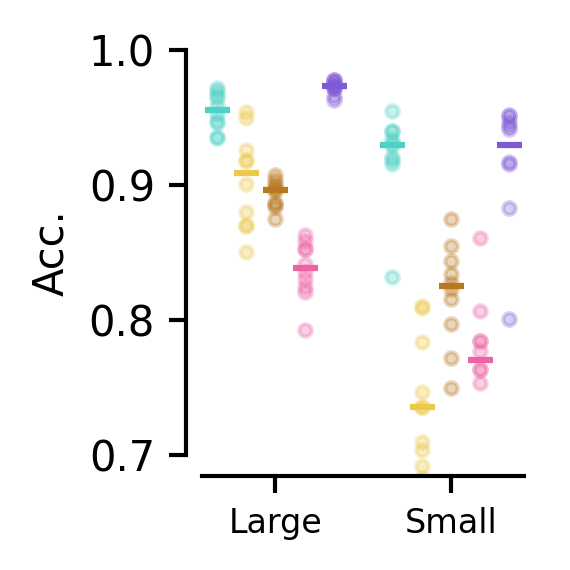

In [ ]:
fig, ax1 = plt.subplots(1, 1, figsize=(2, 2))

# cap_colors = (jetplot.colors.teal.v4, jetplot.colors.yellow.v5, 
#               jetplot.colors.yellow.v7,)

cap_colors = ('#4fd1c5', '#ecc94b', '#b7791f', '#ed64a6', c_vals[3],)

def plot_accs(ax, loc, net_accs, label='', c_idx=0):
    """
    Plots network accuacies 

    INPUTS:
    net_accs: (len(class_counts), n_trials)
    """
    N_SE = 2

    mean_accs = np.mean(net_accs, axis=-1)
    median_accs = np.median(net_accs, axis=-1)
    std_accs = np.std(net_accs, axis=-1)

    # ax.fill_between(class_counts, mean_accs-N_SE*std_accs,
    #                 mean_accs+N_SE*std_accs, color=c_vals_l[c_idx],
    #                 alpha=0.3, zorder=0)
    ax.scatter(loc, median_accs,
               color=cap_colors[c_idx], label=label, marker='_', zorder=5)
    
    ax.scatter(loc * np.ones(net_accs.shape), 
               net_accs, color=cap_colors[c_idx], 
               marker='.', zorder=-1, alpha=0.3)

if num_net_types == 3:
    plot_locs = ((1, 5), (2, 6), (3, 7))
elif num_net_types == 5:
    plot_locs = ((1, 7), (2, 8), (3, 9), (4, 10), (5, 11))
    plot_accs(ax1, plot_locs[3][0], stpna_accs[0], label='STPNA', c_idx=3)
    plot_accs(ax1, plot_locs[3][1], stpna_accs[1], label='STPNA', c_idx=3)
    plot_accs(ax1, plot_locs[4][0], stpn1_accs[0], label='STPN1', c_idx=4)
    plot_accs(ax1, plot_locs[4][1], stpn1_accs[1], label='STPN1', c_idx=4)

plot_accs(ax1, plot_locs[0][0], stpn_accs[0], label='STPN', c_idx=0)
plot_accs(ax1, plot_locs[1][0], vanilla_accs[0], label='Vanilla', c_idx=1)
plot_accs(ax1, plot_locs[2][0], gru_accs[0], label='GRU', c_idx=2)
# ax1.legend()

plot_accs(ax1, plot_locs[0][1], stpn_accs[1], label='STPN', c_idx=0)
plot_accs(ax1, plot_locs[1][1], vanilla_accs[1], label='Vanilla', c_idx=1)
plot_accs(ax1, plot_locs[2][1], gru_accs[1], label='GRU', c_idx=2)

# ax1.set_xlabel('Network Type')
ax1.set_ylabel('Acc.')

if num_net_types == 3:
    ax1.set_xlim((0.5, 7.5))
    ax1.set_xticks((2, 6,))
    ax1.set_xticklabels(('Large', 'Small'), fontsize=8)
    # ax1.set_xticklabels(('STPN', 'Van.', 'GRU'), fontsize=8)
elif num_net_types == 5:
    ax1.set_xlim((0.5, 11.5))
    ax1.set_xticks((3, 9,))
    ax1.set_xticklabels(('Large', 'Small'), fontsize=8)

# ax1.set_ylim((0.0, 1.0))
# ax1.set_yticks((0.0, 0.25, 0.5, 0.75, 1.0))
ax1.set_ylim((0.7, 1.0))
ax1.set_yticks((0.7, .8, .9, 1.0))
ax1.set_yticklabels((0.7, 0.8, 0.9, 1.0))

jetplot.breathe(ax=ax1)

#### **Bounded Modulations**

In [ ]:
n_trials = 10
acc_thresh = 0.97
# input_size = 10

save = True
save_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/bounded_mod_'

save_root_more = (
    'none_',
    '1p0_',
    '0p1_',
)

it_vals = (# Modulation, modulation_val
    (False, 1.0),
    (True, 1.0),
    (True, 0.1),
)

phrase_length = 20

Training, no need to run if loading

In [ ]:
for it_idx, it_val in enumerate(it_vals):
    save_root = save_root_start+save_root_more[it_idx]
    modulation_bounds = it_val[0]
    mod_bound_val = it_val[1]
    print('Modulations: {}, Mod Val: {:.2f}'.format(modulation_bounds, mod_bound_val))

    for trial_idx in range(n_trials):
        # Note redefines toy_params internal to the loop so that a new random 
        # set of word vectors will be drawn for each trial
        ########## Toy data parameters ##########
        toy_params = {
            'data_type': 'int', # int, context
            
            'phrase_length': phrase_length,
            'n_classes': 2,
            'input_type': 'binary',    # one hot, binary, binary1-1
            'input_size': 50,          # defaults to length of words
            'include_eos': True,

            'stack_phrases': False,
            'n_stack': 1,
            'include_sos': False,
            'n_delay': 0, # Inserts delay words between at end of phrase (but before eos trigger)
            'delay_word': '<delay>', # '<delay>' or 'null'

            'uniform_score': True, # Uniform distribution over scores=
        }

        net_params = {
            'netType': 'HebbNet_M', # HebbNet, HebbNet_M, VanillaRNN, GRU, rHebbNet, rHebbNet_M, GHU, GHU_M
            'n_inputs': toy_params['input_size'],         # input dim
            'n_hidden': 100,                      # hidden dim
            'n_outputs': toy_params['n_classes'],         # output dim
            # 'n_outputs': 10,                                # train with larger number of outputs for generalization tests    
            'f_act': 'tanh',         # 1st layer actiivation function # linear, sigmoid, tanh, relu
            'f0_act': 'linear',      # 2nd layer actiivation function
            'trainable_state0': False,
            
            # STPN Features
            'A_act': None,            # Activation on the A update (tanh or None)
            'lam_clamp': 0.95,   # Maximum lambda value
            'eta_type': 'scalar',     # scalar or vector
            'eta_force': None,        # ensure either Hebbian or anti-Hebbian plasticity
            'hebb_type': 'inputOutput',      # input, output, inputOutput
            'modulation_bounds': modulation_bounds, # bound modulations 
            'mod_bound_val': mod_bound_val, 

            # Train parameters
            'train_mode': 'seq_inf',   # 'seq' or 'seq_inf'
            'weight_reg': 'L1',
            'reg_lambda': 1e-4,
            'hidden_bias': True,
            'ro_bias': False,           # use readout bias or not
            'gradient_clip': 10,
            'freeze_inputs': False,      # freeze the input layer (and hidden bias)
            'sparsification': 0.0,      # Amount to sparsify network's weights (0.0 = no sparsification)
            'noise_type': 'input',      # None, 'input', 'hidden'
            'noise_scale': 0.1,         # Expected magnitude of noise vector
            'cuda': True,
            'validEarlyStop': False,     # Early stop when average validation loss saturates
            'accEarlyStop': acc_thresh,   
            'minMaxIter': (2000, 1e6),
            'seed': 1001 + trial_idx,   # This seed is used to generate training/valid data too

            'train_set_size': 3200,
            'valid_set_size': 500,
            'batch_size': 64,
            'epochs': 1,
        }
        # Keep forgetting to turn this on for RNNs, so just automate it
        net_params['hidden_bias'] = False if net_params['netType'] in ('HebbNet', 'HebbNet_M') else True

        print('Trial: {}'.format(trial_idx))
        verbose = True if trial_idx == 0 else False

        net, toy_params, net_params = train_network(net_params, toy_params, save=save, 
                                                    save_root=save_root, verbose=False)

Modulations: True, Mod Val: 0.10
Trial: 0
  Early Stop: valid accuracy threshold reached: 0.97
Trial: 1
  Early Stop: valid accuracy threshold reached: 0.97
Trial: 2
  Early Stop: valid accuracy threshold reached: 0.97
Trial: 3
  Early Stop: valid accuracy threshold reached: 0.98
Trial: 4
  Early Stop: valid accuracy threshold reached: 0.98


Loading and analyzing

In [ ]:
load_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/bounded_mod_'

STPN_load = ['HebbNet_M[50,100,2]_train=seq_inf_task=int_2class_20len',]

init_seed = 1001
test_set_size = 100

A_mags = np.zeros((len(it_vals), n_trials, phrase_length))
h_mags = np.zeros((len(it_vals), n_trials, phrase_length))

accs = np.zeros((len(it_vals), n_trials,))
etas = np.zeros((len(it_vals), n_trials,))

for it_idx, it_val in enumerate(it_vals):

    modulation_bounds = it_val[0]
    mod_bound_val = it_val[1]
    print('Modulations: {}, Mod Val: {:.2f}'.format(modulation_bounds, mod_bound_val))

    for trial_idx in range(n_trials):
        load_path = load_root_start + save_root_more[it_idx] + STPN_load[0]

        net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
        
        testData, testOutputMask, _ = syn.generate_data(
            test_set_size, toy_params_load, net_params_load['n_outputs'],
            raw_data=False, device=torch.device('cpu'), verbose=False)
        
        db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)
        accs[it_idx, trial_idx] = db_load['acc']
        etas[it_idx, trial_idx] = net_load.eta.detach().cpu().numpy()[0, 0, 0]

        print('  Acc: {:.3f}, Eta: {:.3f}'.format(accs[it_idx, trial_idx], etas[it_idx, trial_idx]))

        A = db_load['A'].cpu().numpy()
        mean_A_seq = np.mean(np.abs(A), axis=(0,)).reshape(A.shape[1], -1)
        mean_A_mag = np.linalg.norm(mean_A_seq, axis=-1)
        A_mags[it_idx, trial_idx] =  mean_A_mag

        h = db_load['h'].cpu().numpy()
        mean_h_seq = np.mean(np.abs(h), axis=(0,))
        mean_h_mag = np.linalg.norm(mean_h_seq, axis=-1)
        h_mags[it_idx, trial_idx] =  mean_h_mag

#             if net_params_load['netType'] in ('VanillaRNN', 'GRU'):
#                 final_state_mags = (np.linalg.norm(db_load['h'][:, -1, :], axis=(1,)) / 
#                                     np.sqrt(net_params_load['n_hidden']))
#             elif net_params_load['netType'] in ('HebbNet', 'HebbNet_M',): # Final state for 'A' is -2 because it doesn't actually use final A for any calculation          
#                 final_state_mags = (np.linalg.norm(db_load['A'][:, -2, :, :], axis=(1, 2)) / 
#                                     np.sqrt(net_params_load['n_hidden']*net_params_load['n_inputs'])) 
#             lam_mags[lam_idx, trial_idx, len_idx] = np.mean(final_state_mags, axis=0) # Average over test_set

#             lam_accs[lam_idx, trial_idx, len_idx] = db_load['acc']

# print('Lam mags shape', lam_mags.shape)
# print('Lam accs shape', lam_accs.shape)

Modulations: False, Mod Val: 1.00
Acc: 0.990, Eta: -3.076
Acc: 0.990, Eta: 3.198
Acc: 1.000, Eta: 2.269
Acc: 1.000, Eta: -2.462
Acc: 1.000, Eta: 2.061
Acc: 1.000, Eta: -2.283
Acc: 1.000, Eta: 1.776
Acc: 1.000, Eta: -3.445
Acc: 1.000, Eta: 3.185
Acc: 1.000, Eta: -2.462
Modulations: True, Mod Val: 1.00
Acc: 1.000, Eta: -2.289
Acc: 1.000, Eta: 2.330
Acc: 1.000, Eta: 1.414
Acc: 1.000, Eta: -2.022
Acc: 1.000, Eta: 1.544
Acc: 1.000, Eta: -1.482
Acc: 0.970, Eta: 1.212
Acc: 1.000, Eta: -2.957
Acc: 1.000, Eta: 2.220
Acc: 1.000, Eta: -1.962
Modulations: True, Mod Val: 0.10
Acc: 0.980, Eta: -1.081
Acc: 1.000, Eta: 1.306
Acc: 0.960, Eta: 0.973
Acc: 0.930, Eta: -1.333
Acc: 0.980, Eta: 1.131
Acc: 0.980, Eta: -1.191
Acc: 0.960, Eta: 0.560
Acc: 0.980, Eta: -1.641
Acc: 0.970, Eta: 1.423
Acc: 0.930, Eta: -1.259


Unbounded, acc: 0.998 (std: 0.004)
m_b = 1, acc: 0.997 (std: 0.009)
m_b = 0.1, acc: 0.967 (std: 0.021)


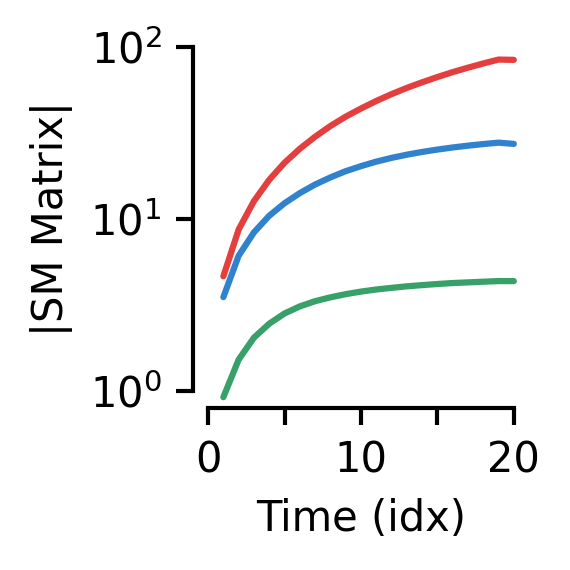

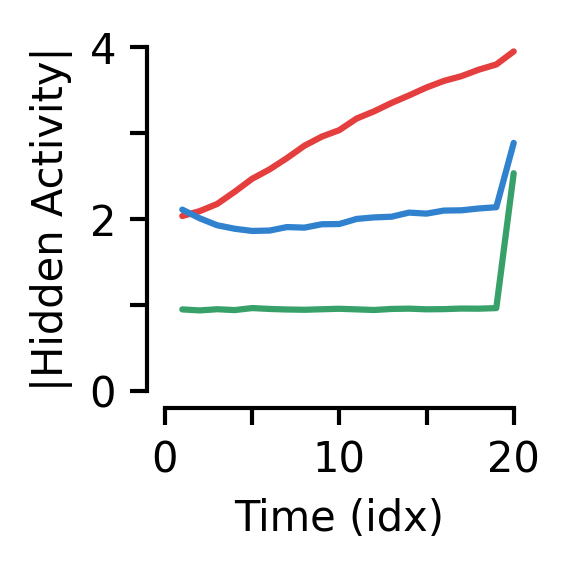

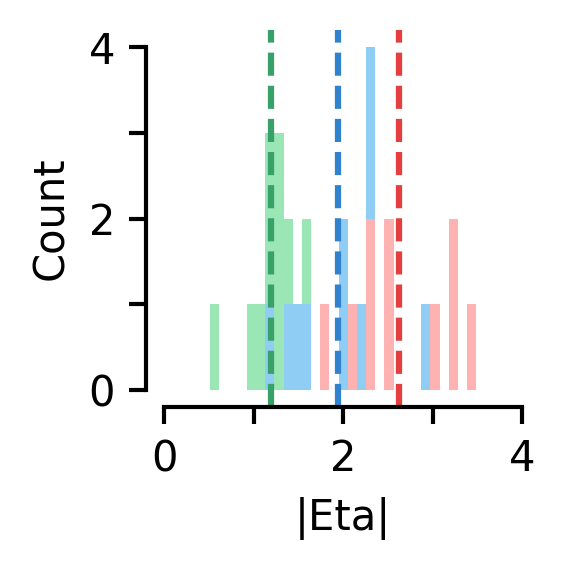

In [ ]:
print('Unbounded, acc: {:.3f} (std: {:.3f})'.format(
    accs[0].mean(), accs[0].std()
))
print('m_b = 1, acc: {:.3f} (std: {:.3f})'.format(
    accs[1].mean(), accs[1].std()
))
print('m_b = 0.1, acc: {:.3f} (std: {:.3f})'.format(
    accs[2].mean(), accs[2].std()
))

fig1, ax1 = plt.subplots(1, 1, figsize=(2, 2)) # Size of modulations
fig2, ax2 = plt.subplots(1, 1, figsize=(2, 2)) # Size of hidden activity
fig3, ax3 = plt.subplots(1, 1, figsize=(2, 2)) # Size of learned eta

times = np.arange(1, 21)
bins = np.linspace(0, 4, 40)
bin_counts = np.zeros(bins.shape)

for it_idx, it_val in enumerate(it_vals):
    ax1.plot(times, np.mean(A_mags[it_idx], axis=0), color=c_vals[it_idx])
    ax2.plot(times, np.mean(h_mags[it_idx], axis=0), color=c_vals[it_idx])

    counts, *_ = ax3.hist(np.abs(etas[it_idx]), color=c_vals_l[it_idx], bins=bins,
                         bottom=bin_counts[:-1])
    bin_counts[:-1] = bin_counts[:-1] + counts
    ax3.axvline(np.mean(np.abs(etas[it_idx])), color=c_vals[it_idx], 
                linestyle='dashed', zorder=1)

ax1.set_yscale('log')
ax1.set_ylabel('|SM Matrix|')
ax1.set_ylim((1e0, 1e2))
ax1.set_yticks((1e0, 1e1, 1e2,))
ax1.minorticks_off()

ax2.set_ylabel('|Hidden Activity|')
ax2.set_ylim((0, 4))
ax2.set_yticks((0, 1, 2, 3, 4,))
ax2.set_yticklabels((0, None, 2, None, 4,))

ax3.set_xlabel('|Eta|')
ax3.set_xlim((0, 4))
ax3.set_xticks((0, 1, 2, 3, 4))
ax3.set_xticklabels((0, None, 2, None, 4))
ax3.set_ylabel('Count')
ax3.set_ylim((0, 4))
ax3.set_yticks((0, 1, 2, 3, 4))
ax3.set_yticklabels((0, None, 2, None, 4))

for ax in (ax1, ax2):
    ax.set_xlabel('Time (idx)')
    ax.set_xlim((0, 20))
    ax.set_xticks((0, 5, 10, 15, 20))
    ax.set_xticklabels((0, None, 10, None, 20))

for ax in (ax1, ax2, ax3):
    jetplot.breathe(ax=ax)


PC Dynamics plot

In [ ]:
it_idx = 2 # m_b = 0.1
trial_idx = 0
init_seed = 1001

turn_off_noise = True
test_set_size = 1000

# Loads network
load_path = load_root_start + save_root_more[it_idx] + STPN_load[0]
net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)

if turn_off_noise:
    print('Turning off noise for test set.')
    net_noise_type = net_load.noiseType
    net_load.noiseType = None

testData, testOutputMask, _ = syn.generate_data(
    test_set_size, toy_params_load, net_params_load['n_outputs'],
    raw_data=False, device=torch.device('cpu'), verbose=False)

db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)

print('Accuracy: {:.3f}'.format(db_load['acc']))

labels = np.array(testData[:,:,:][1][:, -1, 0].cpu())

# Generates labels for each word in input sequences 
word_to_input_vector_mat = np.zeros((len(toy_params_load['words']), net_params_load['n_inputs'],))
for word_idx, word in enumerate(toy_params_load['words']):
    word_to_input_vector_mat[word_idx] = toy_params_load['word_to_input_vector'][word]
word_labels = np.argmax(np.matmul(testData.tensors[0].cpu().numpy(), word_to_input_vector_mat.T), axis=-1)

# Gets running score from the sequence
running_score = get_running_scores(word_labels, toy_params_load)
score_diffs = running_score[:, :, 1] - running_score[:, :, 0]

hs = db_load['h'].detach().numpy()
print('Hidden states shape', hs.shape)
ro_matrix = np.array(net_load.w2.detach().cpu())
print('RO shape', ro_matrix.shape)

# Restores noise if it has been turned off
if turn_off_noise:
    net_load.noiseType = net_noise_type

# delta_hs, delta_As, delta_hs_theory, delta_hs_theory_seq, delta_As_theory, delta_As_theory_seq = get_word_deflections(net_load, db_load, word_labels, toy_params_load, net_params_load)

Turning off noise for test set.
Accuracy: 0.985
Hidden states shape (1000, 20, 100)
RO shape (2, 100)


In [ ]:
n_components = 100
hidden_PCA = PCA(n_components=n_components)

hs_fit = hs

hidden_PCA.fit(hs_fit.reshape((-1, hs_fit.shape[-1])))

hs_pca = np.zeros((hs_fit.shape[0], hs_fit.shape[1], n_components,))

for batch_idx in range(hs_fit.shape[0]):
    hs_pca[batch_idx] = hidden_PCA.transform(hs_fit[batch_idx])

zero_matrix_pca = hidden_PCA.transform(np.zeros_like(ro_matrix))
ro_matrix_pca = hidden_PCA.transform(ro_matrix)

delta_hs_pca = []

# for word_idx in range(len(delta_hs)):
#     delta_hs_pca.append(np.matmul(delta_hs[word_idx], hidden_PCA.components_.T))
#     # delta_hs_pca.append(hidden_PCA.transform(delta_hs[word_idx]))

print('PCA shape:', hs_pca.shape)
print('Variances:', ['{:.2f}'.format(var) for var in hidden_PCA.explained_variance_[:10]])
print('PR: {:.2f}'.format(
    participation_ratio_vector(hidden_PCA.explained_variance_)))

if score_diffs.shape[1] == hs_fit.shape[1]+1: # Removes initial score diff
    score_diffs = score_diffs[:, 1:]

PCA shape: (1000, 20, 100)
Variances: ['0.71', '0.31', '0.09', '0.01', '0.00', '0.00', '0.00', '0.00', '0.00', '0.00']
PR: 2.05


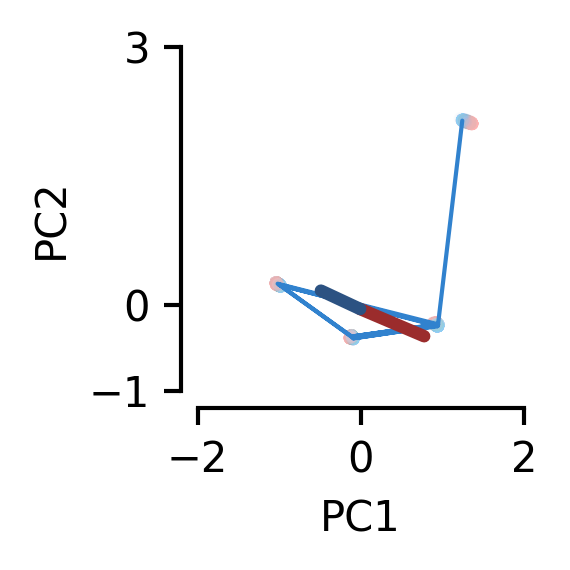

In [ ]:
import matplotlib.colors
from mpl_toolkits.axes_grid.inset_locator import (inset_axes, InsetPosition, mark_inset)

fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))
# fig3, ax3 = plt.subplots(1, 1, figsize=(2,2))
# fig2, ax2 = plt.subplots(1, 1, figsize=(2,2))

pcx = 0
pcy = 1

phrase_len = hs.shape[1]

label_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", [
    c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], '#e2e8f0', 
    c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1],
])
max_score = toy_params['phrase_length'] - 1

for batch_idx in range(hs.shape[0]):
    color_labels_l = c_vals_l[labels[batch_idx]]
    color_labels = c_vals[labels[batch_idx]]

    ax1.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], 
                c=score_diffs[batch_idx], linewidth=0.0,
                marker='.', zorder=0, alpha=0.05,
                cmap=label_cmap, vmin=-max_score, vmax=max_score)

# word_colors_l = (c_vals_l[0], c_vals_l[1], jetplot.colors.gray.v3, c_vals_l[3],)
# word_colors = (c_vals[0], c_vals[1], jetplot.colors.gray.v6, c_vals[3],)

# for batch_idx in range(hs.shape[0]):
#     color_labels_l = [word_colors_l[word_labels[batch_idx, seq_idx]] for seq_idx in range(phrase_len)]
#     color_labels = word_colors[word_labels[batch_idx, -1]]

#     ax2.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], linewidth=0.0,
#                 marker='.', color=color_labels_l, zorder=0, alpha=0.05)

for ro_idx in range(net_params['n_outputs']):
    ax1.plot([zero_matrix_pca[ro_idx, pcx], ro_matrix_pca[ro_idx, pcx]], 
            [zero_matrix_pca[ro_idx, pcy], ro_matrix_pca[ro_idx, pcy]],
                color=c_vals_d[ro_idx], linewidth=3.0, zorder=10)
    # ax2.plot([zero_matrix_pca[ro_idx, pcx], ro_matrix_pca[ro_idx, pcx]], 
    #         [zero_matrix_pca[ro_idx, pcy], ro_matrix_pca[ro_idx, pcy]],
    #             color=c_vals_dl[ro_idx], linewidth=3.0, zorder=10)

# Some sample paths
for batch_idx in (15,):
    ax1.plot(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy],
            color=c_vals[labels[batch_idx]], zorder=1, linewidth=1.0)

# iax2 = plt.axes([0,0,2,1])
# iax2.set_axes_locator(InsetPosition(ax2, [0.5,0.8,0.6,0.4]))
# # iax2.set_xlabel('$\Delta$PC{}'.format(pcx+1))
# # iax2.set_ylabel('$\Delta$PC{}'.format(pcy+1))
# for word_idx in range(3):
#     if word_idx == 2: # Grey for neutral
#         color_labels_l = jetplot.colors.gray.v3
#         color_labels = jetplot.colors.gray.v6
#     else:
#         color_labels_l = c_vals_l[word_idx]
#         color_labels = c_vals[word_idx]
#     iax2.scatter(delta_hs_pca[word_idx][:, pcx], delta_hs_pca[word_idx][:, pcy], 
#                  linewidth=0.0, marker='.', color=color_labels_l, 
#                  zorder=0, alpha=0.05)
#     iax2.plot((0, np.mean(delta_hs_pca[word_idx][:, pcx], axis=0)),
#               (0, np.mean(delta_hs_pca[word_idx][:, pcy], axis=0)), 
#               linewidth=1.5, color=color_labels, marker=None, 
#               zorder=5, alpha=1.0)

# iax2.set_xlim((-6, 6))
# iax2.set_ylim((-4, 4))
# iax2.set_xticks((-6, 0, 6))
# iax2.set_yticks((-4, 0, 4))
# iax2.set_xticklabels((-6, None, 6))
# iax2.set_yticklabels((-4, None, 4))

# iax2 = plt.axes([0,0,2,1])
# iax2.set_axes_locator(InsetPosition(ax2, [0.7,0.8,0.4,0.4]))
# # iax2.set_xlabel('$\Delta$PC{}'.format(pcx+1))
# # iax2.set_ylabel('$\Delta$PC{}'.format(pcy+1))
# word_colors = [c_vals_l[0], c_vals_l[1], jetplot.colors.gray.v3, c_vals_l[3]]  # Grey for neutral
# iax2.bar((0,1,2,3), mean_word_aligns, color=word_colors)

# iax2.set_xlim((-1, 4))
# iax2.set_xticks([])
# iax2.set_ylim((0, 1))
# iax2.set_yticks((0, 1))
# iax2.set_ylabel('RO align')
              
# iax2.spines["top"].set_visible(False)
# iax2.spines["right"].set_visible(False)
# # iax2.spines["bottom"].set_visible(False)
# # iax2.spines["left"].set_visible(False)
# for item in ([iax2.xaxis.label, iax2.yaxis.label] +
#              iax2.get_xticklabels() + iax2.get_yticklabels()):
#     item.set_fontsize(8)
# jetplot.breathe(ax=iax2)

# np.random.seed(12345)
# n_rand_neurons = 4
# max_batch_idx = 0
# while np.abs(score_diffs[max_batch_idx, -1]) < 0.5*max_score:
#     max_batch_idx = np.random.randint(0, hs_fit.shape[0])
# rand_idxs = np.random.randint(0, hs_fit.shape[-1], size=(n_rand_neurons,))

# neuron_colors = [jetplot.colors.teal.v4, jetplot.colors.teal.v5,
#                  jetplot.colors.teal.v6, jetplot.colors.teal.v7,
#                  jetplot.colors.teal.v8]

# for neuron_idx in range(n_rand_neurons):
#     ax3.plot(np.arange(1,21), hs_fit[max_batch_idx, :, rand_idxs[neuron_idx]], 
#              color=neuron_colors[neuron_idx])

# ax3.set_xlim((0, 20))
# ax3.set_ylim((-1, 1))
# ax3.set_xlabel('Time (idx)')
# ax3.set_ylabel('Sample Activity')
# ax3.set_xticks((0, 5, 10, 15, 20))
# ax3.set_xticklabels((0, None, 10, None, 20))

# ax3.axvspan(0.5, 19.5, color='grey', alpha=0.2, zorder=-5, linewidth=0)
# ax3.axvspan(19.5, 20.5, color=jetplot.colors.purple.v3, alpha=1.0, zorder=-5, linewidth=0)

for ax in (ax1,):
    
    ax.set_xlabel('PC{}'.format(pcx+1))
    ax.set_ylabel('PC{}'.format(pcy+1))
    ax.set_xlim((-2, 2))
    ax.set_ylim((-1, 3))
    ax.set_xticks((-2, 0, 2))
    ax.set_yticks((-1, 0, 3))

for ax in (ax1,):
    jetplot.breathe(ax=ax)

In [ ]:
# Flatten matrix dimensions (but not batch and seq)
projection_type = 'PCA' # 'PCA', 'time_PCA'
pc_comps = 200

As = db_load['A'].cpu().numpy()

# Adds A0 as initial state for all sequences
A0 = net_load.A0.cpu().numpy()
A0_batch = np.repeat(A0[np.newaxis, np.newaxis, :, :], As.shape[0], axis=0)
As = np.concatenate((A0_batch, As), axis=1)
As_fit = As

if running_score.shape[1] < As_fit.shape[1]:
    running_score_init = np.concatenate((
        np.zeros((running_score.shape[0], 1, running_score.shape[-1],)), running_score
    ), axis=1)
    score_diffs_init = running_score_init[:, :, 1] - running_score_init[:, :, 0]

As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))
A_diffs = As_flat[:, 1:, :] - As_flat[:, :-1, :] # note, already flattened

if projection_type == 'PCA':
    a_PCA = PCA(n_components=pc_comps)

    a_PCA.fit(As_flat.reshape((-1, As_flat.shape[-1])))
    
    # # Fit to one subset, but plot the other
    # As_fit = As[:, epoch_idxs[2]:toy_params['phrase_length']-1, :, :]
    # As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))

    As_pca = np.zeros((As_flat.shape[0], As_flat.shape[1], pc_comps))
    A_diffs_pca = np.zeros((A_diffs.shape[0], A_diffs.shape[1], pc_comps))
    # A_diffs_pca = np.zeros((As_flat.shape[0], As_flat.shape[1]-1, pc_comps))
    A_zeros = np.zeros_like(As_flat[0, 0:1, :])
    for batch_idx in range(As.shape[0]):
        As_pca[batch_idx] = a_PCA.transform(As_flat[batch_idx])
        A_diffs_pca[batch_idx] = np.matmul(A_diffs[batch_idx], a_PCA.components_.T)
        # A_diffs_ca
    A_zeros_pca = a_PCA.transform(A_zeros)

    # if toy_params['data_type'] == 'int':
    #     As_spec = np.copy(db_special['A'])
    #     As_spec_flat = As_spec.reshape((As_spec.shape[0], As_spec.shape[1], As_spec.shape[2]*As_spec.shape[3]))
    #     As_spec_pca = np.zeros((As_spec_flat.shape[0], As_spec_flat.shape[1], pc_comps))
    #     for batch_idx in range(hs_spec.shape[0]):
    #         As_spec_pca[batch_idx] = a_PCA.transform(As_spec_flat[batch_idx])

    # delta_As_pca = []
    # for word_idx in range(len(delta_As)):
    #     delta_As_pca.append(np.matmul(np.reshape(delta_As[word_idx], (delta_As[word_idx].shape[0], -1)), 
    #                                   a_PCA.components_.T))
elif projection_type == 'time_PCA':
    As_pca, proj_matrix, center_vector = timeAndPCAProject(As_flat, pc_comps=pc_comps)

    # delta_As_pca = []
    # for word_idx in range(len(delta_As)):
    #     delta_As_pca.append(np.matmul(np.reshape(delta_As[word_idx], (delta_As[word_idx].shape[0], -1)), 
    #                                   proj_matrix.T))

print('PCA shape:', As_pca.shape)
print('Variances:', ['{:.2f}'.format(var) for var in a_PCA.explained_variance_[:10]])
print('PR: {:.2f}'.format(
    participation_ratio_vector(a_PCA.explained_variance_)))

PCA shape: (1000, 21, 200)
Variances: ['4.42', '1.73', '0.49', '0.20', '0.09', '0.04', '0.03', '0.03', '0.02', '0.02']
PR: 2.25


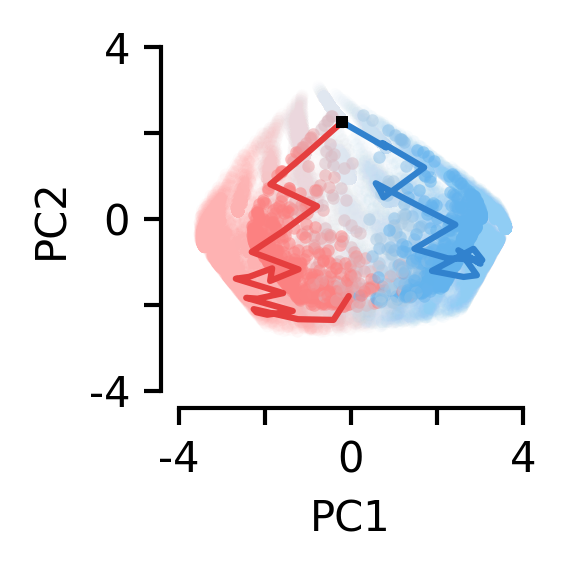

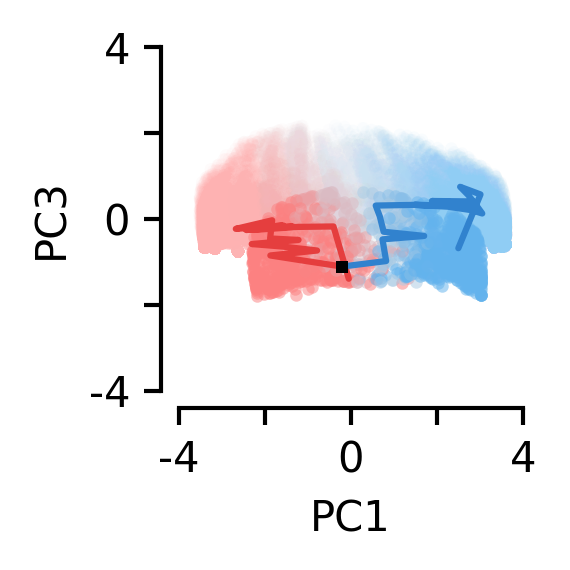

In [ ]:
color_type = 'labels' # 'labels', 'words', 'seq_idx'

fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2,2))

pcxs = (0, 0)
pcys = (1, 2)

label_cmap_d = matplotlib.colors.LinearSegmentedColormap.from_list("", [
    c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], '#cbd5e0', 
    c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1],
])

for ax, pcx, pcy in zip((ax1, ax2), pcxs, pcys):
    for batch_idx in range(hs.shape[0]):
        color_labels_ld = c_vals_ld[labels[batch_idx]]
        color_labels_l = c_vals_l[labels[batch_idx]]
        color_labels = c_vals[labels[batch_idx]]

        ax.scatter(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy], c=score_diffs_init[batch_idx],
                   linewidth=0.0, marker='.', zorder=0, alpha=0.05,
                   cmap=label_cmap, vmin=-max_score, vmax=max_score)
        ax.scatter(As_pca[batch_idx, -1, pcx], As_pca[batch_idx, -1, pcy], c=score_diffs_init[batch_idx, -1],
                   linewidth=0.0, marker='.', zorder=1, alpha=0.5,
                   cmap=label_cmap_d, vmin=-max_score, vmax=max_score)

    # for batch_idx in range(hs_spec.shape[0]):
    # for batch_idx in range(len(toy_params['words'])-1):
    #     ax.plot(As_spec_pca[batch_idx, :, pcx], As_spec_pca[batch_idx, :, pcy], 
    #             color=c_vals[batch_idx], marker='.', zorder=5)

    # Initial point (only uses first batch)
    ax.plot(As_pca[0, 0, pcx], As_pca[0, 0, pcy], marker='s',
            color='k', zorder=10, markersize=3)

    # if pcx == 0:
    #     ax.set_xlabel('Time dir.')
    # else:
    ax.set_xlabel('PC{}'.format(pcx+1))
    # if pcy == 0:
    #     ax.set_ylabel('Time dir.')
    # else:
    ax.set_ylabel('PC{}'.format(pcy+1))

    # Some sample paths
    for batch_idx in (11, 15):
        ax.plot(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy],
                color=c_vals[labels[batch_idx]], zorder=6)

# iax2 = plt.axes([0,0,2,1])
# iax2.set_axes_locator(InsetPosition(ax2, [0.5,0.75,0.6,0.4]))
# # iax2.set_xlabel('$\Delta$PC{}'.format(pcx+1))
# # iax2.set_ylabel('$\Delta$PC{}'.format(pcy+1))
# for word_idx in range(4):
#     if word_idx == 2: # Grey for neutral
#         color_labels_l = jetplot.colors.gray.v3
#         color_labels = jetplot.colors.gray.v6
#     else:
#         color_labels_l = c_vals_l[word_idx]
#         color_labels = c_vals[word_idx]
#     iax2.scatter(delta_As_pca[word_idx][:, pcx], delta_As_pca[word_idx][:, pcy], 
#                  linewidth=0.0, marker='.', color=color_labels_l, 
#                  zorder=0, alpha=0.05)
#     iax2.plot((0, np.mean(delta_As_pca[word_idx][:, pcx], axis=0)),
#               (0, np.mean(delta_As_pca[word_idx][:, pcy], axis=0)), 
#               linewidth=1.5, color=color_labels, marker=None, 
#               zorder=5, alpha=1.0)

# iax2.set_xlim((-7, 7))
# iax2.set_ylim((-5, 5))
# iax2.set_xticks((-7, 0, 7))
# iax2.set_yticks((-5, 0, 5))
# iax2.set_xticklabels((-7, None, 7))
# iax2.set_yticklabels((-5, None, 5))
# iax2.spines["top"].set_visible(False)
# iax2.spines["right"].set_visible(False)
# # iax2.spines["bottom"].set_visible(False)
# # iax2.spines["left"].set_visible(False)
# for item in ([iax2.xaxis.label, iax2.yaxis.label] +
#              iax2.get_xticklabels() + iax2.get_yticklabels()):
#     item.set_fontsize(8)
# jetplot.breathe(ax=iax2)

ax1.set_ylim((-4, 4))
ax1.set_yticks((-4, -2, 0, 2, 4))
ax1.set_yticklabels((-4, None, 0, None, 4))
ax2.set_ylim((-4, 4))
ax2.set_yticks((-4, -2, 0, 2, 4))
ax2.set_yticklabels((-4, None, 0, None, 4))
for ax in (ax1, ax2):
    ax.set_xlim((-4, 4))
    ax.set_xticks((-4, -2, 0, 2, 4))
    ax.set_xticklabels((-4, None, 0, None, 4))

for ax in (ax1, ax2):

    jetplot.breathe(ax=ax)

#### **Pre Only Modulations**

In [ ]:
n_trials = 10
acc_thresh = 0.97
# input_size = 10

save = True
save_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/preonly_mod_'

save_root_more = (
    'baseline_',
    'preonly_',
    'postonly_',
)

it_vals = (# hebb_type,
    'inputOutput',
    'input',
    'output',
)

phrase_length = 20

Training, no need to run if loading

In [ ]:
for it_idx, it_val in enumerate(it_vals):
    save_root = save_root_start+save_root_more[it_idx]
    hebb_type = it_val
    print('Hebb type: {}'.format(it_val))

    for trial_idx in range(n_trials):
        # Note redefines toy_params internal to the loop so that a new random 
        # set of word vectors will be drawn for each trial
        ########## Toy data parameters ##########
        toy_params = {
            'data_type': 'int', # int, context
            
            'phrase_length': phrase_length,
            'n_classes': 3,
            'input_type': 'binary',    # one hot, binary, binary1-1
            'input_size': 50,          # defaults to length of words
            'include_eos': True,

            'stack_phrases': False,
            'n_stack': 1,
            'include_sos': False,
            'n_delay': 0, # Inserts delay words between at end of phrase (but before eos trigger)
            'delay_word': '<delay>', # '<delay>' or 'null'

            'uniform_score': True, # Uniform distribution over scores=
        }

        net_params = {
            'netType': 'HebbNet_M', # HebbNet, HebbNet_M, VanillaRNN, GRU, rHebbNet, rHebbNet_M, GHU, GHU_M
            'n_inputs': toy_params['input_size'],         # input dim
            'n_hidden': 100,                      # hidden dim
            'n_outputs': toy_params['n_classes'],         # output dim
            # 'n_outputs': 10,                                # train with larger number of outputs for generalization tests    
            'f_act': 'tanh',         # 1st layer actiivation function # linear, sigmoid, tanh, relu
            'f0_act': 'linear',      # 2nd layer actiivation function
            'trainable_state0': False,
            
            # STPN Features
            'A_act': None,            # Activation on the A update (tanh or None)
            'lam_clamp': 0.95,   # Maximum lambda value
            'eta_type': 'scalar',     # scalar or vector
            'eta_force': None,        # ensure either Hebbian or anti-Hebbian plasticity
            'hebb_type': hebb_type,      # input, output, inputOutput

            # Train parameters
            'train_mode': 'seq_inf',   # 'seq' or 'seq_inf'
            'weight_reg': 'L1',
            'reg_lambda': 1e-4,
            'hidden_bias': True,
            'ro_bias': False,           # use readout bias or not
            'gradient_clip': 10,
            'freeze_inputs': False,      # freeze the input layer (and hidden bias)
            'sparsification': 0.0,      # Amount to sparsify network's weights (0.0 = no sparsification)
            'noise_type': 'input',      # None, 'input', 'hidden'
            'noise_scale': 0.1,         # Expected magnitude of noise vector
            'cuda': True,
            'validEarlyStop': False,     # Early stop when average validation loss saturates
            'accEarlyStop': acc_thresh,   
            'minMaxIter': (2000, 10000),
            'seed': 1001 + trial_idx,   # This seed is used to generate training/valid data too

            'train_set_size': 3200,
            'valid_set_size': 500,
            'batch_size': 64,
            'epochs': 1,
        }
        # Keep forgetting to turn this on for RNNs, so just automate it
        net_params['hidden_bias'] = False if net_params['netType'] in ('HebbNet', 'HebbNet_M') else True

        print('Trial: {}'.format(trial_idx))
        verbose = True if trial_idx == 0 else False

        net, toy_params, net_params = train_network(net_params, toy_params, save=save, 
                                                    save_root=save_root, verbose=False)

Hebb type: inputOutput
Trial: 0
  Early Stop: valid accuracy threshold reached: 0.99
Trial: 1
  Early Stop: valid accuracy threshold reached: 0.99
Trial: 2
  Early Stop: valid accuracy threshold reached: 0.98
Trial: 3
  Early Stop: valid accuracy threshold reached: 1.00
Trial: 4
  Early Stop: valid accuracy threshold reached: 0.99
Trial: 5
  Early Stop: valid accuracy threshold reached: 1.00
Trial: 6
  Early Stop: valid accuracy threshold reached: 1.00
Trial: 7
  Early Stop: valid accuracy threshold reached: 0.99
Trial: 8
  Early Stop: valid accuracy threshold reached: 0.98
Trial: 9
  Early Stop: valid accuracy threshold reached: 1.00
Hebb type: input
Trial: 0
  Early Stop: valid accuracy threshold reached: 0.97
Trial: 1
  Early Stop: valid accuracy threshold reached: 0.98
Trial: 2
  Early Stop: valid accuracy threshold reached: 0.97
Trial: 3
  Early Stop: valid accuracy threshold reached: 0.98
Trial: 4
  Early Stop: maximum iterations reached, acc: 0.96
Trial: 5
  Early Stop: maximum 

Loading and analyzing

In [ ]:
load_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/preonly_mod_'

STPN_load = ['HebbNet_M[50,100,2]_train=seq_inf_task=int_2class_20len',]

init_seed = 1001
test_set_size = 100

accs = np.zeros((len(it_vals), n_trials,))
etas = np.zeros((len(it_vals), n_trials,))

for it_idx, it_val in enumerate(it_vals):

    hebb_type = it_val
    print('Hebb type: {}'.format(it_val))

    for trial_idx in range(n_trials):
        load_path = load_root_start + save_root_more[it_idx] + STPN_load[0]

        net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
        
        testData, testOutputMask, _ = syn.generate_data(
            test_set_size, toy_params_load, net_params_load['n_outputs'],
            raw_data=False, device=torch.device('cpu'), verbose=False)
        
        db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)
        accs[it_idx, trial_idx] = db_load['acc']
        etas[it_idx, trial_idx] = net_load.eta.detach().cpu().numpy()[0, 0, 0]

        print('  Acc: {:.3f}, Eta: {:.3f}'.format(accs[it_idx, trial_idx], etas[it_idx, trial_idx]))

print('input-output, acc: {:.3f} (std: {:.3f})'.format(
    accs[0].mean(), accs[0].std()
))
print('input only, acc: {:.3f} (std: {:.3f})'.format(
    accs[1].mean(), accs[1].std()
))
print('output only, acc: {:.3f} (std: {:.3f})'.format(
    accs[2].mean(), accs[2].std()
))

Hebb type: inputOutput


ValueError: ignored

PC Dynamics plot

In [ ]:
it_idx = 1 # pre-only
trial_idx = 3
init_seed = 1001

turn_off_noise = True
test_set_size = 1000

# Loads network
STPN_load = ['HebbNet_M[50,100,2]_train=seq_inf_task=int_2class_20len',]

# Uses networks specifically trained to tell differences in update rules
# load_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/preonly_mod_'
# load_path = load_root_start + save_root_more[it_idx] + STPN_load[0]

# Uses longer phrases flow result
load_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/lambdasMinIt_1factor_small095_'
load_path = load_root_start + STPN_load[0]

net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)

if turn_off_noise:
    print('Turning off noise for test set.')
    net_noise_type = net_load.noiseType
    net_load.noiseType = None

testData, testOutputMask, _ = syn.generate_data(
    test_set_size, toy_params_load, net_params_load['n_outputs'],
    raw_data=False, device=torch.device('cpu'), verbose=False)

db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)

print('Accuracy: {:.3f}'.format(db_load['acc']))

labels = np.array(testData[:,:,:][1][:, -1, 0].cpu())

# Generates labels for each word in input sequences 
word_to_input_vector_mat = np.zeros((len(toy_params_load['words']), net_params_load['n_inputs'],))
for word_idx, word in enumerate(toy_params_load['words']):
    word_to_input_vector_mat[word_idx] = toy_params_load['word_to_input_vector'][word]
word_labels = np.argmax(np.matmul(testData.tensors[0].cpu().numpy(), word_to_input_vector_mat.T), axis=-1)

# Gets running score from the sequence
running_score = get_running_scores(word_labels, toy_params_load)
score_diffs = running_score[:, :, 1] - running_score[:, :, 0]

hs = db_load['h'].detach().numpy()
print('Hidden states shape', hs.shape)
ro_matrix = np.array(net_load.w2.detach().cpu())
print('RO shape', ro_matrix.shape)

# Gets alignment of individual clusters with ROs
hs_flat = hs.reshape((-1, hs.shape[-1]))
word_labels_flat = word_labels.flatten()
word_hs = []
mean_word_aligns = []

for word_idx in range(len(toy_params_load['words'])):
    word_hs.append(hs_flat[word_idx == word_labels_flat])
    # print(word_hs[-1].shape)

    word_PCA = PCA()
    word_PCA.fit(word_hs[-1])

    word_aligns = []
    for ro_idx in range(ro_matrix.shape[0]):
        min_angle = np.min((get_align_angle(word_PCA.components_[0], ro_matrix[ro_idx]),
                            get_align_angle(-1*word_PCA.components_[0], ro_matrix[ro_idx])))
        word_aligns.append(np.cos(np.pi/180*min_angle))
        # print('Word {} RO {} - angle: {:.2f}'.format(
        #     toy_params_load['words'][word_idx], ro_idx, np.cos(np.pi/180*min_angle)
        # ))
    mean_word_aligns.append(np.mean(word_aligns))

# Restores noise if it has been turned off
if turn_off_noise:
    net_load.noiseType = net_noise_type

delta_hs, delta_As, delta_hs_theory, delta_hs_theory_seq, delta_As_theory, delta_As_theory_seq = get_word_deflections(net_load, db_load, word_labels, toy_params_load, net_params_load)

Turning off noise for test set.
Accuracy: 0.982
Hidden states shape (1000, 20, 100)
RO shape (2, 100)
  Word 'evid0' count: 6030
  Word 'evid1' count: 6085
  Word 'null' count: 5885
  Word '<eos>' count: 1000
  Word 'evid0' theory acc: h 1.656 // A 0.413 // dA 2.384
  Word 'evid1' theory acc: h 1.683 // A 0.561 // dA 3.143
  Word 'null' theory acc: h 2.759 // A 0.268 // dA 1.279
  Word '<eos>' theory acc: h 4.735 // A 0.105 // dA 1.136
Outputing for HebbNet_M


In [ ]:
n_components = 100
hidden_PCA = PCA(n_components=n_components)

hs_fit = hs

hidden_PCA.fit(hs_fit.reshape((-1, hs_fit.shape[-1])))

hs_pca = np.zeros((hs_fit.shape[0], hs_fit.shape[1], n_components,))

for batch_idx in range(hs_fit.shape[0]):
    hs_pca[batch_idx] = hidden_PCA.transform(hs_fit[batch_idx])

zero_matrix_pca = hidden_PCA.transform(np.zeros_like(ro_matrix))
ro_matrix_pca = hidden_PCA.transform(ro_matrix)

delta_hs_pca = []

for word_idx in range(len(delta_hs)):
    delta_hs_pca.append(np.matmul(delta_hs[word_idx], hidden_PCA.components_.T))
    # delta_hs_pca.append(hidden_PCA.transform(delta_hs[word_idx]))

print('PCA shape:', hs_pca.shape)
print('Variances:', ['{:.2f}'.format(var) for var in hidden_PCA.explained_variance_[:10]])
print('PR: {:.2f}'.format(
    participation_ratio_vector(hidden_PCA.explained_variance_)))

if score_diffs.shape[1] == hs_fit.shape[1]+1: # Removes initial score diff
    score_diffs = score_diffs[:, 1:]

PCA shape: (1000, 20, 100)
Variances: ['1.13', '0.02', '0.01', '0.00', '0.00', '0.00', '0.00', '0.00', '0.00', '0.00']
PR: 1.06


/usr/local/lib/python3.8/dist-packages/IPython/core/events.py:88: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)


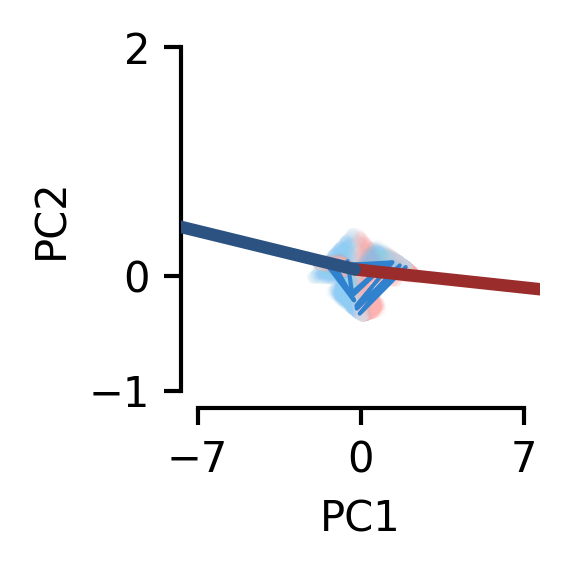

/usr/local/lib/python3.8/dist-packages/IPython/core/pylabtools.py:128: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


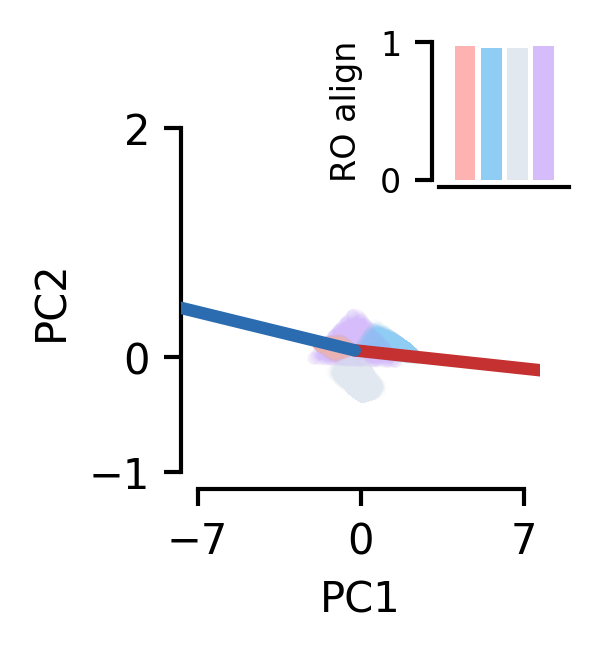

In [ ]:
import matplotlib.colors
import mpl_toolkits
from mpl_toolkits.axes_grid.inset_locator import (inset_axes, InsetPosition, mark_inset)

fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))
# fig3, ax3 = plt.subplots(1, 1, figsize=(2,2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2,2))

pcx = 0
pcy = 1

phrase_len = hs.shape[1]

label_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", [
    c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], '#e2e8f0', 
    c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1],
])
max_score = toy_params_load['phrase_length'] - 1

for batch_idx in range(hs.shape[0]):
    color_labels_l = c_vals_l[labels[batch_idx]]
    color_labels = c_vals[labels[batch_idx]]

    ax1.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], 
                c=score_diffs[batch_idx], linewidth=0.0,
                marker='.', zorder=0, alpha=0.05,
                cmap=label_cmap, vmin=-max_score, vmax=max_score)

word_colors_l = (c_vals_l[0], c_vals_l[1], '#e2e8f0', c_vals_l[3],)
word_colors = (c_vals[0], c_vals[1], '#718096', c_vals[3],)

for batch_idx in range(hs.shape[0]):
    color_labels_l = [word_colors_l[word_labels[batch_idx, seq_idx]] for seq_idx in range(phrase_len)]
    color_labels = word_colors[word_labels[batch_idx, -1]]

    ax2.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], linewidth=0.0,
                marker='.', color=color_labels_l, zorder=0, alpha=0.05)

for ro_idx in range(net_params_load['n_outputs']):
    ax1.plot([zero_matrix_pca[ro_idx, pcx], ro_matrix_pca[ro_idx, pcx]], 
            [zero_matrix_pca[ro_idx, pcy], ro_matrix_pca[ro_idx, pcy]],
                color=c_vals_d[ro_idx], linewidth=3.0, zorder=10)
    ax2.plot([zero_matrix_pca[ro_idx, pcx], ro_matrix_pca[ro_idx, pcx]], 
            [zero_matrix_pca[ro_idx, pcy], ro_matrix_pca[ro_idx, pcy]],
                color=c_vals_dl[ro_idx], linewidth=3.0, zorder=10)

# Some sample paths
for batch_idx in (15,):
    ax1.plot(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy],
            color=c_vals[labels[batch_idx]], zorder=1, linewidth=1.0)

# iax2 = plt.axes([0,0,2,1])
# iax2.set_axes_locator(InsetPosition(ax2, [0.5,0.8,0.6,0.4]))
# # iax2.set_xlabel('$\Delta$PC{}'.format(pcx+1))
# # iax2.set_ylabel('$\Delta$PC{}'.format(pcy+1))
# for word_idx in range(3):
#     if word_idx == 2: # Grey for neutral
#         color_labels_l = jetplot.colors.gray.v3
#         color_labels = jetplot.colors.gray.v6
#     else:
#         color_labels_l = c_vals_l[word_idx]
#         color_labels = c_vals[word_idx]
#     iax2.scatter(delta_hs_pca[word_idx][:, pcx], delta_hs_pca[word_idx][:, pcy], 
#                  linewidth=0.0, marker='.', color=color_labels_l, 
#                  zorder=0, alpha=0.05)
#     iax2.plot((0, np.mean(delta_hs_pca[word_idx][:, pcx], axis=0)),
#               (0, np.mean(delta_hs_pca[word_idx][:, pcy], axis=0)), 
#               linewidth=1.5, color=color_labels, marker=None, 
#               zorder=5, alpha=1.0)

# iax2.set_xlim((-6, 6))
# iax2.set_ylim((-4, 4))
# iax2.set_xticks((-6, 0, 6))
# iax2.set_yticks((-4, 0, 4))
# iax2.set_xticklabels((-6, None, 6))
# iax2.set_yticklabels((-4, None, 4))

iax2 = plt.axes([0,0,2,1])
iax2.set_axes_locator(InsetPosition(ax2, [0.7,0.8,0.4,0.4]))
# iax2.set_xlabel('$\Delta$PC{}'.format(pcx+1))
# iax2.set_ylabel('$\Delta$PC{}'.format(pcy+1))
word_colors = [c_vals_l[0], c_vals_l[1], '#e2e8f0', c_vals_l[3]]  # Grey for neutral
iax2.bar((0,1,2,3), mean_word_aligns, color=word_colors)

iax2.set_xlim((-1, 4))
iax2.set_xticks([])
iax2.set_ylim((0, 1))
iax2.set_yticks((0, 1))
iax2.set_ylabel('RO align')
              
iax2.spines["top"].set_visible(False)
iax2.spines["right"].set_visible(False)
# iax2.spines["bottom"].set_visible(False)
# iax2.spines["left"].set_visible(False)
for item in ([iax2.xaxis.label, iax2.yaxis.label] +
             iax2.get_xticklabels() + iax2.get_yticklabels()):
    item.set_fontsize(8)
jetplot.breathe(ax=iax2)

# np.random.seed(12345)
# n_rand_neurons = 4
# max_batch_idx = 0
# while np.abs(score_diffs[max_batch_idx, -1]) < 0.5*max_score:
#     max_batch_idx = np.random.randint(0, hs_fit.shape[0])
# rand_idxs = np.random.randint(0, hs_fit.shape[-1], size=(n_rand_neurons,))

# neuron_colors = [jetplot.colors.teal.v4, jetplot.colors.teal.v5,
#                  jetplot.colors.teal.v6, jetplot.colors.teal.v7,
#                  jetplot.colors.teal.v8]

# for neuron_idx in range(n_rand_neurons):
#     ax3.plot(np.arange(1,21), hs_fit[max_batch_idx, :, rand_idxs[neuron_idx]], 
#              color=neuron_colors[neuron_idx])

# ax3.set_xlim((0, 20))
# ax3.set_ylim((-1, 1))
# ax3.set_xlabel('Time (idx)')
# ax3.set_ylabel('Sample Activity')
# ax3.set_xticks((0, 5, 10, 15, 20))
# ax3.set_xticklabels((0, None, 10, None, 20))

# ax3.axvspan(0.5, 19.5, color='grey', alpha=0.2, zorder=-5, linewidth=0)
# ax3.axvspan(19.5, 20.5, color=jetplot.colors.purple.v3, alpha=1.0, zorder=-5, linewidth=0)

for ax in (ax1, ax2):
    
    ax.set_xlabel('PC{}'.format(pcx+1))
    ax.set_ylabel('PC{}'.format(pcy+1))
    ax.set_xlim((-7, 7))
    ax.set_ylim((-1, 2))
    ax.set_xticks((-7, 0, 7))
    ax.set_yticks((-1, 0, 2))

for ax in (ax1, ax2):
    jetplot.breathe(ax=ax)

In [ ]:
# Flatten matrix dimensions (but not batch and seq)
projection_type = 'PCA' # 'PCA', 'time_PCA'
pc_comps = 200

As = db_load['A'].cpu().numpy()

# Adds A0 as initial state for all sequences
A0 = net_load.A0.cpu().numpy()
A0_batch = np.repeat(A0[np.newaxis, np.newaxis, :, :], As.shape[0], axis=0)
As = np.concatenate((A0_batch, As), axis=1)
As_fit = As

if running_score.shape[1] < As_fit.shape[1]:
    running_score_init = np.concatenate((
        np.zeros((running_score.shape[0], 1, running_score.shape[-1],)), running_score
    ), axis=1)
    score_diffs_init = running_score_init[:, :, 1] - running_score_init[:, :, 0]

As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))
A_diffs = As_flat[:, 1:, :] - As_flat[:, :-1, :] # note, already flattened

if projection_type == 'PCA':
    a_PCA = PCA(n_components=pc_comps)

    a_PCA.fit(As_flat.reshape((-1, As_flat.shape[-1])))
    
    # # Fit to one subset, but plot the other
    # As_fit = As[:, epoch_idxs[2]:toy_params['phrase_length']-1, :, :]
    # As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))

    As_pca = np.zeros((As_flat.shape[0], As_flat.shape[1], pc_comps))
    A_diffs_pca = np.zeros((A_diffs.shape[0], A_diffs.shape[1], pc_comps))
    # A_diffs_pca = np.zeros((As_flat.shape[0], As_flat.shape[1]-1, pc_comps))
    A_zeros = np.zeros_like(As_flat[0, 0:1, :])
    for batch_idx in range(As.shape[0]):
        As_pca[batch_idx] = a_PCA.transform(As_flat[batch_idx])
        A_diffs_pca[batch_idx] = np.matmul(A_diffs[batch_idx], a_PCA.components_.T)
        # A_diffs_ca
    A_zeros_pca = a_PCA.transform(A_zeros)

    # if toy_params['data_type'] == 'int':
    #     As_spec = np.copy(db_special['A'])
    #     As_spec_flat = As_spec.reshape((As_spec.shape[0], As_spec.shape[1], As_spec.shape[2]*As_spec.shape[3]))
    #     As_spec_pca = np.zeros((As_spec_flat.shape[0], As_spec_flat.shape[1], pc_comps))
    #     for batch_idx in range(hs_spec.shape[0]):
    #         As_spec_pca[batch_idx] = a_PCA.transform(As_spec_flat[batch_idx])

    delta_As_pca = []
    for word_idx in range(len(delta_As)):
        delta_As_pca.append(np.matmul(np.reshape(delta_As[word_idx], (delta_As[word_idx].shape[0], -1)), 
                                      a_PCA.components_.T))
elif projection_type == 'time_PCA':
    As_pca, proj_matrix, center_vector = timeAndPCAProject(As_flat, pc_comps=pc_comps)

    # delta_As_pca = []
    # for word_idx in range(len(delta_As)):
    #     delta_As_pca.append(np.matmul(np.reshape(delta_As[word_idx], (delta_As[word_idx].shape[0], -1)), 
    #                                   proj_matrix.T))

print('PCA shape:', As_pca.shape)
print('Variances:', ['{:.2f}'.format(var) for var in a_PCA.explained_variance_[:10]])
print('PR: {:.2f}'.format(
    participation_ratio_vector(a_PCA.explained_variance_)))

PCA shape: (1000, 21, 200)
Variances: ['288.17', '160.42', '117.52', '0.95', '0.00', '0.00', '0.00', '0.00', '0.00', '0.00']
PR: 2.62


/usr/local/lib/python3.8/dist-packages/IPython/core/events.py:88: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)


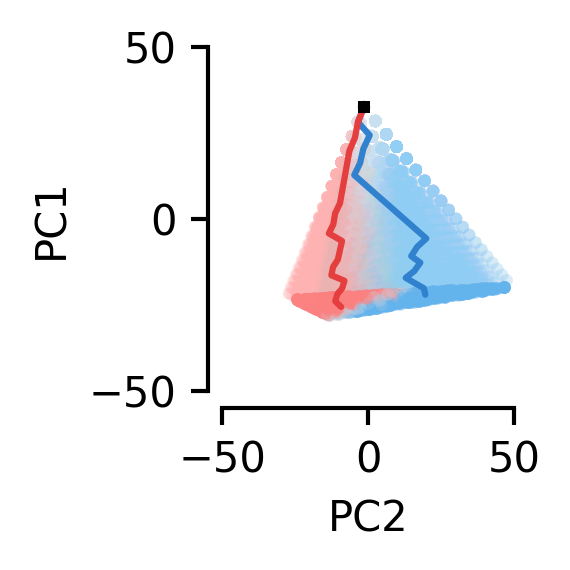

/usr/local/lib/python3.8/dist-packages/IPython/core/pylabtools.py:128: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


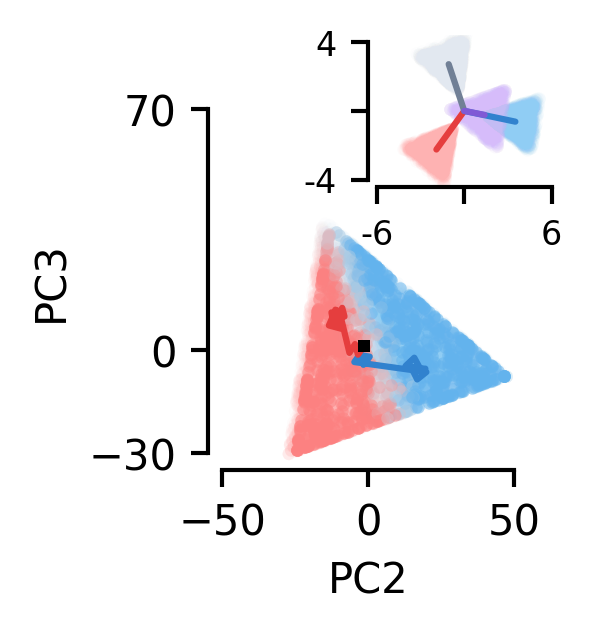

In [ ]:
color_type = 'labels' # 'labels', 'words', 'seq_idx'

fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2,2))

pcxs = (1, 1)
pcys = (0, 2)

label_cmap_d = matplotlib.colors.LinearSegmentedColormap.from_list("", [
    c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], '#cbd5e0', 
    c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1],
])

for ax, pcx, pcy in zip((ax1, ax2), pcxs, pcys):
    for batch_idx in range(hs.shape[0]):
        color_labels_ld = c_vals_ld[labels[batch_idx]]
        color_labels_l = c_vals_l[labels[batch_idx]]
        color_labels = c_vals[labels[batch_idx]]

        ax.scatter(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy], c=score_diffs_init[batch_idx],
                   linewidth=0.0, marker='.', zorder=0, alpha=0.05,
                   cmap=label_cmap, vmin=-max_score, vmax=max_score)
        ax.scatter(As_pca[batch_idx, -1, pcx], As_pca[batch_idx, -1, pcy], c=score_diffs_init[batch_idx, -1],
                   linewidth=0.0, marker='.', zorder=1, alpha=0.5,
                   cmap=label_cmap_d, vmin=-max_score, vmax=max_score)

    # for batch_idx in range(hs_spec.shape[0]):
    # for batch_idx in range(len(toy_params['words'])-1):
    #     ax.plot(As_spec_pca[batch_idx, :, pcx], As_spec_pca[batch_idx, :, pcy], 
    #             color=c_vals[batch_idx], marker='.', zorder=5)

    # Initial point (only uses first batch)
    ax.plot(As_pca[0, 0, pcx], As_pca[0, 0, pcy], marker='s',
            color='k', zorder=10, markersize=3)

    # if pcx == 0:
    #     ax.set_xlabel('Time dir.')
    # else:
    ax.set_xlabel('PC{}'.format(pcx+1))
    # if pcy == 0:
    #     ax.set_ylabel('Time dir.')
    # else:
    ax.set_ylabel('PC{}'.format(pcy+1))

    # Some sample paths
    for batch_idx in (13, 10):
        ax.plot(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy],
                color=c_vals[labels[batch_idx]], zorder=6)

iax2 = plt.axes([0,0,2,1])
iax2.set_axes_locator(InsetPosition(ax2, [0.5,0.75,0.6,0.4]))
# iax2.set_xlabel('$\Delta$PC{}'.format(pcx+1))
# iax2.set_ylabel('$\Delta$PC{}'.format(pcy+1))
for word_idx in range(4):
    if word_idx == 2: # Grey for neutral
        color_labels_l = '#e2e8f0'
        color_labels = '#718096'
    else:
        color_labels_l = c_vals_l[word_idx]
        color_labels = c_vals[word_idx]
    iax2.scatter(delta_As_pca[word_idx][:, pcx], delta_As_pca[word_idx][:, pcy], 
                 linewidth=0.0, marker='.', color=color_labels_l, 
                 zorder=0, alpha=0.05)
    iax2.plot((0, np.mean(delta_As_pca[word_idx][:, pcx], axis=0)),
              (0, np.mean(delta_As_pca[word_idx][:, pcy], axis=0)), 
              linewidth=1.5, color=color_labels, marker=None, 
              zorder=5, alpha=1.0)

iax2.set_xlim((-6, 6))
iax2.set_ylim((-4, 4))
iax2.set_xticks((-6, 0, 6))
iax2.set_yticks((-4, 0, 4))
iax2.set_xticklabels((-6, None, 6))
iax2.set_yticklabels((-4, None, 4))
iax2.spines["top"].set_visible(False)
iax2.spines["right"].set_visible(False)
# iax2.spines["bottom"].set_visible(False)
# iax2.spines["left"].set_visible(False)
for item in ([iax2.xaxis.label, iax2.yaxis.label] +
             iax2.get_xticklabels() + iax2.get_yticklabels()):
    item.set_fontsize(8)
jetplot.breathe(ax=iax2)

ax1.set_ylim((-50, 50))
# ax1.set_yticks((-200, -2, 0, 2, 4))
# ax1.set_yticklabels((-4, None, 0, None, 4))
ax2.set_ylim((-30, 70))
ax2.set_yticks((-30, 0, 70))
# ax2.set_yticklabels((-4, None, 0, None, 4))
for ax in (ax1, ax2):
    ax.set_xlim((-50, 50))
    # ax.set_xticks((-4, -2, 0, 2, 4))
    # ax.set_xticklabels((-4, None, 0, None, 4))

for ax in (ax1, ax2):

    jetplot.breathe(ax=ax)

Tries to figure out why all the input clusters are so aligned for the MPNpre

In [ ]:
word_to_input_matrix = []
for word in toy_params_load['word_to_input_vector']:
    print(word)
    word_to_input_matrix.append(toy_params_load['word_to_input_vector'][word])
word_to_input_matrix = np.array(word_to_input_matrix)

word_to_input_matrix.shape


evid0
evid1
null
<eos>


(4, 50)

In [ ]:
# Gets exact variation 
eta = net_load.eta.detach().cpu().numpy()[0, 0]
lam = net_load.lam.detach().cpu().numpy() 
W_inp = net_load.w1.detach().cpu().numpy()
hidden_bias = net_load.b1.detach().cpu().numpy()

W_inp_x_x = np.zeros((word_to_input_matrix.shape[0],
                      word_to_input_matrix.shape[0],
                      W_inp.shape[0],))

for word_idx1 in range(word_to_input_matrix.shape[0]):
    for word_idx2 in range(word_to_input_matrix.shape[0]):
        W_inp_x_x[word_idx1, word_idx2] = np.matmul(
            word_to_input_matrix[word_idx1]*word_to_input_matrix[word_idx2], 
            W_inp.T
        )
        

# <EoS> deflection size:
for word_idx, word in enumerate(toy_params_load['word_to_input_vector']):
    if word_idx == word_to_input_matrix.shape[0] - 1:
        break
    print('Word: {}, EoS deflection size: {:.3f}'.format(
        word, np.linalg.norm(W_inp_x_x[3, word_idx])
    ))

# Now check align for each word with all words other than <eos>
eos_def = W_inp_x_x[3, 1]
for word_idx, word in enumerate(toy_params_load['word_to_input_vector']):
    if word_idx == word_to_input_matrix.shape[0] - 1:
        break
    word_def = W_inp_x_x[word_idx, 1] 
    print('T Word: {} align: {:.3f}'.format(
        word, get_align_angle(eos_def, word_def)
    ))



Word: evid0, EoS deflection size: 0.313
Word: evid1, EoS deflection size: 0.454
Word: null, EoS deflection size: 0.114
T Word: evid0 align: 150.915
T Word: evid1 align: 0.065
T Word: null align: 11.438


In [ ]:
it_idx = 1 # pre-only
trial_idx = 3
init_seed = 1001

turn_off_noise = True
test_set_size = 1000

# Loads network
STPN_load = ['HebbNet_M[50,100,2]_train=seq_inf_task=int_2class_20len',]

# Uses networks specifically trained to tell differences in update rules
# load_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/preonly_mod_'
# load_path = load_root_start + save_root_more[it_idx] + STPN_load[0]

# Uses longer phrases flow result
load_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/lambdasMinIt_1factor_small095_'
load_path = load_root_start + STPN_load[0]

net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)

if turn_off_noise:
    print('Turning off noise for test set.')
    net_noise_type = net_load.noiseType
    net_load.noiseType = None

testData, testOutputMask, _ = syn.generate_data(
    test_set_size, toy_params_load, net_params_load['n_outputs'],
    raw_data=False, device=torch.device('cpu'), verbose=False)

db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)

print('Accuracy: {:.3f}'.format(db_load['acc']))

labels = np.array(testData[:,:,:][1][:, -1, 0].cpu())

# Generates labels for each word in input sequences 
word_to_input_vector_mat = np.zeros((len(toy_params_load['words']), net_params_load['n_inputs'],))
for word_idx, word in enumerate(toy_params_load['words']):
    word_to_input_vector_mat[word_idx] = toy_params_load['word_to_input_vector'][word]
word_labels = np.argmax(np.matmul(testData.tensors[0].cpu().numpy(), word_to_input_vector_mat.T), axis=-1)

# Gets running score from the sequence
running_score = get_running_scores(word_labels, toy_params_load)
score_diffs = running_score[:, :, 1] - running_score[:, :, 0]

hs = db_load['h'].detach().numpy()
print('Hidden states shape', hs.shape)
ro_matrix = np.array(net_load.w2.detach().cpu())
print('RO shape', ro_matrix.shape)

# Gets exact variation 
eta = net_load.eta.detach().cpu().numpy()[0, 0]
lam = net_load.lam.detach().cpu().numpy() 
W_inp = net_load.w1.detach().cpu().numpy()
hidden_bias = net_load.b1.detach().cpu().numpy()

input_sequences = testData[:,:,:][0].cpu()

W_inp_x_x = np.zeros((word_to_input_matrix.shape[0],
                      word_to_input_matrix.shape[0],
                      W_inp.shape[0],))

for word_idx1 in range(word_to_input_matrix.shape[0]):
    for word_idx2 in range(word_to_input_matrix.shape[0]):
        W_inp_x_x[word_idx1, word_idx2] = np.matmul(
            word_to_input_matrix[word_idx1]*word_to_input_matrix[word_idx2], 
            W_inp.T
        )

n_batches = testData[:,:,:][0].shape[0]
seq_len = testData[:,:,:][0].shape[1]

h_vars = np.zeros(())

for batch_idx in range(n_batches):
    for seq_idx1 in range(seq_len):
        for seq_idx2 in range(seq_idx1):
            
            input_sequences[batch_idx, seq_idx]

W_inp_x = np.matmul(word_to_input_matrix, W_inp.T) # (n_words, n_hidden)



f_W_inp_x = net.f(torch.tensor(W_inp_x) + hidden_bias).numpy() if net.f is not None else torch.tensor(W_inp_x) + hidden_bias # (n_words, n_hidden)
eta_mult_term = (net.eta.detach().cpu().numpy()[0] * f_W_inp_x *
                np.matmul(word_to_input_matrix*word_to_input_matrix[word_proj_idx][np.newaxis, :], 
                            net.w1.detach().cpu().numpy().T)
) # (n_words, n_hidden)




# Gets alignment of individual clusters with ROs
hs_flat = hs.reshape((-1, hs.shape[-1]))
word_labels_flat = word_labels.flatten()
word_hs = []
mean_word_aligns = []

for word_idx in range(len(toy_params_load['words'])):
    word_hs.append(hs_flat[word_idx == word_labels_flat])
    # print(word_hs[-1].shape)

    word_PCA = PCA()
    word_PCA.fit(word_hs[-1])

    word_aligns = []
    for ro_idx in range(ro_matrix.shape[0]):
        min_angle = np.min((get_align_angle(word_PCA.components_[0], ro_matrix[ro_idx]),
                            get_align_angle(-1*word_PCA.components_[0], ro_matrix[ro_idx])))
        word_aligns.append(np.cos(np.pi/180*min_angle))
        # print('Word {} RO {} - angle: {:.2f}'.format(
        #     toy_params_load['words'][word_idx], ro_idx, np.cos(np.pi/180*min_angle)
        # ))
    mean_word_aligns.append(np.mean(word_aligns))

# Restores noise if it has been turned off
if turn_off_noise:
    net_load.noiseType = net_noise_type

delta_hs, delta_As, delta_hs_theory, delta_hs_theory_seq, delta_As_theory, delta_As_theory_seq = get_word_deflections(net_load, db_load, word_labels, toy_params_load, net_params_load)

### **Delay Neuron Variability**

Measures variability of neurons. 
 - Plots some random neurons as a function of time
 - Finds the variance of neurons as a function of time

In [ ]:
n_trials = 1

save = True
save_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/delaydynamics_'

delay_scales = (0.01, 0.05, 0.1,)

for delay_scale in delay_scales:
    
    save_root = save_root_start+str(delay_scale).replace('.', '')+'_'
    
    for trial_idx in range(n_trials):
        # Note redefines toy_params internal to the loop so that a new random 
        # set of word vectors will be drawn for each trial
        ########## Toy data parameters ##########
        toy_params = {
            'data_type': 'int', # int, context
            
            'phrase_length': 40,
            'n_classes': 3,
            'input_type': 'binary',    # one hot, binary, binary1-1
            'input_size': 50,          # defaults to length of words
            'include_eos': True,

            'stack_phrases': False,
            'n_stack': 1,
            'include_sos': False,
            'n_delay': 20, # Inserts delay words between at end of phrase (but before eos trigger)
            'delay_word': '<delay>', # '<delay>' or 'null'
            'delay_scale': delay_scale,

            'uniform_score': True, # Uniform distribution over scores=
        }

        net_params = {
            'netType': 'HebbNet_M', # HebbNet, HebbNet_M, VanillaRNN, GRU, rHebbNet, rHebbNet_M, GHU, GHU_M
            'n_inputs': toy_params['input_size'],           # input dim
            'n_hidden': 100,                                # hidden dim
            'n_outputs': toy_params['n_classes'],         # output dim
            # 'n_outputs': 10,                                # train with larger number of outputs for generalization tests    
            'f_act': 'tanh',         # 1st layer actiivation function # linear, sigmoid, tanh, relu
            'f0_act': 'linear',      # 2nd layer actiivation function
            'trainable_state0': False,
            
            # STPN Features
            'A_act': None,            # Activation on the A update (tanh or None)
            'lam_clamp': 0.95,          # Maximum lambda value
            'eta_type': 'scalar',       # scalar or vector
            'eta_force': None,        # ensure either Hebbian or anti-Hebbian plasticity
            'hebb_type': 'inputOutput',      # input, output, inputOutput

            # Train parameters
            'train_mode': 'seq_inf',   # 'seq' or 'seq_inf'
            'weight_reg': 'L1',
            'reg_lambda': 1e-2,
            'hidden_bias': False,
            'ro_bias': False,           # use readout bias or not
            'gradient_clip': 10,
            'freeze_inputs': False,      # freeze the input layer (and hidden bias)
            'sparsification': 0.0,      # Amount to sparsify network's weights (0.0 = no sparsification)
            'noise_type': 'input',      # None, 'input', 'hidden'
            'noise_scale': 0.1,         # Expected magnitude of noise vector
            'cuda': True,
            'validEarlyStop': False,     # Early stop when average validation loss saturates
            'accEarlyStop': 0.98,
            'minMaxIter': (2000, 1e7),
            'seed': 1000 + trial_idx,               # This seed is used to generate training/valid data too

            'train_set_size': 3200,
            'valid_set_size': 500,
            'batch_size': 64,
            'epochs': 1,
        }
        # Keep forgetting to turn this on for RNNs, so just automate it
        net_params['hidden_bias'] = False if net_params['netType'] in ('HebbNet', 'HebbNet_M') else True

        print('Trial: {}'.format(trial_idx))
        verbose = True if trial_idx == 0 else False
        net, toy_params, net_params = train_network(net_params, toy_params, save=save, 
                                                    save_root=save_root, verbose=verbose)


Trial: 0
Toy integration data...
Using CUDA...
Net parameters:
  Net Type: Multiplicative
  Structure: f: tanh // fOut: linear // (Nx, Nh, Ny) = (50, 100, 3)
  No hidden bias // No readout bias // Sparsification: 0.00 // Noise type: input (scl: 1.0e-01)
  A parameters:
    A update: Hebbian // A Act: linear // Eta: scalar // Lambda_max: 0.95
    A0: zeros
Train parameters:
  Loss: XE // LR: 1.00e-03 // Weight reg: L1, coef: 1.0e-02 // Gradient clip: 1.0e+01
Iter:0 grad:8.763 train_loss:1.1251 train_acc:0.453 valid_loss:1.1154 valid_acc:0.320
Iter:50 grad:8.516 train_loss:1.0830 train_acc:0.672 valid_loss:1.0494 valid_acc:0.676
Iter:100 grad:8.950 train_loss:0.9387 train_acc:0.938 valid_loss:0.9013 valid_acc:0.936
Iter:150 grad:9.878 train_loss:0.7758 train_acc:0.891 valid_loss:0.6884 valid_acc:0.936
Iter:200 grad:10.833 train_loss:0.5868 train_acc:0.938 valid_loss:0.5039 valid_acc:0.950
Iter:250 grad:11.635 train_loss:0.4906 train_acc:0.891 valid_loss:0.3806 valid_acc:0.962
Iter:300 gr

In [ ]:
from sklearn import svm
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

def decode_activity(activity, labels, n_folds=10, verbose=False):
    """
    activity: (batch_idx, seq_idx, dim)
    labels: (batch_idx,)
    """
    seq_len = activity.shape[1]
    raw_accs = np.zeros((seq_len, n_folds,))

    for time_idx in range(activity.shape[1]):
        if verbose: print('Time idx:', time_idx)
        # Create the classification data 
        X_data = activity[:, time_idx, :]
        y_labels = labels

        # Shuffle the classification data
        arr_idxs = np.arange(X_data.shape[0])
        np.random.shuffle(arr_idxs)
        X_data = X_data[arr_idxs]
        y_labels = y_labels[arr_idxs]

        # k-Fold Cross validation, saving the model details at each step
        kf = KFold(n_splits=n_folds)

        for fold_idx, (train_index, test_index) in enumerate(kf.split(X_data)):
            if verbose: print('  Fold idx:', fold_idx)
            X_train, X_test = X_data[train_index], X_data[test_index]
            y_train, y_test = y_labels[train_index], y_labels[test_index]
            
            # SVC classifier
            # clf = svm.LinearSVC(class_weight=class_weights, fit_intercept=False)
            clf = svm.LinearSVC(class_weight='balanced', fit_intercept=True, max_iter=100000)
            # clf = svm.LinearSVC(fit_intercept=False)

            clf.fit(X_train, y_train)
            y_pred = clf.predict(X_test)
            raw_accs[time_idx, fold_idx] = np.sum(y_pred == y_test) / y_test.shape[0]

    return raw_accs

def decode_crossed_activity(activity, labels, n_folds=10, verbose=False):
    """
    activity: (batch_idx, seq_idx, dim)
    labels: (batch_idx,)
    """
    seq_len = activity.shape[1]
    raw_accs = np.zeros((seq_len, seq_len, n_folds,))

    for time_idx_train in range(activity.shape[1]):
        if verbose: print('Train time idx:', time_idx_train)
        for time_idx_test in range(activity.shape[1]):
            # Create the classification data 
            X_data_train = activity[:, time_idx_train, :]
            X_data_test = activity[:, time_idx_test, :]
            assert X_data_train.shape == X_data_test.shape
            
            y_labels = labels

            # Shuffle the classification data
            arr_idxs = np.arange(X_data_train.shape[0])
            np.random.shuffle(arr_idxs)
            X_data_train = X_data_train[arr_idxs]
            X_data_test = X_data_test[arr_idxs]
            y_labels = y_labels[arr_idxs]

            # k-Fold Cross validation, saving the model details at each step
            kf = KFold(n_splits=n_folds)

            for fold_idx, (train_index, test_index) in enumerate(kf.split(X_data_train)):
                # if verbose: print('  Fold idx:', fold_idx)
                X_train, X_test = X_data_train[train_index], X_data_test[test_index]
                y_train, y_test = y_labels[train_index], y_labels[test_index]
                
                # SVC classifier
                # clf = svm.LinearSVC(class_weight=class_weights, fit_intercept=False)
                clf = svm.LinearSVC(class_weight='balanced', fit_intercept=True, max_iter=100000)
                # clf = svm.LinearSVC(fit_intercept=False)

                clf.fit(X_train, y_train)
                y_pred = clf.predict(X_test)
                raw_accs[time_idx_train, time_idx_test, fold_idx] = np.sum(y_pred == y_test) / y_test.shape[0]

    return raw_accs

def get_neuron_time_var(hs, n_time_avg=5, normalize=True):
    """
    Computes how much each neuron varies over time.

    OUTPUTS:
    neuron_activity: (seq_len - time_avg_window, hidden_dim) Batch-averaged 
    activity
    """
    neuron_activity = np.zeros((hs.shape[1] - n_time_avg + 1, hs.shape[-1]))
    # neuron_activity = np.zeros((hs.shape[1] - n_time_avg + 1,))

    for seq_idx in range(hs.shape[1] - n_time_avg + 1):
        # For each batch_idx and neuron, meassures std over time for the given window
        if normalize:
            hs_time_vars = np.var(hs[:, seq_idx:seq_idx+n_time_avg, :], axis=1)/np.mean(hs[:, seq_idx:seq_idx+n_time_avg, :]**2, axis=1)
            # hs_time_vars = np.zeros(hs.shape[0])
            # for batch_idx in range(hs.shape[0]):
            #     batch_cov = np.cov(hs[batch_idx, seq_idx:seq_idx+n_time_avg, :].T)
            #     # Get averages L2 magnitude and squares it
            #     hs_time_vars[batch_idx] = np.trace(batch_cov) / np.mean(np.linalg.norm(hs[batch_idx, seq_idx:seq_idx+n_time_avg, :], axis=-1)**2)               
        else:
            hs_time_var = np.var(hs[:, seq_idx:seq_idx+n_time_avg, :], axis=1)
        # neuron_activity[seq_idx] = np.mean(hs_time_std, axis=0) # Average std over batches
        neuron_activity[seq_idx] = np.mean(hs_time_vars, axis=0) # Average over batches

    return neuron_activity

In [ ]:
load_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/delaydynamics_' # Different word_to_input vector for each trial

# STPN
STPN_path = ['HebbNet_M[50,100,3]_train=seq_inf_task=int_3class_40len',]
# GRU
GRU_path = ['GRU[50,100,3]_train=seq_inf_task=int_3class_40len',]

n_trials = 1
n_repeats = 10
init_seed = 1000

test_set_size = 1000

batch_idx = 22
n_neurons = 5
n_time_avg = 5
normalize = True

stpn_neuron_activity = []
gru_neuron_activity = []
stpn_avg_neuron_activity = []
gru_avg_neuron_activity = []
stpn_labels = []
gru_labels = []
stpn_neuron_var = []
gru_neuron_var = []

for trial_idx in range(n_trials):
    
    # STPN
    load_path = load_root + STPN_path[0]
    net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
    avg_activity = []
    testData, testOutputMask, testRaw, _ = syn.generate_data(
            test_set_size, toy_params_load, net_params_load['n_outputs'],
            raw_data=True, device=torch.device('cpu'))
    for repeat_idx in range(n_repeats): # Repeats for testing mean activity accs
        db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)
        hs_load = db_load['h'].numpy()
        avg_activity.append(hs_load)
        if repeat_idx == 0:
            stpn_neuron_activity.append(hs_load)
            stpn_labels.append(np.array(testData[:,:,:][1][:, -1, 0]))
            stpn_neuron_var.append(get_neuron_time_var(hs_load, n_time_avg=n_time_avg, normalize=normalize))
            neuron_idxs = np.arange(hs_load.shape[-1])
            np.random.shuffle(neuron_idxs)
            if trial_idx == 0: # Gets sample neurons only for first trial_idx 
                stpn_ex_neurons = hs_load[batch_idx, :, neuron_idxs[:n_neurons]]

    stpn_avg_neuron_activity.append(np.mean(np.array(avg_activity), axis=0))

    # GRU
    load_path = load_root + GRU_path[0]
    net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
    avg_activity = []
    testData, testOutputMask, testRaw, _ = syn.generate_data(
        test_set_size, toy_params_load, net_params_load['n_outputs'],
        raw_data=True, device=torch.device('cpu'))
    for repeat_idx in range(n_repeats): # Repeats for testing mean activity accs
        db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)
        hs_load = db_load['h'].numpy()
        avg_activity.append(hs_load)
        if repeat_idx == 0:
            gru_neuron_activity.append(hs_load)
            gru_labels.append(np.array(testData[:,:,:][1][:, -1, 0]))
            gru_neuron_var.append(get_neuron_time_var(hs_load, n_time_avg=5, normalize=normalize))
            if trial_idx == 0: # Gets sample neurons only for first trial_idx 
                gru_ex_neurons = hs_load[batch_idx, :, neuron_idxs[:n_neurons]]
    
    gru_avg_neuron_activity.append(np.mean(np.array(avg_activity), axis=0))

stpn_avg_neuron_activity = np.array(stpn_avg_neuron_activity)
gru_avg_neuron_activity = np.array(gru_avg_neuron_activity)
stpn_neuron_activity = np.array(stpn_neuron_activity)
gru_neuron_activity = np.array(gru_neuron_activity)
stpn_labels = np.array(stpn_labels)
gru_labels = np.array(gru_labels)

stpn_neuron_var = np.array(stpn_neuron_var)
gru_neuron_var = np.array(gru_neuron_var)

Synthentic data generated in: 0.41 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
Synthentic data generated in: 0.44 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True


Computes the decoding accuracy as a function of time

In [ ]:
np.random.seed(10)

stpn_accs = decode_activity(stpn_neuron_activity[0], stpn_labels[0])
gru_accs = decode_activity(gru_neuron_activity[0], gru_labels[0])

stpn_avg_accs = decode_activity(stpn_avg_neuron_activity[0], stpn_labels[0])
gru_avg_accs = decode_activity(gru_avg_neuron_activity[0], gru_labels[0])

Creates plots of example activity

NameError: ignored

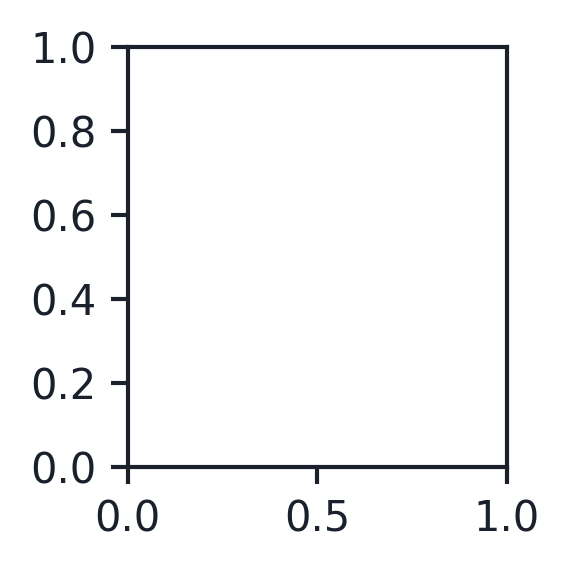

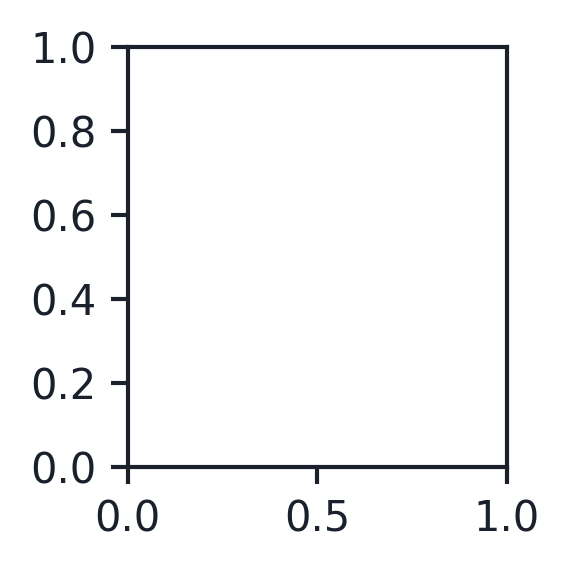

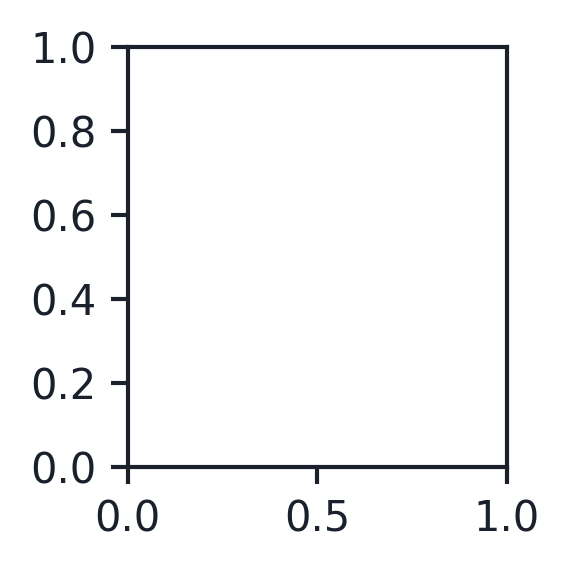

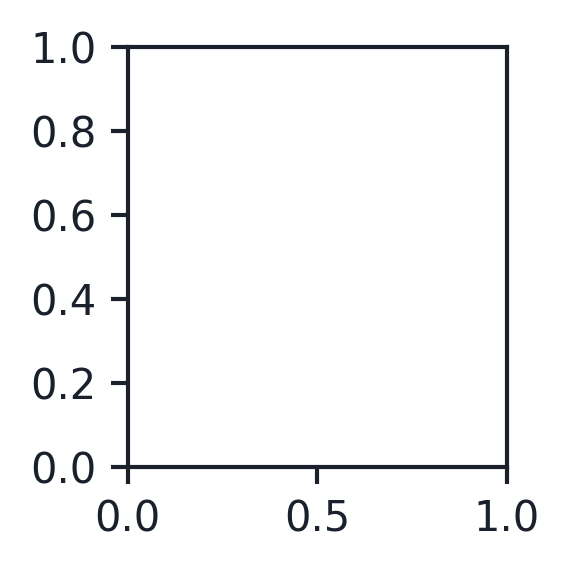

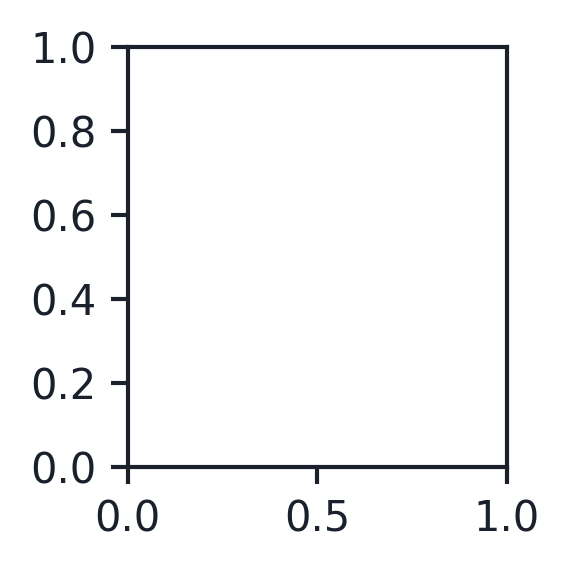

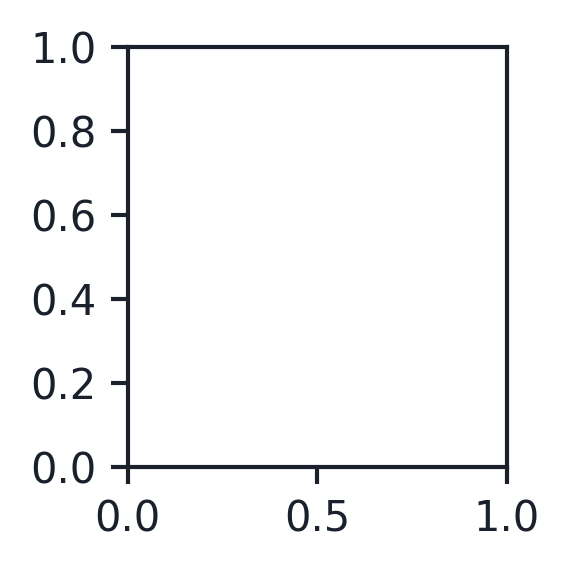

In [ ]:
def plot_neurons_and_time_activity(axs, ex_neurons, neuron_var, activity, c_idx, label):
    ax1, ax2, ax3 = axs

    # Plots some sample neurons
    for neuron_idx in range(n_neurons):
        label_val = label if neuron_idx == 0 else None
        ax1.plot(ex_neurons[neuron_idx], color=c_vals[c_idx],
                 zorder=5, label=label_val)
        
    # Plots the average neuron |activity| across all neurons
    # Average over trials, batch, and neurons
    ax2.plot(np.mean(np.abs(activity), axis=(0, 1, 3)), color=c_vals[c_idx], label=label)

    ax3.plot(np.mean(neuron_var, axis=-1), color=c_vals[c_idx], label=label)
    # ax3.plot(neuron_var, color=c_vals[c_idx], label=label)


fig, ax1 = plt.subplots(1, 1, figsize=(2,2)) # Example STPN neurons
fig2, ax2 = plt.subplots(1, 1, figsize=(2,2)) # Example RNN neurons
fig3, ax3 = plt.subplots(1, 1, figsize=(2,2)) # Average activity
fig4, ax4 = plt.subplots(1, 1, figsize=(2,2)) # Time variation
fig5, ax5 = plt.subplots(1, 1, figsize=(2,2)) # Decoding acc
fig6, ax6 = plt.subplots(1, 1, figsize=(2,2)) # Decoding acc avg over repeats

stpn_idx = 5
gru_idx = 8

plot_neurons_and_time_activity((ax1, ax3, ax4), stpn_ex_neurons, stpn_neuron_var[0], stpn_neuron_activity, stpn_idx, 'STPN')
plot_neurons_and_time_activity((ax2, ax3, ax4), gru_ex_neurons, gru_neuron_var[0], gru_neuron_activity, gru_idx, 'GRU')

for ax in (ax1, ax2, ax3, ax5, ax6):
    ax.axvspan(-0.5, 18.5, color='grey', alpha=0.2, zorder=-5, linewidth=0.0)
    # ax.axvspan(19.5, 38.5, color='white', alpha=0.3, zorder=-5, linewidth=0.0)
    ax.axvspan(38.5, 39.5, color=jetplot.colors.purple.v3, alpha=1.0, zorder=-5, linewidth=0.0)

    # ax.legend()

    ax.set_xlabel('Time (idx)')

    ax.set_xlim((-1, 39))
    ax.set_xticks((-1, 9, 19, 29, 39))
    ax.set_xticklabels((0, None, 20, None, 40))

for ax in (ax1, ax2, ax3):
    ax.axhline(0.0, color='k', linestyle='dotted', zorder=0, linewidth=0.75)

for ax in (ax1, ax2):
    ax.set_ylabel('Sample Activity')
    ax.set_ylim((-1.0, 1.0))
    ax.set_yticks((-1, 0, 1))

ax3.set_ylabel('Mean |Activity|')
ax3.set_ylim((0, 1.0))
ax3.set_yticks((0, 0.5, 1))
ax3.set_yticklabels((0, None, 1))

# ax4.set_xlabel('Time avg window (seq_idx:seq_idx+{})'.format(n_time_avg))
ax4.set_xlabel('Time (idx)')

ax4.axvspan(-5.5, 14.5, color='grey', alpha=0.3, zorder=-5, linewidth=0.0)
ax4.axvspan(14.5, 15.5, color='darkgrey', alpha=0.3, zorder=-5, linewidth=0.0)
ax4.axvspan(15.5, 16.5, color='silver', alpha=0.3, zorder=-5, linewidth=0.0)
ax4.axvspan(16.5, 17.5, color='lightgrey', alpha=0.3, zorder=-5, linewidth=0.0)
ax4.axvspan(17.5, 18.5, color='gainsboro', alpha=0.3, zorder=-5, linewidth=0.0)
ax4.axvspan(18.5, 19.5, color='whitesmoke', alpha=0.3, zorder=-5, linewidth=0.0)
ax4.axvspan(19.5, 34.5, color='white', alpha=0.3, zorder=-5, linewidth=0.0)
ax4.axvspan(34.5, 35.5, color='black', alpha=0.3, zorder=-5, linewidth=0.0)

ax4.set_xlim((-6, 34))
ax4.set_xticks((-6, 4, 14, 24, 34))
ax4.set_xticklabels((0, None, 20, None, 40))

ax4.set_ylim((0, 1.0))
ax4.set_yticks((0, 0.25, 0.5, 0.75, 1,))
ax4.set_yticklabels((0, None, None, None, 1,))

if normalize:
    ax4.set_ylabel('std(Neuron activity)/mean(|Neuron activity|)')
    ax4.set_ylabel('Norm. Time Var.')    
else:
    ax4.set_ylabel('std(Neuron activity)')
    ax4.set_ylabel('Time Var.')  

# ax4.legend()
ax4.axhline(0.0, color='k', linestyle='dotted', zorder=0, linewidth=0.75)

ax5.plot(np.mean(stpn_accs, axis=-1), color=c_vals[stpn_idx])
ax5.plot(np.mean(gru_accs, axis=-1), color=c_vals[gru_idx])

ax5.set_ylabel('Decoding Acc.')
ax5.set_ylim((0.0, 1.0))
ax5.set_yticks((0.0, 0.25, 0.5, 0.75, 1.0))
ax5.set_yticklabels((0.0, None, 0.5, None, 1.0))
ax5.axhline(0.33, color='k', linestyle='dotted', zorder=0, linewidth=0.75)

ax6.plot(np.mean(stpn_avg_accs, axis=-1), color=c_vals[stpn_idx])
ax6.plot(np.mean(gru_avg_accs, axis=-1), color=c_vals[gru_idx])

ax6.set_ylabel('Decoding Acc. (Avg. Act.)')
ax6.set_ylim((0.0, 1.0))
ax6.set_yticks((0.0, 0.25, 0.5, 0.75, 1.0))
ax6.set_yticklabels((0.0, None, 0.5, None, 1.0))
ax6.axhline(0.33, color='k', linestyle='dotted', zorder=0, linewidth=0.75)

for ax in (ax1, ax2, ax3, ax4, ax5, ax6):
    jetplot.breathe(ax=ax)


Here we calculate/plot the cross-classification accuracy.

In [ ]:
np.random.seed(10)

# For default |delay| = 0
# stpn_cross_accs = decode_crossed_activity(stpn_neuron_activity[0], stpn_labels[0], verbose=True)
# gru_cross_accs = decode_crossed_activity(gru_neuron_activity[0], gru_labels[0], verbose=True)

# For the different |delay| strengths
stpn_cross_accs = decode_crossed_activity(stpn_neuron_activity[2, 0], stpn_labels[2, 0], verbose=True)
gru_cross_accs = decode_crossed_activity(gru_neuron_activity[0], gru_labels[0], verbose=True)

Train time idx: 0
Train time idx: 1
Train time idx: 2
Train time idx: 3
Train time idx: 4
Train time idx: 5
Train time idx: 6
Train time idx: 7
Train time idx: 8
Train time idx: 9
Train time idx: 10
Train time idx: 11
Train time idx: 12
Train time idx: 13
Train time idx: 14
Train time idx: 15
Train time idx: 16
Train time idx: 17
Train time idx: 18
Train time idx: 19
Train time idx: 20
Train time idx: 21
Train time idx: 22
Train time idx: 23
Train time idx: 24
Train time idx: 25
Train time idx: 26
Train time idx: 27
Train time idx: 28
Train time idx: 29
Train time idx: 30
Train time idx: 31
Train time idx: 32
Train time idx: 33
Train time idx: 34
Train time idx: 35
Train time idx: 36
Train time idx: 37
Train time idx: 38
Train time idx: 39
Train time idx: 0
Train time idx: 1
Train time idx: 2
Train time idx: 3
Train time idx: 4
Train time idx: 5
Train time idx: 6
Train time idx: 7
Train time idx: 8
Train time idx: 9
Train time idx: 10
Train time idx: 11
Train time idx: 12
Train time id

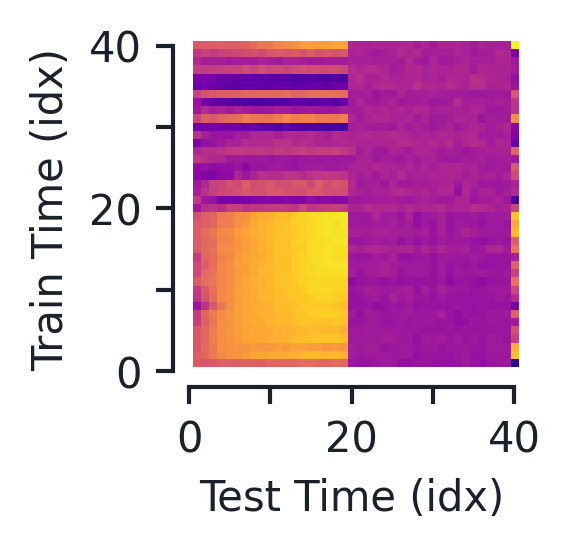

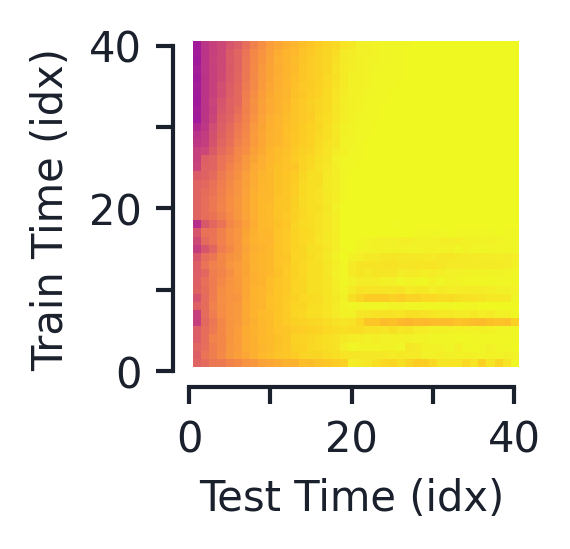

In [ ]:
fig, ax1 = plt.subplots(1, 1, figsize=(2,2)) # Example STPN neurons
fig2, ax2 = plt.subplots(1, 1, figsize=(2,2)) # Example RNN neurons

c_plot1 = ax1.matshow(np.mean(stpn_cross_accs, axis=-1), cmap='plasma',
                      vmin=0.0, vmax=1.0)
c_plot2 = ax2.matshow(np.mean(gru_cross_accs, axis=-1), cmap='plasma',
                      vmin=0.0, vmax=1.0)

# cbar1 = plt.colorbar(c_plot1, ax=ax1, shrink=0.45, ticks=(0.0, 0.25, 0.5, 0.75, 1.0), aspect=10)
# cbar1.ax.set_yticklabels([0, None, 0.5, None, 1.0])
# cbar1.ax.tick_params(labelsize=6, width=0.75) 
# cbar1.outline.set_linewidth(0.75)

for ax in (ax1, ax2):
    ax.set_ylabel('Train Time (idx)')
    ax.set_xlabel('Test Time (idx)')
    
    ax.set_xlim((-1, 39))
    ax.set_xticks((-1, 9, 19, 29, 39))
    ax.set_xticklabels((0, None, 20, None, 40))
    ax.set_ylim((-1, 39))
    ax.set_yticks((-1, 9, 19, 29, 39))
    ax.set_yticklabels((0, None, 20, None, 40))

    jetplot.breathe(ax=ax)

Here are the tests that vary the delay size, but only for the STPN. GRU was surprisingly hard to train in this setup

In [ ]:
load_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/delaydynamics_' # Different word_to_input vector for each trial

# STPN
STPN_path = ['HebbNet_M[50,100,3]_train=seq_inf_task=int_3class_40len',]
# GRU
GRU_path = ['GRU[50,100,3]_train=seq_inf_task=int_3class_40len',]

n_trials = 1
init_seed = 1000

test_set_size = 1000

batch_idx = 22
n_neurons = 5
n_time_avg = 5
normalize = True

stpn_neuron_activity = []
gru_neuron_activity = []
stpn_labels = []
gru_labels = []
stpn_neuron_var = []
gru_neuron_var = []

delay_scales = (0.0, 0.01, 0.05, 0.1, 0.25,)

# STPNs
for delay_scale in delay_scales:
    
    load_root_ds = load_root + str(delay_scale).replace('.', '')+'_'
    stpn_neuron_activity.append([])
    stpn_labels.append([])
    stpn_neuron_var.append([])

    for trial_idx in range(n_trials):
        load_path = load_root_ds + STPN_path[0]
        net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
        testData, testOutputMask, testRaw, _ = syn.generate_data(
                test_set_size, toy_params_load, net_params_load['n_outputs'],
                raw_data=True, device=torch.device('cpu'))
        
        db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)
        hs_load = db_load['h'].numpy()

        stpn_neuron_activity[-1].append(hs_load)
        stpn_labels[-1].append(np.array(testData[:,:,:][1][:, -1, 0]))
        stpn_neuron_var[-1].append(get_neuron_time_var(hs_load, n_time_avg=n_time_avg, normalize=normalize))
        neuron_idxs = np.arange(hs_load.shape[-1])
        np.random.shuffle(neuron_idxs)
        if delay_scale == 0.0 and trial_idx == 0: # Gets sample neurons only for first trial_idx 
            stpn_ex_neurons = hs_load[batch_idx, :, neuron_idxs[:n_neurons]]

# GRU
for trial_idx in range(n_trials):
    load_path = load_root + GRU_path[0]
    net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)
    testData, testOutputMask, testRaw, _ = syn.generate_data(
    test_set_size, toy_params_load, net_params_load['n_outputs'],
    raw_data=True, device=torch.device('cpu'))

    db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)
    hs_load = db_load['h'].numpy()

    gru_neuron_activity.append(hs_load)
    gru_labels.append(np.array(testData[:,:,:][1][:, -1, 0]))
    gru_neuron_var.append(get_neuron_time_var(hs_load, n_time_avg=5, normalize=normalize))
    if trial_idx == 0: # Gets sample neurons only for first trial_idx 
        gru_ex_neurons = hs_load[batch_idx, :, neuron_idxs[:n_neurons]]
    
stpn_neuron_activity = np.array(stpn_neuron_activity)
gru_neuron_activity = np.array(gru_neuron_activity)
stpn_labels = np.array(stpn_labels)
gru_labels = np.array(gru_labels)

stpn_neuron_var = np.array(stpn_neuron_var)
gru_neuron_var = np.array(gru_neuron_var)

Synthentic data generated in: 0.60 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
Synthentic data generated in: 0.60 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
Synthentic data generated in: 0.61 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
Synthentic data generated in: 0.63 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
Synthentic data generated in: 0.59 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True
Synthentic data generated in: 0.62 sec. Autobalanced: False. Uniform score: True. Eliminate ties: True


Calculate decoding accs

In [ ]:
np.random.seed(10)

stpn_accs = []

for delay_idx, delay_scale in enumerate(delay_scales):
    stpn_accs.append(decode_activity(stpn_neuron_activity[delay_idx, 0], stpn_labels[delay_idx, 0]))

gru_accs = decode_activity(gru_neuron_activity[0], gru_labels[0])



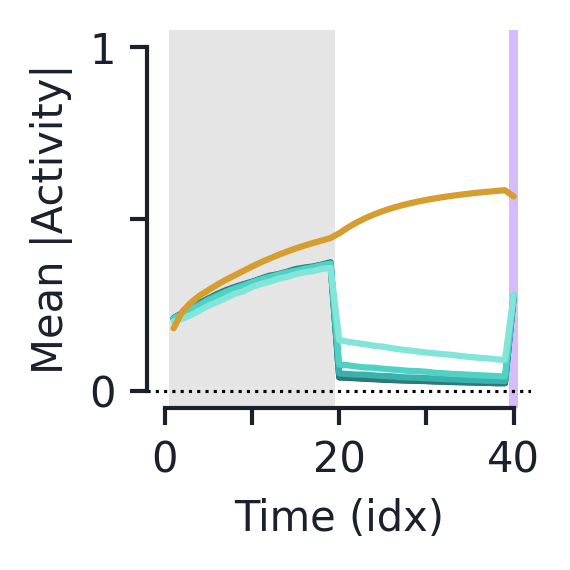

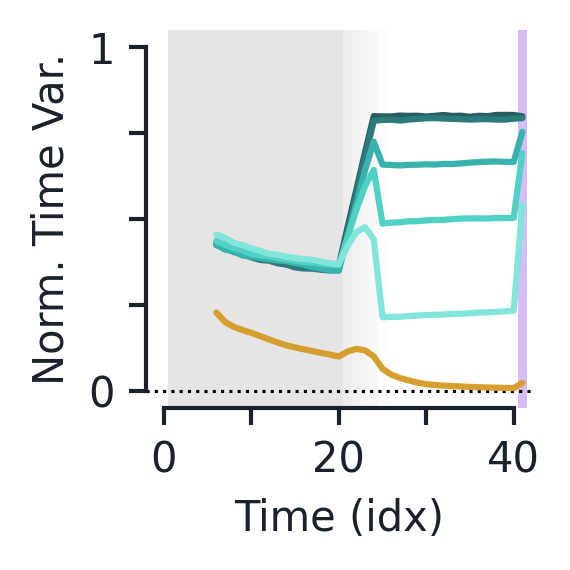

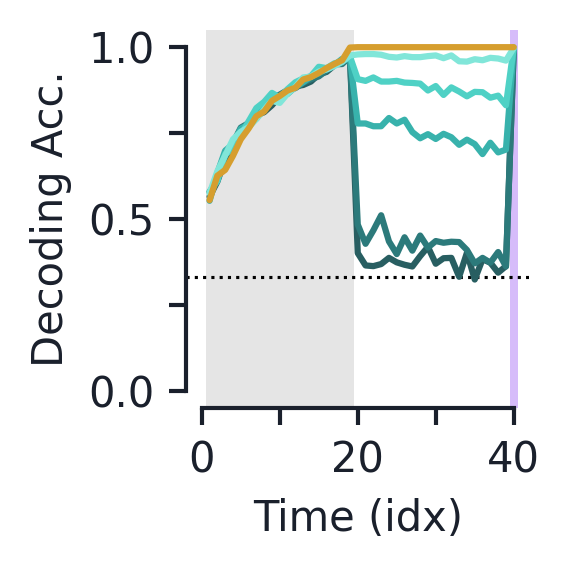

In [ ]:
fig3, ax3 = plt.subplots(1, 1, figsize=(2,2)) # Average activity
fig4, ax4 = plt.subplots(1, 1, figsize=(2,2)) # Time variation
fig5, ax5 = plt.subplots(1, 1, figsize=(2,2)) # Decoding acc

stpn_colors = [jetplot.colors.teal.v8, jetplot.colors.teal.v7, jetplot.colors.teal.v5, 
               jetplot.colors.teal.v4, jetplot.colors.teal.v3]
gru_color = c_vals[8]

for delay_idx in range(len(delay_scales)):
    ax3.plot(np.mean(np.abs(stpn_neuron_activity[delay_idx]), axis=(0, 1, 3)), color=stpn_colors[delay_idx])
ax3.plot(np.mean(np.abs(gru_neuron_activity), axis=(0, 1, 3)), color=gru_color)

for delay_idx in range(len(delay_scales)):
    ax4.plot(np.mean(stpn_neuron_var[delay_idx, 0], axis=-1), color=stpn_colors[delay_idx])
ax4.plot(np.mean(gru_neuron_var[0], axis=-1), color=gru_color)

for ax in (ax3, ax5,):
    ax.axvspan(-0.5, 18.5, color='grey', alpha=0.2, zorder=-5, linewidth=0.0)
    # ax.axvspan(19.5, 38.5, color='white', alpha=0.3, zorder=-5, linewidth=0.0)
    ax.axvspan(38.5, 39.5, color=jetplot.colors.purple.v3, alpha=1.0, zorder=-5, linewidth=0.0)

    # ax.legend()

    ax.set_xlabel('Time (idx)')

    ax.set_xlim((-1, 39))
    ax.set_xticks((-1, 9, 19, 29, 39))
    ax.set_xticklabels((0, None, 20, None, 40))

for ax in (ax3,):
    ax.axhline(0.0, color='k', linestyle='dotted', zorder=0, linewidth=0.75)

ax3.set_ylabel('Mean |Activity|')
ax3.set_ylim((0, 1.0))
ax3.set_yticks((0, 0.5, 1))
ax3.set_yticklabels((0, None, 1))

# ax4.set_xlabel('Time avg window (seq_idx:seq_idx+{})'.format(n_time_avg))
ax4.set_xlabel('Time (idx)')

ax4.axvspan(-5.5, 14.5, color='grey', alpha=0.2, zorder=-5, linewidth=0.0)
ax4.axvspan(14.5, 15.5, color='darkgrey', alpha=0.2, zorder=-5, linewidth=0.0)
ax4.axvspan(15.5, 16.5, color='silver', alpha=0.2, zorder=-5, linewidth=0.0)
ax4.axvspan(16.5, 17.5, color='lightgrey', alpha=0.2, zorder=-5, linewidth=0.0)
ax4.axvspan(17.5, 18.5, color='gainsboro', alpha=0.2, zorder=-5, linewidth=0.0)
ax4.axvspan(18.5, 19.5, color='whitesmoke', alpha=0.2, zorder=-5, linewidth=0.0)
ax4.axvspan(19.5, 34.5, color='white', alpha=0.2, zorder=-5, linewidth=0.0)
ax4.axvspan(34.5, 35.5, color=jetplot.colors.purple.v3, alpha=1.0, zorder=-5, linewidth=0.0)

ax4.set_xlim((-6, 34))
ax4.set_xticks((-6, 4, 14, 24, 34))
ax4.set_xticklabels((0, None, 20, None, 40))

ax4.set_ylim((0, 1.0))
ax4.set_yticks((0, 0.25, 0.5, 0.75, 1,))
ax4.set_yticklabels((0, None, None, None, 1,))

if normalize:
    ax4.set_ylabel('std(Neuron activity)/mean(|Neuron activity|)')
    ax4.set_ylabel('Norm. Time Var.')    
else:
    ax4.set_ylabel('std(Neuron activity)')
    ax4.set_ylabel('Time Var.')  

# ax4.legend()
ax4.axhline(0.0, color='k', linestyle='dotted', zorder=0, linewidth=0.75)

for delay_idx in range(len(delay_scales)):
    ax5.plot(np.mean(stpn_accs[delay_idx], axis=-1), color=stpn_colors[delay_idx])
ax5.plot(np.mean(gru_accs, axis=-1), color=gru_color)

ax5.set_ylabel('Decoding Acc.')
ax5.set_ylim((0.0, 1.0))
ax5.set_yticks((0.0, 0.25, 0.5, 0.75, 1.0))
ax5.set_yticklabels((0.0, None, 0.5, None, 1.0))
ax5.axhline(0.33, color='k', linestyle='dotted', zorder=0, linewidth=0.75)

for ax in (ax3, ax4, ax5,):
    jetplot.breathe(ax=ax)


### **Integration Context (Retro/Pro/Anti)**

Retro Context

In [ ]:
n_trials = 1
acc_thresh = 0.98
# input_size = 10

save = True
save_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/retrocontext_'

for trial_idx in range(n_trials):
    # Note redefines toy_params internal to the loop so that a new random 
    # set of word vectors will be drawn for each trial
    ########## Toy data parameters ##########
    toy_params = {
        'data_type': 'retro_context_int', # int, context, context_anti
        
        'phrase_length': 40,
        'n_classes': 2,
        'input_type': 'binary',    # one hot, binary, binary1-1
        'input_size': 50,          # defaults to length of words
        'include_eos': True,

        'stack_phrases': False,
        'n_stack': 1,
        'include_sos': False,
        'n_delay': 20, # Inserts delay words between at end of phrase (but before eos trigger)
        'delay_word': '<delay>', # '<delay>' or 'null'

        'uniform_score': True, # Uniform distribution over scores=
    }

    net_params = {
        'netType': 'HebbNet_M', # HebbNet, HebbNet_M, VanillaRNN, GRU, rHebbNet, rHebbNet_M, GHU, GHU_M
        'n_inputs': toy_params['input_size'],         # input dim
        'n_hidden': 100,                      # hidden dim
        'n_outputs': toy_params['n_classes'],         # output dim
        # 'n_outputs': 10,                                # train with larger number of outputs for generalization tests    
        'f_act': 'tanh',         # 1st layer actiivation function # linear, sigmoid, tanh, relu
        'f0_act': 'linear',      # 2nd layer actiivation function
        'trainable_state0': False,
        
        # STPN Features
        'A_act': None,            # Activation on the A update (tanh or None)
        'lam_clamp': 0.95,   # Maximum lambda value
        'eta_type': 'scalar',     # scalar or vector
        'eta_force': None,        # ensure either Hebbian or anti-Hebbian plasticity
        'hebb_type': 'inputOutput',      # input, output, inputOutput

        # Train parameters
        'train_mode': 'seq_inf',   # 'seq' or 'seq_inf'
        'weight_reg': 'L1',
        'reg_lambda': 1e-4,
        'hidden_bias': False,
        'ro_bias': False,           # use readout bias or not
        'gradient_clip': 10,
        'freeze_inputs': False,      # freeze the input layer (and hidden bias)
        'sparsification': 0.0,      # Amount to sparsify network's weights (0.0 = no sparsification)
        'noise_type': 'input',      # None, 'input', 'hidden'
        'noise_scale': 0.2,         # Expected magnitude of noise vector
        'cuda': True,
        'validEarlyStop': False,     # Early stop when average validation loss saturates
        'accEarlyStop': acc_thresh,   
        'minMaxIter': (2000, 1e6),
        'seed': 1002 + trial_idx,   # This seed is used to generate training/valid data too

        'train_set_size': 3200,
        'valid_set_size': 500,
        'batch_size': 64,
        'epochs': 1,
    }
    # Keep forgetting to turn this on for RNNs, so just automate it
    net_params['hidden_bias'] = False if net_params['netType'] in ('HebbNet', 'HebbNet_M') else True

    print('Trial: {}'.format(trial_idx))
    verbose = True if trial_idx == 0 else False

    net, toy_params, net_params = train_network(net_params, toy_params, save=save, 
                                                save_root=save_root, verbose=verbose)

Trial: 0
Contextual integration data (discrete)...
Using CUDA...
Net parameters:
  Net Type: Multiplicative
  Structure: f: tanh // fOut: linear // (Nx, Nh, Ny) = (50, 100, 2)
  No hidden bias // No readout bias // Sparsification: 0.00 // Noise type: input (scl: 2.0e-01)
  A parameters:
    A update: Hebbian // A Act: linear // Eta: scalar // Lambda_max: 0.95
    A0: zeros
Train parameters:
  Loss: XE // LR: 1.00e-03 // Weight reg: L1, coef: 1.0e-02 // Gradient clip: 1.0e+01
Iter:0 grad:8.365 train_loss:0.7283 train_acc:0.578 valid_loss:0.6990 valid_acc:0.482
Iter:50 grad:7.586 train_loss:0.7270 train_acc:0.578 valid_loss:0.7000 valid_acc:0.502
Iter:100 grad:6.941 train_loss:0.7177 train_acc:0.578 valid_loss:0.6999 valid_acc:0.502
Iter:150 grad:6.430 train_loss:0.7377 train_acc:0.438 valid_loss:0.7008 valid_acc:0.498
Iter:200 grad:6.013 train_loss:0.7180 train_acc:0.531 valid_loss:0.6968 valid_acc:0.502
Iter:250 grad:5.675 train_loss:0.7221 train_acc:0.406 valid_loss:0.6957 valid_acc:0

Load the trained networks

In [ ]:
load_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/retrocontext_'

STPN_load = ['HebbNet_M[50,100,2]_train=seq_inf_task=retro_context_int_2class_40len',]

trial_idx = 1
init_seed = 1001
test_set_size = 1000

# Loads network
load_path = load_root + STPN_load[0]

net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)

testData, testOutputMask, testRaw, _ = syn.generate_data_context(
    test_set_size, toy_params_load, net_params_load['n_outputs'],
    raw_data=True, device=torch.device('cpu'), verbose=False)
        
db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)
print('Acuracy: {:.2f}'.format(db_load['acc']))

context_mask, phrases_1, phrases_2, labels_1, labels_2, epoch_idxs = testRaw
labels = np.array(testData[:,:,:][1][:, -1, 0].cpu())
labels_1 = labels_1[:, -1, 0] # (n_batch, n_seq, 1) -> (n_batch,)
labels_2 = labels_2[:, -1, 0]
# Modifies labels so it takes into account context as well
labels = np.array(labels + toy_params['n_classes']*context_mask, dtype=np.int32)

word_labels_1 =np.zeros((len(phrases_1), len(phrases_1[0]),), dtype=np.int32)
for batch_idx in range(len(phrases_1)):
    for seq_idx in range(len(phrases_1[0])):
        word_labels_1[batch_idx, seq_idx] = toy_params_load['toy_params_1']['words'].index(phrases_1[batch_idx][seq_idx])
word_labels_2 =np.zeros((len(phrases_2), len(phrases_2[0]),), dtype=np.int32)
for batch_idx in range(len(phrases_2)):
    for seq_idx in range(len(phrases_2[0])):
        word_labels_2[batch_idx, seq_idx] = toy_params_load['toy_params_2']['words'].index(phrases_2[batch_idx][seq_idx])

running_score_1 = get_running_scores(word_labels_1, toy_params_load['toy_params_1'])
running_score_2 = get_running_scores(word_labels_2, toy_params_load['toy_params_2'])

# Adds a zero score at start:
running_score_1 = np.concatenate((
    np.zeros((running_score_1.shape[0], 1, running_score_1.shape[-1])),
    running_score_1
), axis=1)
running_score_2 = np.concatenate((
    np.zeros((running_score_2.shape[0], 1, running_score_2.shape[-1])),
    running_score_2
), axis=1)

score_diffs_1 = running_score_1[:, :, 1] - running_score_1[:, :, 0]
score_diffs_2 = running_score_2[:, :, 1] - running_score_2[:, :, 0]

# Gets the average state for each possible score index
max_score = 19

As = db_load['A'].cpu().numpy()
A0 = net_load.A0.cpu().numpy()
A0_batch = np.repeat(A0[np.newaxis, np.newaxis, :, :], As.shape[0], axis=0)
As = np.concatenate((A0_batch, As), axis=1)

s2i = np.arange(-max_score, max_score+1)

states_score1 = [[] for _ in range(2*max_score+1)]
states_score2 = [[] for _ in range(2*max_score+1)]

for batch_idx in range(score_diffs_1.shape[0]):
    for seq_idx in range(score_diffs_1.shape[1]):
        states_score1[np.where(s2i == score_diffs_1[batch_idx, seq_idx])[0][0]].append(As[batch_idx, seq_idx])
        states_score2[np.where(s2i == score_diffs_2[batch_idx, seq_idx])[0][0]].append(As[batch_idx, seq_idx])

avg_state_1 = np.zeros((2*max_score+1, As.shape[-2], As.shape[-1],))
avg_state_2 = np.zeros((2*max_score+1, As.shape[-2], As.shape[-1],))

for score_idx in range(2*max_score+1):
    avg_state_1[score_idx] = np.mean(np.array(states_score1[score_idx]), axis=0)
    avg_state_2[score_idx] = np.mean(np.array(states_score2[score_idx]), axis=0)

Acuracy: 0.98


Uses PCA to find the direction of score variation at each time step, for both subtasks and for each context

In [ ]:
pca_fits = np.zeros((score_diffs_1.shape[1]-1, 2, 2, net_load.n_hidden)) # Seq idx, context, subtask

for seq_idx in range(1, score_diffs_1.shape[1]): # Skip the zeros
    # Separates As by context for both subtask indices
    score_dics = [[{}, {}], [{}, {}]] # [context][subtask_idx]
    for batch_idx in range(score_diffs_1.shape[0]):
        context_idx = context_mask[batch_idx]
        for subtask_idx in range(2):
            score = score_diffs_2[batch_idx, seq_idx]  if subtask_idx else score_diffs_1[batch_idx, seq_idx]
            if score in score_dics[context_idx][subtask_idx].keys(): # Append to list
                score_dics[context_idx][subtask_idx][score].append(As[batch_idx, seq_idx])
            else: # Create a new list
                score_dics[context_idx][subtask_idx][score] = [As[batch_idx, seq_idx],]

    # Now takse each dictionary, averages all elements for a given key, and fits a line to it
    for context_idx in range(2):
        for subtask_idx in range(2):
            avg_states = []
            for score in score_dics[context_idx][subtask_idx].keys():
                states = np.array(score_dics[context_idx][subtask_idx][score])
                h_states = HebbNet_word_proj('<eos>' , states, net_load, toy_params_load)
                avg_states.append(np.mean(h_states, axis=0))

            # Fits a PCA to the average state for each score
            state_PCA = PCA(n_components=1)
            state_PCA.fit(np.array(avg_states))
            pca_fits[seq_idx-1, context_idx, subtask_idx] = state_PCA.components_[0]

ro_align = np.zeros((score_diffs_1.shape[1]-1, 2, 2,))
ro_matrix = net_load.w2.detach().cpu().numpy()

for seq_idx in range(score_diffs_1.shape[1]-1): 
    for context_idx in range(2):
        for subtask_idx in range(2):
            ro_aligns = []
            for ro_idx in range(ro_matrix.shape[0]):
                ro_aligns.append(np.max((
                    np.abs(np.dot(ro_matrix[ro_idx], 1*pca_fits[seq_idx, context_idx, subtask_idx])/np.linalg.norm(ro_matrix[ro_idx])),
                    np.abs(np.dot(ro_matrix[ro_idx], -1*pca_fits[seq_idx, context_idx, subtask_idx])/np.linalg.norm(ro_matrix[ro_idx])),
                )))
                

            ro_align[seq_idx, context_idx, subtask_idx] = np.mean(ro_aligns)            

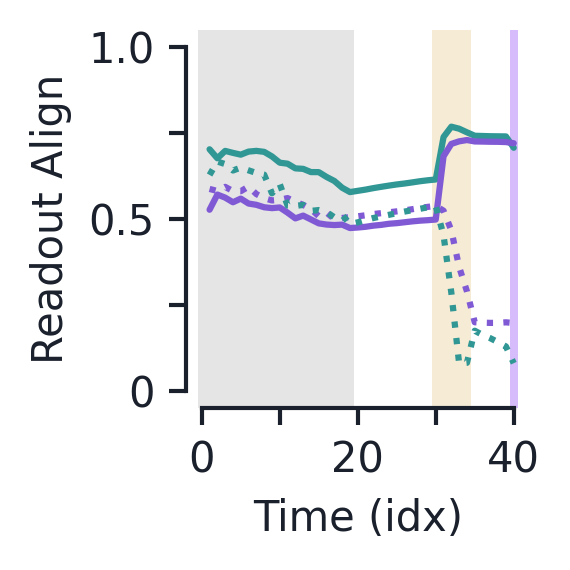

In [ ]:
fig, ax1 = plt.subplots(1, 1, figsize=(2,2))

task_idxs = (3, 5)

times = np.arange(1, 41)

for context_idx in range(2):
    for subtask_idx in range(2):
        linestyle='solid' if context_idx != subtask_idx else 'dotted'
        ax1.plot(times, ro_align[:, context_idx, subtask_idx], linestyle=linestyle,
                 color=c_vals[task_idxs[subtask_idx]])

if toy_params_load['n_delay'] > 0:
    ax1.axvspan(-0.5, 19.5, color='grey', alpha=0.2, zorder=-5, linewidth=0)
    ax1.axvspan(epoch_idxs[1]-0.5, epoch_idxs[2]-0.5, color=jetplot.colors.yellow.v6, alpha=0.2, zorder=-5, linewidth=0)
    ax1.axvspan(39.5, 40.5, color=jetplot.colors.purple.v3, alpha=1.0, zorder=-5, linewidth=0)
elif toy_params_load['n_delay'] < 0:
    ax1.axvspan(20, toy_params['phrase_length']-1, color='grey', alpha=0.3, zorder=-5)
    ax1.axvspan(epoch_idxs[0], epoch_idxs[1]-1, color='blue', alpha=0.3, zorder=-5)

ax1.set_xlabel('Time (idx)')
ax1.set_ylabel('Readout Align')

ax1.set_xlim((0,40))
ax1.set_xticks((0, 10, 20, 30, 40))
ax1.set_xticklabels((0, None, 20, None, 40))

ax1.set_ylim((0, 1))
ax1.set_yticks((0, 0.25, 0.5, 0.75, 1.0))
ax1.set_yticklabels((0, None, 0.5, None, 1.0))

jetplot.breathe(ax=ax1)

Plots how the network treats the two integrated phrases as a function of time.

(2, 2, 41)


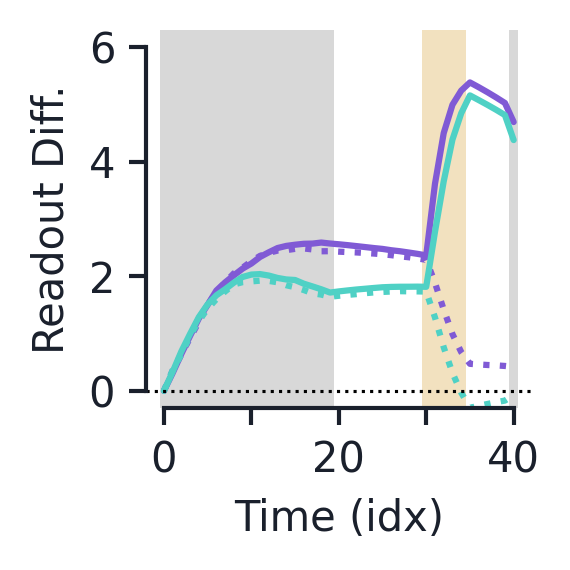

In [ ]:
word_proj = '<eos>' 
# word_proj = 'null'

# Adds A0 as initial state for all sequences
As = db_load['A'].cpu().numpy()
A0 = net_load.A0.cpu().numpy()
A0_batch = np.repeat(A0[np.newaxis, np.newaxis, :, :], As.shape[0], axis=0)
As = np.concatenate((A0_batch, As), axis=1)
As_fit = As

h_word = HebbNet_word_proj(word_proj, As_fit, net_load, toy_params_load)

w2 = net_load.w2.detach().cpu().numpy()
outputs_word = np.matmul(h_word, w2.T)

# Separate states by their task, label, and context:
label_1_states = [[[], []], [[], []]] # [context][label_1]
label_2_states = [[[], []], [[], []]] # [context][label_2]

for batch_idx in range(h_word.shape[0]):
    label_1_states[context_mask[batch_idx]][labels_1[batch_idx]].append(h_word[batch_idx])
    label_2_states[context_mask[batch_idx]][labels_2[batch_idx]].append(h_word[batch_idx])

avg_label_1_state = np.zeros((2, 2, h_word.shape[-2], h_word.shape[-1]))
avg_label_2_state = np.zeros((2, 2, h_word.shape[-2], h_word.shape[-1]))
for context_idx in range(2):
    for target_idx in range(2):
        avg_label_1_state[context_idx, target_idx] = np.mean(
            np.array(label_1_states[context_idx][target_idx]), axis=0
        )
        avg_label_2_state[context_idx, target_idx] = np.mean(
            np.array(label_2_states[context_idx][target_idx]), axis=0
        )

avg_label_1_out = np.matmul(avg_label_1_state, w2.T)
avg_label_diffs = np.array((avg_label_1_out[:, 0, :, 0] - avg_label_1_out[:, 0, :, 1],
                            avg_label_1_out[:, 1, :, 1] - avg_label_1_out[:, 0, :, 0]))
# avg_label_1_out = np.linalg.norm(avg_label_1_out[:, 0, :, :] - avg_label_1_out[:, 1, :, :], axis=-1)
print(avg_label_diffs.shape)
avg_label_1_out = np.mean(avg_label_diffs, axis=0)

avg_label_2_out = np.matmul(avg_label_2_state, w2.T)
avg_label_diffs = np.array((avg_label_2_out[:, 0, :, 0] - avg_label_2_out[:, 0, :, 1],
                            avg_label_2_out[:, 1, :, 1] - avg_label_2_out[:, 0, :, 0]))
# avg_label_2_out = np.linalg.norm(avg_label_2_out[:, 0, :, :] - avg_label_2_out[:, 1, :, :], axis=-1)
avg_label_2_out = np.mean(avg_label_diffs, axis=0)

fig, ax1 = plt.subplots(1, 1, figsize=(2,2))

context_labels = ('2', '1')

task_idxs = (3, 5)

ax1.plot(avg_label_1_out[1], linestyle='solid', label='Task 1', color=c_vals[task_idxs[0]])
ax1.plot(avg_label_1_out[0], linestyle='dotted', color=c_vals[task_idxs[0]])
ax1.plot(avg_label_2_out[0], linestyle='solid', label='Task 2', color=c_vals_ld[task_idxs[1]])
ax1.plot(avg_label_2_out[1], linestyle='dotted', color=c_vals_ld[task_idxs[1]])

# ax1.legend()
if toy_params_load['n_delay'] > 0:
    ax1.axvspan(-0.5, 19.5, color='grey', alpha=0.3, zorder=-5, linewidth=0)
    ax1.axvspan(epoch_idxs[1]-0.5, epoch_idxs[2]-0.5, color=jetplot.colors.yellow.v6, alpha=0.3, zorder=-5, linewidth=0)
    ax1.axvspan(39.5, 40.5, color='grey', alpha=0.3, zorder=-5, linewidth=0)
elif toy_params_load['n_delay'] < 0:
    ax1.axvspan(20, toy_params['phrase_length']-1, color='grey', alpha=0.3, zorder=-5)
    ax1.axvspan(epoch_idxs[0], epoch_idxs[1]-1, color='blue', alpha=0.3, zorder=-5)

ax1.set_xlabel('Time (idx)')
ax1.set_ylabel('Readout Diff.')

ax1.set_xlim((0,40))
ax1.set_xticks((0, 10, 20, 30, 40))
ax1.set_xticklabels((0, None, 20, None, 40))

ax1.set_ylim((0, 6))
ax1.set_yticks((0, 2, 4, 6))
# ax1.set_yticklabels((-1, 0, None, 2, None, 4))
ax1.axhline(0.0, color='k', linestyle='dotted', linewidth=0.75)

jetplot.breathe(ax=ax1)

Look at some specifics of the dynamics in A space

In [ ]:
# Flatten matrix dimensions (but not batch and seq)
seq_subset = True
projection_type = 'PCA' # 'PCA', 'time_PCA'
pc_comps = 200

As = db_load['A'].cpu().numpy()

start_seq, end_seq  = 0, epoch_idxs[0] # Signal

# Adds A0 as initial state for all sequences
A0 = net_load.A0.cpu().numpy()
A0_batch = np.repeat(A0[np.newaxis, np.newaxis, :, :], As.shape[0], axis=0)
As = np.concatenate((A0_batch, As), axis=1)
start_seq = start_seq + 1 if start_seq > 0 else start_seq
end_seq = end_seq + 1
As_fit = As

if seq_subset:
    print('Using sequence bounds {} to {}'.format(start_seq, end_seq))
    As_fit = As[:, start_seq:end_seq, :, :]
    score_diffs_1_sub = score_diffs_1[:, start_seq:end_seq]
    score_diffs_2_sub = score_diffs_2[:, start_seq:end_seq]

As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))
A_diffs = As_flat[:, 1:, :] - As_flat[:, :-1, :] # note, already flattened

if projection_type == 'PCA':
    a_PCA = PCA(n_components=pc_comps)

    a_PCA.fit(As_flat.reshape((-1, As_flat.shape[-1])))
    
    # # Fit to one subset, but plot the other
    # As_fit = As[:, epoch_idxs[2]:toy_params['phrase_length']-1, :, :]
    # As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))

    As_pca = np.zeros((As_flat.shape[0], As_flat.shape[1], pc_comps))
    A_diffs_pca = np.zeros((A_diffs.shape[0], A_diffs.shape[1], pc_comps))
    # A_diffs_pca = np.zeros((As_flat.shape[0], As_flat.shape[1]-1, pc_comps))
    A_zeros = np.zeros_like(As_flat[0, 0:1, :])
    for batch_idx in range(As.shape[0]):
        As_pca[batch_idx] = a_PCA.transform(As_flat[batch_idx])
        A_diffs_pca[batch_idx] = a_PCA.transform(A_diffs[batch_idx])
        A_diffs_pca[batch_idx] = np.matmul(A_diffs[batch_idx], a_PCA.components_.T)
        # A_diffs_ca
    A_zeros_pca = a_PCA.transform(A_zeros)

    A_avg_score_1 = a_PCA.transform(avg_state_1.reshape((avg_state_1.shape[0], -1)))
    A_avg_score_2 = a_PCA.transform(avg_state_2.reshape((avg_state_2.shape[0], -1)))

elif projection_type == 'time_PCA':
    As_pca, proj_matrix, center_vector = timeAndPCAProject(As_flat, pc_comps=pc_comps)


Using sequence bounds 0 to 21


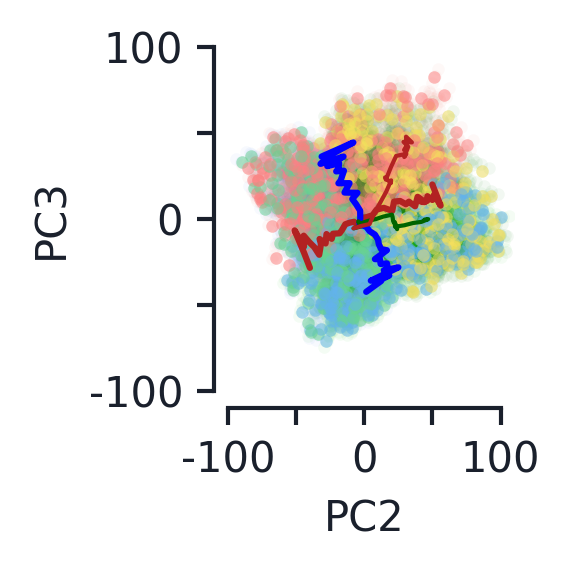

In [ ]:
import matplotlib.colors

fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))

pcx = 1
pcy = 2

label_color_idxs = (0, 1, 2, 8)

# label_cmap_1 = matplotlib.colors.LinearSegmentedColormap.from_list("", [
#     c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], jetplot.colors.gray.v3, 
#     c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1],
# ])
# label_cmap_2 = matplotlib.colors.LinearSegmentedColormap.from_list("", [
#     c_vals_l[2], c_vals_l[2], c_vals_l[2], c_vals_l[2], c_vals_l[2], c_vals_l[2], jetplot.colors.gray.v3, 
#     c_vals_l[8], c_vals_l[8], c_vals_l[8], c_vals_l[8], c_vals_l[8], c_vals_l[8],
# ])


# max_score = 19

# for batch_idx in range(As.shape[0]):
#     color_labels_l = c_vals_l[labels[batch_idx]]
#     color_labels = c_vals[labels[batch_idx]]

#     A_cmap = label_cmap_1 if context_mask[batch_idx] else label_cmap_2
#     score_diffs = score_diffs_1_sub if context_mask[batch_idx] else score_diffs_2_sub
#     ax1.scatter(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy], 
#                 c=score_diffs[batch_idx], linewidth=0.0,
#                 marker='.', zorder=0, alpha=0.5,
#                 cmap=A_cmap, vmin=-max_score, vmax=max_score)

for batch_idx in range(As.shape[0]):
    color_labels_ld = c_vals_ld[label_color_idxs[labels[batch_idx]]]
    color_labels_l = c_vals_l[label_color_idxs[labels[batch_idx]]]
    color_labels = c_vals[label_color_idxs[labels[batch_idx]]]

    ax1.scatter(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy], 
                linewidth=0.0, marker='.', zorder=0, alpha=0.05,
                color=color_labels_l)
    ax1.scatter(As_pca[batch_idx, -1, pcx], As_pca[batch_idx, -1, pcy], 
                linewidth=0.0, marker='.', zorder=1, alpha=0.5,
                color=color_labels_ld)

# # Average states by score
# ax1.plot(A_avg_score_1[:, pcx], A_avg_score_1[:, pcy], color=c_vals[0])
# ax1.plot(A_avg_score_2[:, pcx], A_avg_score_2[:, pcy], color=c_vals[2])

# for batch_idx in range(hs_spec.shape[0]):
# for batch_idx in range(len(toy_params['words'])-1):
#     ax.plot(As_spec_pca[batch_idx, :, pcx], As_spec_pca[batch_idx, :, pcy], 
#             color=c_vals[batch_idx], marker='.', zorder=5)

# Initial point (only uses first batch)
# ax1.plot(As_pca[0, 0, pcx], As_pca[0, 0, pcy], marker='s',
#         color='k', zorder=10, markersize=3)

ax1.set_xlabel('PC{}'.format(pcx+1))
ax1.set_ylabel('PC{}'.format(pcy+1))

# # Some sample paths
for batch_idx in (16, 3):
    ax1.plot(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy],
            color=c_vals[label_color_idxs[labels[batch_idx]]], zorder=6,
             linewidth=1.0)

ax1.set_ylim((-100, 100))
ax1.set_yticks((-100, -50, 0, 50, 100))
ax1.set_yticklabels((-100, None, 0, None, 100))
ax1.set_xlim((-100, 100))
ax1.set_xticks((-100, -50, 0, 50, 100))
ax1.set_xticklabels((-100, None, 0, None, 100))

jetplot.breathe(ax=ax1)

In [ ]:
# Flatten matrix dimensions (but not batch and seq)
seq_subset = True
projection_type = 'PCA' # 'PCA', 'time_PCA'
pc_comps = 200

As = db_load['A'].cpu().numpy()

start_seq, end_seq  = epoch_idxs[1], epoch_idxs[2] # context

# Adds A0 as initial state for all sequences
A0 = net.A0.cpu().numpy()
A0_batch = np.repeat(A0[np.newaxis, np.newaxis, :, :], As.shape[0], axis=0)
As = np.concatenate((A0_batch, As), axis=1)
start_seq = start_seq + 1 if start_seq > 0 else start_seq
end_seq = end_seq + 1
As_fit = As

if seq_subset:
    print('Using sequence bounds {} to {}'.format(start_seq, end_seq))
    As_fit = As[:, start_seq:end_seq, :, :]

As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))
A_diffs = As_flat[:, 1:, :] - As_flat[:, :-1, :] # note, already flattened

if projection_type == 'PCA':
    a_PCA = PCA(n_components=pc_comps)

    a_PCA.fit(As_flat.reshape((-1, As_flat.shape[-1])))
    
    # # Fit to one subset, but plot the other
    # As_fit = As[:, epoch_idxs[2]:toy_params['phrase_length']-1, :, :]
    # As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))

    As_pca = np.zeros((As_flat.shape[0], As_flat.shape[1], pc_comps))
    A_diffs_pca = np.zeros((A_diffs.shape[0], A_diffs.shape[1], pc_comps))
    # A_diffs_pca = np.zeros((As_flat.shape[0], As_flat.shape[1]-1, pc_comps))
    A_zeros = np.zeros_like(As_flat[0, 0:1, :])
    for batch_idx in range(As.shape[0]):
        As_pca[batch_idx] = a_PCA.transform(As_flat[batch_idx])
        A_diffs_pca[batch_idx] = a_PCA.transform(A_diffs[batch_idx])
        A_diffs_pca[batch_idx] = np.matmul(A_diffs[batch_idx], a_PCA.components_.T)
        # A_diffs_ca
    A_zeros_pca = a_PCA.transform(A_zeros)

elif projection_type == 'time_PCA':
    As_pca, proj_matrix, center_vector = timeAndPCAProject(As_flat, pc_comps=pc_comps)


Using sequence bounds 31 to 36


In [ ]:
labels[20:30]

array([2, 2, 2, 2, 1, 1, 3, 2, 3, 0], dtype=int32)

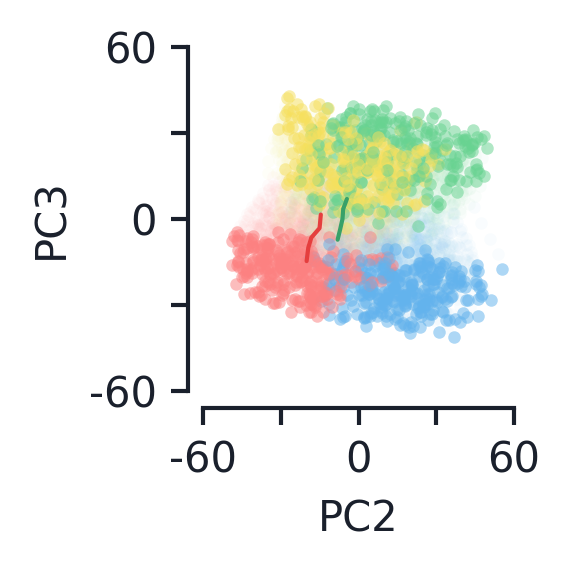

In [ ]:
fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))

pcx = 1
pcy = 2

label_color_idxs = (0, 1, 2, 8)

for batch_idx in range(As.shape[0]):
    color_labels_ld = c_vals_ld[label_color_idxs[labels[batch_idx]]]
    color_labels_l = c_vals_l[label_color_idxs[labels[batch_idx]]]
    color_labels = c_vals[label_color_idxs[labels[batch_idx]]]

    ax1.scatter(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy], 
                linewidth=0.0, marker='.', zorder=0, alpha=0.05,
                color=color_labels_l)
    ax1.scatter(As_pca[batch_idx, -1, pcx], As_pca[batch_idx, -1, pcy], 
                linewidth=0.0, marker='.', zorder=1, alpha=0.5,
                color=color_labels_ld)

# for batch_idx in range(hs_spec.shape[0]):
# for batch_idx in range(len(toy_params['words'])-1):
#     ax.plot(As_spec_pca[batch_idx, :, pcx], As_spec_pca[batch_idx, :, pcy], 
#             color=c_vals[batch_idx], marker='.', zorder=5)

# Initial point (only uses first batch)
# ax1.plot(As_pca[0, 0, pcx], As_pca[0, 0, pcy], marker='s',
#         color='k', zorder=10, markersize=3)

ax1.set_xlabel('PC{}'.format(pcx+1))
ax1.set_ylabel('PC{}'.format(pcy+1))

# Some sample paths
for batch_idx in (29, 23):
    ax1.plot(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy],
            color=c_vals[label_color_idxs[labels[batch_idx]]], zorder=6,
             linewidth=1.0)


ax1.set_ylim((-60, 60))
ax1.set_yticks((-60, -30, 0, 30, 60))
ax1.set_yticklabels((-60, None, 0, None, 60))
ax1.set_xlim((-60, 60))
ax1.set_xticks((-60, -30, 0, 30, 60))
ax1.set_xticklabels((-60, None, 0, None, 60))

jetplot.breathe(ax=ax1)

**Prospective integration**

In [ ]:
n_trials = 2
acc_thresh = 0.98
# input_size = 10

save = True
save_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/procontext_'

for trial_idx in range(n_trials):
    # Note redefines toy_params internal to the loop so that a new random 
    # set of word vectors will be drawn for each trial
    ########## Toy data parameters ##########
    toy_params = {
        'data_type': 'retro_context_int', # int, context
        
        'phrase_length': 40,
        'n_classes': 2,
        'input_type': 'binary',    # one hot, binary, binary1-1
        'input_size': 50,          # defaults to length of words
        'include_eos': True,

        'stack_phrases': False,
        'n_stack': 1,
        'include_sos': False,
        'n_delay': -20, # Inserts delay words between at end of phrase (but before eos trigger)
        'delay_word': '<delay>', # '<delay>' or 'null'

        'uniform_score': True, # Uniform distribution over scores=
    }

    net_params = {
        'netType': 'HebbNet_M', # HebbNet, HebbNet_M, VanillaRNN, GRU, rHebbNet, rHebbNet_M, GHU, GHU_M
        'n_inputs': toy_params['input_size'],         # input dim
        'n_hidden': 100,                      # hidden dim
        'n_outputs': toy_params['n_classes'],         # output dim
        # 'n_outputs': 10,                                # train with larger number of outputs for generalization tests    
        'f_act': 'tanh',         # 1st layer actiivation function # linear, sigmoid, tanh, relu
        'f0_act': 'linear',      # 2nd layer actiivation function
        'trainable_state0': False,
        
        # STPN Features
        'A_act': None,            # Activation on the A update (tanh or None)
        'lam_clamp': 0.95,   # Maximum lambda value
        'eta_type': 'scalar',     # scalar or vector
        'eta_force': None,        # ensure either Hebbian or anti-Hebbian plasticity
        'hebb_type': 'inputOutput',      # input, output, inputOutput

        # Train parameters
        'train_mode': 'seq_inf',   # 'seq' or 'seq_inf'
        'weight_reg': 'L1',
        'reg_lambda': 1e-4,
        'hidden_bias': False,
        'ro_bias': False,           # use readout bias or not
        'gradient_clip': 10,
        'freeze_inputs': False,      # freeze the input layer (and hidden bias)
        'sparsification': 0.0,      # Amount to sparsify network's weights (0.0 = no sparsification)
        'noise_type': 'input',      # None, 'input', 'hidden'
        'noise_scale': 0.2,         # Expected magnitude of noise vector
        'cuda': True,
        'validEarlyStop': False,     # Early stop when average validation loss saturates
        'accEarlyStop': acc_thresh,   
        'minMaxIter': (2000, 1e6),
        'seed': 1004 + trial_idx,   # This seed is used to generate training/valid data too

        'train_set_size': 3200,
        'valid_set_size': 500,
        'batch_size': 64,
        'epochs': 1,
    }
    # Keep forgetting to turn this on for RNNs, so just automate it
    net_params['hidden_bias'] = False if net_params['netType'] in ('HebbNet', 'HebbNet_M') else True

    print('Trial: {}'.format(trial_idx))
    verbose = True if trial_idx == 0 else False

    net, toy_params, net_params = train_network(net_params, toy_params, save=save, 
                                                save_root=save_root, verbose=verbose)

Trial: 0
Contextual integration data (discrete)...
Using CUDA...
Net parameters:
  Net Type: Multiplicative
  Structure: f: tanh // fOut: linear // (Nx, Nh, Ny) = (50, 100, 2)
  No hidden bias // No readout bias // Sparsification: 0.00 // Noise type: input (scl: 2.0e-01)
  A parameters:
    A update: Hebbian // A Act: linear // Eta: scalar // Lambda_max: 0.95
    A0: zeros
Train parameters:
  Loss: XE // LR: 1.00e-03 // Weight reg: L1, coef: 1.0e-02 // Gradient clip: 1.0e+01
Iter:0 grad:8.427 train_loss:0.7539 train_acc:0.438 valid_loss:0.6973 valid_acc:0.532
Iter:50 grad:7.708 train_loss:0.7331 train_acc:0.469 valid_loss:0.7049 valid_acc:0.468
Iter:100 grad:7.101 train_loss:0.7262 train_acc:0.516 valid_loss:0.7050 valid_acc:0.468
Iter:150 grad:6.622 train_loss:0.7129 train_acc:0.625 valid_loss:0.7016 valid_acc:0.466
Iter:200 grad:6.250 train_loss:0.7188 train_acc:0.531 valid_loss:0.6983 valid_acc:0.472
Iter:250 grad:5.958 train_loss:0.7112 train_acc:0.531 valid_loss:0.6998 valid_acc:0

Load the trained networks

In [ ]:
load_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/procontext_'

STPN_load = ['HebbNet_M[50,100,2]_train=seq_inf_task=retro_context_int_2class_40len',]

trial_idx = 3
init_seed = 1001
test_set_size = 1000

# Loads network
load_path = load_root + STPN_load[0]

net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)

testData, testOutputMask, testRaw, _ = syn.generate_data_context(
    test_set_size, toy_params_load, net_params_load['n_outputs'],
    raw_data=True, device=torch.device('cpu'), verbose=False)
        
db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask) 
print('Acuracy: {:.2f}'.format(db_load['acc']))

context_mask, phrases_1, phrases_2, labels_1, labels_2, epoch_idxs = testRaw
labels = np.array(testData[:,:,:][1][:, -1, 0].cpu())
labels_1 = labels_1[:, -1, 0] # (n_batch, n_seq, 1) -> (n_batch,)
labels_2 = labels_2[:, -1, 0]
# Modifies labels so it takes into account context as well
labels = np.array(labels + toy_params['n_classes']*context_mask, dtype=np.int32)

Acuracy: 0.98


Plots how the network treats the two integrated phrases as a function of time.

(2, 2, 41)


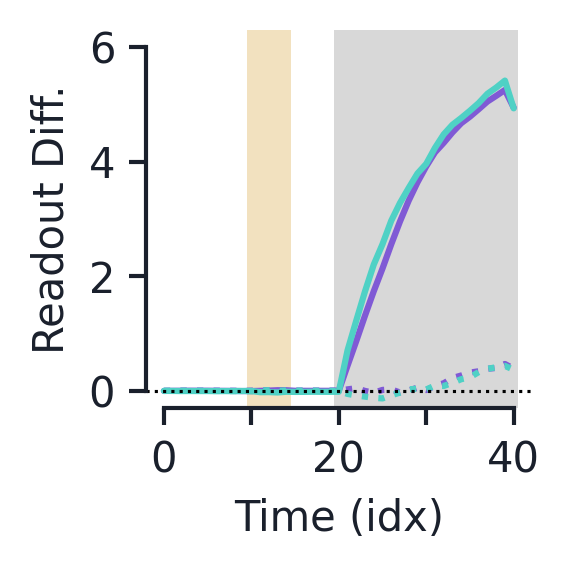

In [ ]:
word_proj = '<eos>' 
# word_proj = 'null'

# Adds A0 as initial state for all sequences
As = db_load['A'].cpu().numpy()
A0 = net_load.A0.cpu().numpy()
A0_batch = np.repeat(A0[np.newaxis, np.newaxis, :, :], As.shape[0], axis=0)
As = np.concatenate((A0_batch, As), axis=1)
As_fit = As

h_word = HebbNet_word_proj(word_proj, As_fit, net_load, toy_params_load)

w2 = net_load.w2.detach().cpu().numpy()
outputs_word = np.matmul(h_word, w2.T)

# Separate states by both their label and the context:
label_1_states = [[[], []], [[], []]] # [context][label_1]
label_2_states = [[[], []], [[], []]] # [context][label_2]

for batch_idx in range(h_word.shape[0]):
    label_1_states[context_mask[batch_idx]][labels_1[batch_idx]].append(h_word[batch_idx])
    label_2_states[context_mask[batch_idx]][labels_2[batch_idx]].append(h_word[batch_idx])

avg_label_1_state = np.zeros((2, 2, h_word.shape[-2], h_word.shape[-1]))
avg_label_2_state = np.zeros((2, 2, h_word.shape[-2], h_word.shape[-1]))
for context_idx in range(2):
    for target_idx in range(2):
        avg_label_1_state[context_idx, target_idx] = np.mean(
            np.array(label_1_states[context_idx][target_idx]), axis=0
        )
        avg_label_2_state[context_idx, target_idx] = np.mean(
            np.array(label_2_states[context_idx][target_idx]), axis=0
        )

avg_label_1_out = np.matmul(avg_label_1_state, w2.T)
avg_label_diffs = np.array((avg_label_1_out[:, 0, :, 0] - avg_label_1_out[:, 0, :, 1],
                            avg_label_1_out[:, 1, :, 1] - avg_label_1_out[:, 0, :, 0]))
# avg_label_1_out = np.linalg.norm(avg_label_1_out[:, 0, :, :] - avg_label_1_out[:, 1, :, :], axis=-1)
print(avg_label_diffs.shape)
avg_label_1_out = np.mean(avg_label_diffs, axis=0)

avg_label_2_out = np.matmul(avg_label_2_state, w2.T)
avg_label_diffs = np.array((avg_label_2_out[:, 0, :, 0] - avg_label_2_out[:, 0, :, 1],
                            avg_label_2_out[:, 1, :, 1] - avg_label_2_out[:, 0, :, 0]))
# avg_label_2_out = np.linalg.norm(avg_label_2_out[:, 0, :, :] - avg_label_2_out[:, 1, :, :], axis=-1)
avg_label_2_out = np.mean(avg_label_diffs, axis=0)

fig, ax1 = plt.subplots(1, 1, figsize=(2,2))

context_labels = ('2', '1')

task_idxs = (3, 5)

ax1.plot(avg_label_1_out[1], linestyle='solid', label='Task 1', color=c_vals[task_idxs[0]])
ax1.plot(avg_label_1_out[0], linestyle='dotted', color=c_vals[task_idxs[0]])
ax1.plot(avg_label_2_out[0], linestyle='solid', label='Task 2', color=c_vals_ld[task_idxs[1]])
ax1.plot(avg_label_2_out[1], linestyle='dotted', color=c_vals_ld[task_idxs[1]])

# ax1.legend()
ax1.axvspan(19.5, 39.5, color='grey', alpha=0.3, zorder=-5, linewidth=0)
ax1.axvspan(epoch_idxs[0]-0.5, epoch_idxs[1]-0.5, color=jetplot.colors.yellow.v6, alpha=0.3, zorder=-5, linewidth=0)
ax1.axvspan(39.5, 40.5, color='grey', alpha=0.3, zorder=-5, linewidth=0)

ax1.set_xlabel('Time (idx)')
ax1.set_ylabel('Readout Diff.')

ax1.set_xlim((0,40))
ax1.set_xticks((0, 10, 20, 30, 40))
ax1.set_xticklabels((0, None, 20, None, 40))

ax1.set_ylim((0, 6))
ax1.set_yticks((0, 2, 4, 6))
# ax1.set_yticklabels((-1, 0, None, 2, None, 4))
ax1.axhline(0.0, color='k', linestyle='dotted', linewidth=0.75)

jetplot.breathe(ax=ax1)

Look at some specifics of the dynamics in A space

In [ ]:
# Flatten matrix dimensions (but not batch and seq)
seq_subset = True
projection_type = 'PCA' # 'PCA', 'time_PCA'
pc_comps = 200

As = db_load['A'].cpu().numpy()

start_seq, end_seq  = 20, toy_params['phrase_length']-1 # pre: stimuli

# Adds A0 as initial state for all sequences
A0 = net.A0.cpu().numpy()
A0_batch = np.repeat(A0[np.newaxis, np.newaxis, :, :], As.shape[0], axis=0)
As = np.concatenate((A0_batch, As), axis=1)
start_seq = start_seq + 1 if start_seq > 0 else start_seq
end_seq = end_seq + 1
As_fit = As

if seq_subset:
    print('Using sequence bounds {} to {}'.format(start_seq, end_seq))
    As_fit = As[:, start_seq:end_seq, :, :]

As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))
A_diffs = As_flat[:, 1:, :] - As_flat[:, :-1, :] # note, already flattened

if projection_type == 'PCA':
    a_PCA = PCA(n_components=pc_comps)

    a_PCA.fit(As_flat.reshape((-1, As_flat.shape[-1])))
    
    # # Fit to one subset, but plot the other
    # As_fit = As[:, epoch_idxs[2]:toy_params['phrase_length']-1, :, :]
    # As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))

    As_pca = np.zeros((As_flat.shape[0], As_flat.shape[1], pc_comps))
    A_diffs_pca = np.zeros((A_diffs.shape[0], A_diffs.shape[1], pc_comps))
    # A_diffs_pca = np.zeros((As_flat.shape[0], As_flat.shape[1]-1, pc_comps))
    A_zeros = np.zeros_like(As_flat[0, 0:1, :])
    for batch_idx in range(As.shape[0]):
        As_pca[batch_idx] = a_PCA.transform(As_flat[batch_idx])
        A_diffs_pca[batch_idx] = a_PCA.transform(A_diffs[batch_idx])
        A_diffs_pca[batch_idx] = np.matmul(A_diffs[batch_idx], a_PCA.components_.T)
        # A_diffs_ca
    A_zeros_pca = a_PCA.transform(A_zeros)

elif projection_type == 'time_PCA':
    As_pca, proj_matrix, center_vector = timeAndPCAProject(As_flat, pc_comps=pc_comps)


Using sequence bounds 21 to 40


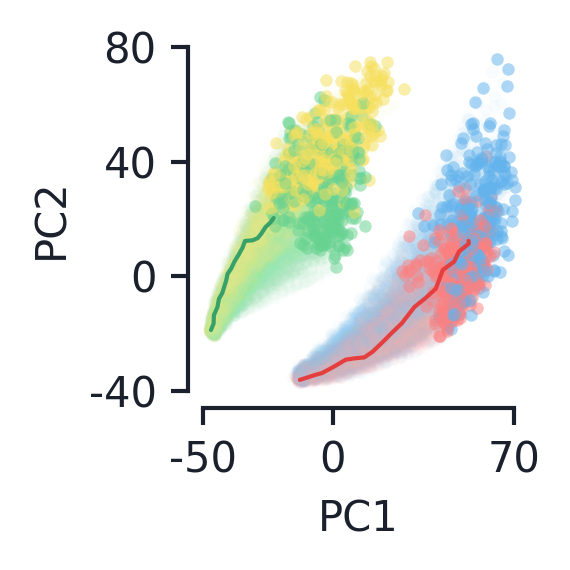

In [ ]:
fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))

pcx = 0
pcy = 1

label_color_idxs = (0, 1, 2, 8)

for batch_idx in range(As.shape[0]):
    color_labels_ld = c_vals_ld[label_color_idxs[labels[batch_idx]]]
    color_labels_l = c_vals_l[label_color_idxs[labels[batch_idx]]]
    color_labels = c_vals[label_color_idxs[labels[batch_idx]]]

    ax1.scatter(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy], 
                linewidth=0.0, marker='.', zorder=0, alpha=0.05,
                color=color_labels_l)
    ax1.scatter(As_pca[batch_idx, -1, pcx], As_pca[batch_idx, -1, pcy], 
                linewidth=0.0, marker='.', zorder=1, alpha=0.5,
                color=color_labels_ld)

# for batch_idx in range(hs_spec.shape[0]):
# for batch_idx in range(len(toy_params['words'])-1):
#     ax.plot(As_spec_pca[batch_idx, :, pcx], As_spec_pca[batch_idx, :, pcy], 
#             color=c_vals[batch_idx], marker='.', zorder=5)

# Initial point (only uses first batch)
# ax1.plot(As_pca[0, 0, pcx], As_pca[0, 0, pcy], marker='s',
#         color='k', zorder=10, markersize=3)

ax1.set_xlabel('PC{}'.format(pcx+1))
ax1.set_ylabel('PC{}'.format(pcy+1))

# # Some sample paths
for batch_idx in (2, 17):
    ax1.plot(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy],
            color=c_vals[label_color_idxs[labels[batch_idx]]], zorder=6, linewidth=1.0)


ax1.set_ylim((-40, 80))
ax1.set_yticks((-40, 0, 40, 80))
ax1.set_yticklabels((-40, 0, 40, 80))
ax1.set_xlim((-50, 70))
ax1.set_xticks((-50, 0, 70))
ax1.set_xticklabels((-50, 0, 70))

jetplot.breathe(ax=ax1)

In [ ]:
# Flatten matrix dimensions (but not batch and seq)
seq_subset = True
projection_type = 'PCA' # 'PCA', 'time_PCA'
pc_comps = 200

As = db_load['A'].cpu().numpy()

start_seq, end_seq  = epoch_idxs[0], epoch_idxs[1] # pre: stimuli

# Adds A0 as initial state for all sequences
A0 = net.A0.cpu().numpy()
A0_batch = np.repeat(A0[np.newaxis, np.newaxis, :, :], As.shape[0], axis=0)
As = np.concatenate((A0_batch, As), axis=1)
start_seq = start_seq + 1 if start_seq > 0 else start_seq
end_seq = end_seq + 1
As_fit = As

if seq_subset:
    print('Using sequence bounds {} to {}'.format(start_seq, end_seq))
    As_fit = As[:, start_seq:end_seq, :, :]

As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))
A_diffs = As_flat[:, 1:, :] - As_flat[:, :-1, :] # note, already flattened

if projection_type == 'PCA':
    a_PCA = PCA(n_components=pc_comps)

    a_PCA.fit(As_flat.reshape((-1, As_flat.shape[-1])))
    
    # # Fit to one subset, but plot the other
    # As_fit = As[:, epoch_idxs[2]:toy_params['phrase_length']-1, :, :]
    # As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))

    As_pca = np.zeros((As_flat.shape[0], As_flat.shape[1], pc_comps))
    A_diffs_pca = np.zeros((A_diffs.shape[0], A_diffs.shape[1], pc_comps))
    # A_diffs_pca = np.zeros((As_flat.shape[0], As_flat.shape[1]-1, pc_comps))
    A_zeros = np.zeros_like(As_flat[0, 0:1, :])
    for batch_idx in range(As.shape[0]):
        As_pca[batch_idx] = a_PCA.transform(As_flat[batch_idx])
        A_diffs_pca[batch_idx] = a_PCA.transform(A_diffs[batch_idx])
        A_diffs_pca[batch_idx] = np.matmul(A_diffs[batch_idx], a_PCA.components_.T)
        # A_diffs_ca
    A_zeros_pca = a_PCA.transform(A_zeros)

elif projection_type == 'time_PCA':
    As_pca, proj_matrix, center_vector = timeAndPCAProject(As_flat, pc_comps=pc_comps)


Using sequence bounds 11 to 16


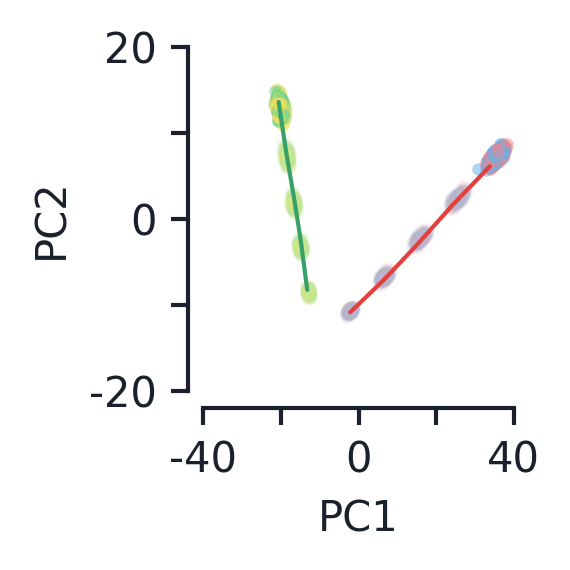

In [ ]:
fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))

pcx = 0
pcy = 1

label_color_idxs = (0, 1, 2, 8)

for batch_idx in range(As.shape[0]):
    color_labels_ld = c_vals_ld[label_color_idxs[labels[batch_idx]]]
    color_labels_l = c_vals_l[label_color_idxs[labels[batch_idx]]]
    color_labels = c_vals[label_color_idxs[labels[batch_idx]]]

    ax1.scatter(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy], 
                linewidth=0.0, marker='.', zorder=0, alpha=0.05,
                color=color_labels_l)
    ax1.scatter(As_pca[batch_idx, -1, pcx], As_pca[batch_idx, -1, pcy], 
                linewidth=0.0, marker='.', zorder=1, alpha=0.5,
                color=color_labels_ld)

# for batch_idx in range(hs_spec.shape[0]):
# for batch_idx in range(len(toy_params['words'])-1):
#     ax.plot(As_spec_pca[batch_idx, :, pcx], As_spec_pca[batch_idx, :, pcy], 
#             color=c_vals[batch_idx], marker='.', zorder=5)

# Initial point (only uses first batch)
# ax1.plot(As_pca[0, 0, pcx], As_pca[0, 0, pcy], marker='s',
#         color='k', zorder=10, markersize=3)

ax1.set_xlabel('PC{}'.format(pcx+1))
ax1.set_ylabel('PC{}'.format(pcy+1))

# Some sample paths
for batch_idx in (2, 17):
    ax1.plot(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy],
            color=c_vals[label_color_idxs[labels[batch_idx]]], zorder=6, linewidth=1)

ax1.set_ylim((-20, 20))
ax1.set_yticks((-20, -10, 0, 10, 20))
ax1.set_yticklabels((-20, None, 0, None, 20))
ax1.set_xlim((-40, 40))
ax1.set_xticks((-40, -20, 0, 20, 40))
ax1.set_xticklabels((-40, None, 0, None, 40))

jetplot.breathe(ax=ax1)

**Anti-Context**

Load the network

In [ ]:
load_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/anti_task_'

STPN_load = ['HebbNet_M[50,100,2]_train=seq_inf_task=context_anti_2class_20len',]

trial_idx = 0
init_seed = 1000
test_set_size = 1000

# Loads network
load_path = load_root + STPN_load[0]

net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)

testData, testOutputMask, testRaw, _ = syn.generate_data_anti_context(
    test_set_size, toy_params_load, net_params_load['n_outputs'],
    raw_data=True, device=torch.device('cpu'), verbose=False)
        
db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)
print('Acuracy: {:.2f}'.format(db_load['acc']))

context_mask, labels_1, anti_labels_1 = testRaw
labels = np.array(testData[:,:,:][1][:, -1, 0].cpu())
labels_1 = labels_1[:, -1, 0] # (n_batch, n_seq, 1) -> (n_batch,)
anti_labels_1 = anti_labels_1[:, -1, 0]
# Modifies labels so it takes into account context as well
labels = np.array(labels + toy_params['n_classes']*context_mask, dtype=np.int32)

As = db_load['A'].cpu().numpy()
A0 = net_load.A0.cpu().numpy()
A0_batch = np.repeat(A0[np.newaxis, np.newaxis, :, :], As.shape[0], axis=0)
As = np.concatenate((A0_batch, As), axis=1)

Acuracy: 0.98


Look at some specifics of the dynamics in A space

In [ ]:
# Flatten matrix dimensions (but not batch and seq)
seq_subset = True
projection_type = 'PCA' # 'PCA', 'time_PCA'
pc_comps = 200

As = db_load['A'].cpu().numpy()

start_seq, end_seq  = 0, toy_params['phrase_length']-1 # pre: stimuli

# Adds A0 as initial state for all sequences
A0 = net.A0.cpu().numpy()
A0_batch = np.repeat(A0[np.newaxis, np.newaxis, :, :], As.shape[0], axis=0)
As = np.concatenate((A0_batch, As), axis=1)
start_seq = start_seq + 1 if start_seq > 0 else start_seq
end_seq = end_seq + 1
As_fit = As

if seq_subset:
    print('Using sequence bounds {} to {}'.format(start_seq, end_seq))
    As_fit = As[:, start_seq:end_seq, :, :]

As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))
A_diffs = As_flat[:, 1:, :] - As_flat[:, :-1, :] # note, already flattened

if projection_type == 'PCA':
    a_PCA = PCA(n_components=pc_comps)

    a_PCA.fit(As_flat.reshape((-1, As_flat.shape[-1])))
    
    # # Fit to one subset, but plot the other
    # As_fit = As[:, epoch_idxs[2]:toy_params['phrase_length']-1, :, :]
    # As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))

    As_pca = np.zeros((As_flat.shape[0], As_flat.shape[1], pc_comps))
    A_diffs_pca = np.zeros((A_diffs.shape[0], A_diffs.shape[1], pc_comps))
    # A_diffs_pca = np.zeros((As_flat.shape[0], As_flat.shape[1]-1, pc_comps))
    A_zeros = np.zeros_like(As_flat[0, 0:1, :])
    for batch_idx in range(As.shape[0]):
        As_pca[batch_idx] = a_PCA.transform(As_flat[batch_idx])
        A_diffs_pca[batch_idx] = a_PCA.transform(A_diffs[batch_idx])
        A_diffs_pca[batch_idx] = np.matmul(A_diffs[batch_idx], a_PCA.components_.T)
        # A_diffs_ca
    A_zeros_pca = a_PCA.transform(A_zeros)

elif projection_type == 'time_PCA':
    As_pca, proj_matrix, center_vector = timeAndPCAProject(As_flat, pc_comps=pc_comps)


Using sequence bounds 0 to 20


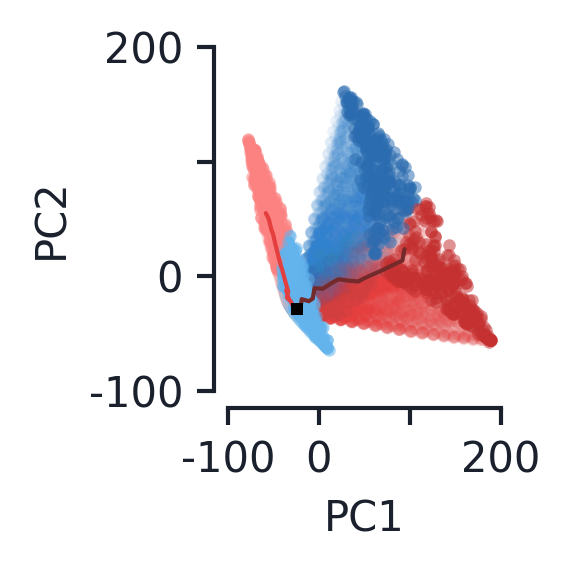

In [ ]:
fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))

pcx = 0
pcy = 1

label_color_idxs = (0, 1, 2, 8)

color_labels_ls = [jetplot.colors.blue.v3, jetplot.colors.red.v3, jetplot.colors.blue.v6, jetplot.colors.red.v6]
color_labels_lds = [jetplot.colors.blue.v4, jetplot.colors.red.v4, jetplot.colors.blue.v7, jetplot.colors.red.v7]
color_labels = [jetplot.colors.blue.v6, jetplot.colors.red.v6, jetplot.colors.blue.v9, jetplot.colors.red.v9]

for batch_idx in range(As.shape[0]):
    color_labels_ld = color_labels_lds[labels[batch_idx]]
    color_labels_l = color_labels_ls[labels[batch_idx]]
    
    ax1.scatter(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy], 
                linewidth=0.0, marker='.', zorder=0, alpha=0.05,
                color=color_labels_l)
    ax1.scatter(As_pca[batch_idx, -1, pcx], As_pca[batch_idx, -1, pcy], 
                linewidth=0.0, marker='.', zorder=1, alpha=0.5,
                color=color_labels_ld)

# for batch_idx in range(hs_spec.shape[0]):
# for batch_idx in range(len(toy_params['words'])-1):
#     ax.plot(As_spec_pca[batch_idx, :, pcx], As_spec_pca[batch_idx, :, pcy], 
#             color=c_vals[batch_idx], marker='.', zorder=5)

# Initial point (only uses first batch)
ax1.plot(As_pca[0, 0, pcx], As_pca[0, 0, pcy], marker='s',
        color='k', zorder=10, markersize=3)

ax1.set_xlabel('PC{}'.format(pcx+1))
ax1.set_ylabel('PC{}'.format(pcy+1))

# # Some sample paths
for batch_idx in (6, 17):
    ax1.plot(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy],
            color=color_labels[labels[batch_idx]], zorder=6, linewidth=1.0)


ax1.set_ylim((-100, 200))
ax1.set_yticks((-100, 0, 100, 200))
ax1.set_yticklabels((-100, 0, None, 200))
ax1.set_xlim((-100, 200))
ax1.set_xticks((-100, 0, 100, 200))
ax1.set_xticklabels((-100, 0, None, 200))

jetplot.breathe(ax=ax1)

Plot h dynamics too

In [ ]:
n_components = 100
hidden_PCA = PCA(n_components=n_components)

hs_fit = db_load['h'].cpu().numpy()[:, 18:19, :]

hidden_PCA.fit(hs_fit.reshape((-1, hs_fit.shape[-1])))

hs_pca = np.zeros((hs_fit.shape[0], hs_fit.shape[1], n_components,))

for batch_idx in range(hs_fit.shape[0]):
    hs_pca[batch_idx] = hidden_PCA.transform(hs_fit[batch_idx])

zero_matrix_pca = hidden_PCA.transform(np.zeros_like(ro_matrix))
ro_matrix = np.array(net_load.w2.detach().cpu())
ro_matrix_pca = hidden_PCA.transform(ro_matrix)

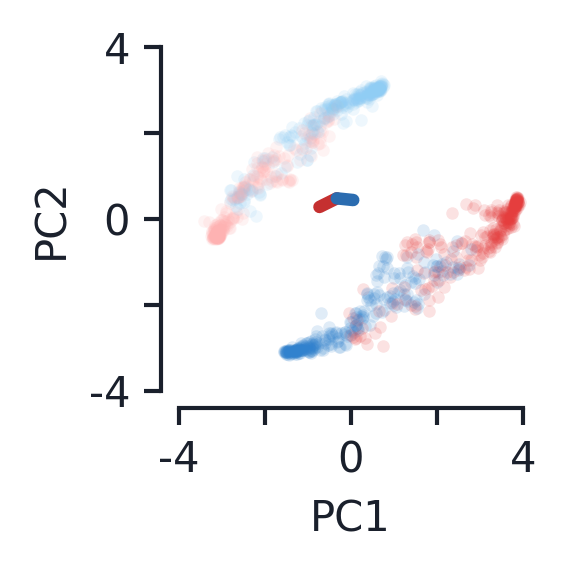

In [ ]:
import matplotlib.colors
from mpl_toolkits.axes_grid.inset_locator import (inset_axes, InsetPosition, mark_inset)

fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))

pcx = 0
pcy = 1

color_labels_ls = [jetplot.colors.blue.v3, jetplot.colors.red.v3, jetplot.colors.blue.v6, jetplot.colors.red.v6]
color_labels = [jetplot.colors.blue.v6, jetplot.colors.red.v6, jetplot.colors.blue.v9, jetplot.colors.red.v9]


for batch_idx in range(hs_fit.shape[0]):
    color_labels_l = color_labels_ls[labels[batch_idx]]

    ax1.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], 
                color=color_labels_l, linewidth=0.0,
                marker='.', zorder=0, alpha=0.15)

for ro_idx in range(net_params['n_outputs']):
    ax1.plot([zero_matrix_pca[ro_idx, pcx], ro_matrix_pca[ro_idx, pcx]], 
            [zero_matrix_pca[ro_idx, pcy], ro_matrix_pca[ro_idx, pcy]],
                color=c_vals_dl[ro_idx], linewidth=3.0, zorder=10)

# Some sample paths
for batch_idx in (18, 23):
    ax1.plot(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy],
            color=color_labels[labels[batch_idx]], zorder=1, linewidth=1.0)
    
for ax in (ax1,):
    
    ax.set_xlabel('PC{}'.format(pcx+1))
    ax.set_ylabel('PC{}'.format(pcy+1))
    ax.set_xlim((-4, 4))
    ax.set_ylim((-4, 4))
    ax.set_xticks((-4, -2, 0, 2, 4))
    ax.set_xticklabels((-4, None, 0, None, 4))
    ax.set_yticks((-4, -2, 0, 2, 4))
    ax.set_yticklabels((-4, None, 0, None, 4))

    jetplot.breathe(ax=ax)

**Old code related to context**

Check some details of the train set

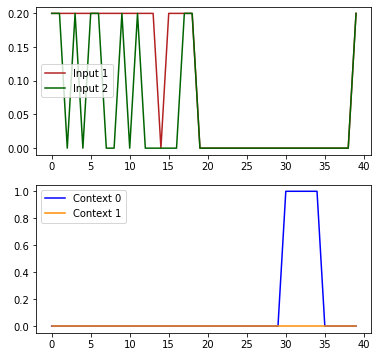

In [ ]:
# Plot the inputs
batch_idx = 5
input_data = trainData.tensors[0].cpu().numpy()[batch_idx]

inputs = trainData.tensors[0].cpu().numpy()
targets = trainData.tensors[1].cpu().numpy()
print('Inputs:', inputs.shape)
print('Targets:', targets.shape)

print(targets[:20, -1, 0])
print(inputs[:20, -8, -1])
print(inputs[:20, -8, -2])
print(inputs[:20, 5, -3])

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

ax1.plot(input_data[:, 2], color=c_vals[0], label='Input 1')
ax1.plot(input_data[:, 24], color=c_vals[1], label='Input 2')
# ax1.axhline(testColorOff[batch_idx], color=c_vals[0], linestyle='dashed')
# ax1.axhline(testMotionOff[batch_idx], color=c_vals[1], linestyle='dashed')

ax1.legend()

ax2.plot(input_data[:, -2], color=c_vals[2], label='Context 0')
ax2.plot(input_data[:, -1], color=c_vals[3], label='Context 1')

ax2.legend()


Gets averages hidden states during certain time periods

In [ ]:
w1 = net.w1.detach().cpu().numpy()
for n in (0, 1, 2):
    print('Dot: {}'.format(get_align_angle(
        np.matmul(w1[:, :25], toy_params['toy_params_1']['word_to_input_vector'][f'evid{n}']),
        np.matmul(w1[:, 25:], toy_params['toy_params_2']['word_to_input_vector'][f'evid{n}'])
    )))



Dot: 72.12454342619763
Dot: 83.3783213064291
Dot: 87.21602862508438


Epoch idxs: (20, 30, 35)
Higher align [-0.014564098227724942, 0.01878500572424695, 0.022346046799846274, 0.025473478405984972, 0.02820503446048842, -0.030339213638734597, -0.03219683566009274, -0.03376197994607706, -0.03499166622054301]
Align sum: [0.02288618235141905, 0.026456868339563684, 0.029228895122962967, 0.03166838531339931, 0.033753847098578704, 0.03545457574136229, 0.03697045460512802, 0.038182169260428396, 0.03923016833243411]
PC3 dot product [0.39518135973478175, 0.5362044021281167, 0.38901745647670277, 0.3141864429494643, -0.8071884233068394, -0.7904375375962649, 0.6646120825002924, -0.17850090389340809, -0.314317887204061]
Higher align [0.24097113338286694, 0.2849112672881825, -0.31815386095408954, -0.34164739592768734]
Align sum: [0.24782279997539164, 0.29308504041976047, 0.32716370359850944, 0.35084301880187885]
PC3 dot product [-0.6369982973222861, -0.4728330119273899, 0.8665727178392357, -0.45569863165447994]


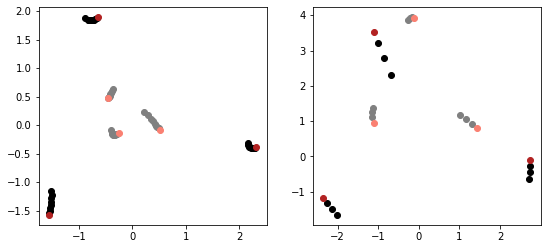

In [ ]:
print('Epoch idxs:', epoch_idxs)

def partition_classes_context(start_idx, end_idx, sort_type='by_context'):

    seq_count  = end_idx - start_idx
    assert seq_count > 0

    hs_1_class = [[[] for _ in range(toy_params['n_classes'])] for _ in range(seq_count)]
    hs_2_class = [[[] for _ in range(toy_params['n_classes'])] for _ in range(seq_count)]

    if sort_type == 'by_context': # Only adds hs if the context is for the given class
        for batch_idx in range(hs.shape[0]):
            for seq_idx in range(start_idx, end_idx): # Only within desired range
                if context_mask[batch_idx]:
                    hs_1_class[seq_idx-start_idx][labels_1[batch_idx]].append(hs[batch_idx, seq_idx])
                else:
                    hs_2_class[seq_idx-start_idx][labels_2[batch_idx]].append(hs[batch_idx, seq_idx])
    else:
        for batch_idx in range(hs.shape[0]):
            for seq_idx in range(start_idx, end_idx): # Only within desired range
                hs_1_class[seq_idx-start_idx][labels_1[batch_idx]].append(hs[batch_idx, seq_idx])
                hs_2_class[seq_idx-start_idx][labels_2[batch_idx]].append(hs[batch_idx, seq_idx])
            
    avg_hs_1_class = np.zeros((seq_count, toy_params['n_classes'], hs.shape[-1]))
    avg_hs_2_class = np.zeros((seq_count, toy_params['n_classes'], hs.shape[-1]))

    for class_idx in range(toy_params['n_classes']):
        for seq_idx in range(seq_count):
            hs_1_class[seq_idx][class_idx] = np.array(hs_1_class[seq_idx][class_idx])
            hs_2_class[seq_idx][class_idx] = np.array(hs_2_class[seq_idx][class_idx])

            avg_hs_1_class[seq_idx][class_idx] = np.mean(hs_1_class[seq_idx][class_idx], axis=0)
            avg_hs_2_class[seq_idx][class_idx] = np.mean(hs_2_class[seq_idx][class_idx], axis=0)

    return hs_1_class, hs_2_class, avg_hs_1_class, avg_hs_2_class


#### Stimulus period ####
# start_idx = 0
# end_idx = epoch_idxs[0]-1
start_idx = epoch_idxs[0] 
end_idx = epoch_idxs[1]-1
hs_1_class, hs_2_class, avg_hs_1_class, avg_hs_2_class = partition_classes_context(start_idx, end_idx)
seq_count = end_idx - start_idx

# # Flatten over sequence and class
# avg_hs_1_class = avg_hs_1_class.reshape((toy_params['n_classes']*epoch_idxs[0], hs.shape[-1]))
# avg_hs_2_class = avg_hs_2_class.reshape((toy_params['n_classes']*epoch_idxs[0], hs.shape[-1]))
# Average over sequence
# avg_hs_1_class = np.mean(avg_hs_1_class, axis=1)
# avg_hs_2_class = np.mean(avg_hs_2_class, axis=1)

PCA_1s = []
PCA_2s = []
avg_hs_1_class_pc1 = np.zeros((seq_count, toy_params['n_classes'], toy_params['n_classes']))
avg_hs_2_class_pc1 = np.zeros((seq_count, toy_params['n_classes'], toy_params['n_classes']))
avg_hs_1_class_pc2 = np.zeros((seq_count, toy_params['n_classes'], toy_params['n_classes']))
avg_hs_2_class_pc2 = np.zeros((seq_count, toy_params['n_classes'], toy_params['n_classes']))

for seq_idx in range(seq_count):
    PCA_1s.append(PCA(n_components=toy_params['n_classes']))
    PCA_1s[-1].fit(avg_hs_1_class[seq_idx])
    # PCA_1s[-1].fit(np.concatenate(hs_1_class[seq_idx], axis=0))

    PCA_2s.append(PCA(n_components=toy_params['n_classes']))
    PCA_2s[-1].fit(avg_hs_2_class[seq_idx])
    # PCA_2s[-1].fit(np.concatenate(hs_2_class[seq_idx], axis=0))

# Fits everything to the final sequence index PCA
fit_idx = 5

for seq_idx in range(seq_count):
    avg_hs_1_class_pc1[seq_idx] = PCA_1s[fit_idx].transform(avg_hs_1_class[seq_idx])
    avg_hs_2_class_pc1[seq_idx] = PCA_1s[fit_idx].transform(avg_hs_2_class[seq_idx])

    avg_hs_1_class_pc2[seq_idx] = PCA_2s[fit_idx].transform(avg_hs_2_class[seq_idx])
    avg_hs_2_class_pc2[seq_idx] = PCA_2s[fit_idx].transform(avg_hs_1_class[seq_idx])

aligns = []
blade_align = []
pc_dots = []

def higher_align(v1, v2, v3, v4):
    def blade_inner(v1, v2, v3, v4):
        inner_mat = np.array(((np.dot(v1, v3), np.dot(v1, v4)),
                            (np.dot(v2, v3), np.dot(v2, v4))))
        return np.linalg.det(inner_mat)

    return blade_inner(v1, v2, v3, v4) / (np.sqrt(
        blade_inner(v1, v2, v1, v2) * blade_inner(v3, v4, v3, v4)
    ))

for seq_idx in range(seq_count):
    align_sum = 0
    for pc_idx1 in range(toy_params['n_classes']-1):
        for pc_idx2 in range(toy_params['n_classes']-1):
            align_sum += np.dot(PCA_1s[seq_idx].components_[pc_idx1], PCA_2s[seq_idx].components_[pc_idx2])**2
    align_sum = align_sum / (toy_params['n_classes']-1)
    aligns.append(align_sum)
    pc_dots.append(np.dot(PCA_1s[seq_idx].components_[2], 
                          PCA_2s[seq_idx].components_[2]))
    blade_align.append(higher_align(
        PCA_1s[seq_idx].components_[0], PCA_1s[seq_idx].components_[1],
        PCA_2s[seq_idx].components_[0], PCA_2s[seq_idx].components_[1]
    ))

print('Higher align', blade_align)
print('Align sum:', aligns)
print('PC3 dot product', pc_dots)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 4))

pc1 = 0
pc2 = 1

for seq_idx in range(seq_count):
    for class_idx in range(toy_params['n_classes']):
        if seq_idx == seq_count - 1:
            ax1.plot(avg_hs_1_class_pc1[seq_idx, class_idx, pc1], avg_hs_1_class_pc1[seq_idx, class_idx, pc2],
                marker='o', color=c_vals[0])
            ax1.plot(avg_hs_2_class_pc1[seq_idx, class_idx, pc1], avg_hs_2_class_pc1[seq_idx, class_idx, pc2],
                    marker='o', color=c_vals_l[0])
        else:
            ax1.plot(avg_hs_1_class_pc1[seq_idx, class_idx, pc1], avg_hs_1_class_pc1[seq_idx, class_idx, pc2],
                    marker='o', color='black')
            ax1.plot(avg_hs_2_class_pc1[seq_idx, class_idx, pc1], avg_hs_2_class_pc1[seq_idx, class_idx, pc2],
                    marker='o', color='grey')
        # ax2.plot(avg_hs_1_class_pc2[state_idx, pc1], avg_hs_1_class_pc2[state_idx, pc2],
        #          marker='o', color='black')
        # ax2.plot(avg_hs_2_class_pc2[state_idx, pc1], avg_hs_2_class_pc2[state_idx, pc2],
        #          marker='o', color='grey')

#### Context period ####
# start_idx = toy_params['phrase_length']-1
# end_idx = toy_params['phrase_length']
start_idx = epoch_idxs[2]
end_idx = toy_params['phrase_length']-1
hs_1_class, hs_2_class, avg_hs_1_class, avg_hs_2_class = partition_classes_context(start_idx, end_idx)
seq_count = end_idx - start_idx

# # Flatten over sequence and class
# avg_hs_1_class = avg_hs_1_class.reshape((toy_params['n_classes']*epoch_idxs[0], hs.shape[-1]))
# avg_hs_2_class = avg_hs_2_class.reshape((toy_params['n_classes']*epoch_idxs[0], hs.shape[-1]))
# Average over sequence
# avg_hs_1_class = np.mean(avg_hs_1_class, axis=1)
# avg_hs_2_class = np.mean(avg_hs_2_class, axis=1)

PCA_1s = []
PCA_2s = []
avg_hs_1_class_pc1 = np.zeros((seq_count, toy_params['n_classes'], toy_params['n_classes']))
avg_hs_2_class_pc1 = np.zeros((seq_count, toy_params['n_classes'], toy_params['n_classes']))
avg_hs_1_class_pc2 = np.zeros((seq_count, toy_params['n_classes'], toy_params['n_classes']))
avg_hs_2_class_pc2 = np.zeros((seq_count, toy_params['n_classes'], toy_params['n_classes']))

for seq_idx in range(seq_count):
    PCA_1s.append(PCA(n_components=toy_params['n_classes']))
    PCA_1s[-1].fit(avg_hs_1_class[seq_idx])
    # PCA_1s[-1].fit(np.concatenate(hs_1_class[seq_idx], axis=0))

    PCA_2s.append(PCA(n_components=toy_params['n_classes']))
    PCA_2s[-1].fit(avg_hs_2_class[seq_idx])
    # PCA_2s[-1].fit(np.concatenate(hs_2_class[seq_idx], axis=0))

# Fits everything to the final sequence index PCA
fit_idx = 0

for seq_idx in range(seq_count):
    avg_hs_1_class_pc1[seq_idx] = PCA_1s[fit_idx].transform(avg_hs_1_class[seq_idx])
    avg_hs_2_class_pc1[seq_idx] = PCA_1s[fit_idx].transform(avg_hs_2_class[seq_idx])

    avg_hs_1_class_pc2[seq_idx] = PCA_2s[fit_idx].transform(avg_hs_2_class[seq_idx])
    avg_hs_2_class_pc2[seq_idx] = PCA_2s[fit_idx].transform(avg_hs_1_class[seq_idx])

aligns = []
blade_align = []
pc_dots = []

for seq_idx in range(seq_count):
    align_sum = 0
    for pc_idx1 in range(toy_params['n_classes']-1):
        for pc_idx2 in range(toy_params['n_classes']-1):
            align_sum += np.dot(PCA_1s[seq_idx].components_[pc_idx1], PCA_2s[seq_idx].components_[pc_idx2])**2
    align_sum = align_sum / (toy_params['n_classes']-1)
    aligns.append(align_sum)
    pc_dots.append(np.dot(PCA_1s[seq_idx].components_[2], 
                          PCA_2s[seq_idx].components_[2]))
    blade_align.append(higher_align(
        PCA_1s[seq_idx].components_[0], PCA_1s[seq_idx].components_[1],
        PCA_2s[seq_idx].components_[0], PCA_2s[seq_idx].components_[1]
    ))

print('Higher align', blade_align)
print('Align sum:', aligns)
print('PC3 dot product', pc_dots)

for seq_idx in range(seq_count):
    for class_idx in range(toy_params['n_classes']):
        if seq_idx == seq_count - 1:
            ax2.plot(avg_hs_1_class_pc1[seq_idx, class_idx, pc1], avg_hs_1_class_pc1[seq_idx, class_idx, pc2],
                marker='o', color=c_vals[0])
            ax2.plot(avg_hs_2_class_pc1[seq_idx, class_idx, pc1], avg_hs_2_class_pc1[seq_idx, class_idx, pc2],
                    marker='o', color=c_vals_l[0])
        else:
            ax2.plot(avg_hs_1_class_pc1[seq_idx, class_idx, pc1], avg_hs_1_class_pc1[seq_idx, class_idx, pc2],
                    marker='o', color='black')
            ax2.plot(avg_hs_2_class_pc1[seq_idx, class_idx, pc1], avg_hs_2_class_pc1[seq_idx, class_idx, pc2],
                    marker='o', color='grey')
        # ax2.plot(avg_hs_1_class_pc2[state_idx, pc1], avg_hs_1_class_pc2[state_idx, pc2],
        #          marker='o', color='black')
        # ax2.plot(avg_hs_2_class_pc2[state_idx, pc1], avg_hs_2_class_pc2[state_idx, pc2],
        #          marker='o', color='grey')

### **Continuous Integration**

In [ ]:
n_trials = 1
acc_thresh = 0.97

save = True
save_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/continuousint_'

for trial_idx in range(n_trials):
    # Note redefines toy_params internal to the loop so that a new random 
    # set of word vectors will be drawn for each trial
    ########## Toy data parameters ##########
    toy_params = {
        'data_type': 'cont_int', # int, context
        
        'phrase_length': 40,
        'n_classes': 2,
        'input_type': 'binary',    # one hot, binary, binary1-1
        'input_size': 50,          # defaults to length of words
        'include_eos': True,

        'stack_phrases': False,
        'n_stack': 1,
        'include_sos': False,
        'n_delay': 0, # Inserts delay words between at end of phrase (but before eos trigger)
        'delay_word': '<delay>', # '<delay>' or 'null'

        'uniform_score': True, # Uniform distribution over scores=
    }

    net_params = {
        'netType': 'HebbNet_M', # HebbNet, HebbNet_M, VanillaRNN, GRU, rHebbNet, rHebbNet_M, GHU, GHU_M
        'n_inputs': toy_params['input_size'],         # input dim
        'n_hidden': 100,                      # hidden dim
        'n_outputs': toy_params['n_classes'],         # output dim
        # 'n_outputs': 10,                                # train with larger number of outputs for generalization tests    
        'f_act': 'tanh',         # 1st layer actiivation function # linear, sigmoid, tanh, relu
        'f0_act': 'linear',      # 2nd layer actiivation function
        'trainable_state0': False,
        
        # STPN Features
        'A_act': None,            # Activation on the A update (tanh or None)
        'lam_clamp': 0.95,   # Maximum lambda value
        'eta_type': 'scalar',     # scalar or vector
        'eta_force': None,        # ensure either Hebbian or anti-Hebbian plasticity
        'hebb_type': 'inputOutput',      # input, output, inputOutput

        # Train parameters
        'train_mode': 'seq_inf',   # 'seq' or 'seq_inf'
        'weight_reg': 'L1',
        'reg_lambda': 1e-4,
        'hidden_bias': True,
        'ro_bias': False,           # use readout bias or not
        'gradient_clip': 10,
        'freeze_inputs': False,      # freeze the input layer (and hidden bias)
        'sparsification': 0.0,      # Amount to sparsify network's weights (0.0 = no sparsification)
        'noise_type': 'input',      # None, 'input', 'hidden'
        'noise_scale': 0.1,         # Expected magnitude of noise vector
        'cuda': True,
        'validEarlyStop': False,     # Early stop when average validation loss saturates
        'accEarlyStop': acc_thresh,   
        'minMaxIter': (2000, 1e6),
        'seed': 3002 + trial_idx,   # This seed is used to generate training/valid data too

        'train_set_size': 3200,
        'valid_set_size': 500,
        'batch_size': 64,
        'epochs': 1,
    }
    # Keep forgetting to turn this on for RNNs, so just automate it
    # net_params['hidden_bias'] = False if net_params['netType'] in ('HebbNet', 'HebbNet_M') else True
    print('LEAVING HIDDEN BIAS ON FOR THIS STPN')

    print('Trial: {}'.format(trial_idx))
    verbose = True if trial_idx == 0 else False

    net, toy_params, net_params = train_network(net_params, toy_params, save=save, 
                                                save_root=save_root, verbose=verbose)

LEAVING HIDDEN BIAS ON FOR THIS STPN
Trial: 0
Continuous integration task (no context)...
Using CUDA...
Net parameters:
  Net Type: Multiplicative
  Structure: f: tanh // fOut: linear // (Nx, Nh, Ny) = (50, 100, 2)
  Hidden bias: trainable // No readout bias // Sparsification: 0.00 // Noise type: input (scl: 1.0e-01)
  A parameters:
    A update: Hebbian // A Act: linear // Eta: scalar // Lambda_max: 0.95
    A0: zeros
Train parameters:
  Loss: XE // LR: 1.00e-03 // Weight reg: L1, coef: 1.0e-02 // Gradient clip: 1.0e+01
Iter:0 grad:8.478 train_loss:0.7684 train_acc:0.469 valid_loss:0.7020 valid_acc:0.542
Iter:50 grad:7.676 train_loss:0.7400 train_acc:0.469 valid_loss:0.6941 valid_acc:0.542
Iter:100 grad:7.035 train_loss:0.7154 train_acc:0.594 valid_loss:0.7041 valid_acc:0.458
Iter:150 grad:6.553 train_loss:0.7284 train_acc:0.422 valid_loss:0.6995 valid_acc:0.458
Iter:200 grad:6.208 train_loss:0.7167 train_acc:0.547 valid_loss:0.6948 valid_acc:0.560
Iter:250 grad:5.955 train_loss:0.717

In [ ]:
load_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/continuousint_'

STPN_load = ['HebbNet_M[50,100,2]_train=seq_inf_task=cont_int_2class_40len',]

trial_idx = 1
init_seed = 3001
test_set_size = 1000

# Loads network
load_path = load_root + STPN_load[0]

net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)

testData, testOutputMask, testRaw, _ = context.generate_cont_int_data(
    test_set_size, toy_params_load, net_params_load['n_outputs'],
    raw_data=True, device=torch.device('cpu'), verbose=False)
        
db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)
print('Acuracy: {:.2f}'.format(db_load['acc']))

labels = np.array(testData[:,:,:][1][:, -1, 0].cpu())

raw_inputs, offsets = testRaw

Acuracy: 0.97


0.024818031


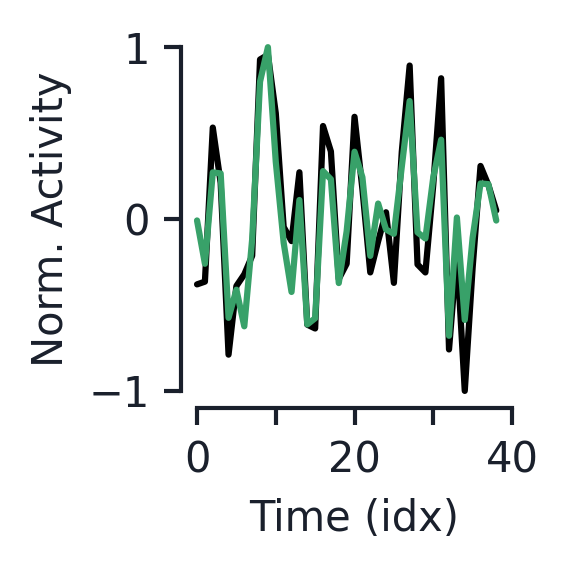

In [ ]:
batch_idx = 0
input_idx = 10
hidden_idx = 8

input_neuron = testData.tensors[0].cpu().numpy()[batch_idx, :-1, input_idx]
hidden_neuron = db_load['h'].cpu().numpy()[batch_idx, :-1, hidden_idx]
# Mean zero
input_neuron_c = input_neuron - np.mean(input_neuron)
hidden_neuron_c = hidden_neuron - np.mean(hidden_neuron)
# Max 1
print(np.max(np.abs(input_neuron_c)))
input_neuron_c = input_neuron_c/np.max(np.abs(input_neuron_c))
hidden_neuron_c = hidden_neuron_c/np.max(np.abs(hidden_neuron_c))

fig, ax1 = plt.subplots(1, 1, figsize=(2, 2))

ax1.plot(input_neuron_c, color='k', label='input',)
ax1.plot(hidden_neuron_c, color=c_vals[2], label='hidden',
         zorder=5)

ax1.set_xlabel('Time (idx)')
ax1.set_ylabel('Norm. Activity')

ax1.set_xlim((0, 40))
ax1.set_xticks((0, 10, 20, 30, 40))
ax1.set_xticklabels((0, None, 20, None, 40))

jetplot.breathe(ax=ax1)

Plot the A dynamics of the continuous integration task

In [ ]:
# Flatten matrix dimensions (but not batch and seq)
projection_type = 'PCA' # 'PCA', 'time_PCA'
pc_comps = 200

As = db_load['A'].cpu().numpy()

# Adds A0 as initial state for all sequences
A0 = net.A0.cpu().numpy()
A0_batch = np.repeat(A0[np.newaxis, np.newaxis, :, :], As.shape[0], axis=0)
As = np.concatenate((A0_batch, As), axis=1)
start_seq = start_seq + 1 if start_seq > 0 else start_seq
end_seq = end_seq + 1
As_fit = As

As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))
A_diffs = As_flat[:, 1:, :] - As_flat[:, :-1, :] # note, already flattened

if projection_type == 'PCA':
    a_PCA = PCA(n_components=pc_comps)

    a_PCA.fit(As_flat.reshape((-1, As_flat.shape[-1])))
    
    # # Fit to one subset, but plot the other
    # As_fit = As[:, epoch_idxs[2]:toy_params['phrase_length']-1, :, :]
    # As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))

    As_pca = np.zeros((As_flat.shape[0], As_flat.shape[1], pc_comps))
    A_diffs_pca = np.zeros((A_diffs.shape[0], A_diffs.shape[1], pc_comps))
    # A_diffs_pca = np.zeros((As_flat.shape[0], As_flat.shape[1]-1, pc_comps))
    A_zeros = np.zeros_like(As_flat[0, 0:1, :])
    for batch_idx in range(As.shape[0]):
        As_pca[batch_idx] = a_PCA.transform(As_flat[batch_idx])
        A_diffs_pca[batch_idx] = a_PCA.transform(A_diffs[batch_idx])
        A_diffs_pca[batch_idx] = np.matmul(A_diffs[batch_idx], a_PCA.components_.T)
        # A_diffs_ca
    A_zeros_pca = a_PCA.transform(A_zeros)

elif projection_type == 'time_PCA':
    As_pca, proj_matrix, center_vector = timeAndPCAProject(As_flat, pc_comps=pc_comps)


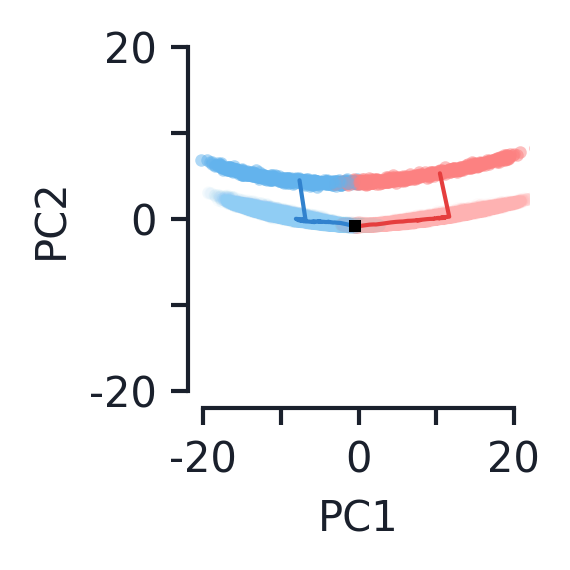

In [ ]:
fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))

pcx = 0
pcy = 1

label_color_idxs = (0, 1, 2, 8)

for batch_idx in range(As.shape[0]):
    color_labels_ld = c_vals_ld[label_color_idxs[labels[batch_idx]]]
    color_labels_l = c_vals_l[label_color_idxs[labels[batch_idx]]]
    color_labels = c_vals[label_color_idxs[labels[batch_idx]]]

    ax1.scatter(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy], 
                linewidth=0.0, marker='.', zorder=0, alpha=0.05,
                color=color_labels_l)
    ax1.scatter(As_pca[batch_idx, -1, pcx], As_pca[batch_idx, -1, pcy], 
                linewidth=0.0, marker='.', zorder=1, alpha=0.5,
                color=color_labels_ld)

# for batch_idx in range(hs_spec.shape[0]):
# for batch_idx in range(len(toy_params['words'])-1):
#     ax.plot(As_spec_pca[batch_idx, :, pcx], As_spec_pca[batch_idx, :, pcy], 
#             color=c_vals[batch_idx], marker='.', zorder=5)

# Initial point (only uses first batch)
ax1.plot(As_pca[0, 0, pcx], As_pca[0, 0, pcy], marker='s',
        color='k', zorder=10, markersize=3)

ax1.set_xlabel('PC{}'.format(pcx+1))
ax1.set_ylabel('PC{}'.format(pcy+1))

# Some sample paths
for batch_idx in (18, 23):
    ax1.plot(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy],
            color=c_vals[label_color_idxs[labels[batch_idx]]], zorder=6, linewidth=1)

ax1.set_ylim((-20, 20))
ax1.set_yticks((-20, -10, 0, 10, 20))
ax1.set_yticklabels((-20, None, 0, None, 20))
ax1.set_xlim((-20, 20))
ax1.set_xticks((-20, -10, 0, 10, 20))
ax1.set_xticklabels((-20, None, 0, None, 20))

jetplot.breathe(ax=ax1)

Plot the h dynamics too

In [ ]:
n_components = 100
hidden_PCA = PCA(n_components=n_components)

hs_fit = db_load['h'].cpu().numpy()

hidden_PCA.fit(hs_fit.reshape((-1, hs_fit.shape[-1])))

hs_pca = np.zeros((hs_fit.shape[0], hs_fit.shape[1], n_components,))

for batch_idx in range(hs_fit.shape[0]):
    hs_pca[batch_idx] = hidden_PCA.transform(hs_fit[batch_idx])

zero_matrix_pca = hidden_PCA.transform(np.zeros_like(ro_matrix))
ro_matrix = np.array(net_load.w2.detach().cpu())
ro_matrix_pca = hidden_PCA.transform(ro_matrix)

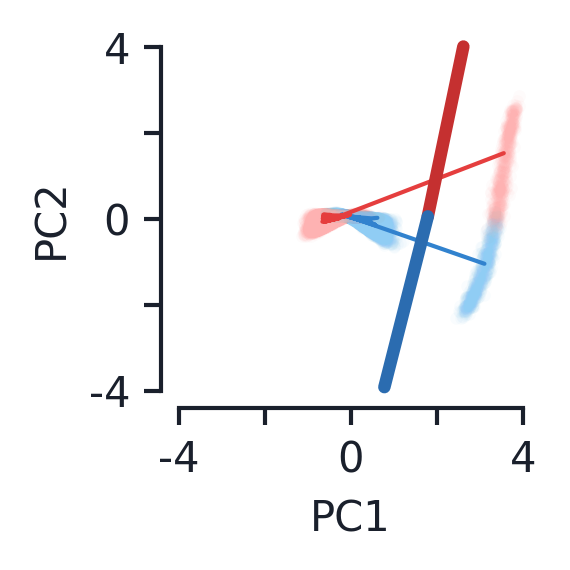

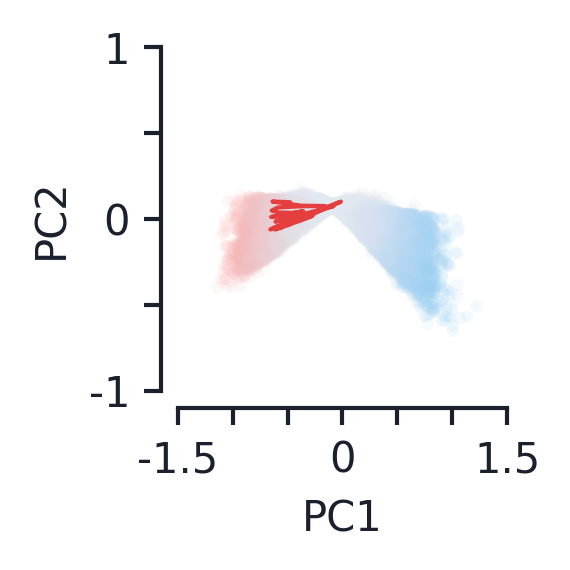

In [ ]:
import matplotlib.colors
from mpl_toolkits.axes_grid.inset_locator import (inset_axes, InsetPosition, mark_inset)

fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2,2))

pcx = 0
pcy = 1

label_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", [
    c_vals_l[0],  jetplot.colors.gray.v3, jetplot.colors.gray.v3, 
    c_vals_l[1], 
])
# labels_cmap = plt.cm.get_cmap('plasma')
max_input = np.max(np.abs(raw_inputs))

for batch_idx in range(hs.shape[0]):
    color_labels_l = c_vals_l[labels[batch_idx]]
    color_labels = c_vals[labels[batch_idx]]

    ax1.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], 
                color=color_labels_l, linewidth=0.0,
                marker='.', zorder=0, alpha=0.05)
    ax2.scatter(hs_pca[batch_idx, :-1, pcx], hs_pca[batch_idx, :-1, pcy], 
                c=raw_inputs[batch_idx, :-1], linewidth=0.0,
                marker='.', zorder=0, alpha=0.1,
                cmap=label_cmap, vmin=-0.8*max_input, vmax=0.8*max_input)

for ro_idx in range(net_params['n_outputs']):
    ax1.plot([zero_matrix_pca[ro_idx, pcx], ro_matrix_pca[ro_idx, pcx]], 
            [zero_matrix_pca[ro_idx, pcy], ro_matrix_pca[ro_idx, pcy]],
                color=c_vals_dl[ro_idx], linewidth=3.0, zorder=10)

# Some sample paths
for batch_idx in (18, 23):
    ax1.plot(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy],
            color=c_vals[labels[batch_idx]], zorder=1, linewidth=1.0)
    if batch_idx == 23:
        ax2.plot(hs_pca[batch_idx, :-1, pcx], hs_pca[batch_idx, :-1, pcy],
            color=c_vals[labels[batch_idx]], zorder=1, linewidth=1.0)

for ax in (ax1,):
    
    ax.set_xlabel('PC{}'.format(pcx+1))
    ax.set_ylabel('PC{}'.format(pcy+1))
    ax.set_xlim((-4, 4))
    ax.set_ylim((-4, 4))
    ax.set_xticks((-4, -2, 0, 2, 4))
    ax.set_xticklabels((-4, None, 0, None, 4))
    ax.set_yticks((-4, -2, 0, 2, 4))
    ax.set_yticklabels((-4, None, 0, None, 4))

    jetplot.breathe(ax=ax)

for ax in (ax2,):
    
    ax.set_xlabel('PC{}'.format(pcx+1))
    ax.set_ylabel('PC{}'.format(pcy+1))
    ax.set_xlim((-1.5, 1.5))
    ax.set_ylim((-1, 1))
    ax.set_xticks((-1.5, -1, -0.5, 0, 0.5, 1, 1.5))
    ax.set_xticklabels((-1.5, None, None, 0, None, None, 1.5))
    ax.set_yticks((-1, -0.5, 0, 0.5, 1))
    ax.set_yticklabels((-1, None, 0, None, 1))

    jetplot.breathe(ax=ax)

### **Serialized MNIST**

Unlike other datasets SMNIST needs to be loaded in down here in its own code

In [ ]:
from torch.utils.data import TensorDataset

def convert_serialized_mnist(dataset, smnist_params, out_size, auto_balance=False, verbose=True, raw_data=False, device='cpu'):
    """
    Prunes classes in MNIST and converts into serialized data
    """

    MNIST_DIM = 28 # Number of pixels of an MNIST image
    
    mnist_classes = smnist_params['smnist_classes']
    n_classes = len(mnist_classes)
    n_seq = smnist_params['phrase_length'] # Used only for input data, not labels or mask
    if smnist_params['include_eos']:
        n_seq = n_seq - 1
    n_smnist_input = int((MNIST_DIM*MNIST_DIM)/n_seq)
    
    n_inputs = smnist_params['input_size']

    batch_size = 64 # Just used internally, doesn't really matter what size this is

    ### Prunes classes that are not in 'mnist_classes'
    prune_bools = np.zeros((n_classes, len(dataset.targets)))
    for digit_idx in range(len(mnist_classes)):
        prune_bools[digit_idx] = dataset.targets==mnist_classes[digit_idx]

    idx = []
    for mnist_idx in range(len(dataset.targets)):
        if prune_bools[:, mnist_idx].any(): idx.append(mnist_idx)

    data_subset = torch.utils.data.Subset(dataset, idx)
    pruned_dataset = torch.utils.data.DataLoader(data_subset, batch_size=64, shuffle=True)

    # Converts dataset into the type that can be used by our code 
    # There are probably better ways to do this but this is just adapting old code...
      
    images_np = [] # list where elements are: batch_index x n_seq x n_smnist_input, concatanated later
    labels_np = [] # elements are batch_index x n_seq x label

    counter = 0
    for train_vals, idx in zip(pruned_dataset, range(len(pruned_dataset))):
        images, labels = train_vals[0], train_vals[1]
        squeezed_images = np.squeeze(images.numpy())
        
        batch_images_squeezed = np.squeeze(images.numpy())
        batch_size = squeezed_images.shape[0]

        if smnist_params['data_type'] == 'smnist_rows':
            images_np.append(batch_images_squeezed.reshape(batch_size, n_seq, n_smnist_input))
        elif smnist_params['data_type'] == 'smnist_columns':
            batch_images_columns = np.swapaxes(batch_images_squeezed, 1, 2)
            images_np.append(batch_images_columns.reshape(batch_size, n_seq, n_smnist_input))
        # Note this uses 'phrase_length' so correct size with or without eos
        labels_batch = np.zeros((squeezed_images.shape[0], smnist_params['phrase_length'], 1), dtype=np.int32)
        for label, batch_idx in zip(labels, range(len(labels))):
            labels_batch[batch_idx, -1, 0] = mnist_classes.index(label)
        labels_np.append(labels_batch)            
    
    # Concatanates over batch dimension
    images_np = np.concatenate(images_np, axis=0)
    labels_np = np.concatenate(labels_np, axis=0)

    # Now converts to full n_input size via usual word mapping
    if 'words'not in smnist_params: # should only be called on first pass
        smnist_params['words'] = ['{}'.format(idx) for idx in range(MNIST_DIM)]
        if smnist_params['include_eos']:
            smnist_params['words'].append('<eos>')
        smnist_params['word_to_input_vector'] = syn.generateInputVectors(smnist_params)
        smnist_params['input_norm'] = np.mean(np.sum(images_np, axis=-1))
        print('Average input sum: {:.2f}'.format(smnist_params['input_norm']))

    # Normalized inputs so expected input sum is 1
    images_np = images_np / smnist_params['input_norm']

    input_matrix = np.zeros((MNIST_DIM, n_inputs))
    for idx in range(MNIST_DIM):
        input_matrix[idx] = smnist_params['word_to_input_vector']['{}'.format(idx)]

    inputs = np.matmul(images_np, input_matrix)
    if smnist_params['include_eos']:
        eos_inputs = np.zeros((inputs.shape[0], 1, n_inputs))
        eos_inputs[:, 0] = smnist_params['word_to_input_vector']['<eos>']

        inputs = np.concatenate((inputs, eos_inputs), axis=1)


    masks_np = np.zeros((images_np.shape[0], smnist_params['phrase_length'], n_classes), dtype=np.int32)
    masks_np[:, -1, :] = np.ones((images_np.shape[0], n_classes))

    inputs_torch = torch.tensor(inputs, dtype=torch.float, device=device)
    labels_torch = torch.tensor(labels_np, dtype=torch.long, device=device)
    masks_torch = torch.tensor(masks_np, dtype=torch.bool, device=device)

    data = TensorDataset(inputs_torch, labels_torch)

    if raw_data:
        return data, masks_torch, None, smnist_params
    else:
        return data, masks_torch, smnist_params

In [ ]:
import torch
import torchvision
from torchvision import transforms, datasets

train_data_mnist = datasets.MNIST('', train=True, download=True, transform=transforms.Compose([transforms.ToTensor()]))
test_data_mnist = datasets.MNIST('', train=False, download=True, transform=transforms.Compose([transforms.ToTensor()]))

In [ ]:
save = False
save_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/'

toy_params = {
    'data_type': 'smnist_columns', # int, context, retro_context, context_int, retro_context_int, retro_context_anti, cont_int, 
    
    'phrase_length': 29, # Includes eos input, without it should be some divisor of 28*28
    'n_classes': None,         # set below
    'input_type': 'binary',    # one_hot, binary, binary1-1
    'input_size': 50,        # set below
    'include_eos': True,

    'stack_phrases': False,
    'n_stack': 1,
    'include_sos': False,
    'n_delay': 0, # Inserts delay words (>0: at end, <0: at beginning)
    'delay_word': '<delay>', # '<delay>' or 'null'

    'uniform_score': True, # Uniform distribution over scores=
}

net_params = {
    'netType': 'VanillaRNN', # HebbNet, HebbNet_M, VanillaRNN, GRU, rHebbNet, rHebbNet_M, GHU, GHU_M
    'n_inputs': toy_params['input_size'],           # input dim
    'n_hidden': 100,                                # hidden dim
    'n_outputs': toy_params['n_classes'],         # output dim
    # 'n_outputs': 10,                                # train with larger number of outputs for generalization tests    
    'f_act': 'tanh',         # 1st layer actiivation function # linear, sigmoid, tanh, relu
    'f0_act': 'linear',          # 2nd layer actiivation function
    'trainable_state0': False,
    
    # STPN Features
    'A_act': None,            # Activation on the A update (tanh or None)
    'lam_clamp': 0.95,          # Maximum lambda value
    'eta_type': 'scalar',       # scalar or vector
    'eta_force': None,        # ensure either Hebbian or anti-Hebbian plasticity
    'hebb_type': 'inputOutput',      # input, output, inputOutput

    # Train parameters
    'train_mode': 'seq',   # 'seq' or 'seq_inf'
    'weight_reg': 'L1',
    'reg_lambda': 1e-3,
    'hidden_bias': True,
    'ro_bias': False,           # use readout bias or not
    'gradient_clip': 10,
    'freeze_inputs': False,      # freeze the input layer (and hidden bias)
    'sparsification': 0.0,      # Amount to sparsify network's weights (0.0 = no sparsification)
    'noise_type': 'input',      # None, 'input', 'hidden'
    'noise_scale': 0.1,         # Expected magnitude of noise vector
    'cuda': True,
    'validEarlyStop': False,     # Early stop when average validation loss saturates
    'accEarlyStop': 0.96,       # Accuracy to stop early at (None to ignore)
    'minMaxIter': (2000, 16000), #(2000, 8000),  # Bounds on training time
    'seed': 2002,               # This seed is used to generate training/valid data too

    'train_set_size': train_data_mnist, # This is a dumb override but it works, the first argument is usually a size, but now it is just the dataset itself
    'valid_set_size': test_data_mnist,
    'batch_size': 64,
    'epochs': 40,
}

# Keep forgetting to turn this on for RNNs, so just automate it
# net_params['hidden_bias'] = False if net_params['netType'] in ('HebbNet', 'HebbNet_M') else True

toy_params['smnist_classes'] = (0, 1, 2, 3, 4, 5, 6, 7, 8, 9)
toy_params['n_classes'] = len(toy_params['smnist_classes'])
net_params['n_outputs'] = toy_params['n_classes']
    
net, toy_params, net_params = train_network(net_params, toy_params, save=save, save_root=save_root)

# trainData, trainOutputMask, toy_params = convert_serialized_mnist(train_data_mnist, toy_params, None, device='cpu')
# validData, validOutputMask, toy_params = convert_serialized_mnist(test_data_mnist, toy_params, None, device='cpu')

Serialized MNIST...
Using CUDA...
Net parameters:
  Net Type: VanillaRNN
  Structure: f: tanh // fOut: linear // (Nx, Nh, Ny) = (50, 100, 10)
  Hidden bias: trainable // No readout bias // Sparsification: 0.00 // Noise type: input (scl: 1.0e-01)
  h0: zeros
Average input sum: 3.66
Train parameters:
  Loss: XE // LR: 1.00e-03 // Weight reg: L1, coef: 1.0e-03 // Gradient clip: 1.0e+01
Iter:0 grad:16.685 train_loss:2.7380 train_acc:0.156 valid_loss:2.9734 valid_acc:0.097
Iter:50 grad:16.676 train_loss:2.2155 train_acc:0.234 valid_loss:2.1705 valid_acc:0.240
Iter:100 grad:16.773 train_loss:1.7510 train_acc:0.359 valid_loss:1.7480 valid_acc:0.359
Iter:150 grad:16.865 train_loss:1.5033 train_acc:0.406 valid_loss:1.5182 valid_acc:0.423
Iter:200 grad:16.961 train_loss:1.3270 train_acc:0.594 valid_loss:1.3548 valid_acc:0.501
Iter:250 grad:17.048 train_loss:1.3079 train_acc:0.500 valid_loss:1.2563 valid_acc:0.544
Iter:300 grad:17.124 train_loss:1.3146 train_acc:0.500 valid_loss:1.2199 valid_acc:

KeyboardInterrupt: ignored

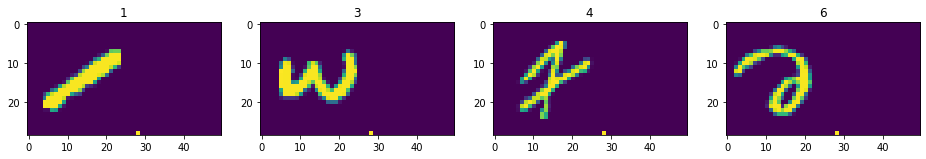

In [ ]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(16, 4))

batch_idxs = (7, 12, 14, 22)

for batch_idx, ax in zip(batch_idxs, (ax1, ax2, ax3, ax4)):
    ax.imshow(trainData.tensors[0][batch_idx])
    ax.set_title(trainData.tensors[1][batch_idx, -1, 0].cpu().numpy())

# print(np.asarray(train_jax['labels'][0, 67, np.asarray(train_jax['index'][0, 67, 27])]))
# print(np.asarray(train_jax['index'][0, 67, 27]))
# plt.imshow(np.asarray(train_jax['inputs'][0, 67]))
# plt.show()
# print('First few inputs')
# plt.imshow(np.asarray(train_jax['inputs'][0, 67, 17:18]))
# plt.show()
# print(np.asarray(train_jax['labels'][4, 66, 27]))
# print(np.asarray(train_jax['index'][4, 66, 27]))
# plt.imshow(np.asarray(train_jax['inputs'][4, 66]))
# plt.show()
# print(np.asarray(train_jax['labels'][82, 13, 27]))
# print(np.asarray(train_jax['index'][82, 13, 27]))
# plt.imshow(np.asarray(train_jax['inputs'][82, 13]))
# plt.show()

### **Motion/Color Context Analysis**

In [ ]:
input_data[29:41, 2]

array([0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0.])

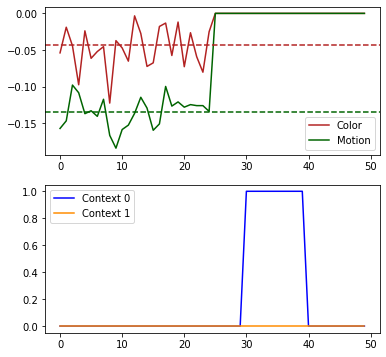

In [ ]:
# Plot the inputs
batch_idx = 1
input_data = testRawInputs[batch_idx]

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

ax1.plot(input_data[:, 0], color=c_vals[0], label='Color')
ax1.plot(input_data[:, 1], color=c_vals[1], label='Motion')
ax1.axhline(testColorOff[batch_idx], color=c_vals[0], linestyle='dashed')
ax1.axhline(testMotionOff[batch_idx], color=c_vals[1], linestyle='dashed')

ax1.legend()

ax2.plot(input_data[:, 2], color=c_vals[2], label='Context 0')
ax2.plot(input_data[:, 3], color=c_vals[3], label='Context 1')

ax2.legend()


(100, 100, 100)
(100,)
(200, 100)


Text(0.5, 1.0, 'Label 2,3 Projection - Hidden state PC plots')

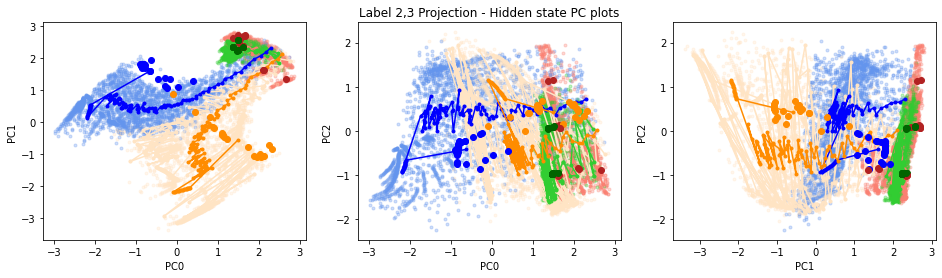

In [ ]:
label_proj = (2, 3)

print(hs.shape)
print(labels.shape)

label0_proj = np.array([label == label_proj[0] for label in labels])
label1_proj = np.array([label == label_proj[1] for label in labels])

mean_label0 = np.mean(hs[label0_proj, :, :], axis=0)
mean_label1 = np.mean(hs[label1_proj, :, :], axis=0)

subspace_PCA = PCA()
print(np.concatenate((mean_label0, mean_label1), axis=0).shape)
subspace_PCA.fit(np.concatenate((mean_label0, mean_label1), axis=0))

hs_sub_pca = []

for batch_idx in range(hs.shape[0]):
    hs_sub_pca.append(subspace_PCA.transform(hs[batch_idx]))

mean_label0_pca = subspace_PCA.transform(mean_label0)
mean_label1_pca = subspace_PCA.transform(mean_label1)

hs_sub_pca = np.array(hs_sub_pca)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4))

pcxs = (0, 0, 1)
pcys = (1, 2, 2)

for ax, pcx, pcy in zip((ax1, ax2, ax3), pcxs, pcys):
    for batch_idx in range(hs.shape[0]):
        # ax1.plot(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], linewidth=1.0,
        #          color=c_vals_l[labels[batch_idx]])
        ax.plot(hs_sub_pca[batch_idx, :, pcx], hs_sub_pca[batch_idx, :, pcy], linewidth=0.0,
                marker='.', color=c_vals_l[labels[batch_idx]], zorder=0, alpha=0.3)
        ax.plot(hs_sub_pca[batch_idx, -1, pcx], hs_sub_pca[batch_idx, -1, pcy], marker='o',
                color=c_vals[labels[batch_idx]], zorder=5)

    ax.plot(mean_label0_pca[:, pcx], mean_label0_pca[:, pcy], marker='.',
            color=c_vals[label_proj[0]], zorder=2)
    ax.plot(mean_label1_pca[:, pcx], mean_label1_pca[:, pcy], marker='.',
            color=c_vals[label_proj[1]], zorder=2)
    # for batch_idx in range(hs_spec.shape[0]):
    # for batch_idx in range(len(toy_params['words'])-1):
    #     ax.plot(hs_spec_pca[batch_idx, :, pcx], hs_spec_pca[batch_idx, :, pcy], 
    #             color=c_vals[batch_idx], marker='.')

    # for ro_idx in range(net_params['n_outputs']):
    #     ax1.plot([0, ro_matrix_pca[ro_idx, pcx]], [0, ro_matrix_pca[ro_idx, pcy]],
    #              color=c_vals[ro_idx], linewidth=3.0)

    # Some sample paths
    for batch_idx in range(4):
        ax.plot(hs_sub_pca[batch_idx, :, pcx], hs_sub_pca[batch_idx, :, pcy], marker='.',
                color=c_vals_l[labels[batch_idx]], zorder=1)

    ax.set_xlabel('PC{}'.format(pcx))
    ax.set_ylabel('PC{}'.format(pcy))

ax2.set_title('Label {},{} Projection - Hidden state PC plots'.format(label_proj[0], label_proj[1]))

Special PCA on just the final states and grouped labels. Intended as another means of finding the integration direction

In [ ]:
clabel_proj = np.array([label in (0, 1) for label in labels])
mlabel_proj = np.array([label in (2, 3) for label in labels])

cint_PCA = PCA()
cint_PCA.fit(hs[clabel_proj, -1, :])

mint_PCA = PCA()
mint_PCA.fit(hs[mlabel_proj, -1, :])

print(np.dot(cint_PCA.components_[0,:], mint_PCA.components_[0,:])/
      (np.linalg.norm(cint_PCA.components_[0,:]) * np.linalg.norm(mint_PCA.components_[0,:])
))

# mean_int_dir = cint_PCA.components_[0,:]
mean_int_dir = mint_PCA.components_[0,:]

0.054343574


Projections onto integration, color, and motion directions

In [ ]:
proj_dirs = np.zeros((3, net_params['n_hidden']))
proj_dirs[0] = mean_int_dir

dir_labels = ('Int.', 'Color', 'Motion')

if net_params['netType'] in ('GRU',):
    proj_dirs[1] = net.whi[:, 0].detach().numpy()
    proj_dirs[2] = net.whi[:, 1].detach().numpy()
elif net_params['netType'] in ('HebbNet_M',):
    proj_dirs[1] = net.w1[:, 0].detach().numpy()
    proj_dirs[2] = net.w1[:, 1].detach().numpy()

proj_dir_ortho, _ = np.linalg.qr(proj_dirs.T)
proj_dir_ortho = proj_dir_ortho.T

print(np.matmul(proj_dir_ortho, proj_dirs.T) /
      np.outer(np.linalg.norm(proj_dir_ortho, axis=-1),
               np.linalg.norm(proj_dirs, axis=-1))
)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4))

pd1s = (0, 0, 1)
pd2s = (1, 2, 2)

for ax, pd1, pd2 in zip((ax1, ax2, ax3), pd1s, pd2s):
    for batch_idx in range(hs.shape[0]):
        ax.plot(np.matmul(hs[batch_idx], proj_dir_ortho[pd1]), 
                np.matmul(hs[batch_idx], proj_dir_ortho[pd2]), linewidth=0.0,
                marker='.', color=c_vals_l[labels[batch_idx]], zorder=0, alpha=0.3)
        ax.plot(np.matmul(hs[batch_idx, -1], proj_dir_ortho[pd1]), 
                np.matmul(hs[batch_idx, -1], proj_dir_ortho[pd2]), 
                marker='o',
                color=c_vals[labels[batch_idx]], zorder=5)

    for batch_idx in range(hs_spec.shape[0]):
        ax.plot(np.matmul(hs_spec[batch_idx], proj_dir_ortho[pd1]), 
                np.matmul(hs_spec[batch_idx], proj_dir_ortho[pd2]), 
                color=c_vals[spec_labels[batch_idx]], marker='.')
    
    
    ax.set_xlabel('{}'.format(dir_labels[pd1]))
    ax.set_ylabel('{}'.format(dir_labels[pd2]))



NameError: ignored

Special coloring to check orthogonality

bin idx 0 count 40
bin idx 1 count 47
bin idx 2 count 51
bin idx 3 count 53
bin idx 4 count 57
bin idx 5 count 48
bin idx 6 count 45
bin idx 7 count 54
bin idx 8 count 39
bin idx 9 count 35
bin idx 10 count 39
bin idx 0 count 33
bin idx 1 count 37
bin idx 2 count 49
bin idx 3 count 51
bin idx 4 count 50
bin idx 5 count 48
bin idx 6 count 48
bin idx 7 count 43
bin idx 8 count 57
bin idx 9 count 39
bin idx 10 count 37
Angle 13.82 deg, dot 0.97


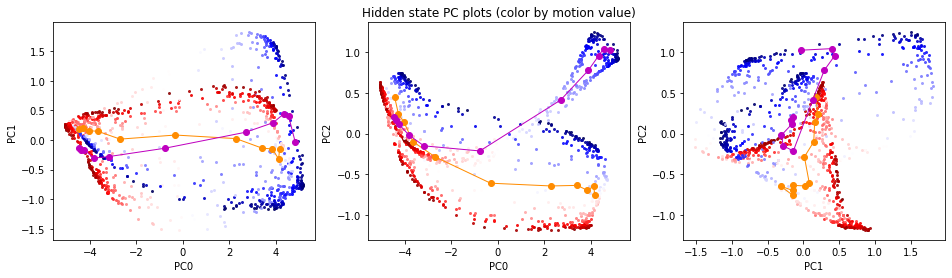

In [ ]:
color_type = 'motion' # 'color', 'motion'

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4))

pcxs = (0, 0, 1)
pcys = (1, 2, 2)
cmap = plt.cm.get_cmap('plasma')
cmap_sym = plt.cm.get_cmap('seismic')
phrase_len = hs.shape[1]

bins = 11
mean_hs_color_motion = []
PCA_color_motion = []
color_motion_labels = ((0, 1), (2, 3))

for inp_idx in (0, 1):
    hs_pca_bins = [[] for _ in range(bins)]
    # Creates bins for the color/motion integrated values
    max_sum = np.max(np.sum(testRawInputs[:, :, inp_idx], axis=1))
    min_sum = np.min(np.sum(testRawInputs[:, :, inp_idx], axis=1))
    int_bins = np.linspace(min_sum, max_sum, bins+1)[:-1]

    # Finds batch indexes corresponding only to the respective class
    input_mask = np.array([label in color_motion_labels[inp_idx] for label in labels])
    input_batches = np.arange(hs.shape[0])[input_mask]
    
    # Sorts data into respective bins 
    for batch_idx in input_batches:
        int_sums = [np.sum(testRawInputs[batch_idx, :seq_idx, inp_idx]) for seq_idx in range(start_seq, end_seq)]
        int_sum_bins = np.digitize(int_sums, int_bins) - 1
        for seq_idx in range(hs_pca.shape[1]):
            hs_pca_bins[int_sum_bins[seq_idx]].append(hs_pca[batch_idx, seq_idx])

    # Averages all data within a bin to get mean hs_pca for said bin
    mean_hs_pca_bins = np.zeros((bins, hs_pca.shape[-1]))
    for bin_idx in range(bins):
        mean_hs_pca_bins[bin_idx] = np.mean(np.array(hs_pca_bins[bin_idx]), axis=0)
        print('bin idx {} count {}'.format(bin_idx, len(hs_pca_bins[bin_idx])))
    
    mean_hs_color_motion.append(mean_hs_pca_bins)
    
    input_PCA = PCA(n_components=bins)
    input_PCA.fit(mean_hs_pca_bins)

    PCA_color_motion.append(input_PCA)

dot = np.dot(PCA_color_motion[0].components_[0], PCA_color_motion[1].components_[0])
angle = 180/np.pi*np.arccos(dot)
print('Angle {:.2f} deg, dot {:.2f}'.format(np.min((angle, 180-angle)), np.abs(dot)))

if color_type == 'color':
    inp_idx = 0
elif color_type == 'motion':
    inp_idx = 1
max_mag = np.max(np.abs(np.sum(testRawInputs[:, :, inp_idx], axis=1)))

for ax, pcx, pcy in zip((ax1, ax2, ax3), pcxs, pcys):
    for batch_idx in range(hs.shape[0]):
        int_sums = [np.sum(testRawInputs[batch_idx, :seq_idx, inp_idx]) for seq_idx in range(start_seq, end_seq)]
        color_labels = [cmap_sym(0.5*int_sum/max_mag + 0.5) for int_sum in int_sums]
        
        ax.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], linewidth=0.0,
                   marker='.', color=color_labels, zorder=0, alpha=0.9)
        # ax.scatter(hs_pca[batch_idx, -1, pcx], hs_pca[batch_idx, -1, pcy], marker='o',
        #            color=color_labels, zorder=5, alpha=0.5)

    for inp_idx_plot in (0, 1):
        ax.plot(mean_hs_color_motion[inp_idx_plot][:, pcx], 
                   mean_hs_color_motion[inp_idx_plot][:, pcy], linewidth=1.0,
                   marker='o', color=c_vals[3+inp_idx_plot], zorder=10, 
                   alpha=1.0)

    # for batch_idx in range(hs_spec.shape[0]):
    # # for batch_idx in range(len(toy_params['words'])-2):
    #     ax.plot(hs_spec_pca[batch_idx, :, pcx], hs_spec_pca[batch_idx, :, pcy], 
    #             color=c_vals[spec_labels[batch_idx]], marker='.')

    # for ro_idx in range(net_params['n_outputs']):
    #     ax.plot([0, ro_matrix_pca[ro_idx, pcx]], [0, ro_matrix_pca[ro_idx, pcy]],
    #              color=c_vals[ro_idx], linewidth=3.0, zorder=10)

    # Some sample paths
    # for batch_idx in range(2):
    #     ax.plot(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], marker='.',
    #             color=c_vals[labels[batch_idx]], zorder=1)

    ax.set_xlabel('PC{}'.format(pcx))
    ax.set_ylabel('PC{}'.format(pcy))

if color_type == 'color':
    ax2.set_title('Hidden state PC plots (color by color value)')
elif color_type == 'motion':
    ax2.set_title('Hidden state PC plots (color by motion value)')

### **PC Dynamics Plots**

Note that this code just uses the same VanillaRNNs that was used to investigate flow under gradually longer phrases. 

In [ ]:
load_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/lambdasMinIt_'

vanilla_load = ['VanillaRNN[50,100,2]_train=seq_inf_task=int_2class_20len',]

trial_idx = 0
init_seed = 1001

turn_off_noise = True
test_set_size = 1000

# Loads network
load_root = load_root_start+str('vanilla').replace('.', '')+'_'
load_path = load_root + vanilla_load[0]
net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)

if turn_off_noise:
    print('Turning off noise for test set.')
    net_noise_type = net_load.noiseType
    net_load.noiseType = None

testData, testOutputMask, _ = syn.generate_data(
    test_set_size, toy_params_load, net_params_load['n_outputs'],
    raw_data=False, device=torch.device('cpu'), verbose=False)

db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)

print('Accuracy: {:.3f}'.format(db_load['acc']))

labels = np.array(testData[:,:,:][1][:, -1, 0].cpu())

# Generates labels for each word in input sequences 
word_to_input_vector_mat = np.zeros((len(toy_params_load['words']), net_params_load['n_inputs'],))
for word_idx, word in enumerate(toy_params_load['words']):
    word_to_input_vector_mat[word_idx] = toy_params_load['word_to_input_vector'][word]
word_labels = np.argmax(np.matmul(testData.tensors[0].cpu().numpy(), word_to_input_vector_mat.T), axis=-1)

hs = db_load['h'].detach().numpy()
print('Hidden states shape', hs.shape)
ro_matrix = np.array(net_load.w2.detach().cpu())
print('RO shape', ro_matrix.shape)

# Restores noise if it has been turned off
if turn_off_noise:
    net_load.noiseType = net_noise_type

delta_hs = get_word_deflections(net_load, db_load, word_labels, toy_params_load, net_params_load)

Turning off noise for test set.
Accuracy: 0.919
Hidden states shape (1000, 20, 100)
RO shape (2, 100)
  Word 'evid0' count: 6406
  Word 'evid1' count: 6495
  Word 'null' count: 6099
  Word '<eos>' count: 1000
  Word 'evid0' theory acc: h nan
  Word 'evid1' theory acc: h nan
  Word 'null' theory acc: h nan
  Word '<eos>' theory acc: h nan
Outputing for RNNs


/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [ ]:
n_components = 100
hidden_PCA = PCA(n_components=n_components)

hs_fit = hs

# Adds initial hidden state to h
h0 = net_load.h0.cpu().numpy()
h0_batch = np.repeat(h0[np.newaxis, np.newaxis, :], hs_fit.shape[0], axis=0)
hs_fit = np.concatenate((h0_batch, hs_fit), axis=1)

# Gets running score from the sequence
running_score = get_running_scores(word_labels, toy_params_load)
# Adds extra row of zeros for h0
running_score = np.concatenate((
    np.zeros((running_score.shape[0], 1, running_score.shape[-1],)), running_score
), axis=1)
score_diffs = running_score[:, :, 1] - running_score[:, :, 0]

hidden_PCA.fit(hs_fit.reshape((-1, hs_fit.shape[-1])))

hs_pca = np.zeros((hs_fit.shape[0], hs_fit.shape[1], n_components,))

for batch_idx in range(hs_fit.shape[0]):
    hs_pca[batch_idx] = hidden_PCA.transform(hs_fit[batch_idx])

zero_matrix_pca = hidden_PCA.transform(np.zeros_like(ro_matrix))
ro_matrix_pca = hidden_PCA.transform(ro_matrix)

delta_hs_pca = []

for word_idx in range(len(delta_hs)):
    delta_hs_pca.append(np.matmul(delta_hs[word_idx], hidden_PCA.components_.T))
    # delta_hs_pca.append(hidden_PCA.transform(delta_hs[word_idx]))

print('PCA shape:', hs_pca.shape)
print('Variances:', ['{:.2f}'.format(var) for var in hidden_PCA.explained_variance_[:10]])
print('PR: {:.2f}'.format(
    participation_ratio_vector(hidden_PCA.explained_variance_)))

PCA shape: (1000, 21, 100)
Variances: ['18.39', '1.87', '1.16', '0.59', '0.40', '0.33', '0.30', '0.23', '0.20', '0.18']
PR: 1.70


/usr/local/lib/python3.7/dist-packages/google/colab/_event_manager.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)


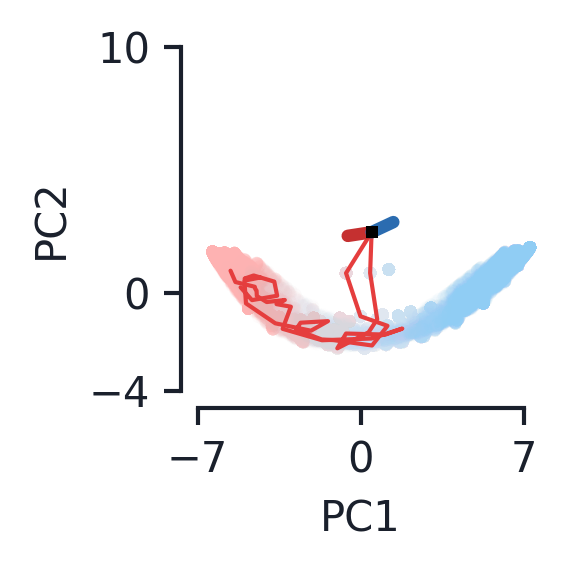

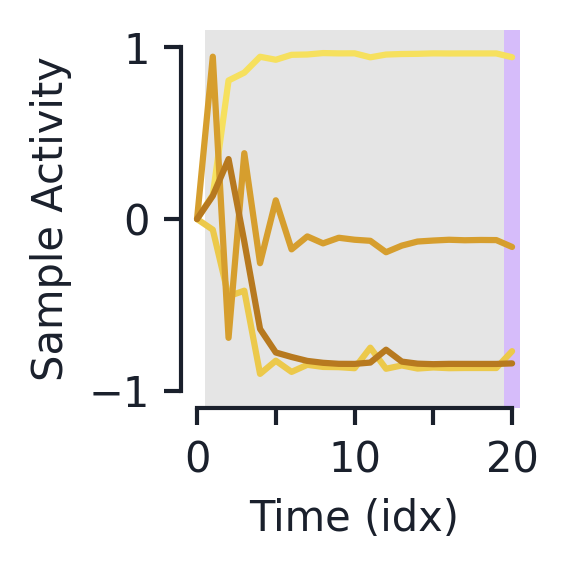

/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


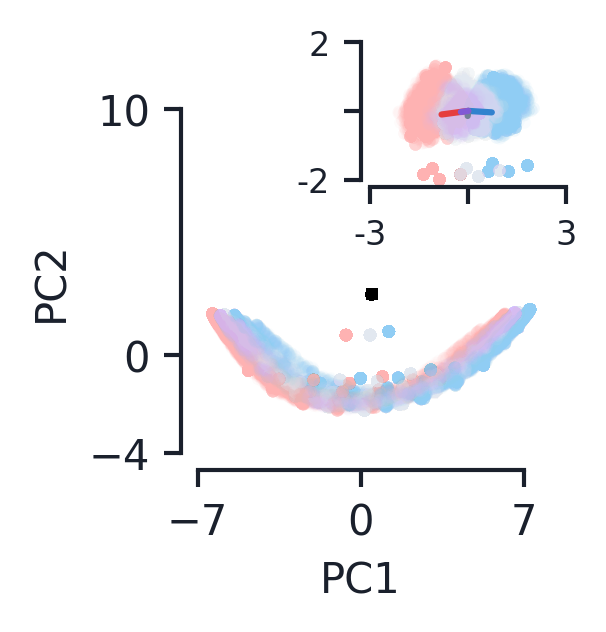

In [ ]:
import matplotlib.colors
from mpl_toolkits.axes_grid.inset_locator import (inset_axes, InsetPosition, mark_inset)

fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))
fig3, ax3 = plt.subplots(1, 1, figsize=(2,2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2,2))

pcx = 0
pcy = 1

label_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", [
    c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], jetplot.colors.gray.v3, 
    c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1],
])
max_score = toy_params['phrase_length'] - 1

for batch_idx in range(hs.shape[0]):
    color_labels_l = c_vals_l[labels[batch_idx]]
    color_labels = c_vals[labels[batch_idx]]

    ax1.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], 
                c=score_diffs[batch_idx], linewidth=0.0,
                marker='.', zorder=0, alpha=0.05,
                cmap=label_cmap, vmin=-max_score, vmax=max_score)

word_colors_l = (c_vals_l[0], c_vals_l[1], jetplot.colors.gray.v3, c_vals_l[3],)
word_colors = (c_vals[0], c_vals[1], jetplot.colors.gray.v6, c_vals[3],)

for batch_idx in range(hs.shape[0]):
    color_labels_l = [word_colors_l[word_labels[batch_idx, seq_idx]] for seq_idx in range(toy_params_load['phrase_length'])]
    color_labels_l.insert(0, 'black') # initial hidden state
    color_labels = word_colors[word_labels[batch_idx, -1]]
    
    ax2.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], linewidth=0.0,
                marker='.', color=color_labels_l, zorder=0, alpha=0.05)
    # Makes EoS a little darker
    ax2.scatter(hs_pca[batch_idx, -1, pcx], hs_pca[batch_idx, -1, pcy], linewidth=0.0,
                marker='.', color=color_labels_l[-1], zorder=1, alpha=0.05)

for ro_idx in range(net_params['n_outputs']):
    ax1.plot([zero_matrix_pca[ro_idx, pcx], ro_matrix_pca[ro_idx, pcx]], 
            [zero_matrix_pca[ro_idx, pcy], ro_matrix_pca[ro_idx, pcy]],
                color=c_vals_dl[ro_idx], linewidth=3.0, zorder=10)

# Some sample paths
for batch_idx in (0, 1):
    ax1.plot(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy],
            color=c_vals[labels[batch_idx]], zorder=1, linewidth=1.0)

iax2 = plt.axes([0,0,2,1])
iax2.set_axes_locator(InsetPosition(ax2, [0.5,0.75,0.6,0.4]))
# iax2.set_xlabel('$\Delta$PC{}'.format(pcx+1))
# iax2.set_ylabel('$\Delta$PC{}'.format(pcy+1))
for word_idx in range(4):
    if word_idx == 2: # Grey for neutral
        color_labels_l = jetplot.colors.gray.v3
        color_labels = jetplot.colors.gray.v6
    else:
        color_labels_l = c_vals_l[word_idx]
        color_labels = c_vals[word_idx]
    iax2.scatter(delta_hs_pca[word_idx][:, pcx], delta_hs_pca[word_idx][:, pcy], 
                 linewidth=0.0, marker='.', color=color_labels_l, 
                 zorder=0, alpha=0.05)
    iax2.plot((0, np.mean(delta_hs_pca[word_idx][:, pcx], axis=0)),
              (0, np.mean(delta_hs_pca[word_idx][:, pcy], axis=0)), 
              linewidth=1.5, color=color_labels, marker=None, 
              zorder=5, alpha=1.0)

iax2.set_xlim((-3, 3))
iax2.set_ylim((-2, 2))
iax2.set_xticks((-3, 0, 3))
iax2.set_yticks((-2, 0, 2))
iax2.set_xticklabels((-3, None, 3))
iax2.set_yticklabels((-2, None, 2))
iax2.spines["top"].set_visible(False)
iax2.spines["right"].set_visible(False)
# iax2.spines["bottom"].set_visible(False)
# iax2.spines["left"].set_visible(False)
for item in ([iax2.xaxis.label, iax2.yaxis.label] +
             iax2.get_xticklabels() + iax2.get_yticklabels()):
    item.set_fontsize(8)
jetplot.breathe(ax=iax2)

np.random.seed(32523)
n_rand_neurons = 4
# Gets a batch with a relatively large score
max_batch_idx = 0
while np.abs(score_diffs[max_batch_idx, -1]) < 0.5*max_score:
    max_batch_idx = np.random.randint(0, hs_fit.shape[0])
rand_idxs = np.random.randint(0, hs_fit.shape[-1], size=(n_rand_neurons,))

neuron_colors = [jetplot.colors.yellow.v4, jetplot.colors.yellow.v5,
                 jetplot.colors.yellow.v6, jetplot.colors.yellow.v7,
                 jetplot.colors.yellow.v8]

for neuron_idx in range(n_rand_neurons):
    ax3.plot(hs_fit[max_batch_idx, :, rand_idxs[neuron_idx]], 
             color=neuron_colors[neuron_idx])

ax3.set_xlim((0, 20))
ax3.set_ylim((-1, 1))
ax3.set_xlabel('Time (idx)')
ax3.set_ylabel('Sample Activity')
ax3.set_xticks((0, 5, 10, 15, 20))
ax3.set_xticklabels((0, None, 10, None, 20))

ax3.axvspan(0.5, 19.5, color='grey', alpha=0.2, zorder=-5, linewidth=0)
ax3.axvspan(19.5, 20.5, color=jetplot.colors.purple.v3, alpha=1.0, zorder=-5, linewidth=0)

for ax in (ax1, ax2):
    # Initial hidden (only well-defined for RNNs)
    ax.plot(hs_pca[0, 0, pcx], hs_pca[0, 0, pcy], marker='s',
            color='k', zorder=10, markersize=3)
    
    ax.set_xlabel('PC{}'.format(pcx+1))
    ax.set_ylabel('PC{}'.format(pcy+1))
    ax.set_xlim((-7, 7))
    ax.set_ylim((-4, 10))
    ax.set_xticks((-7, 0, 7))
    ax.set_yticks((-4, 0, 10))

for ax in (ax1, ax2, ax3):
    jetplot.breathe(ax=ax)

Note that this code just uses the same STPNs that was used to investigate flow under gradually longer phrases. 

In [ ]:
load_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/lambdasMinIt_'

STPN_load = ['HebbNet_M[50,100,2]_train=seq_inf_task=int_2class_20len',]

trial_idx = 4
init_seed = 1001

turn_off_noise = True
test_set_size = 1000

# Loads network
load_root = load_root_start+str('0.95').replace('.', '')+'_'
load_path = load_root + STPN_load[0]
net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)

if turn_off_noise:
    print('Turning off noise for test set.')
    net_noise_type = net_load.noiseType
    net_load.noiseType = None

testData, testOutputMask, _ = syn.generate_data(
    test_set_size, toy_params_load, net_params_load['n_outputs'],
    raw_data=False, device=torch.device('cpu'), verbose=False)

db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)

print('Accuracy: {:.3f}'.format(db_load['acc']))

labels = np.array(testData[:,:,:][1][:, -1, 0].cpu())

# Generates labels for each word in input sequences 
word_to_input_vector_mat = np.zeros((len(toy_params_load['words']), net_params_load['n_inputs'],))
for word_idx, word in enumerate(toy_params_load['words']):
    word_to_input_vector_mat[word_idx] = toy_params_load['word_to_input_vector'][word]
word_labels = np.argmax(np.matmul(testData.tensors[0].cpu().numpy(), word_to_input_vector_mat.T), axis=-1)

# Gets running score from the sequence
running_score = get_running_scores(word_labels, toy_params_load)
score_diffs = running_score[:, :, 1] - running_score[:, :, 0]

hs = db_load['h'].detach().numpy()
print('Hidden states shape', hs.shape)
ro_matrix = np.array(net_load.w2.detach().cpu())
print('RO shape', ro_matrix.shape)

# Gets alignment of individual clusters with ROs
hs_flat = hs.reshape((-1, hs.shape[-1]))
word_labels_flat = word_labels.flatten()
word_hs = []
mean_word_aligns = []

for word_idx in range(len(toy_params_load['words'])):
    word_hs.append(hs_flat[word_idx == word_labels_flat])
    # print(word_hs[-1].shape)

    word_PCA = PCA()
    word_PCA.fit(word_hs[-1])

    word_aligns = []
    for ro_idx in range(ro_matrix.shape[0]):
        min_angle = np.min((get_align_angle(word_PCA.components_[0], ro_matrix[ro_idx]),
                            get_align_angle(-1*word_PCA.components_[0], ro_matrix[ro_idx])))
        word_aligns.append(np.cos(np.pi/180*min_angle))
        # print('Word {} RO {} - angle: {:.2f}'.format(
        #     toy_params_load['words'][word_idx], ro_idx, np.cos(np.pi/180*min_angle)
        # ))
    mean_word_aligns.append(np.mean(word_aligns))

# Restores noise if it has been turned off
if turn_off_noise:
    net_load.noiseType = net_noise_type

delta_hs, delta_As, delta_hs_theory, delta_hs_theory_seq, delta_As_theory, delta_As_theory_seq = get_word_deflections(net_load, db_load, word_labels, toy_params_load, net_params_load)

Turning off noise for test set.
Accuracy: 1.000
Hidden states shape (1000, 20, 100)
RO shape (2, 100)
  Word 'evid0' count: 6043
  Word 'evid1' count: 6079
  Word 'null' count: 5878
  Word '<eos>' count: 1000
  Word 'evid0' theory acc: h 0.104 // A 0.074 // dA 0.308
  Word 'evid1' theory acc: h 0.133 // A 0.082 // dA 0.394
  Word 'null' theory acc: h 0.107 // A 0.096 // dA 0.477
  Word '<eos>' theory acc: h 0.349 // A 0.075 // dA 0.742
Outputing for HebbNet_M


In [ ]:
n_components = 100
hidden_PCA = PCA(n_components=n_components)

hs_fit = hs

hidden_PCA.fit(hs_fit.reshape((-1, hs_fit.shape[-1])))

hs_pca = np.zeros((hs_fit.shape[0], hs_fit.shape[1], n_components,))

for batch_idx in range(hs_fit.shape[0]):
    hs_pca[batch_idx] = hidden_PCA.transform(hs_fit[batch_idx])

zero_matrix_pca = hidden_PCA.transform(np.zeros_like(ro_matrix))
ro_matrix_pca = hidden_PCA.transform(ro_matrix)

delta_hs_pca = []

for word_idx in range(len(delta_hs)):
    delta_hs_pca.append(np.matmul(delta_hs[word_idx], hidden_PCA.components_.T))
    # delta_hs_pca.append(hidden_PCA.transform(delta_hs[word_idx]))

print('PCA shape:', hs_pca.shape)
print('Variances:', ['{:.2f}'.format(var) for var in hidden_PCA.explained_variance_[:10]])
print('PR: {:.2f}'.format(
    participation_ratio_vector(hidden_PCA.explained_variance_)))

if score_diffs.shape[1] == hs_fit.shape[1]+1: # Removes initial score diff
    score_diffs = score_diffs[:, 1:]


PCA shape: (1000, 20, 100)
Variances: ['8.07', '1.30', '0.70', '0.35', '0.02', '0.01', '0.01', '0.00', '0.00', '0.00']
PR: 1.63


/usr/local/lib/python3.7/dist-packages/google/colab/_event_manager.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)


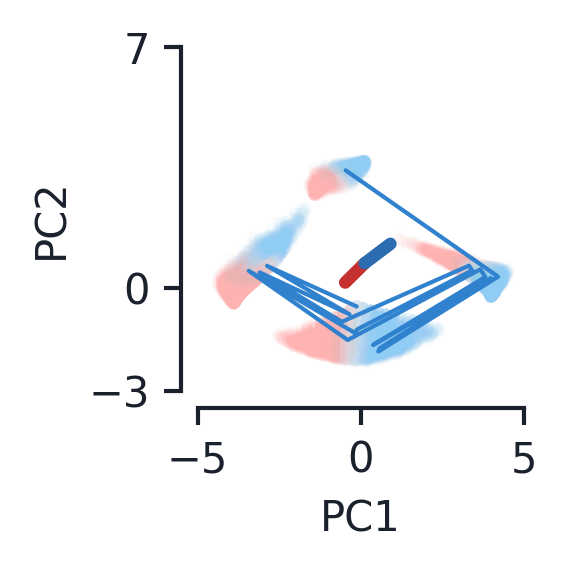

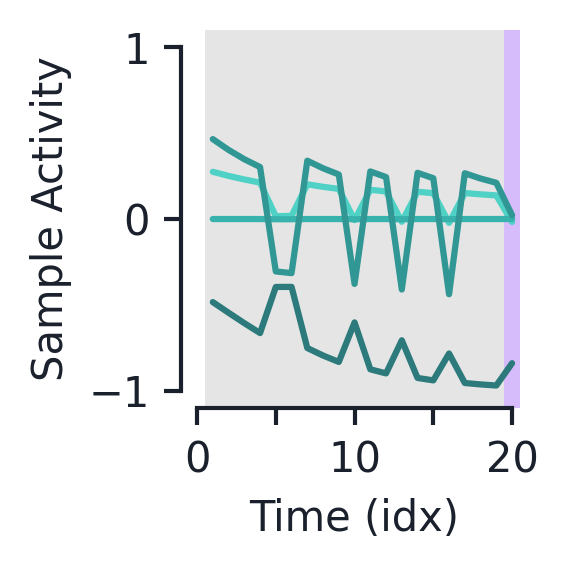

/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


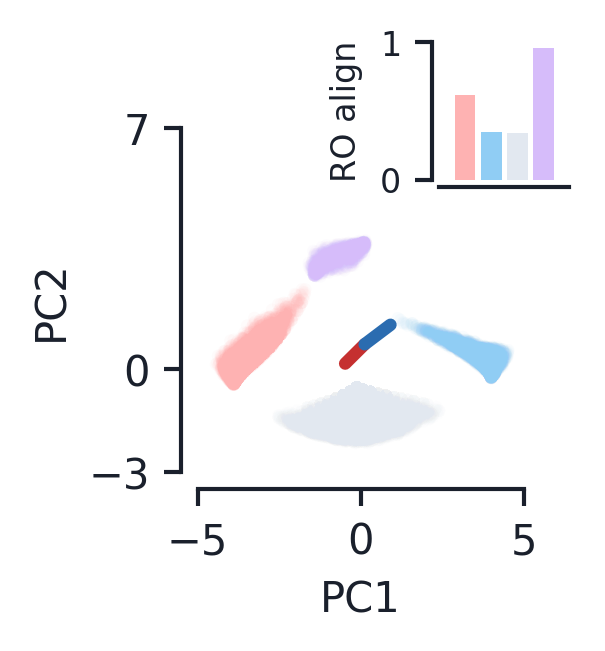

In [ ]:
import matplotlib.colors
from mpl_toolkits.axes_grid.inset_locator import (inset_axes, InsetPosition, mark_inset)

fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))
fig3, ax3 = plt.subplots(1, 1, figsize=(2,2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2,2))

pcx = 0
pcy = 1

phrase_len = hs.shape[1]

label_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", [
    c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], jetplot.colors.gray.v3, 
    c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1],
])
max_score = toy_params['phrase_length'] - 1

for batch_idx in range(hs.shape[0]):
    color_labels_l = c_vals_l[labels[batch_idx]]
    color_labels = c_vals[labels[batch_idx]]

    ax1.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], 
                c=score_diffs[batch_idx], linewidth=0.0,
                marker='.', zorder=0, alpha=0.05,
                cmap=label_cmap, vmin=-max_score, vmax=max_score)

word_colors_l = (c_vals_l[0], c_vals_l[1], jetplot.colors.gray.v3, c_vals_l[3],)
word_colors = (c_vals[0], c_vals[1], jetplot.colors.gray.v6, c_vals[3],)

for batch_idx in range(hs.shape[0]):
    color_labels_l = [word_colors_l[word_labels[batch_idx, seq_idx]] for seq_idx in range(phrase_len)]
    color_labels = word_colors[word_labels[batch_idx, -1]]

    ax2.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], linewidth=0.0,
                marker='.', color=color_labels_l, zorder=0, alpha=0.05)

for ro_idx in range(net_params['n_outputs']):
    ax1.plot([zero_matrix_pca[ro_idx, pcx], ro_matrix_pca[ro_idx, pcx]], 
            [zero_matrix_pca[ro_idx, pcy], ro_matrix_pca[ro_idx, pcy]],
                color=c_vals_dl[ro_idx], linewidth=3.0, zorder=10)
    ax2.plot([zero_matrix_pca[ro_idx, pcx], ro_matrix_pca[ro_idx, pcx]], 
            [zero_matrix_pca[ro_idx, pcy], ro_matrix_pca[ro_idx, pcy]],
                color=c_vals_dl[ro_idx], linewidth=3.0, zorder=10)

# Some sample paths
for batch_idx in (15,):
    ax1.plot(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy],
            color=c_vals[labels[batch_idx]], zorder=1, linewidth=1.0)

# iax2 = plt.axes([0,0,2,1])
# iax2.set_axes_locator(InsetPosition(ax2, [0.5,0.8,0.6,0.4]))
# # iax2.set_xlabel('$\Delta$PC{}'.format(pcx+1))
# # iax2.set_ylabel('$\Delta$PC{}'.format(pcy+1))
# for word_idx in range(3):
#     if word_idx == 2: # Grey for neutral
#         color_labels_l = jetplot.colors.gray.v3
#         color_labels = jetplot.colors.gray.v6
#     else:
#         color_labels_l = c_vals_l[word_idx]
#         color_labels = c_vals[word_idx]
#     iax2.scatter(delta_hs_pca[word_idx][:, pcx], delta_hs_pca[word_idx][:, pcy], 
#                  linewidth=0.0, marker='.', color=color_labels_l, 
#                  zorder=0, alpha=0.05)
#     iax2.plot((0, np.mean(delta_hs_pca[word_idx][:, pcx], axis=0)),
#               (0, np.mean(delta_hs_pca[word_idx][:, pcy], axis=0)), 
#               linewidth=1.5, color=color_labels, marker=None, 
#               zorder=5, alpha=1.0)

# iax2.set_xlim((-6, 6))
# iax2.set_ylim((-4, 4))
# iax2.set_xticks((-6, 0, 6))
# iax2.set_yticks((-4, 0, 4))
# iax2.set_xticklabels((-6, None, 6))
# iax2.set_yticklabels((-4, None, 4))

iax2 = plt.axes([0,0,2,1])
iax2.set_axes_locator(InsetPosition(ax2, [0.7,0.8,0.4,0.4]))
# iax2.set_xlabel('$\Delta$PC{}'.format(pcx+1))
# iax2.set_ylabel('$\Delta$PC{}'.format(pcy+1))
word_colors = [c_vals_l[0], c_vals_l[1], jetplot.colors.gray.v3, c_vals_l[3]]  # Grey for neutral
iax2.bar((0,1,2,3), mean_word_aligns, color=word_colors)

iax2.set_xlim((-1, 4))
iax2.set_xticks([])
iax2.set_ylim((0, 1))
iax2.set_yticks((0, 1))
iax2.set_ylabel('RO align')
              
iax2.spines["top"].set_visible(False)
iax2.spines["right"].set_visible(False)
# iax2.spines["bottom"].set_visible(False)
# iax2.spines["left"].set_visible(False)
for item in ([iax2.xaxis.label, iax2.yaxis.label] +
             iax2.get_xticklabels() + iax2.get_yticklabels()):
    item.set_fontsize(8)
jetplot.breathe(ax=iax2)

np.random.seed(12345)
n_rand_neurons = 4
max_batch_idx = 0
while np.abs(score_diffs[max_batch_idx, -1]) < 0.5*max_score:
    max_batch_idx = np.random.randint(0, hs_fit.shape[0])
rand_idxs = np.random.randint(0, hs_fit.shape[-1], size=(n_rand_neurons,))

neuron_colors = [jetplot.colors.teal.v4, jetplot.colors.teal.v5,
                 jetplot.colors.teal.v6, jetplot.colors.teal.v7,
                 jetplot.colors.teal.v8]

for neuron_idx in range(n_rand_neurons):
    ax3.plot(np.arange(1,21), hs_fit[max_batch_idx, :, rand_idxs[neuron_idx]], 
             color=neuron_colors[neuron_idx])

ax3.set_xlim((0, 20))
ax3.set_ylim((-1, 1))
ax3.set_xlabel('Time (idx)')
ax3.set_ylabel('Sample Activity')
ax3.set_xticks((0, 5, 10, 15, 20))
ax3.set_xticklabels((0, None, 10, None, 20))

ax3.axvspan(0.5, 19.5, color='grey', alpha=0.2, zorder=-5, linewidth=0)
ax3.axvspan(19.5, 20.5, color=jetplot.colors.purple.v3, alpha=1.0, zorder=-5, linewidth=0)

for ax in (ax1, ax2):
    
    ax.set_xlabel('PC{}'.format(pcx+1))
    ax.set_ylabel('PC{}'.format(pcy+1))
    ax.set_xlim((-5, 5))
    ax.set_ylim((-3, 7))
    ax.set_xticks((-5, 0, 5))
    ax.set_yticks((-3, 0, 7))

for ax in (ax1, ax2, ax3):
    jetplot.breathe(ax=ax)

In [ ]:
# Flatten matrix dimensions (but not batch and seq)
projection_type = 'PCA' # 'PCA', 'time_PCA'
pc_comps = 200

As = db_load['A'].cpu().numpy()

# Adds A0 as initial state for all sequences
A0 = net_load.A0.cpu().numpy()
A0_batch = np.repeat(A0[np.newaxis, np.newaxis, :, :], As.shape[0], axis=0)
As = np.concatenate((A0_batch, As), axis=1)
As_fit = As

if running_score.shape[1] < As_fit.shape[1]:
    running_score_init = np.concatenate((
        np.zeros((running_score.shape[0], 1, running_score.shape[-1],)), running_score
    ), axis=1)
    score_diffs_init = running_score_init[:, :, 1] - running_score_init[:, :, 0]

As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))
A_diffs = As_flat[:, 1:, :] - As_flat[:, :-1, :] # note, already flattened

if projection_type == 'PCA':
    a_PCA = PCA(n_components=pc_comps)

    a_PCA.fit(As_flat.reshape((-1, As_flat.shape[-1])))
    
    # # Fit to one subset, but plot the other
    # As_fit = As[:, epoch_idxs[2]:toy_params['phrase_length']-1, :, :]
    # As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))

    As_pca = np.zeros((As_flat.shape[0], As_flat.shape[1], pc_comps))
    A_diffs_pca = np.zeros((A_diffs.shape[0], A_diffs.shape[1], pc_comps))
    # A_diffs_pca = np.zeros((As_flat.shape[0], As_flat.shape[1]-1, pc_comps))
    A_zeros = np.zeros_like(As_flat[0, 0:1, :])
    for batch_idx in range(As.shape[0]):
        As_pca[batch_idx] = a_PCA.transform(As_flat[batch_idx])
        A_diffs_pca[batch_idx] = np.matmul(A_diffs[batch_idx], a_PCA.components_.T)
        # A_diffs_ca
    A_zeros_pca = a_PCA.transform(A_zeros)

    # if toy_params['data_type'] == 'int':
    #     As_spec = np.copy(db_special['A'])
    #     As_spec_flat = As_spec.reshape((As_spec.shape[0], As_spec.shape[1], As_spec.shape[2]*As_spec.shape[3]))
    #     As_spec_pca = np.zeros((As_spec_flat.shape[0], As_spec_flat.shape[1], pc_comps))
    #     for batch_idx in range(hs_spec.shape[0]):
    #         As_spec_pca[batch_idx] = a_PCA.transform(As_spec_flat[batch_idx])

    delta_As_pca = []
    for word_idx in range(len(delta_As)):
        delta_As_pca.append(np.matmul(np.reshape(delta_As[word_idx], (delta_As[word_idx].shape[0], -1)), 
                                      a_PCA.components_.T))
elif projection_type == 'time_PCA':
    As_pca, proj_matrix, center_vector = timeAndPCAProject(As_flat, pc_comps=pc_comps)

    delta_As_pca = []
    for word_idx in range(len(delta_As)):
        delta_As_pca.append(np.matmul(np.reshape(delta_As[word_idx], (delta_As[word_idx].shape[0], -1)), 
                                      proj_matrix.T))

print('PCA shape:', As_pca.shape)
print('Variances:', ['{:.2f}'.format(var) for var in a_PCA.explained_variance_[:10]])
print('PR: {:.2f}'.format(
    participation_ratio_vector(a_PCA.explained_variance_)))

PCA shape: (1000, 21, 200)
Variances: ['577.01', '260.92', '87.10', '5.06', '4.69', '3.83', '2.20', '1.96', '0.81', '0.53']
PR: 2.18


/usr/local/lib/python3.7/dist-packages/google/colab/_event_manager.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)


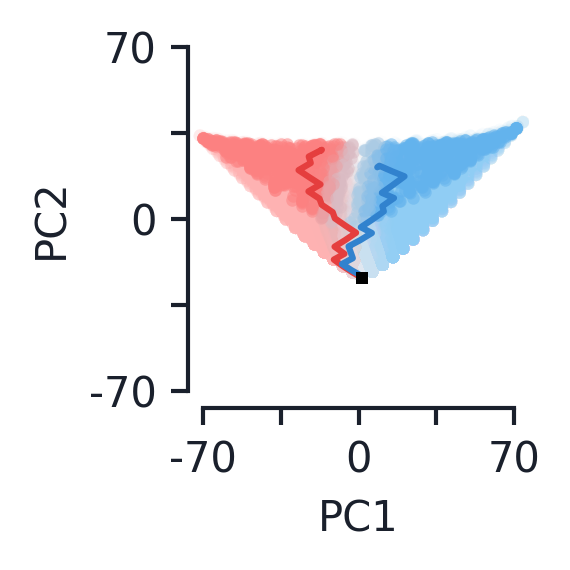

/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


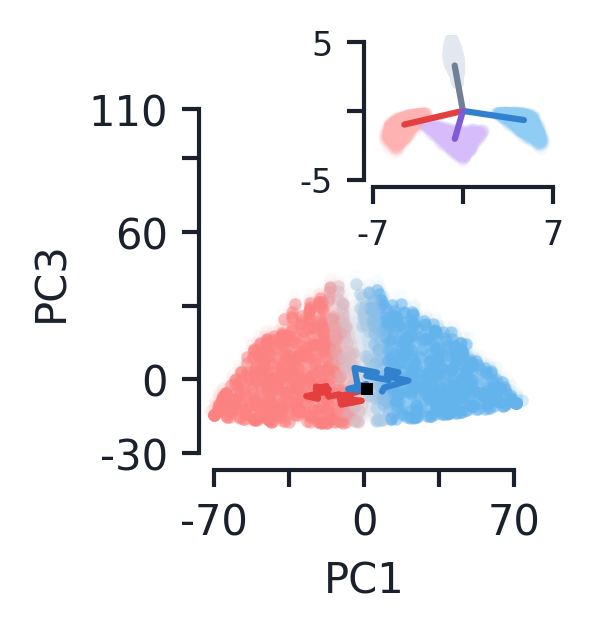

In [ ]:
color_type = 'labels' # 'labels', 'words', 'seq_idx'

fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2,2))

pcxs = (0, 0)
pcys = (1, 2)

c_vals_ld = (jetplot.colors.red.v4, jetplot.colors.blue.v4, jetplot.colors.green.v4,)

label_cmap_d = matplotlib.colors.LinearSegmentedColormap.from_list("", [
    c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], jetplot.colors.gray.v4, 
    c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1],
])

for ax, pcx, pcy in zip((ax1, ax2), pcxs, pcys):
    for batch_idx in range(hs.shape[0]):
        color_labels_ld = c_vals_ld[labels[batch_idx]]
        color_labels_l = c_vals_l[labels[batch_idx]]
        color_labels = c_vals[labels[batch_idx]]

        ax.scatter(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy], c=score_diffs_init[batch_idx],
                   linewidth=0.0, marker='.', zorder=0, alpha=0.05,
                   cmap=label_cmap, vmin=-max_score, vmax=max_score)
        ax.scatter(As_pca[batch_idx, -1, pcx], As_pca[batch_idx, -1, pcy], c=score_diffs_init[batch_idx, -1],
                   linewidth=0.0, marker='.', zorder=1, alpha=0.5,
                   cmap=label_cmap_d, vmin=-max_score, vmax=max_score)

    # for batch_idx in range(hs_spec.shape[0]):
    # for batch_idx in range(len(toy_params['words'])-1):
    #     ax.plot(As_spec_pca[batch_idx, :, pcx], As_spec_pca[batch_idx, :, pcy], 
    #             color=c_vals[batch_idx], marker='.', zorder=5)

    # Initial point (only uses first batch)
    ax.plot(As_pca[0, 0, pcx], As_pca[0, 0, pcy], marker='s',
            color='k', zorder=10, markersize=3)

    # if pcx == 0:
    #     ax.set_xlabel('Time dir.')
    # else:
    ax.set_xlabel('PC{}'.format(pcx+1))
    # if pcy == 0:
    #     ax.set_ylabel('Time dir.')
    # else:
    ax.set_ylabel('PC{}'.format(pcy+1))

    # Some sample paths
    for batch_idx in (12, 15):
        ax.plot(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy],
                color=c_vals[labels[batch_idx]], zorder=6)

iax2 = plt.axes([0,0,2,1])
iax2.set_axes_locator(InsetPosition(ax2, [0.5,0.75,0.6,0.4]))
# iax2.set_xlabel('$\Delta$PC{}'.format(pcx+1))
# iax2.set_ylabel('$\Delta$PC{}'.format(pcy+1))
for word_idx in range(4):
    if word_idx == 2: # Grey for neutral
        color_labels_l = jetplot.colors.gray.v3
        color_labels = jetplot.colors.gray.v6
    else:
        color_labels_l = c_vals_l[word_idx]
        color_labels = c_vals[word_idx]
    iax2.scatter(delta_As_pca[word_idx][:, pcx], delta_As_pca[word_idx][:, pcy], 
                 linewidth=0.0, marker='.', color=color_labels_l, 
                 zorder=0, alpha=0.05)
    iax2.plot((0, np.mean(delta_As_pca[word_idx][:, pcx], axis=0)),
              (0, np.mean(delta_As_pca[word_idx][:, pcy], axis=0)), 
              linewidth=1.5, color=color_labels, marker=None, 
              zorder=5, alpha=1.0)

iax2.set_xlim((-7, 7))
iax2.set_ylim((-5, 5))
iax2.set_xticks((-7, 0, 7))
iax2.set_yticks((-5, 0, 5))
iax2.set_xticklabels((-7, None, 7))
iax2.set_yticklabels((-5, None, 5))
iax2.spines["top"].set_visible(False)
iax2.spines["right"].set_visible(False)
# iax2.spines["bottom"].set_visible(False)
# iax2.spines["left"].set_visible(False)
for item in ([iax2.xaxis.label, iax2.yaxis.label] +
             iax2.get_xticklabels() + iax2.get_yticklabels()):
    item.set_fontsize(8)
jetplot.breathe(ax=iax2)

ax1.set_ylim((-70, 70))
ax1.set_yticks((-70, -35, 0, 35, 70))
ax1.set_yticklabels((-70, None, 0, None, 70))
ax2.set_ylim((-30, 110))
ax2.set_yticks((-30,  0, 30, 60, 90, 110))
ax2.set_yticklabels((-30, 0, None, 60, None, 110))
for ax in (ax1, ax2):
    ax.set_xlim((-70, 70))
    ax.set_xticks((-70, -35, 0, 35, 70))
    ax.set_xticklabels((-70, None, 0, None, 70))

for ax in (ax1, ax2):

    jetplot.breathe(ax=ax)

In [ ]:
word_proj = '<eos>' 
# word_proj = 'null'

h_word = HebbNet_word_proj(word_proj, As_fit, net_load, toy_params_load)
delta_As_word = []
for word_idx in range(len(delta_As)):
    delta_As_word.append(HebbNet_word_proj(word_proj, delta_As[word_idx], net_load, toy_params_load))

h_word_PCA = PCA(n_components=100)

h_word_PCA.fit(h_word.reshape((-1, h_word.shape[-1])))
h_word_pca = np.zeros(h_word.shape)

for batch_idx in range(As.shape[0]):
    h_word_pca[batch_idx] = h_word_PCA.transform(h_word[batch_idx])


ro_matrix_word_pca = h_word_PCA.transform(ro_matrix)
zero_matrix_pca = h_word_PCA.transform(np.zeros_like(ro_matrix))

delta_As_word_pca = []
for word_idx in range(len(delta_As)):
    delta_As_word_pca.append(np.matmul(delta_As_word[word_idx], h_word_PCA.components_.T))

# Adds zeros to score diff to account for initial state
if score_diffs.shape[1] < h_word_pca.shape[1]: 
    score_diffs = np.concatenate((np.zeros((score_diffs.shape[0], 1)), score_diffs), axis=1)

/usr/local/lib/python3.7/dist-packages/google/colab/_event_manager.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)


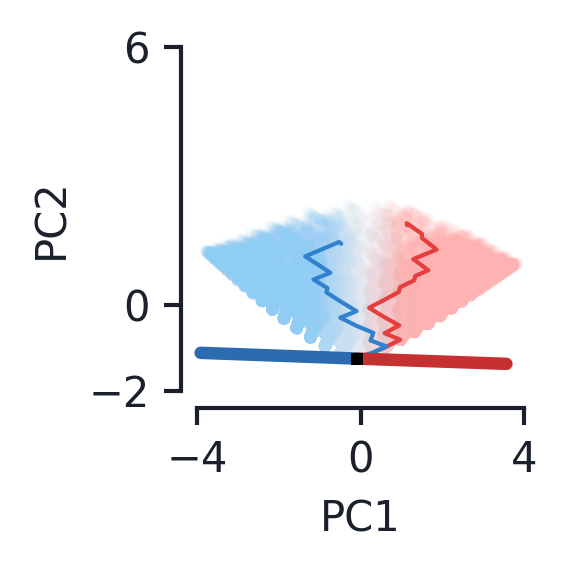

/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


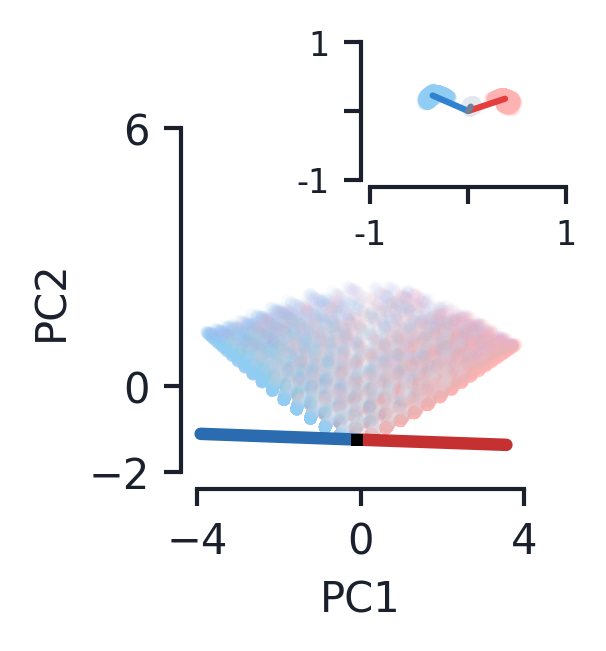

In [ ]:
import matplotlib.colors
from mpl_toolkits.axes_grid.inset_locator import (inset_axes, InsetPosition, mark_inset)

fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2,2))

pcx = 0
pcy = 1

phrase_len = hs.shape[1]

label_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", [
    c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], jetplot.colors.gray.v3, 
    c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1],
])
max_score = toy_params_load['phrase_length'] - 1

for batch_idx in range(h_word_pca.shape[0]):
    color_labels_l = c_vals_l[labels[batch_idx]]
    color_labels = c_vals[labels[batch_idx]]

    ax1.scatter(h_word_pca[batch_idx, :, pcx], h_word_pca[batch_idx, :, pcy], 
                c=score_diffs[batch_idx], linewidth=0.0,
                marker='.', zorder=0, alpha=0.05,
                cmap=label_cmap, vmin=-max_score, vmax=max_score)

word_colors_l = (c_vals_l[0], c_vals_l[1], jetplot.colors.gray.v3, c_vals_l[3],)
word_colors = (c_vals[0], c_vals[1], jetplot.colors.gray.v6, c_vals[3],)

for batch_idx in range(h_word_pca.shape[0]):
    color_labels_l = [word_colors_l[word_labels[batch_idx, seq_idx]] for seq_idx in range(toy_params_load['phrase_length'])]
    color_labels = word_colors[word_labels[batch_idx, -1]]
    # 1: so initial state is skipped, since it has no color associated with it
    ax2.scatter(h_word_pca[batch_idx, 1:, pcx], h_word_pca[batch_idx, 1:, pcy], linewidth=0.0,
                marker='.', color=color_labels_l, zorder=0, alpha=0.05)

for ro_idx in range(net_params['n_outputs']):
    ax1.plot([zero_matrix_pca[ro_idx, pcx], ro_matrix_word_pca[ro_idx, pcx]], 
            [zero_matrix_pca[ro_idx, pcy], ro_matrix_word_pca[ro_idx, pcy]],
                color=c_vals_dl[ro_idx], linewidth=3.0, zorder=10)
    ax2.plot([zero_matrix_pca[ro_idx, pcx], ro_matrix_word_pca[ro_idx, pcx]], 
            [zero_matrix_pca[ro_idx, pcy], ro_matrix_word_pca[ro_idx, pcy]],
                color=c_vals_dl[ro_idx], linewidth=3.0, zorder=10)

# Some sample paths
for batch_idx in (12, 15):
    ax1.plot(h_word_pca[batch_idx, :, pcx], h_word_pca[batch_idx, :, pcy],
            color=c_vals[labels[batch_idx]], zorder=1, linewidth=1.0)

iax2 = plt.axes([0,0,2,1])
iax2.set_axes_locator(InsetPosition(ax2, [0.5,0.8,0.6,0.4]))
# iax2.set_xlabel('$\Delta$PC{}'.format(pcx+1))
# iax2.set_ylabel('$\Delta$PC{}'.format(pcy+1))
for word_idx in range(3):
    if word_idx == 2: # Grey for neutral
        color_labels_l = jetplot.colors.gray.v3
        color_labels = jetplot.colors.gray.v6
    else:
        color_labels_l = c_vals_l[word_idx]
        color_labels = c_vals[word_idx]
    iax2.scatter(delta_As_word_pca[word_idx][:, pcx], delta_As_word_pca[word_idx][:, pcy], 
                 linewidth=0.0, marker='.', color=color_labels_l, 
                 zorder=0, alpha=0.05)
    iax2.plot((0, np.mean(delta_As_word_pca[word_idx][:, pcx], axis=0)),
              (0, np.mean(delta_As_word_pca[word_idx][:, pcy], axis=0)), 
              linewidth=1.5, color=color_labels, marker=None, 
              zorder=5, alpha=1.0)

iax2.set_xlim((-1, 1))
iax2.set_ylim((-1, 1))
iax2.set_xticks((-1, 0, 1))
iax2.set_yticks((-1, 0, 1))
iax2.set_xticklabels((-1, None, 1))
iax2.set_yticklabels((-1, None, 1))

# iax2 = plt.axes([0,0,2,1])
# iax2.set_axes_locator(InsetPosition(ax2, [0.7,0.8,0.4,0.4]))
# # iax2.set_xlabel('$\Delta$PC{}'.format(pcx+1))
# # iax2.set_ylabel('$\Delta$PC{}'.format(pcy+1))
# word_colors = [c_vals_l[0], c_vals_l[1], jetplot.colors.gray.v3, c_vals_l[3]]  # Grey for neutral
# iax2.bar((0,1,2,3), mean_word_aligns, color=word_colors)

# iax2.set_xlim((-1, 4))
# iax2.set_xticks([])
# iax2.set_ylim((0, 1))
# iax2.set_yticks((0, 1))
# iax2.set_ylabel('RO align')
              
iax2.spines["top"].set_visible(False)
iax2.spines["right"].set_visible(False)
# iax2.spines["bottom"].set_visible(False)
# iax2.spines["left"].set_visible(False)
for item in ([iax2.xaxis.label, iax2.yaxis.label] +
             iax2.get_xticklabels() + iax2.get_yticklabels()):
    item.set_fontsize(8)
jetplot.breathe(ax=iax2)

for ax in (ax1, ax2):
    
    # Initial point (only uses first batch)
    ax.plot(h_word_pca[0, 0, pcx], h_word_pca[0, 0, pcy], marker='s',
            color='k', zorder=10, markersize=3)

    ax.set_xlabel('PC{}'.format(pcx+1))
    ax.set_ylabel('PC{}'.format(pcy+1))
    ax.set_xlim((-4, 4))
    ax.set_ylim((-2, 6))
    ax.set_xticks((-4, 0, 4))
    ax.set_yticks((-2, 0, 6))

    jetplot.breathe(ax=ax)

GRU plots for supplement. Again uses network for investigating flow under gradually longer phrases. 

In [ ]:
load_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/lambdasMinIt_'

gru_load = ['GRU[50,100,2]_train=seq_inf_task=int_2class_20len',]

trial_idx = 1
init_seed = 1001

turn_off_noise = True
test_set_size = 1000

# Loads network
load_root = load_root_start+str('gru').replace('.', '')+'_'
load_path = load_root + gru_load[0]
net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)

if turn_off_noise:
    print('Turning off noise for test set.')
    net_noise_type = net_load.noiseType
    net_load.noiseType = None

testData, testOutputMask, _ = syn.generate_data(
    test_set_size, toy_params_load, net_params_load['n_outputs'],
    raw_data=False, device=torch.device('cpu'), verbose=False)

db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)

print('Accuracy: {:.3f}'.format(db_load['acc']))

labels = np.array(testData[:,:,:][1][:, -1, 0].cpu())

# Generates labels for each word in input sequences 
word_to_input_vector_mat = np.zeros((len(toy_params_load['words']), net_params_load['n_inputs'],))
for word_idx, word in enumerate(toy_params_load['words']):
    word_to_input_vector_mat[word_idx] = toy_params_load['word_to_input_vector'][word]
word_labels = np.argmax(np.matmul(testData.tensors[0].cpu().numpy(), word_to_input_vector_mat.T), axis=-1)

hs = db_load['h'].detach().numpy()
print('Hidden states shape', hs.shape)
ro_matrix = np.array(net_load.w2.detach().cpu())
print('RO shape', ro_matrix.shape)

# Restores noise if it has been turned off
if turn_off_noise:
    net_load.noiseType = net_noise_type

delta_hs = get_word_deflections(net_load, db_load, word_labels, toy_params_load, net_params_load)

Turning off noise for test set.
Accuracy: 0.999
Hidden states shape (1000, 20, 100)
RO shape (2, 100)
  Word 'evid0' count: 6429
  Word 'evid1' count: 6492
  Word 'null' count: 6079
  Word '<eos>' count: 1000
  Word 'evid0' theory acc: h nan
  Word 'evid1' theory acc: h nan
  Word 'null' theory acc: h nan
  Word '<eos>' theory acc: h nan
Outputing for RNNs


/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [ ]:
n_components = 100
hidden_PCA = PCA(n_components=n_components)

hs_fit = hs

# Adds initial hidden state to h
h0 = net_load.h0.cpu().numpy()
h0_batch = np.repeat(h0[np.newaxis, np.newaxis, :], hs_fit.shape[0], axis=0)
hs_fit = np.concatenate((h0_batch, hs_fit), axis=1)

# Gets running score from the sequence
running_score = get_running_scores(word_labels, toy_params_load)
# Adds extra row of zeros for h0
running_score = np.concatenate((
    np.zeros((running_score.shape[0], 1, running_score.shape[-1],)), running_score
), axis=1)
score_diffs = running_score[:, :, 1] - running_score[:, :, 0]

hidden_PCA.fit(hs_fit.reshape((-1, hs_fit.shape[-1])))

hs_pca = np.zeros((hs_fit.shape[0], hs_fit.shape[1], n_components,))

for batch_idx in range(hs_fit.shape[0]):
    hs_pca[batch_idx] = hidden_PCA.transform(hs_fit[batch_idx])

zero_matrix_pca = hidden_PCA.transform(np.zeros_like(ro_matrix))
ro_matrix_pca = hidden_PCA.transform(ro_matrix)

delta_hs_pca = []

for word_idx in range(len(delta_hs)):
    delta_hs_pca.append(np.matmul(delta_hs[word_idx], hidden_PCA.components_.T))
    # delta_hs_pca.append(hidden_PCA.transform(delta_hs[word_idx]))

print('PCA shape:', hs_pca.shape)
print('Variances:', ['{:.2f}'.format(var) for var in hidden_PCA.explained_variance_[:10]])
print('PR: {:.2f}'.format(
    participation_ratio_vector(hidden_PCA.explained_variance_)))

PCA shape: (1000, 21, 100)
Variances: ['8.03', '0.04', '0.03', '0.03', '0.01', '0.00', '0.00', '0.00', '0.00', '0.00']
PR: 1.03


/usr/local/lib/python3.7/dist-packages/google/colab/_event_manager.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)


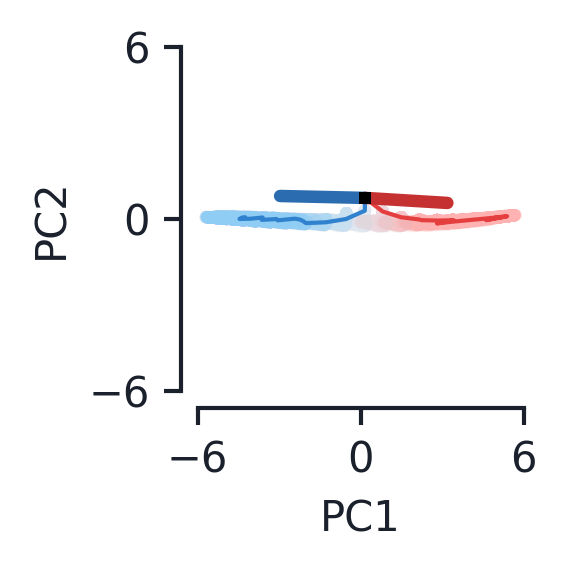

/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


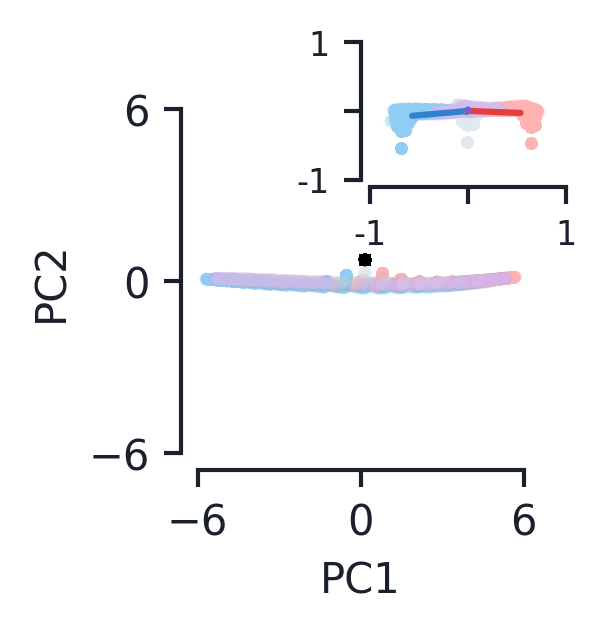

In [ ]:
import matplotlib.colors
from mpl_toolkits.axes_grid.inset_locator import (inset_axes, InsetPosition, mark_inset)

fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2,2))

pcx = 0
pcy = 1

label_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", [
    c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], jetplot.colors.gray.v3, 
    c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1],
])
max_score = toy_params_load['phrase_length'] - 1

for batch_idx in range(hs.shape[0]):
    color_labels_l = c_vals_l[labels[batch_idx]]
    color_labels = c_vals[labels[batch_idx]]

    ax1.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], 
                c=score_diffs[batch_idx], linewidth=0.0,
                marker='.', zorder=0, alpha=0.05,
                cmap=label_cmap, vmin=-max_score, vmax=max_score)

word_colors_l = (c_vals_l[0], c_vals_l[1], jetplot.colors.gray.v3, c_vals_l[3],)
word_colors = (c_vals[0], c_vals[1], jetplot.colors.gray.v6, c_vals[3],)

for batch_idx in range(hs.shape[0]):
    color_labels_l = [word_colors_l[word_labels[batch_idx, seq_idx]] for seq_idx in range(toy_params_load['phrase_length'])]
    color_labels_l.insert(0, 'black') # initial hidden state
    color_labels = word_colors[word_labels[batch_idx, -1]]
    
    ax2.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], linewidth=0.0,
                marker='.', color=color_labels_l, zorder=0, alpha=0.05)
    # Makes EoS a little darker
    ax2.scatter(hs_pca[batch_idx, -1, pcx], hs_pca[batch_idx, -1, pcy], linewidth=0.0,
                marker='.', color=color_labels_l[-1], zorder=1, alpha=0.05)

for ro_idx in range(net_params['n_outputs']):
    ax1.plot([zero_matrix_pca[ro_idx, pcx], ro_matrix_pca[ro_idx, pcx]], 
            [zero_matrix_pca[ro_idx, pcy], ro_matrix_pca[ro_idx, pcy]],
                color=c_vals_dl[ro_idx], linewidth=3.0, zorder=10)

# Some sample paths
for batch_idx in (0, 2):
    ax1.plot(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy],
            color=c_vals[labels[batch_idx]], zorder=1, linewidth=1.0)

iax2 = plt.axes([0,0,2,1])
iax2.set_axes_locator(InsetPosition(ax2, [0.5,0.75,0.6,0.4]))
# iax2.set_xlabel('$\Delta$PC{}'.format(pcx+1))
# iax2.set_ylabel('$\Delta$PC{}'.format(pcy+1))
for word_idx in range(4):
    if word_idx == 2: # Grey for neutral
        color_labels_l = jetplot.colors.gray.v3
        color_labels = jetplot.colors.gray.v6
    else:
        color_labels_l = c_vals_l[word_idx]
        color_labels = c_vals[word_idx]
    iax2.scatter(delta_hs_pca[word_idx][:, pcx], delta_hs_pca[word_idx][:, pcy], 
                 linewidth=0.0, marker='.', color=color_labels_l, 
                 zorder=0, alpha=0.05)
    iax2.plot((0, np.mean(delta_hs_pca[word_idx][:, pcx], axis=0)),
              (0, np.mean(delta_hs_pca[word_idx][:, pcy], axis=0)), 
              linewidth=1.5, color=color_labels, marker=None, 
              zorder=5, alpha=1.0)

iax2.set_xlim((-1, 1))
iax2.set_ylim((-1, 1))
iax2.set_xticks((-1, 0, 1))
iax2.set_yticks((-1, 0, 1))
iax2.set_xticklabels((-1, None, 1))
iax2.set_yticklabels((-1, None, 1))
iax2.spines["top"].set_visible(False)
iax2.spines["right"].set_visible(False)
# iax2.spines["bottom"].set_visible(False)
# iax2.spines["left"].set_visible(False)
for item in ([iax2.xaxis.label, iax2.yaxis.label] +
             iax2.get_xticklabels() + iax2.get_yticklabels()):
    item.set_fontsize(8)
jetplot.breathe(ax=iax2)

for ax in (ax1, ax2):
    # Initial hidden (only well-defined for RNNs)
    ax.plot(hs_pca[0, 0, pcx], hs_pca[0, 0, pcy], marker='s',
            color='k', zorder=10, markersize=3)
    
    ax.set_xlabel('PC{}'.format(pcx+1))
    ax.set_ylabel('PC{}'.format(pcy+1))
    ax.set_xlim((-6, 6))
    ax.set_ylim((-6, 6))
    ax.set_xticks((-6, 0, 6))
    ax.set_yticks((-6, 0, 6))

    jetplot.breathe(ax=ax)

Dynamics of additive STPN for supplement. Was trained under same longer phrases setting as above

In [ ]:
load_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/lambdasMinIt_'

STPN_load = ['HebbNet[50,100,2]_train=seq_inf_task=int_2class_20len',]

trial_idx = 4
init_seed = 1001

turn_off_noise = True
test_set_size = 1000

# Loads network
load_root = load_root_start+str('0.95').replace('.', '')+'_'
load_path = load_root + STPN_load[0]
net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)

if turn_off_noise:
    print('Turning off noise for test set.')
    net_noise_type = net_load.noiseType
    net_load.noiseType = None

testData, testOutputMask, _ = syn.generate_data(
    test_set_size, toy_params_load, net_params_load['n_outputs'],
    raw_data=False, device=torch.device('cpu'), verbose=False)

db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)

print('Accuracy: {:.3f}'.format(db_load['acc']))

labels = np.array(testData[:,:,:][1][:, -1, 0].cpu())

# Generates labels for each word in input sequences 
word_to_input_vector_mat = np.zeros((len(toy_params_load['words']), net_params_load['n_inputs'],))
for word_idx, word in enumerate(toy_params_load['words']):
    word_to_input_vector_mat[word_idx] = toy_params_load['word_to_input_vector'][word]
word_labels = np.argmax(np.matmul(testData.tensors[0].cpu().numpy(), word_to_input_vector_mat.T), axis=-1)

# Gets running score from the sequence
running_score = get_running_scores(word_labels, toy_params_load)
score_diffs = running_score[:, :, 1] - running_score[:, :, 0]

hs = db_load['h'].detach().numpy()
print('Hidden states shape', hs.shape)
ro_matrix = np.array(net_load.w2.detach().cpu())
print('RO shape', ro_matrix.shape)

# Gets alignment of individual clusters with ROs
hs_flat = hs.reshape((-1, hs.shape[-1]))
word_labels_flat = word_labels.flatten()
word_hs = []
mean_word_aligns = []

for word_idx in range(len(toy_params_load['words'])):
    word_hs.append(hs_flat[word_idx == word_labels_flat])
    # print(word_hs[-1].shape)

    word_PCA = PCA()
    word_PCA.fit(word_hs[-1])

    word_aligns = []
    for ro_idx in range(ro_matrix.shape[0]):
        min_angle = np.min((get_align_angle(word_PCA.components_[0], ro_matrix[ro_idx]),
                            get_align_angle(-1*word_PCA.components_[0], ro_matrix[ro_idx])))
        word_aligns.append(np.cos(np.pi/180*min_angle))
        # print('Word {} RO {} - angle: {:.2f}'.format(
        #     toy_params_load['words'][word_idx], ro_idx, np.cos(np.pi/180*min_angle)
        # ))
    mean_word_aligns.append(np.mean(word_aligns))

# Restores noise if it has been turned off
if turn_off_noise:
    net_load.noiseType = net_noise_type

delta_hs, delta_As = get_word_deflections(net_load, db_load, word_labels, toy_params_load, net_params_load)

Streaming output truncated to the last 5000 lines.
Skipping calculation of theory for additive.
Skipping calculation of theory for additive.
Skipping calculation of theory for additive.
Skipping calculation of theory for additive.
Skipping calculation of theory for additive.
Skipping calculation of theory for additive.
Skipping calculation of theory for additive.
Skipping calculation of theory for additive.
Skipping calculation of theory for additive.
Skipping calculation of theory for additive.
Skipping calculation of theory for additive.
Skipping calculation of theory for additive.
Skipping calculation of theory for additive.
Skipping calculation of theory for additive.
Skipping calculation of theory for additive.
Skipping calculation of theory for additive.
Skipping calculation of theory for additive.
Skipping calculation of theory for additive.
Skipping calculation of theory for additive.
Skipping calculation of theory for additive.
Skipping calculation of theory for additive.
Skip

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [ ]:
n_components = 100
hidden_PCA = PCA(n_components=n_components)

hs_fit = hs

hidden_PCA.fit(hs_fit.reshape((-1, hs_fit.shape[-1])))

hs_pca = np.zeros((hs_fit.shape[0], hs_fit.shape[1], n_components,))

for batch_idx in range(hs_fit.shape[0]):
    hs_pca[batch_idx] = hidden_PCA.transform(hs_fit[batch_idx])

zero_matrix_pca = hidden_PCA.transform(np.zeros_like(ro_matrix))
ro_matrix_pca = hidden_PCA.transform(ro_matrix)

delta_hs_pca = []

for word_idx in range(len(delta_hs)):
    delta_hs_pca.append(np.matmul(delta_hs[word_idx], hidden_PCA.components_.T))
    # delta_hs_pca.append(hidden_PCA.transform(delta_hs[word_idx]))

print('PCA shape:', hs_pca.shape)
print('Variances:', ['{:.2f}'.format(var) for var in hidden_PCA.explained_variance_[:10]])
print('PR: {:.2f}'.format(
    participation_ratio_vector(hidden_PCA.explained_variance_)))

PCA shape: (1000, 20, 100)
Variances: ['9.74', '1.20', '0.49', '0.03', '0.02', '0.01', '0.00', '0.00', '0.00', '0.00']
PR: 1.37


/usr/local/lib/python3.7/dist-packages/google/colab/_event_manager.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)


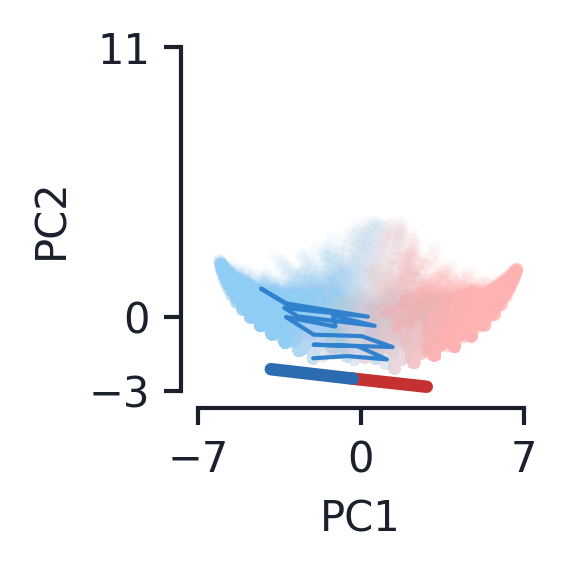

/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


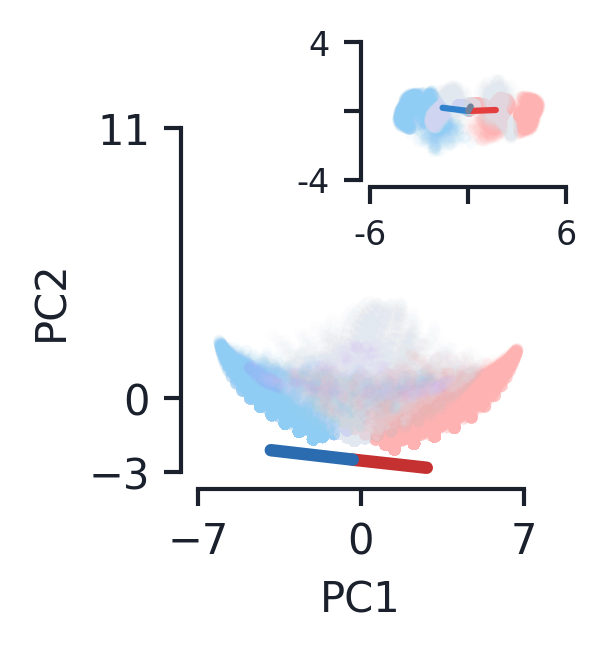

In [ ]:
import matplotlib.colors
from mpl_toolkits.axes_grid.inset_locator import (inset_axes, InsetPosition, mark_inset)

fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2,2))

pcx = 0
pcy = 1

phrase_len = hs.shape[1]

label_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", [
    c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], jetplot.colors.gray.v3, 
    c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1],
])
max_score = toy_params['phrase_length'] - 1

for batch_idx in range(hs.shape[0]):
    color_labels_l = c_vals_l[labels[batch_idx]]
    color_labels = c_vals[labels[batch_idx]]

    ax1.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], 
                c=score_diffs[batch_idx], linewidth=0.0,
                marker='.', zorder=0, alpha=0.05,
                cmap=label_cmap, vmin=-max_score, vmax=max_score)

word_colors_l = (c_vals_l[0], c_vals_l[1], jetplot.colors.gray.v3, c_vals_l[3],)
word_colors = (c_vals[0], c_vals[1], jetplot.colors.gray.v6, c_vals[3],)

for batch_idx in range(hs.shape[0]):
    color_labels_l = [word_colors_l[word_labels[batch_idx, seq_idx]] for seq_idx in range(phrase_len)]
    color_labels = word_colors[word_labels[batch_idx, -1]]

    ax2.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], linewidth=0.0,
                marker='.', color=color_labels_l, zorder=0, alpha=0.05)

for ro_idx in range(net_params['n_outputs']):
    ax1.plot([zero_matrix_pca[ro_idx, pcx], ro_matrix_pca[ro_idx, pcx]], 
            [zero_matrix_pca[ro_idx, pcy], ro_matrix_pca[ro_idx, pcy]],
                color=c_vals_dl[ro_idx], linewidth=3.0, zorder=10)
    ax2.plot([zero_matrix_pca[ro_idx, pcx], ro_matrix_pca[ro_idx, pcx]], 
            [zero_matrix_pca[ro_idx, pcy], ro_matrix_pca[ro_idx, pcy]],
                color=c_vals_dl[ro_idx], linewidth=3.0, zorder=10)

# Some sample paths
for batch_idx in (10,):
    ax1.plot(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy],
            color=c_vals[labels[batch_idx]], zorder=1, linewidth=1.0)

iax2 = plt.axes([0,0,2,1])
iax2.set_axes_locator(InsetPosition(ax2, [0.5,0.8,0.6,0.4]))
# iax2.set_xlabel('$\Delta$PC{}'.format(pcx+1))
# iax2.set_ylabel('$\Delta$PC{}'.format(pcy+1))
for word_idx in range(3):
    if word_idx == 2: # Grey for neutral
        color_labels_l = jetplot.colors.gray.v3
        color_labels = jetplot.colors.gray.v6
    else:
        color_labels_l = c_vals_l[word_idx]
        color_labels = c_vals[word_idx]
    iax2.scatter(delta_hs_pca[word_idx][:, pcx], delta_hs_pca[word_idx][:, pcy], 
                 linewidth=0.0, marker='.', color=color_labels_l, 
                 zorder=0, alpha=0.05)
    iax2.plot((0, np.mean(delta_hs_pca[word_idx][:, pcx], axis=0)),
              (0, np.mean(delta_hs_pca[word_idx][:, pcy], axis=0)), 
              linewidth=1.5, color=color_labels, marker=None, 
              zorder=5, alpha=1.0)

iax2.set_xlim((-6, 6))
iax2.set_ylim((-4, 4))
iax2.set_xticks((-6, 0, 6))
iax2.set_yticks((-4, 0, 4))
iax2.set_xticklabels((-6, None, 6))
iax2.set_yticklabels((-4, None, 4))

# iax2 = plt.axes([0,0,2,1])
# iax2.set_axes_locator(InsetPosition(ax2, [0.7,0.8,0.4,0.4]))
# # iax2.set_xlabel('$\Delta$PC{}'.format(pcx+1))
# # iax2.set_ylabel('$\Delta$PC{}'.format(pcy+1))
# word_colors = [c_vals_l[0], c_vals_l[1], jetplot.colors.gray.v3, c_vals_l[3]]  # Grey for neutral
# iax2.bar((0,1,2,3), mean_word_aligns, color=word_colors)

# iax2.set_xlim((-1, 4))
# iax2.set_xticks([])
# iax2.set_ylim((0, 1))
# iax2.set_yticks((0, 1))
# iax2.set_ylabel('RO align')
              
iax2.spines["top"].set_visible(False)
iax2.spines["right"].set_visible(False)
# iax2.spines["bottom"].set_visible(False)
# iax2.spines["left"].set_visible(False)
for item in ([iax2.xaxis.label, iax2.yaxis.label] +
             iax2.get_xticklabels() + iax2.get_yticklabels()):
    item.set_fontsize(8)
jetplot.breathe(ax=iax2)

for ax in (ax1, ax2):
    
    ax.set_xlabel('PC{}'.format(pcx+1))
    ax.set_ylabel('PC{}'.format(pcy+1))
    ax.set_xlim((-7, 7))
    ax.set_ylim((-3, 11))
    ax.set_xticks((-7, 0, 7))
    ax.set_yticks((-3, 0, 11))

    jetplot.breathe(ax=ax)

In [ ]:
# Flatten matrix dimensions (but not batch and seq)
projection_type = 'PCA' # 'PCA', 'time_PCA'
pc_comps = 200

As = db_load['A'].cpu().numpy()

# Adds A0 as initial state for all sequences
A0 = net_load.A0.cpu().numpy()
A0_batch = np.repeat(A0[np.newaxis, np.newaxis, :, :], As.shape[0], axis=0)
As = np.concatenate((A0_batch, As), axis=1)
As_fit = As

if running_score.shape[1] < As_fit.shape[1]:
    running_score_init = np.concatenate((
        np.zeros((running_score.shape[0], 1, running_score.shape[-1],)), running_score
    ), axis=1)
    score_diffs_init = running_score_init[:, :, 1] - running_score_init[:, :, 0]

As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))
A_diffs = As_flat[:, 1:, :] - As_flat[:, :-1, :] # note, already flattened

if projection_type == 'PCA':
    a_PCA = PCA(n_components=pc_comps)

    a_PCA.fit(As_flat.reshape((-1, As_flat.shape[-1])))
    
    # # Fit to one subset, but plot the other
    # As_fit = As[:, epoch_idxs[2]:toy_params['phrase_length']-1, :, :]
    # As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))

    As_pca = np.zeros((As_flat.shape[0], As_flat.shape[1], pc_comps))
    A_diffs_pca = np.zeros((A_diffs.shape[0], A_diffs.shape[1], pc_comps))
    # A_diffs_pca = np.zeros((As_flat.shape[0], As_flat.shape[1]-1, pc_comps))
    A_zeros = np.zeros_like(As_flat[0, 0:1, :])
    for batch_idx in range(As.shape[0]):
        As_pca[batch_idx] = a_PCA.transform(As_flat[batch_idx])
        A_diffs_pca[batch_idx] = np.matmul(A_diffs[batch_idx], a_PCA.components_.T)
        # A_diffs_ca
    A_zeros_pca = a_PCA.transform(A_zeros)

    # if toy_params['data_type'] == 'int':
    #     As_spec = np.copy(db_special['A'])
    #     As_spec_flat = As_spec.reshape((As_spec.shape[0], As_spec.shape[1], As_spec.shape[2]*As_spec.shape[3]))
    #     As_spec_pca = np.zeros((As_spec_flat.shape[0], As_spec_flat.shape[1], pc_comps))
    #     for batch_idx in range(hs_spec.shape[0]):
    #         As_spec_pca[batch_idx] = a_PCA.transform(As_spec_flat[batch_idx])

    delta_As_pca = []
    for word_idx in range(len(delta_As)):
        delta_As_pca.append(np.matmul(np.reshape(delta_As[word_idx], (delta_As[word_idx].shape[0], -1)), 
                                      a_PCA.components_.T))
elif projection_type == 'time_PCA':
    As_pca, proj_matrix, center_vector = timeAndPCAProject(As_flat, pc_comps=pc_comps)

    delta_As_pca = []
    for word_idx in range(len(delta_As)):
        delta_As_pca.append(np.matmul(np.reshape(delta_As[word_idx], (delta_As[word_idx].shape[0], -1)), 
                                      proj_matrix.T))

print('PCA shape:', As_pca.shape)
print('Variances:', ['{:.2f}'.format(var) for var in a_PCA.explained_variance_[:10]])
print('PR: {:.2f}'.format(
    participation_ratio_vector(a_PCA.explained_variance_)))

PCA shape: (1000, 21, 200)
Variances: ['12.69', '2.95', '2.26', '0.46', '0.22', '0.12', '0.10', '0.07', '0.05', '0.03']
PR: 2.07


/usr/local/lib/python3.7/dist-packages/google/colab/_event_manager.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)


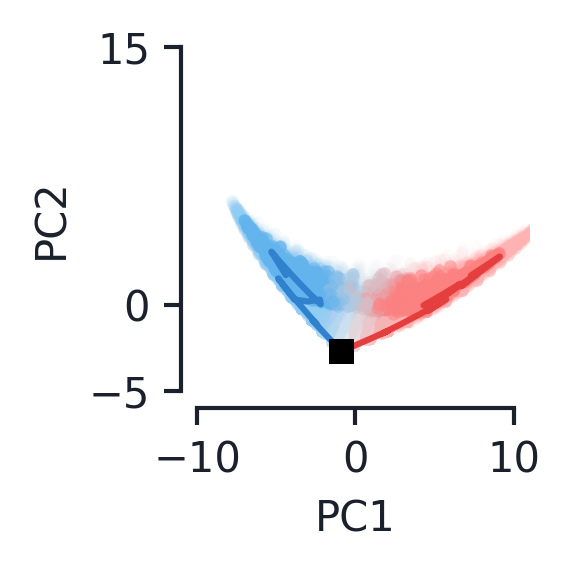

/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


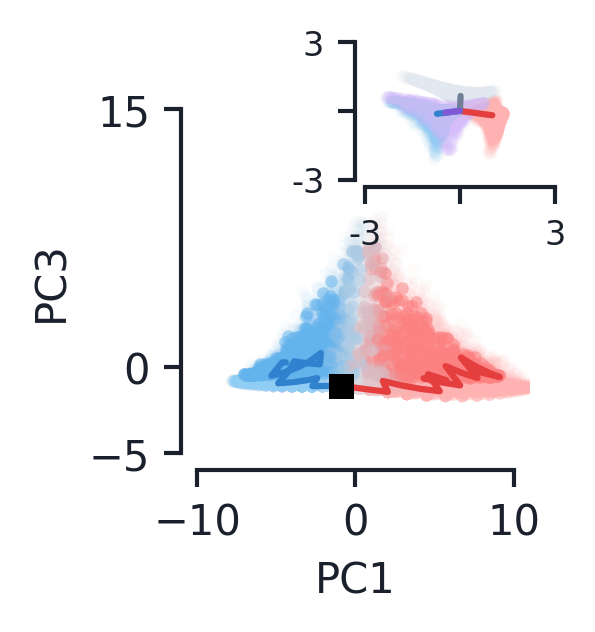

In [ ]:
color_type = 'labels' # 'labels', 'words', 'seq_idx'

fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2,2))

pcxs = (0, 0)
pcys = (1, 2)

c_vals_ld = (jetplot.colors.red.v4, jetplot.colors.blue.v4, jetplot.colors.green.v4,)

label_cmap_d = matplotlib.colors.LinearSegmentedColormap.from_list("", [
    c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], jetplot.colors.gray.v4, 
    c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1],
])

for ax, pcx, pcy in zip((ax1, ax2), pcxs, pcys):
    for batch_idx in range(hs.shape[0]):
        color_labels_ld = c_vals_ld[labels[batch_idx]]
        color_labels_l = c_vals_l[labels[batch_idx]]
        color_labels = c_vals[labels[batch_idx]]

        ax.scatter(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy], c=score_diffs_init[batch_idx],
                   linewidth=0.0, marker='.', zorder=0, alpha=0.05,
                   cmap=label_cmap, vmin=-max_score, vmax=max_score)
        ax.scatter(As_pca[batch_idx, -1, pcx], As_pca[batch_idx, -1, pcy], c=score_diffs_init[batch_idx, -1],
                   linewidth=0.0, marker='.', zorder=1, alpha=0.5,
                   cmap=label_cmap_d, vmin=-max_score, vmax=max_score)

    # for batch_idx in range(hs_spec.shape[0]):
    # for batch_idx in range(len(toy_params['words'])-1):
    #     ax.plot(As_spec_pca[batch_idx, :, pcx], As_spec_pca[batch_idx, :, pcy], 
    #             color=c_vals[batch_idx], marker='.', zorder=5)

    # Initial point (only uses first batch)
    ax.plot(As_pca[0, 0, pcx], As_pca[0, 0, pcy], marker='s',
            color='k', zorder=10)

    # if pcx == 0:
    #     ax.set_xlabel('Time dir.')
    # else:
    ax.set_xlabel('PC{}'.format(pcx+1))
    # if pcy == 0:
    #     ax.set_ylabel('Time dir.')
    # else:
    ax.set_ylabel('PC{}'.format(pcy+1))

    # Some sample paths
    for batch_idx in (12, 15):
        ax.plot(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy],
                color=c_vals[labels[batch_idx]], zorder=6)

iax2 = plt.axes([0,0,2,1])
iax2.set_axes_locator(InsetPosition(ax2, [0.5,0.75,0.6,0.4]))
# iax2.set_xlabel('$\Delta$PC{}'.format(pcx+1))
# iax2.set_ylabel('$\Delta$PC{}'.format(pcy+1))
for word_idx in range(4):
    if word_idx == 2: # Grey for neutral
        color_labels_l = jetplot.colors.gray.v3
        color_labels = jetplot.colors.gray.v6
    else:
        color_labels_l = c_vals_l[word_idx]
        color_labels = c_vals[word_idx]
    iax2.scatter(delta_As_pca[word_idx][:, pcx], delta_As_pca[word_idx][:, pcy], 
                 linewidth=0.0, marker='.', color=color_labels_l, 
                 zorder=0, alpha=0.05)
    iax2.plot((0, np.mean(delta_As_pca[word_idx][:, pcx], axis=0)),
              (0, np.mean(delta_As_pca[word_idx][:, pcy], axis=0)), 
              linewidth=1.5, color=color_labels, marker=None, 
              zorder=5, alpha=1.0)

iax2.set_xlim((-3, 3))
iax2.set_ylim((-3, 3))
iax2.set_xticks((-3, 0, 3))
iax2.set_yticks((-3, 0, 3))
iax2.set_xticklabels((-3, None, 3))
iax2.set_yticklabels((-3, None, 3))
iax2.spines["top"].set_visible(False)
iax2.spines["right"].set_visible(False)
# iax2.spines["bottom"].set_visible(False)
# iax2.spines["left"].set_visible(False)
for item in ([iax2.xaxis.label, iax2.yaxis.label] +
             iax2.get_xticklabels() + iax2.get_yticklabels()):
    item.set_fontsize(8)
jetplot.breathe(ax=iax2)

ax1.set_ylim((-5, 15))
ax1.set_yticks((-5, 0, 15,))
# ax1.set_yticklabels((-10, 0, None, 20))
ax2.set_ylim((-5, 15))
ax2.set_yticks((-5, 0, 15,))
# ax2.set_yticklabels((-10, 0, None, 20))
for ax in (ax1, ax2):
    ax.set_xlim((-10, 10))
    ax.set_xticks((-10, 0, 10,))
    # ax.set_xticklabels((-70, None, 0, None, 70))

for ax in (ax1, ax2):

    jetplot.breathe(ax=ax)

Multiplicative, but with ReLU activation

In [ ]:
load_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/lambdasMinIt_relu_'

STPN_load = ['HebbNet_M[50,100,2]_train=seq_inf_task=int_2class_20len',]

trial_idx = 0
init_seed = 1001

turn_off_noise = True
test_set_size = 1000

# Loads network
load_root = load_root_start+str('0.95').replace('.', '')+'_'
load_path = load_root + STPN_load[0]
net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)

if turn_off_noise:
    print('Turning off noise for test set.')
    net_noise_type = net_load.noiseType
    net_load.noiseType = None

testData, testOutputMask, _ = syn.generate_data(
    test_set_size, toy_params_load, net_params_load['n_outputs'],
    raw_data=False, device=torch.device('cpu'), verbose=False)

db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)

print('Accuracy: {:.3f}'.format(db_load['acc']))

labels = np.array(testData[:,:,:][1][:, -1, 0].cpu())

# Generates labels for each word in input sequences 
word_to_input_vector_mat = np.zeros((len(toy_params_load['words']), net_params_load['n_inputs'],))
for word_idx, word in enumerate(toy_params_load['words']):
    word_to_input_vector_mat[word_idx] = toy_params_load['word_to_input_vector'][word]
word_labels = np.argmax(np.matmul(testData.tensors[0].cpu().numpy(), word_to_input_vector_mat.T), axis=-1)

# Gets running score from the sequence
running_score = get_running_scores(word_labels, toy_params_load)
score_diffs = running_score[:, :, 1] - running_score[:, :, 0]

hs = db_load['h'].detach().numpy()
print('Hidden states shape', hs.shape)
ro_matrix = np.array(net_load.w2.detach().cpu())
print('RO shape', ro_matrix.shape)

# Gets alignment of individual clusters with ROs
hs_flat = hs.reshape((-1, hs.shape[-1]))
word_labels_flat = word_labels.flatten()
word_hs = []
mean_word_aligns = []

for word_idx in range(len(toy_params_load['words'])):
    word_hs.append(hs_flat[word_idx == word_labels_flat])
    # print(word_hs[-1].shape)

    word_PCA = PCA()
    word_PCA.fit(word_hs[-1])

    word_aligns = []
    for ro_idx in range(ro_matrix.shape[0]):
        min_angle = np.min((get_align_angle(word_PCA.components_[0], ro_matrix[ro_idx]),
                            get_align_angle(-1*word_PCA.components_[0], ro_matrix[ro_idx])))
        word_aligns.append(np.cos(np.pi/180*min_angle))
        # print('Word {} RO {} - angle: {:.2f}'.format(
        #     toy_params_load['words'][word_idx], ro_idx, np.cos(np.pi/180*min_angle)
        # ))
    mean_word_aligns.append(np.mean(word_aligns))

# Restores noise if it has been turned off
if turn_off_noise:
    net_load.noiseType = net_noise_type

delta_hs, delta_As, delta_hs_theory, delta_hs_theory_seq, delta_As_theory, delta_As_theory_seq = get_word_deflections(net_load, db_load, word_labels, toy_params_load, net_params_load)

Turning off noise for test set.
Accuracy: 0.995
Hidden states shape (1000, 20, 100)
RO shape (2, 100)
  Word 'evid0' count: 6242
  Word 'evid1' count: 5972
  Word 'null' count: 5786
  Word '<eos>' count: 1000
  Word 'evid0' theory acc: h 0.413 // A 0.148 // dA 2.949
  Word 'evid1' theory acc: h 0.450 // A 0.167 // dA 2.957
  Word 'null' theory acc: h 0.332 // A 0.078 // dA 1.994
  Word '<eos>' theory acc: h 0.382 // A 0.171 // dA 1.215
Outputing for HebbNet_M


In [ ]:
n_components = 100
hidden_PCA = PCA(n_components=n_components)

hs_fit = hs

hidden_PCA.fit(hs_fit.reshape((-1, hs_fit.shape[-1])))

hs_pca = np.zeros((hs_fit.shape[0], hs_fit.shape[1], n_components,))

for batch_idx in range(hs_fit.shape[0]):
    hs_pca[batch_idx] = hidden_PCA.transform(hs_fit[batch_idx])

zero_matrix_pca = hidden_PCA.transform(np.zeros_like(ro_matrix))
ro_matrix_pca = hidden_PCA.transform(ro_matrix)

delta_hs_pca = []

for word_idx in range(len(delta_hs)):
    delta_hs_pca.append(np.matmul(delta_hs[word_idx], hidden_PCA.components_.T))
    # delta_hs_pca.append(hidden_PCA.transform(delta_hs[word_idx]))

print('PCA shape:', hs_pca.shape)
print('Variances:', ['{:.2f}'.format(var) for var in hidden_PCA.explained_variance_[:10]])
print('PR: {:.2f}'.format(
    participation_ratio_vector(hidden_PCA.explained_variance_)))

PCA shape: (1000, 20, 100)
Variances: ['0.96', '0.75', '0.14', '0.02', '0.00', '0.00', '0.00', '0.00', '0.00', '0.00']
PR: 2.35


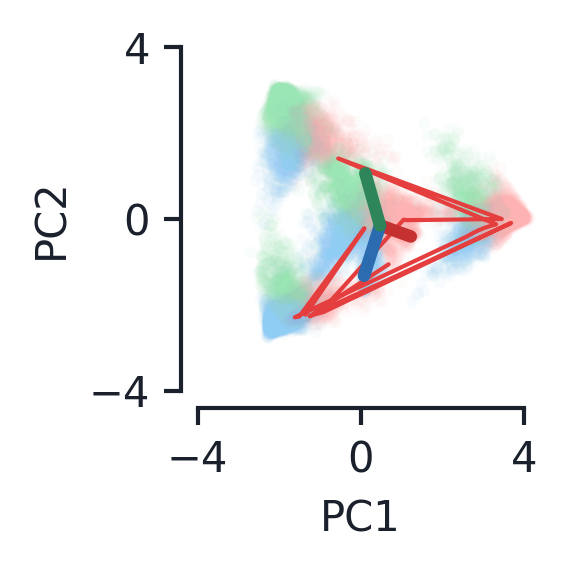

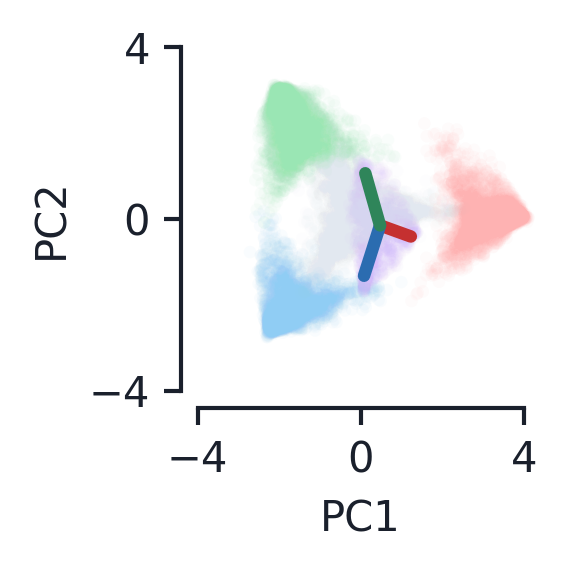

In [ ]:
import matplotlib.colors
from mpl_toolkits.axes_grid.inset_locator import (inset_axes, InsetPosition, mark_inset)

fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2,2))

pcx = 0
pcy = 1

phrase_len = hs.shape[1]

label_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", [
    c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], jetplot.colors.gray.v3, 
    c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1],
])
max_score = toy_params['phrase_length'] - 1

for batch_idx in range(hs.shape[0]):
    color_labels_l = c_vals_l[labels[batch_idx]]
    color_labels = c_vals[labels[batch_idx]]

    ax1.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], 
                c=score_diffs[batch_idx], linewidth=0.0,
                marker='.', zorder=0, alpha=0.05,
                cmap=label_cmap, vmin=-max_score, vmax=max_score)

word_colors_l = (c_vals_l[0], c_vals_l[1], jetplot.colors.gray.v3, c_vals_l[3],)
word_colors = (c_vals[0], c_vals[1], jetplot.colors.gray.v6, c_vals[3],)

for batch_idx in range(hs.shape[0]):
    color_labels_l = [word_colors_l[word_labels[batch_idx, seq_idx]] for seq_idx in range(phrase_len)]
    color_labels = word_colors[word_labels[batch_idx, -1]]

    ax2.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], linewidth=0.0,
                marker='.', color=color_labels_l, zorder=0, alpha=0.05)

for ro_idx in range(net_params['n_outputs']):
    ax1.plot([zero_matrix_pca[ro_idx, pcx], ro_matrix_pca[ro_idx, pcx]], 
            [zero_matrix_pca[ro_idx, pcy], ro_matrix_pca[ro_idx, pcy]],
                color=c_vals_dl[ro_idx], linewidth=3.0, zorder=10)
    ax2.plot([zero_matrix_pca[ro_idx, pcx], ro_matrix_pca[ro_idx, pcx]], 
            [zero_matrix_pca[ro_idx, pcy], ro_matrix_pca[ro_idx, pcy]],
                color=c_vals_dl[ro_idx], linewidth=3.0, zorder=10)

# Some sample paths
for batch_idx in (0,):
    ax1.plot(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy],
            color=c_vals[labels[batch_idx]], zorder=1, linewidth=1.0)

# iax2 = plt.axes([0,0,2,1])
# iax2.set_axes_locator(InsetPosition(ax2, [0.5,0.8,0.6,0.4]))
# # iax2.set_xlabel('$\Delta$PC{}'.format(pcx+1))
# # iax2.set_ylabel('$\Delta$PC{}'.format(pcy+1))
# for word_idx in range(3):
#     if word_idx == 2: # Grey for neutral
#         color_labels_l = jetplot.colors.gray.v3
#         color_labels = jetplot.colors.gray.v6
#     else:
#         color_labels_l = c_vals_l[word_idx]
#         color_labels = c_vals[word_idx]
#     iax2.scatter(delta_hs_pca[word_idx][:, pcx], delta_hs_pca[word_idx][:, pcy], 
#                  linewidth=0.0, marker='.', color=color_labels_l, 
#                  zorder=0, alpha=0.05)
#     iax2.plot((0, np.mean(delta_hs_pca[word_idx][:, pcx], axis=0)),
#               (0, np.mean(delta_hs_pca[word_idx][:, pcy], axis=0)), 
#               linewidth=1.5, color=color_labels, marker=None, 
#               zorder=5, alpha=1.0)

# iax2.set_xlim((-6, 6))
# iax2.set_ylim((-4, 4))
# iax2.set_xticks((-6, 0, 6))
# iax2.set_yticks((-4, 0, 4))
# iax2.set_xticklabels((-6, None, 6))
# iax2.set_yticklabels((-4, None, 4))

iax2 = plt.axes([0,0,2,1])
iax2.set_axes_locator(InsetPosition(ax2, [0.7,0.8,0.4,0.4]))
# iax2.set_xlabel('$\Delta$PC{}'.format(pcx+1))
# iax2.set_ylabel('$\Delta$PC{}'.format(pcy+1))
word_colors = [c_vals_l[0], c_vals_l[1], jetplot.colors.gray.v3, c_vals_l[3]]  # Grey for neutral
iax2.bar((0,1,2,3), mean_word_aligns, color=word_colors)

iax2.set_xlim((-1, 4))
iax2.set_xticks([])
iax2.set_ylim((0, 1))
iax2.set_yticks((0, 1))
iax2.set_ylabel('RO align')
              
iax2.spines["top"].set_visible(False)
iax2.spines["right"].set_visible(False)
# iax2.spines["bottom"].set_visible(False)
# iax2.spines["left"].set_visible(False)
for item in ([iax2.xaxis.label, iax2.yaxis.label] +
             iax2.get_xticklabels() + iax2.get_yticklabels()):
    item.set_fontsize(8)
jetplot.breathe(ax=iax2)

for ax in (ax1, ax2):
    
    ax.set_xlabel('PC{}'.format(pcx+1))
    ax.set_ylabel('PC{}'.format(pcy+1))
    ax.set_xlim((-4, 4))
    ax.set_ylim((-2, 6))
    ax.set_xticks((-4, 0, 4))
    ax.set_yticks((-2, 0, 6))

    jetplot.breathe(ax=ax)

In [ ]:
# Flatten matrix dimensions (but not batch and seq)
projection_type = 'PCA' # 'PCA', 'time_PCA'
pc_comps = 200

As = db_load['A'].cpu().numpy()

# Adds A0 as initial state for all sequences
A0 = net_load.A0.cpu().numpy()
A0_batch = np.repeat(A0[np.newaxis, np.newaxis, :, :], As.shape[0], axis=0)
As = np.concatenate((A0_batch, As), axis=1)
As_fit = As

if running_score.shape[1] < As_fit.shape[1]:
    running_score_init = np.concatenate((
        np.zeros((running_score.shape[0], 1, running_score.shape[-1],)), running_score
    ), axis=1)
    score_diffs_init = running_score_init[:, :, 1] - running_score_init[:, :, 0]

As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))
A_diffs = As_flat[:, 1:, :] - As_flat[:, :-1, :] # note, already flattened

if projection_type == 'PCA':
    a_PCA = PCA(n_components=pc_comps)

    a_PCA.fit(As_flat.reshape((-1, As_flat.shape[-1])))
    
    # # Fit to one subset, but plot the other
    # As_fit = As[:, epoch_idxs[2]:toy_params['phrase_length']-1, :, :]
    # As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))

    As_pca = np.zeros((As_flat.shape[0], As_flat.shape[1], pc_comps))
    A_diffs_pca = np.zeros((A_diffs.shape[0], A_diffs.shape[1], pc_comps))
    # A_diffs_pca = np.zeros((As_flat.shape[0], As_flat.shape[1]-1, pc_comps))
    A_zeros = np.zeros_like(As_flat[0, 0:1, :])
    for batch_idx in range(As.shape[0]):
        As_pca[batch_idx] = a_PCA.transform(As_flat[batch_idx])
        A_diffs_pca[batch_idx] = np.matmul(A_diffs[batch_idx], a_PCA.components_.T)
        # A_diffs_ca
    A_zeros_pca = a_PCA.transform(A_zeros)

    # if toy_params['data_type'] == 'int':
    #     As_spec = np.copy(db_special['A'])
    #     As_spec_flat = As_spec.reshape((As_spec.shape[0], As_spec.shape[1], As_spec.shape[2]*As_spec.shape[3]))
    #     As_spec_pca = np.zeros((As_spec_flat.shape[0], As_spec_flat.shape[1], pc_comps))
    #     for batch_idx in range(hs_spec.shape[0]):
    #         As_spec_pca[batch_idx] = a_PCA.transform(As_spec_flat[batch_idx])

    delta_As_pca = []
    for word_idx in range(len(delta_As)):
        delta_As_pca.append(np.matmul(np.reshape(delta_As[word_idx], (delta_As[word_idx].shape[0], -1)), 
                                      a_PCA.components_.T))
elif projection_type == 'time_PCA':
    As_pca, proj_matrix, center_vector = timeAndPCAProject(As_flat, pc_comps=pc_comps)

    delta_As_pca = []
    for word_idx in range(len(delta_As)):
        delta_As_pca.append(np.matmul(np.reshape(delta_As[word_idx], (delta_As[word_idx].shape[0], -1)), 
                                      proj_matrix.T))

print('PCA shape:', As_pca.shape)
print('Variances:', ['{:.2f}'.format(var) for var in a_PCA.explained_variance_[:10]])
print('PR: {:.2f}'.format(
    participation_ratio_vector(a_PCA.explained_variance_)))

PCA shape: (1000, 21, 200)
Variances: ['29.44', '23.65', '1.88', '0.51', '0.33', '0.26', '0.12', '0.09', '0.04', '0.02']
PR: 2.22


/usr/local/lib/python3.7/dist-packages/google/colab/_event_manager.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)


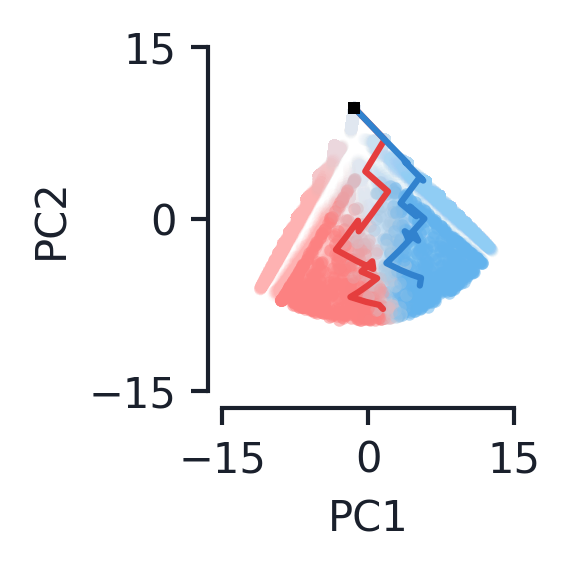

/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


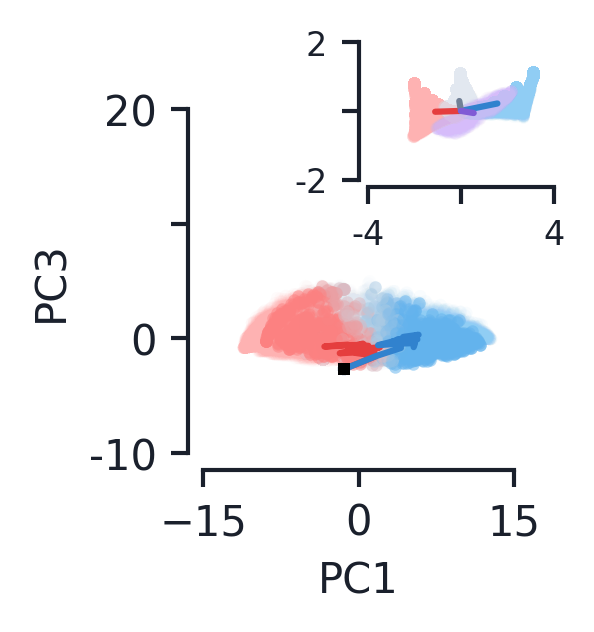

In [ ]:
color_type = 'labels' # 'labels', 'words', 'seq_idx'

fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2,2))

pcxs = (0, 0)
pcys = (1, 2)

c_vals_ld = (jetplot.colors.red.v4, jetplot.colors.blue.v4, jetplot.colors.green.v4,)

label_cmap_d = matplotlib.colors.LinearSegmentedColormap.from_list("", [
    c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], jetplot.colors.gray.v4, 
    c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1],
])

for ax, pcx, pcy in zip((ax1, ax2), pcxs, pcys):
    for batch_idx in range(hs.shape[0]):
        color_labels_ld = c_vals_ld[labels[batch_idx]]
        color_labels_l = c_vals_l[labels[batch_idx]]
        color_labels = c_vals[labels[batch_idx]]

        ax.scatter(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy], c=score_diffs_init[batch_idx],
                   linewidth=0.0, marker='.', zorder=0, alpha=0.05,
                   cmap=label_cmap, vmin=-max_score, vmax=max_score)
        ax.scatter(As_pca[batch_idx, -1, pcx], As_pca[batch_idx, -1, pcy], c=score_diffs_init[batch_idx, -1],
                   linewidth=0.0, marker='.', zorder=1, alpha=0.5,
                   cmap=label_cmap_d, vmin=-max_score, vmax=max_score)

    # for batch_idx in range(hs_spec.shape[0]):
    # for batch_idx in range(len(toy_params['words'])-1):
    #     ax.plot(As_spec_pca[batch_idx, :, pcx], As_spec_pca[batch_idx, :, pcy], 
    #             color=c_vals[batch_idx], marker='.', zorder=5)

    # Initial point (only uses first batch)
    ax.plot(As_pca[0, 0, pcx], As_pca[0, 0, pcy], marker='s',
            color='k', zorder=10, markersize=3)

    # if pcx == 0:
    #     ax.set_xlabel('Time dir.')
    # else:
    ax.set_xlabel('PC{}'.format(pcx+1))
    # if pcy == 0:
    #     ax.set_ylabel('Time dir.')
    # else:
    ax.set_ylabel('PC{}'.format(pcy+1))

    # Some sample paths
    for batch_idx in (0, 2):
        ax.plot(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy],
                color=c_vals[labels[batch_idx]], zorder=6)

iax2 = plt.axes([0,0,2,1])
iax2.set_axes_locator(InsetPosition(ax2, [0.5,0.75,0.6,0.4]))
# iax2.set_xlabel('$\Delta$PC{}'.format(pcx+1))
# iax2.set_ylabel('$\Delta$PC{}'.format(pcy+1))
for word_idx in range(4):
    if word_idx == 2: # Grey for neutral
        color_labels_l = jetplot.colors.gray.v3
        color_labels = jetplot.colors.gray.v6
    else:
        color_labels_l = c_vals_l[word_idx]
        color_labels = c_vals[word_idx]
    iax2.scatter(delta_As_pca[word_idx][:, pcx], delta_As_pca[word_idx][:, pcy], 
                 linewidth=0.0, marker='.', color=color_labels_l, 
                 zorder=0, alpha=0.05)
    iax2.plot((0, np.mean(delta_As_pca[word_idx][:, pcx], axis=0)),
              (0, np.mean(delta_As_pca[word_idx][:, pcy], axis=0)), 
              linewidth=1.5, color=color_labels, marker=None, 
              zorder=5, alpha=1.0)

iax2.set_xlim((-4, 4))
iax2.set_ylim((-2, 2))
iax2.set_xticks((-4, 0, 4))
iax2.set_yticks((-2, 0, 2))
iax2.set_xticklabels((-4, None, 4))
iax2.set_yticklabels((-2, None, 2))
iax2.spines["top"].set_visible(False)
iax2.spines["right"].set_visible(False)
# iax2.spines["bottom"].set_visible(False)
# iax2.spines["left"].set_visible(False)
for item in ([iax2.xaxis.label, iax2.yaxis.label] +
             iax2.get_xticklabels() + iax2.get_yticklabels()):
    item.set_fontsize(8)
jetplot.breathe(ax=iax2)

ax1.set_ylim((-15, 15))
ax1.set_yticks((-15, 0, 15,))
# ax1.set_yticklabels((-70, None, 0, None, 70))
ax2.set_ylim((-10, 20))
ax2.set_yticks((-10,  0, 10, 20))
ax2.set_yticklabels((-10, 0, None, 20,))
for ax in (ax1, ax2):
    ax.set_xlim((-15, 15))
    ax.set_xticks((-15, 0, 15,))
    # ax.set_xticklabels((-70, None, 0, None, 70))

for ax in (ax1, ax2):

    jetplot.breathe(ax=ax)

3-class STPN

In [ ]:
load_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/lambdasMinIt_'

STPN_load = ['HebbNet_M[50,100,3]_train=seq_inf_task=int_3class_20len',]

trial_idx = 0
init_seed = 1001

turn_off_noise = True
test_set_size = 1000

# Loads network
load_root = load_root_start+str('0.95').replace('.', '')+'_'
load_path = load_root + STPN_load[0]
net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)

if turn_off_noise:
    print('Turning off noise for test set.')
    net_noise_type = net_load.noiseType
    net_load.noiseType = None

testData, testOutputMask, _ = syn.generate_data(
    test_set_size, toy_params_load, net_params_load['n_outputs'],
    raw_data=False, device=torch.device('cpu'), verbose=False)

db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)

print('Accuracy: {:.3f}'.format(db_load['acc']))

labels = np.array(testData[:,:,:][1][:, -1, 0].cpu())

# Generates labels for each word in input sequences 
word_to_input_vector_mat = np.zeros((len(toy_params_load['words']), net_params_load['n_inputs'],))
for word_idx, word in enumerate(toy_params_load['words']):
    word_to_input_vector_mat[word_idx] = toy_params_load['word_to_input_vector'][word]
word_labels = np.argmax(np.matmul(testData.tensors[0].cpu().numpy(), word_to_input_vector_mat.T), axis=-1)

# Gets running score from the sequence
running_score = get_running_scores(word_labels, toy_params_load)
score_diffs = running_score[:, :, 1] - running_score[:, :, 0]

hs = db_load['h'].detach().numpy()
print('Hidden states shape', hs.shape)
ro_matrix = np.array(net_load.w2.detach().cpu())
print('RO shape', ro_matrix.shape)

# Gets alignment of individual clusters with ROs
hs_flat = hs.reshape((-1, hs.shape[-1]))
word_labels_flat = word_labels.flatten()
word_hs = []
mean_word_aligns = []

for word_idx in range(len(toy_params_load['words'])):
    word_hs.append(hs_flat[word_idx == word_labels_flat])
    # print(word_hs[-1].shape)

    word_PCA = PCA()
    word_PCA.fit(word_hs[-1])

    word_aligns = []
    for ro_idx in range(ro_matrix.shape[0]):
        min_angle = np.min((get_align_angle(word_PCA.components_[0], ro_matrix[ro_idx]),
                            get_align_angle(-1*word_PCA.components_[0], ro_matrix[ro_idx])))
        word_aligns.append(np.cos(np.pi/180*min_angle))
        # print('Word {} RO {} - angle: {:.2f}'.format(
        #     toy_params_load['words'][word_idx], ro_idx, np.cos(np.pi/180*min_angle)
        # ))
    mean_word_aligns.append(np.mean(word_aligns))

# Restores noise if it has been turned off
if turn_off_noise:
    net_load.noiseType = net_noise_type

delta_hs, delta_As, delta_hs_theory, delta_hs_theory_seq, delta_As_theory, delta_As_theory_seq = get_word_deflections(net_load, db_load, word_labels, toy_params_load, net_params_load)

Turning off noise for test set.
Accuracy: 0.994
Hidden states shape (1000, 20, 100)
RO shape (3, 100)
  Word 'evid0' count: 4556
  Word 'evid1' count: 4590
  Word 'evid2' count: 4483
  Word 'null' count: 4371
  Word '<eos>' count: 1000
  Word 'evid0' theory acc: h 0.235 // A 0.091 // dA 0.470
  Word 'evid1' theory acc: h 0.296 // A 0.092 // dA 0.496
  Word 'evid2' theory acc: h 0.288 // A 0.084 // dA 0.472
  Word 'null' theory acc: h 0.165 // A 0.098 // dA 0.579
  Word '<eos>' theory acc: h 0.324 // A 0.077 // dA 0.754
Outputing for HebbNet_M


In [ ]:
n_components = 100
hidden_PCA = PCA(n_components=n_components)

hs_fit = hs

hidden_PCA.fit(hs_fit.reshape((-1, hs_fit.shape[-1])))

hs_pca = np.zeros((hs_fit.shape[0], hs_fit.shape[1], n_components,))

for batch_idx in range(hs_fit.shape[0]):
    hs_pca[batch_idx] = hidden_PCA.transform(hs_fit[batch_idx])

zero_matrix_pca = hidden_PCA.transform(np.zeros_like(ro_matrix))
ro_matrix_pca = hidden_PCA.transform(ro_matrix)

delta_hs_pca = []

for word_idx in range(len(delta_hs)):
    delta_hs_pca.append(np.matmul(delta_hs[word_idx], hidden_PCA.components_.T))
    # delta_hs_pca.append(hidden_PCA.transform(delta_hs[word_idx]))

print('PCA shape:', hs_pca.shape)
print('Variances:', ['{:.2f}'.format(var) for var in hidden_PCA.explained_variance_[:10]])
print('PR: {:.2f}'.format(
    participation_ratio_vector(hidden_PCA.explained_variance_)))

PCA shape: (1000, 20, 100)
Variances: ['3.84', '2.41', '0.93', '0.71', '0.32', '0.27', '0.23', '0.07', '0.05', '0.03']
PR: 3.62


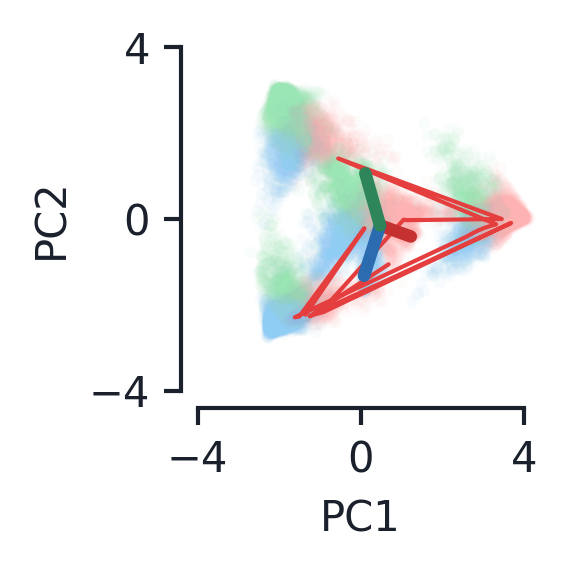

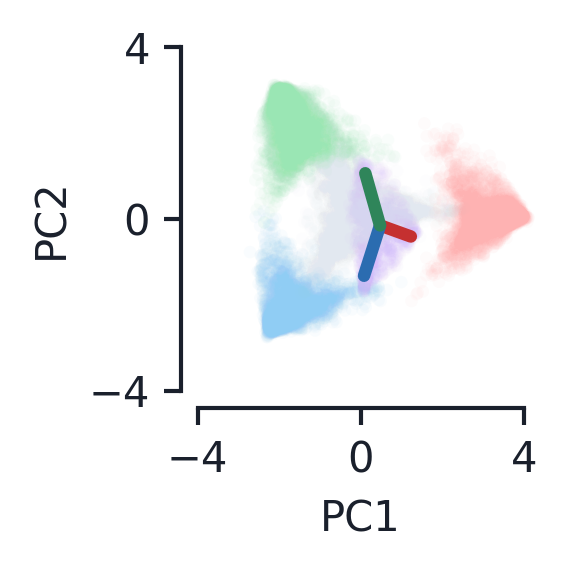

In [ ]:
import matplotlib.colors
from mpl_toolkits.axes_grid.inset_locator import (inset_axes, InsetPosition, mark_inset)

fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2,2))

pcx = 0
pcy = 1

phrase_len = hs.shape[1]

label_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", [
    c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], jetplot.colors.gray.v3, 
    c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1],
])
max_score = toy_params['phrase_length'] - 1

for batch_idx in range(hs.shape[0]):
    color_labels_l = c_vals_l[labels[batch_idx]]
    color_labels = c_vals[labels[batch_idx]]

    # ax1.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], 
    #             c=score_diffs[batch_idx], linewidth=0.0,
    #             marker='.', zorder=0, alpha=0.05,
    #             cmap=label_cmap, vmin=-max_score, vmax=max_score)
    ax1.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], 
                color=color_labels_l, linewidth=0.0,
                marker='.', zorder=0, alpha=0.05)


word_colors_l = (c_vals_l[0], c_vals_l[1], c_vals_l[2], jetplot.colors.gray.v3, c_vals_l[3],)
word_colors = (c_vals[0], c_vals[1], c_vals[2], jetplot.colors.gray.v6, c_vals[3],)

for batch_idx in range(hs.shape[0]):
    color_labels_l = [word_colors_l[word_labels[batch_idx, seq_idx]] for seq_idx in range(phrase_len)]
    color_labels = word_colors[word_labels[batch_idx, -1]]

    ax2.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], linewidth=0.0,
                marker='.', color=color_labels_l, zorder=0, alpha=0.05)

for ro_idx in range(net_params['n_outputs']):
    ax1.plot([zero_matrix_pca[ro_idx, pcx], ro_matrix_pca[ro_idx, pcx]], 
            [zero_matrix_pca[ro_idx, pcy], ro_matrix_pca[ro_idx, pcy]],
                color=c_vals_dl[ro_idx], linewidth=3.0, zorder=10)
    ax2.plot([zero_matrix_pca[ro_idx, pcx], ro_matrix_pca[ro_idx, pcx]], 
            [zero_matrix_pca[ro_idx, pcy], ro_matrix_pca[ro_idx, pcy]],
                color=c_vals_dl[ro_idx], linewidth=3.0, zorder=10)

# Some sample paths
for batch_idx in (0,):
    ax1.plot(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy],
            color=c_vals[labels[batch_idx]], zorder=1, linewidth=1.0)

# iax2 = plt.axes([0,0,2,1])
# iax2.set_axes_locator(InsetPosition(ax2, [0.5,0.8,0.6,0.4]))
# # iax2.set_xlabel('$\Delta$PC{}'.format(pcx+1))
# # iax2.set_ylabel('$\Delta$PC{}'.format(pcy+1))
# for word_idx in range(3):
#     if word_idx == 2: # Grey for neutral
#         color_labels_l = jetplot.colors.gray.v3
#         color_labels = jetplot.colors.gray.v6
#     else:
#         color_labels_l = c_vals_l[word_idx]
#         color_labels = c_vals[word_idx]
#     iax2.scatter(delta_hs_pca[word_idx][:, pcx], delta_hs_pca[word_idx][:, pcy], 
#                  linewidth=0.0, marker='.', color=color_labels_l, 
#                  zorder=0, alpha=0.05)
#     iax2.plot((0, np.mean(delta_hs_pca[word_idx][:, pcx], axis=0)),
#               (0, np.mean(delta_hs_pca[word_idx][:, pcy], axis=0)), 
#               linewidth=1.5, color=color_labels, marker=None, 
#               zorder=5, alpha=1.0)

# iax2.set_xlim((-6, 6))
# iax2.set_ylim((-4, 4))
# iax2.set_xticks((-6, 0, 6))
# iax2.set_yticks((-4, 0, 4))
# iax2.set_xticklabels((-6, None, 6))
# iax2.set_yticklabels((-4, None, 4))

# iax2 = plt.axes([0,0,2,1])
# iax2.set_axes_locator(InsetPosition(ax2, [0.7,0.8,0.4,0.4]))
# # iax2.set_xlabel('$\Delta$PC{}'.format(pcx+1))
# # iax2.set_ylabel('$\Delta$PC{}'.format(pcy+1))
# word_colors = [c_vals_l[0], c_vals_l[1], c_vals_l[2], jetplot.colors.gray.v3, c_vals_l[3]]  # Grey for neutral
# iax2.bar((0,1,2,3,4), mean_word_aligns, color=word_colors)

# iax2.set_xlim((-1, 4))
# iax2.set_xticks([])
# iax2.set_ylim((0, 1))
# iax2.set_yticks((0, 1))
# iax2.set_ylabel('RO align')
              
# iax2.spines["top"].set_visible(False)
# iax2.spines["right"].set_visible(False)
# # iax2.spines["bottom"].set_visible(False)
# # iax2.spines["left"].set_visible(False)
# for item in ([iax2.xaxis.label, iax2.yaxis.label] +
#              iax2.get_xticklabels() + iax2.get_yticklabels()):
#     item.set_fontsize(8)
# jetplot.breathe(ax=iax2)

for ax in (ax1, ax2):
    
    ax.set_xlabel('PC{}'.format(pcx+1))
    ax.set_ylabel('PC{}'.format(pcy+1))
    ax.set_xlim((-4, 4))
    ax.set_ylim((-4, 4))
    ax.set_xticks((-4, 0, 4))
    ax.set_yticks((-4, 0, 4))

    jetplot.breathe(ax=ax)

In [ ]:
# Flatten matrix dimensions (but not batch and seq)
projection_type = 'PCA' # 'PCA', 'time_PCA'
pc_comps = 200

As = db_load['A'].cpu().numpy()

# Adds A0 as initial state for all sequences
A0 = net_load.A0.cpu().numpy()
A0_batch = np.repeat(A0[np.newaxis, np.newaxis, :, :], As.shape[0], axis=0)
As = np.concatenate((A0_batch, As), axis=1)
As_fit = As

if running_score.shape[1] < As_fit.shape[1]:
    running_score_init = np.concatenate((
        np.zeros((running_score.shape[0], 1, running_score.shape[-1],)), running_score
    ), axis=1)
    score_diffs_init = running_score_init[:, :, 1] - running_score_init[:, :, 0]

As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))
A_diffs = As_flat[:, 1:, :] - As_flat[:, :-1, :] # note, already flattened

if projection_type == 'PCA':
    a_PCA = PCA(n_components=pc_comps)

    a_PCA.fit(As_flat.reshape((-1, As_flat.shape[-1])))
    
    # # Fit to one subset, but plot the other
    # As_fit = As[:, epoch_idxs[2]:toy_params['phrase_length']-1, :, :]
    # As_flat = As_fit.reshape((As_fit.shape[0], As_fit.shape[1], As_fit.shape[2]*As_fit.shape[3]))

    As_pca = np.zeros((As_flat.shape[0], As_flat.shape[1], pc_comps))
    A_diffs_pca = np.zeros((A_diffs.shape[0], A_diffs.shape[1], pc_comps))
    # A_diffs_pca = np.zeros((As_flat.shape[0], As_flat.shape[1]-1, pc_comps))
    A_zeros = np.zeros_like(As_flat[0, 0:1, :])
    for batch_idx in range(As.shape[0]):
        As_pca[batch_idx] = a_PCA.transform(As_flat[batch_idx])
        A_diffs_pca[batch_idx] = np.matmul(A_diffs[batch_idx], a_PCA.components_.T)
        # A_diffs_ca
    A_zeros_pca = a_PCA.transform(A_zeros)

    # if toy_params['data_type'] == 'int':
    #     As_spec = np.copy(db_special['A'])
    #     As_spec_flat = As_spec.reshape((As_spec.shape[0], As_spec.shape[1], As_spec.shape[2]*As_spec.shape[3]))
    #     As_spec_pca = np.zeros((As_spec_flat.shape[0], As_spec_flat.shape[1], pc_comps))
    #     for batch_idx in range(hs_spec.shape[0]):
    #         As_spec_pca[batch_idx] = a_PCA.transform(As_spec_flat[batch_idx])

    delta_As_pca = []
    for word_idx in range(len(delta_As)):
        delta_As_pca.append(np.matmul(np.reshape(delta_As[word_idx], (delta_As[word_idx].shape[0], -1)), 
                                      a_PCA.components_.T))
elif projection_type == 'time_PCA':
    As_pca, proj_matrix, center_vector = timeAndPCAProject(As_flat, pc_comps=pc_comps)

    delta_As_pca = []
    for word_idx in range(len(delta_As)):
        delta_As_pca.append(np.matmul(np.reshape(delta_As[word_idx], (delta_As[word_idx].shape[0], -1)), 
                                      proj_matrix.T))

print('PCA shape:', As_pca.shape)
print('Variances:', ['{:.2f}'.format(var) for var in a_PCA.explained_variance_[:10]])
print('PR: {:.2f}'.format(
    participation_ratio_vector(a_PCA.explained_variance_)))

PCA shape: (1000, 21, 200)
Variances: ['593.40', '537.34', '382.66', '108.51', '10.56', '8.81', '6.13', '4.22', '3.48', '3.41']
PR: 3.52


/usr/local/lib/python3.7/dist-packages/google/colab/_event_manager.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)


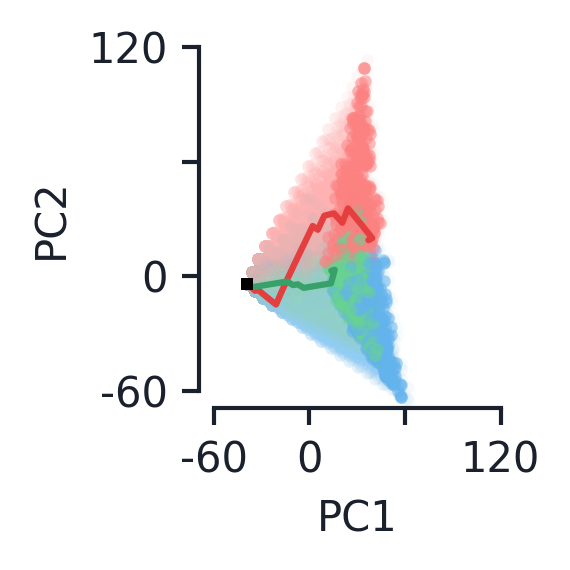

/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


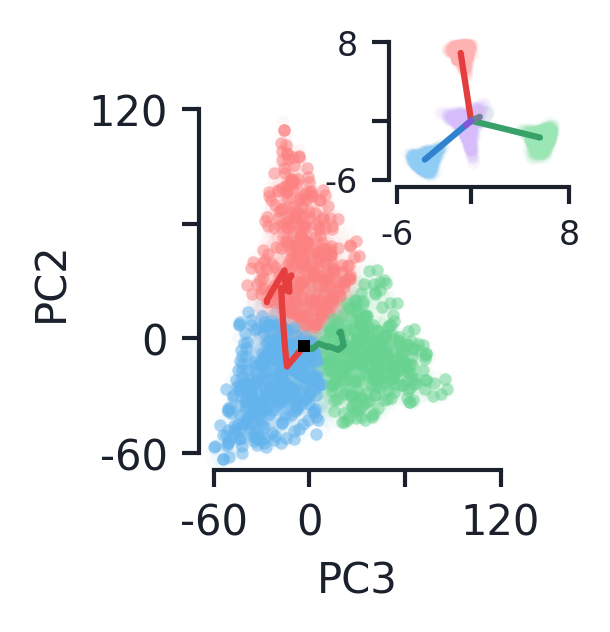

In [ ]:
color_type = 'labels' # 'labels', 'words', 'seq_idx'

fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2,2))

pcxs = (0, 2)
pcys = (1, 1)

c_vals_ld = (jetplot.colors.red.v4, jetplot.colors.blue.v4, jetplot.colors.green.v4,)

label_cmap_d = matplotlib.colors.LinearSegmentedColormap.from_list("", [
    c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], c_vals_ld[0], jetplot.colors.gray.v4, 
    c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1], c_vals_ld[1],
])

for ax, pcx, pcy in zip((ax1, ax2), pcxs, pcys):
    for batch_idx in range(hs.shape[0]):
        color_labels_ld = c_vals_ld[labels[batch_idx]]
        color_labels_l = c_vals_l[labels[batch_idx]]
        color_labels = c_vals[labels[batch_idx]]

        # ax.scatter(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy], c=score_diffs_init[batch_idx],
        #            linewidth=0.0, marker='.', zorder=0, alpha=0.05,
        #            cmap=label_cmap, vmin=-max_score, vmax=max_score)
        # ax.scatter(As_pca[batch_idx, -1, pcx], As_pca[batch_idx, -1, pcy], c=score_diffs_init[batch_idx, -1],
        #            linewidth=0.0, marker='.', zorder=1, alpha=0.5,
        #            cmap=label_cmap_d, vmin=-max_score, vmax=max_score)
        ax.scatter(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy], color=color_labels_l,
                   linewidth=0.0, marker='.', zorder=0, alpha=0.05)
        ax.scatter(As_pca[batch_idx, -1, pcx], As_pca[batch_idx, -1, pcy], color=color_labels_ld,
                   linewidth=0.0, marker='.', zorder=1, alpha=0.5)


    # for batch_idx in range(hs_spec.shape[0]):
    # for batch_idx in range(len(toy_params['words'])-1):
    #     ax.plot(As_spec_pca[batch_idx, :, pcx], As_spec_pca[batch_idx, :, pcy], 
    #             color=c_vals[batch_idx], marker='.', zorder=5)

    # Initial point (only uses first batch)
    ax.plot(As_pca[0, 0, pcx], As_pca[0, 0, pcy], marker='s',
            color='k', zorder=10, markersize=3)

    # if pcx == 0:
    #     ax.set_xlabel('Time dir.')
    # else:
    ax.set_xlabel('PC{}'.format(pcx+1))
    # if pcy == 0:
    #     ax.set_ylabel('Time dir.')
    # else:
    ax.set_ylabel('PC{}'.format(pcy+1))

    # Some sample paths
    for batch_idx in (0, 2):
        ax.plot(As_pca[batch_idx, :, pcx], As_pca[batch_idx, :, pcy],
                color=c_vals[labels[batch_idx]], zorder=6)

iax2 = plt.axes([0,0,2,1])
iax2.set_axes_locator(InsetPosition(ax2, [0.6,0.75,0.6,0.4]))
# iax2.set_xlabel('$\Delta$PC{}'.format(pcx+1))
# iax2.set_ylabel('$\Delta$PC{}'.format(pcy+1))
for word_idx in range(5):
    if word_idx == 3: # Grey for neutral
        color_labels_l = jetplot.colors.gray.v3
        color_labels = jetplot.colors.gray.v6
    elif word_idx == 4:
        color_labels_l = jetplot.colors.purple.v3
        color_labels = jetplot.colors.purple.v6
    else:
        color_labels_l = c_vals_l[word_idx]
        color_labels = c_vals[word_idx]
    iax2.scatter(delta_As_pca[word_idx][:, pcx], delta_As_pca[word_idx][:, pcy], 
                 linewidth=0.0, marker='.', color=color_labels_l, 
                 zorder=0, alpha=0.05)
    iax2.plot((0, np.mean(delta_As_pca[word_idx][:, pcx], axis=0)),
              (0, np.mean(delta_As_pca[word_idx][:, pcy], axis=0)), 
              linewidth=1.5, color=color_labels, marker=None, 
              zorder=5, alpha=1.0)

iax2.set_xlim((-6, 8))
iax2.set_ylim((-6, 8))
iax2.set_xticks((-6, 0, 8))
iax2.set_yticks((-6, 0, 8))
iax2.set_xticklabels((-6, None, 8))
iax2.set_yticklabels((-6, None, 8))
iax2.spines["top"].set_visible(False)
iax2.spines["right"].set_visible(False)
# iax2.spines["bottom"].set_visible(False)
# iax2.spines["left"].set_visible(False)
for item in ([iax2.xaxis.label, iax2.yaxis.label] +
             iax2.get_xticklabels() + iax2.get_yticklabels()):
    item.set_fontsize(8)
jetplot.breathe(ax=iax2)

ax1.set_xlim((-60, 120))
ax1.set_xticks((-60, 0, 60, 120,))
ax1.set_xticklabels((-60, 0, None, 120,))
ax2.set_xlim((-60, 120))
ax2.set_xticks((-60, 0, 60, 120,))
ax2.set_xticklabels((-60, 0, None, 120,))
for ax in (ax1, ax2):
    ax.set_ylim((-60, 120))
    ax.set_yticks((-60, 0, 60, 120,))
    ax.set_yticklabels((-60, 0, None, 120,))

for ax in (ax1, ax2):

    jetplot.breathe(ax=ax)

3 class Vanilla

In [ ]:
load_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/lambdasMinIt_'

vanilla_load = ['VanillaRNN[50,100,3]_train=seq_inf_task=int_3class_20len',]

trial_idx = 0
init_seed = 1001

turn_off_noise = True
test_set_size = 1000

# Loads network
load_root = load_root_start+str('vanilla').replace('.', '')+'_'
load_path = load_root + vanilla_load[0]
net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)

if turn_off_noise:
    print('Turning off noise for test set.')
    net_noise_type = net_load.noiseType
    net_load.noiseType = None

testData, testOutputMask, _ = syn.generate_data(
    test_set_size, toy_params_load, net_params_load['n_outputs'],
    raw_data=False, device=torch.device('cpu'), verbose=False)

db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)

print('Accuracy: {:.3f}'.format(db_load['acc']))

labels = np.array(testData[:,:,:][1][:, -1, 0].cpu())

# Generates labels for each word in input sequences 
word_to_input_vector_mat = np.zeros((len(toy_params_load['words']), net_params_load['n_inputs'],))
for word_idx, word in enumerate(toy_params_load['words']):
    word_to_input_vector_mat[word_idx] = toy_params_load['word_to_input_vector'][word]
word_labels = np.argmax(np.matmul(testData.tensors[0].cpu().numpy(), word_to_input_vector_mat.T), axis=-1)

hs = db_load['h'].detach().numpy()
print('Hidden states shape', hs.shape)
ro_matrix = np.array(net_load.w2.detach().cpu())
print('RO shape', ro_matrix.shape)

# Restores noise if it has been turned off
if turn_off_noise:
    net_load.noiseType = net_noise_type

delta_hs = get_word_deflections(net_load, db_load, word_labels, toy_params_load, net_params_load)

Turning off noise for test set.
Accuracy: 0.938
Hidden states shape (1000, 20, 100)
RO shape (3, 100)
  Word 'evid0' count: 4908
  Word 'evid1' count: 4723
  Word 'evid2' count: 4686
  Word 'null' count: 4683
  Word '<eos>' count: 1000
  Word 'evid0' theory acc: h nan
  Word 'evid1' theory acc: h nan
  Word 'evid2' theory acc: h nan
  Word 'null' theory acc: h nan
  Word '<eos>' theory acc: h nan
Outputing for RNNs


/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [ ]:
n_components = 100
hidden_PCA = PCA(n_components=n_components)

hs_fit = hs

# Adds initial hidden state to h
h0 = net_load.h0.cpu().numpy()
h0_batch = np.repeat(h0[np.newaxis, np.newaxis, :], hs_fit.shape[0], axis=0)
hs_fit = np.concatenate((h0_batch, hs_fit), axis=1)

# Gets running score from the sequence
running_score = get_running_scores(word_labels, toy_params_load)
# Adds extra row of zeros for h0
running_score = np.concatenate((
    np.zeros((running_score.shape[0], 1, running_score.shape[-1],)), running_score
), axis=1)
score_diffs = running_score[:, :, 1] - running_score[:, :, 0]

hidden_PCA.fit(hs_fit.reshape((-1, hs_fit.shape[-1])))

hs_pca = np.zeros((hs_fit.shape[0], hs_fit.shape[1], n_components,))

for batch_idx in range(hs_fit.shape[0]):
    hs_pca[batch_idx] = hidden_PCA.transform(hs_fit[batch_idx])

zero_matrix_pca = hidden_PCA.transform(np.zeros_like(ro_matrix))
ro_matrix_pca = hidden_PCA.transform(ro_matrix)

delta_hs_pca = []

for word_idx in range(len(delta_hs)):
    delta_hs_pca.append(np.matmul(delta_hs[word_idx], hidden_PCA.components_.T))
    # delta_hs_pca.append(hidden_PCA.transform(delta_hs[word_idx]))

print('PCA shape:', hs_pca.shape)
print('Variances:', ['{:.2f}'.format(var) for var in hidden_PCA.explained_variance_[:10]])
print('PR: {:.2f}'.format(
    participation_ratio_vector(hidden_PCA.explained_variance_)))

PCA shape: (1000, 21, 100)
Variances: ['6.45', '5.11', '1.69', '1.60', '0.74', '0.66', '0.30', '0.26', '0.22', '0.20']
PR: 4.65


/usr/local/lib/python3.7/dist-packages/google/colab/_event_manager.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)


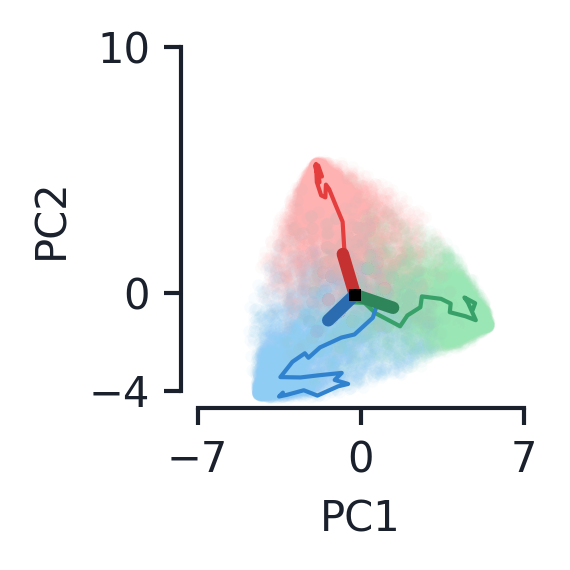

/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


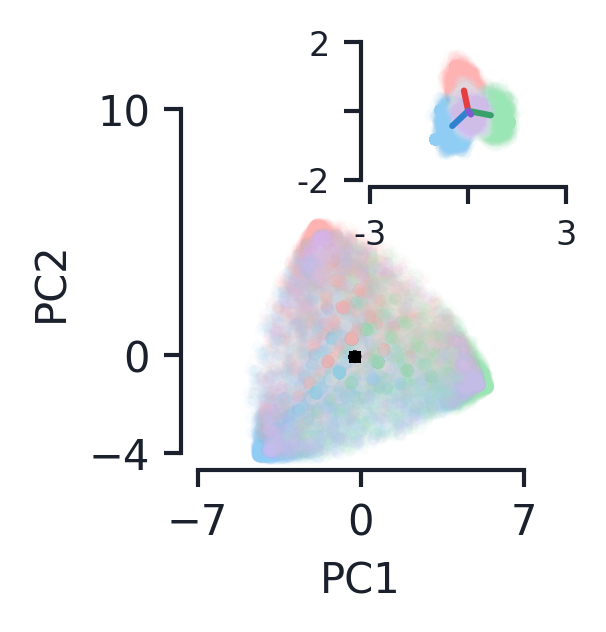

In [ ]:
import matplotlib.colors
from mpl_toolkits.axes_grid.inset_locator import (inset_axes, InsetPosition, mark_inset)

fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2,2))

pcx = 0
pcy = 1

label_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", [
    c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], jetplot.colors.gray.v3, 
    c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1],
])
max_score = toy_params['phrase_length'] - 1

for batch_idx in range(hs.shape[0]):
    color_labels_l = c_vals_l[labels[batch_idx]]
    color_labels = c_vals[labels[batch_idx]]

    # ax1.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], 
    #             c=score_diffs[batch_idx], linewidth=0.0,
    #             marker='.', zorder=0, alpha=0.05,
    #             cmap=label_cmap, vmin=-max_score, vmax=max_score)
    ax1.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], 
                color=color_labels_l, linewidth=0.0,
                marker='.', zorder=0, alpha=0.05)


word_colors_l = (c_vals_l[0], c_vals_l[1], c_vals_l[2], jetplot.colors.gray.v3, c_vals_l[3],)
word_colors = (c_vals[0], c_vals[1], c_vals[2], jetplot.colors.gray.v6, c_vals[3],)

for batch_idx in range(hs.shape[0]):
    color_labels_l = [word_colors_l[word_labels[batch_idx, seq_idx]] for seq_idx in range(phrase_len)]
    color_labels_l.insert(0, 'black') # initial hidden state
    color_labels = word_colors[word_labels[batch_idx, -1]]
    
    ax2.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], linewidth=0.0,
                marker='.', color=color_labels_l, zorder=0, alpha=0.05)
    # Makes EoS a little darker
    ax2.scatter(hs_pca[batch_idx, -1, pcx], hs_pca[batch_idx, -1, pcy], linewidth=0.0,
                marker='.', color=color_labels_l[-1], zorder=1, alpha=0.05)

for ro_idx in range(net_params['n_outputs']):
    ax1.plot([zero_matrix_pca[ro_idx, pcx], ro_matrix_pca[ro_idx, pcx]], 
            [zero_matrix_pca[ro_idx, pcy], ro_matrix_pca[ro_idx, pcy]],
                color=c_vals_dl[ro_idx], linewidth=3.0, zorder=10)

# Some sample paths
for batch_idx in (0, 2, 3):
    ax1.plot(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy],
            color=c_vals[labels[batch_idx]], zorder=1, linewidth=1.0)

iax2 = plt.axes([0,0,2,1])
iax2.set_axes_locator(InsetPosition(ax2, [0.5,0.75,0.6,0.4]))
# iax2.set_xlabel('$\Delta$PC{}'.format(pcx+1))
# iax2.set_ylabel('$\Delta$PC{}'.format(pcy+1))
for word_idx in range(5):
    if word_idx == 3: # Grey for neutral
        color_labels_l = jetplot.colors.gray.v3
        color_labels = jetplot.colors.gray.v6
    elif word_idx == 4: # Grey for neutral
        color_labels_l = jetplot.colors.purple.v3
        color_labels = jetplot.colors.purple.v6
    else:
        color_labels_l = c_vals_l[word_idx]
        color_labels = c_vals[word_idx]
    iax2.scatter(delta_hs_pca[word_idx][:, pcx], delta_hs_pca[word_idx][:, pcy], 
                 linewidth=0.0, marker='.', color=color_labels_l, 
                 zorder=0, alpha=0.05)
    iax2.plot((0, np.mean(delta_hs_pca[word_idx][:, pcx], axis=0)),
              (0, np.mean(delta_hs_pca[word_idx][:, pcy], axis=0)), 
              linewidth=1.5, color=color_labels, marker=None, 
              zorder=5, alpha=1.0)

iax2.set_xlim((-3, 3))
iax2.set_ylim((-2, 2))
iax2.set_xticks((-3, 0, 3))
iax2.set_yticks((-2, 0, 2))
iax2.set_xticklabels((-3, None, 3))
iax2.set_yticklabels((-2, None, 2))
iax2.spines["top"].set_visible(False)
iax2.spines["right"].set_visible(False)
# iax2.spines["bottom"].set_visible(False)
# iax2.spines["left"].set_visible(False)
for item in ([iax2.xaxis.label, iax2.yaxis.label] +
             iax2.get_xticklabels() + iax2.get_yticklabels()):
    item.set_fontsize(8)
jetplot.breathe(ax=iax2)

for ax in (ax1, ax2):
    # Initial hidden (only well-defined for RNNs)
    ax.plot(hs_pca[0, 0, pcx], hs_pca[0, 0, pcy], marker='s',
            color='k', zorder=10, markersize=3)
    
    ax.set_xlabel('PC{}'.format(pcx+1))
    ax.set_ylabel('PC{}'.format(pcy+1))
    ax.set_xlim((-7, 7))
    ax.set_ylim((-4, 10))
    ax.set_xticks((-7, 0, 7))
    ax.set_yticks((-4, 0, 10))

    jetplot.breathe(ax=ax)

3-class GRU

In [ ]:
load_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/lambdasMinIt_'

vanilla_load = ['GRU[50,100,3]_train=seq_inf_task=int_3class_20len',]

trial_idx = 0
init_seed = 1001

turn_off_noise = True
test_set_size = 1000

# Loads network
load_root = load_root_start+str('gru').replace('.', '')+'_'
load_path = load_root + vanilla_load[0]
net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)

if turn_off_noise:
    print('Turning off noise for test set.')
    net_noise_type = net_load.noiseType
    net_load.noiseType = None

testData, testOutputMask, _ = syn.generate_data(
    test_set_size, toy_params_load, net_params_load['n_outputs'],
    raw_data=False, device=torch.device('cpu'), verbose=False)

db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)

print('Accuracy: {:.3f}'.format(db_load['acc']))

labels = np.array(testData[:,:,:][1][:, -1, 0].cpu())

# Generates labels for each word in input sequences 
word_to_input_vector_mat = np.zeros((len(toy_params_load['words']), net_params_load['n_inputs'],))
for word_idx, word in enumerate(toy_params_load['words']):
    word_to_input_vector_mat[word_idx] = toy_params_load['word_to_input_vector'][word]
word_labels = np.argmax(np.matmul(testData.tensors[0].cpu().numpy(), word_to_input_vector_mat.T), axis=-1)

hs = db_load['h'].detach().numpy()
print('Hidden states shape', hs.shape)
ro_matrix = np.array(net_load.w2.detach().cpu())
print('RO shape', ro_matrix.shape)

# Restores noise if it has been turned off
if turn_off_noise:
    net_load.noiseType = net_noise_type

delta_hs = get_word_deflections(net_load, db_load, word_labels, toy_params_load, net_params_load)

Turning off noise for test set.
Accuracy: 0.988
Hidden states shape (1000, 20, 100)
RO shape (3, 100)
  Word 'evid0' count: 5059
  Word 'evid1' count: 4957
  Word 'evid2' count: 4557
  Word 'null' count: 4427
  Word '<eos>' count: 1000
  Word 'evid0' theory acc: h nan
  Word 'evid1' theory acc: h nan
  Word 'evid2' theory acc: h nan
  Word 'null' theory acc: h nan
  Word '<eos>' theory acc: h nan
Outputing for RNNs


/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [ ]:
n_components = 100
hidden_PCA = PCA(n_components=n_components)

hs_fit = hs

# Adds initial hidden state to h
h0 = net_load.h0.cpu().numpy()
h0_batch = np.repeat(h0[np.newaxis, np.newaxis, :], hs_fit.shape[0], axis=0)
hs_fit = np.concatenate((h0_batch, hs_fit), axis=1)

# Gets running score from the sequence
running_score = get_running_scores(word_labels, toy_params_load)
# Adds extra row of zeros for h0
running_score = np.concatenate((
    np.zeros((running_score.shape[0], 1, running_score.shape[-1],)), running_score
), axis=1)
score_diffs = running_score[:, :, 1] - running_score[:, :, 0]

hidden_PCA.fit(hs_fit.reshape((-1, hs_fit.shape[-1])))

hs_pca = np.zeros((hs_fit.shape[0], hs_fit.shape[1], n_components,))

for batch_idx in range(hs_fit.shape[0]):
    hs_pca[batch_idx] = hidden_PCA.transform(hs_fit[batch_idx])

zero_matrix_pca = hidden_PCA.transform(np.zeros_like(ro_matrix))
ro_matrix_pca = hidden_PCA.transform(ro_matrix)

delta_hs_pca = []

for word_idx in range(len(delta_hs)):
    delta_hs_pca.append(np.matmul(delta_hs[word_idx], hidden_PCA.components_.T))
    # delta_hs_pca.append(hidden_PCA.transform(delta_hs[word_idx]))

print('PCA shape:', hs_pca.shape)
print('Variances:', ['{:.2f}'.format(var) for var in hidden_PCA.explained_variance_[:10]])
print('PR: {:.2f}'.format(
    participation_ratio_vector(hidden_PCA.explained_variance_)))

PCA shape: (1000, 21, 100)
Variances: ['5.00', '3.89', '0.06', '0.04', '0.04', '0.03', '0.02', '0.00', '0.00', '0.00']
PR: 2.06


/usr/local/lib/python3.7/dist-packages/google/colab/_event_manager.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)


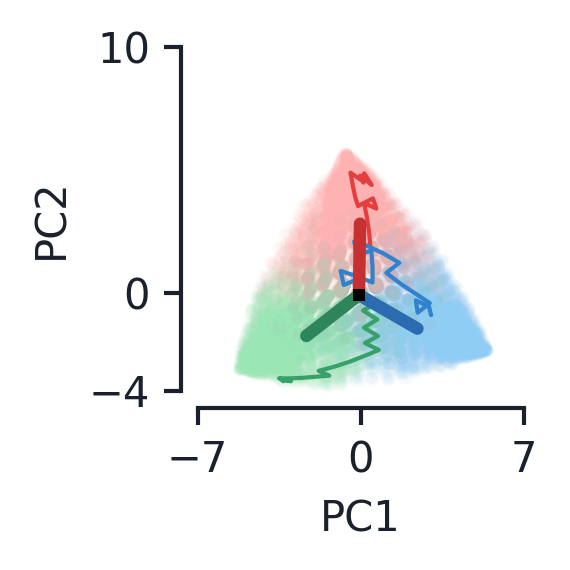

/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


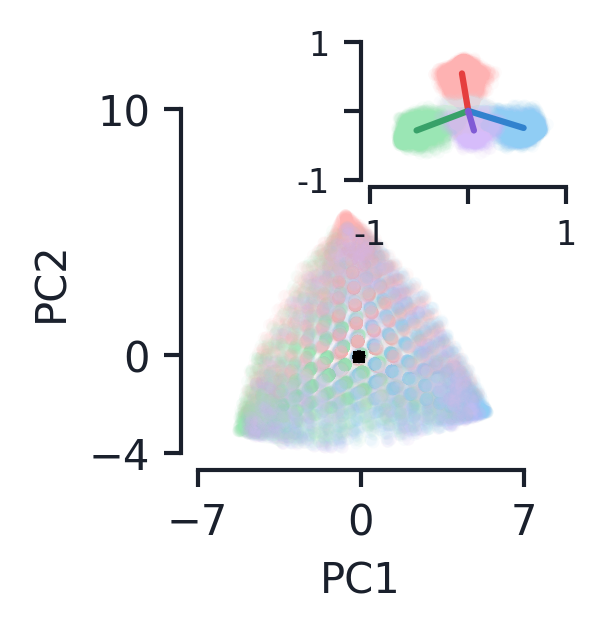

In [ ]:
import matplotlib.colors
from mpl_toolkits.axes_grid.inset_locator import (inset_axes, InsetPosition, mark_inset)

fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2,2))

pcx = 0
pcy = 1

label_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", [
    c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], c_vals_l[0], jetplot.colors.gray.v3, 
    c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1], c_vals_l[1],
])
max_score = toy_params['phrase_length'] - 1

for batch_idx in range(hs.shape[0]):
    color_labels_l = c_vals_l[labels[batch_idx]]
    color_labels = c_vals[labels[batch_idx]]

    # ax1.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], 
    #             c=score_diffs[batch_idx], linewidth=0.0,
    #             marker='.', zorder=0, alpha=0.05,
    #             cmap=label_cmap, vmin=-max_score, vmax=max_score)
    ax1.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], 
                color=color_labels_l, linewidth=0.0,
                marker='.', zorder=0, alpha=0.05)


word_colors_l = (c_vals_l[0], c_vals_l[1], c_vals_l[2], jetplot.colors.gray.v3, c_vals_l[3],)
word_colors = (c_vals[0], c_vals[1], c_vals[2], jetplot.colors.gray.v6, c_vals[3],)

for batch_idx in range(hs.shape[0]):
    color_labels_l = [word_colors_l[word_labels[batch_idx, seq_idx]] for seq_idx in range(phrase_len)]
    color_labels_l.insert(0, 'black') # initial hidden state
    color_labels = word_colors[word_labels[batch_idx, -1]]
    
    ax2.scatter(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy], linewidth=0.0,
                marker='.', color=color_labels_l, zorder=0, alpha=0.05)
    # Makes EoS a little darker
    ax2.scatter(hs_pca[batch_idx, -1, pcx], hs_pca[batch_idx, -1, pcy], linewidth=0.0,
                marker='.', color=color_labels_l[-1], zorder=1, alpha=0.05)

for ro_idx in range(net_params['n_outputs']):
    ax1.plot([zero_matrix_pca[ro_idx, pcx], ro_matrix_pca[ro_idx, pcx]], 
            [zero_matrix_pca[ro_idx, pcy], ro_matrix_pca[ro_idx, pcy]],
                color=c_vals_dl[ro_idx], linewidth=3.0, zorder=10)

# Some sample paths
for batch_idx in (0, 3, 4):
    ax1.plot(hs_pca[batch_idx, :, pcx], hs_pca[batch_idx, :, pcy],
            color=c_vals[labels[batch_idx]], zorder=1, linewidth=1.0)

iax2 = plt.axes([0,0,2,1])
iax2.set_axes_locator(InsetPosition(ax2, [0.5,0.75,0.6,0.4]))
# iax2.set_xlabel('$\Delta$PC{}'.format(pcx+1))
# iax2.set_ylabel('$\Delta$PC{}'.format(pcy+1))
for word_idx in range(5):
    if word_idx == 3: # Grey for neutral
        color_labels_l = jetplot.colors.gray.v3
        color_labels = jetplot.colors.gray.v6
    elif word_idx == 4: # Grey for neutral
        color_labels_l = jetplot.colors.purple.v3
        color_labels = jetplot.colors.purple.v6
    else:
        color_labels_l = c_vals_l[word_idx]
        color_labels = c_vals[word_idx]
    iax2.scatter(delta_hs_pca[word_idx][:, pcx], delta_hs_pca[word_idx][:, pcy], 
                 linewidth=0.0, marker='.', color=color_labels_l, 
                 zorder=0, alpha=0.05)
    iax2.plot((0, np.mean(delta_hs_pca[word_idx][:, pcx], axis=0)),
              (0, np.mean(delta_hs_pca[word_idx][:, pcy], axis=0)), 
              linewidth=1.5, color=color_labels, marker=None, 
              zorder=5, alpha=1.0)

iax2.set_xlim((-1, 1))
iax2.set_ylim((-1, 1))
iax2.set_xticks((-1, 0, 1))
iax2.set_yticks((-1, 0, 1))
iax2.set_xticklabels((-1, None, 1))
iax2.set_yticklabels((-1, None, 1))
iax2.spines["top"].set_visible(False)
iax2.spines["right"].set_visible(False)
# iax2.spines["bottom"].set_visible(False)
# iax2.spines["left"].set_visible(False)
for item in ([iax2.xaxis.label, iax2.yaxis.label] +
             iax2.get_xticklabels() + iax2.get_yticklabels()):
    item.set_fontsize(8)
jetplot.breathe(ax=iax2)

for ax in (ax1, ax2):
    # Initial hidden (only well-defined for RNNs)
    ax.plot(hs_pca[0, 0, pcx], hs_pca[0, 0, pcy], marker='s',
            color='k', zorder=10, markersize=3)
    
    ax.set_xlabel('PC{}'.format(pcx+1))
    ax.set_ylabel('PC{}'.format(pcy+1))
    ax.set_xlim((-7, 7))
    ax.set_ylim((-4, 10))
    ax.set_xticks((-7, 0, 7))
    ax.set_yticks((-4, 0, 10))

    jetplot.breathe(ax=ax)

#### Quantification of variance explained

Note this uses the same VanillaRNNs/MPNs that were used to investigate flow under gradually longer phrases. 

In [ ]:
from sklearn.linear_model import LinearRegression

load_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/lambdasMinIt_'

vanilla_load = ['VanillaRNN[50,100,2]_train=seq_inf_task=int_2class_20len',]
STPN_load = ['HebbNet_M[50,100,2]_train=seq_inf_task=int_2class_20len',]
STPN1_load = ['HebbNet_M[50,100,2]_train=seq_inf_task=int_2class_20len',]

n_trials = 10
init_seed = 1001

turn_off_noise = True
test_set_size = 1000

# (vanilla, stpn, stpn1; n_trials; full, acc evid, present input)
r_squared_vals = np.zeros((3, n_trials, 3))
prs = np.zeros((3, n_trials))

for load_idx, load_path in enumerate((vanilla_load, STPN_load, STPN1_load)):
    for trial_idx in range(n_trials):
        # print('Trial {}'.format(trial_idx))
        # Loads network
        if load_idx == 0:
            load_root = load_root_start+str('vanilla').replace('.', '')+'_'
            load_path = load_root + vanilla_load[0]
        elif load_idx == 1:
            load_root = load_root_start+str('0.95').replace('.', '')+'_'
            load_path = load_root + STPN_load[0]
        elif load_idx == 2:
            load_root = load_root_start+'1factor_small'+str(0.95).replace('.', '')+'_'
            load_path = load_root + STPN1_load[0]

        net_load, net_params_load, toy_params_load = load_net(load_path, init_seed+trial_idx)

        if turn_off_noise:
            net_noise_type = net_load.noiseType
            net_load.noiseType = None

        testData, testOutputMask, _ = syn.generate_data(
            test_set_size, toy_params_load, net_params_load['n_outputs'],
            raw_data=False, device=torch.device('cpu'), verbose=False)

        db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)
        hs = db_load['h'].detach().numpy()

        # Generates labels for each word in input sequences 
        word_to_input_vector_mat = np.zeros((len(toy_params_load['words']), net_params_load['n_inputs'],))
        for word_idx, word in enumerate(toy_params_load['words']):
            word_to_input_vector_mat[word_idx] = toy_params_load['word_to_input_vector'][word]
        word_labels = np.argmax(np.matmul(testData.tensors[0].cpu().numpy(), word_to_input_vector_mat.T), axis=-1)

        # Gets running score from the sequence
        running_score = get_running_scores(word_labels, toy_params_load)
        score_diffs = running_score[:, :, 1] - running_score[:, :, 0]

        #### Fits to find variance explained from various variables ### 
        hs_flat = hs.reshape((-1, hs.shape[-1]))
        score_diffs_flat = score_diffs.flatten()[:, np.newaxis]
        word_labels_flat = word_labels.flatten()[:, np.newaxis]

        # Transforms labels into indicators
        n_indicators = len(toy_params_load['words']) - 1
        # Ref idx has an indicator vector of all zeros, all others are one-hot.
        ref_idx = 2

        word_labels_indicators = np.zeros((
            word_labels_flat.shape[0], n_indicators))

        for label_idx in range(word_labels_flat.shape[0]):
            word_idx = word_labels_flat[label_idx, 0]
            if word_idx < ref_idx:
                word_labels_indicators[label_idx, word_idx] = 1
            elif word_idx > ref_idx:
                word_labels_indicators[label_idx, word_idx-1] = 1

        # Puts everything together
        score_word_vec = np.concatenate((score_diffs_flat, word_labels_indicators), axis=1)

        # print(hs_flat.shape)
        # print(score_word_vec.shape)

        reg_full = LinearRegression().fit(score_word_vec, hs_flat)
        # print('  Full fit:, {:.3f}'.format(reg_full.score(score_word_vec, hs_flat)))
        reg_full_score = LinearRegression().fit(score_diffs_flat, hs_flat)
        # print('  Acc evid fit:, {:.3f}'.format(reg_full_score.score(score_diffs_flat, hs_flat)))
        reg_full_word = LinearRegression().fit(word_labels_indicators, hs_flat)
        # print('  Present word fit:, {:.3f}'.format(reg_full_word.score(word_labels_indicators, hs_flat)))

        r_squared_vals[load_idx, trial_idx, :] = np.array((
            reg_full.score(score_word_vec, hs_flat), 
            reg_full_score.score(score_diffs_flat, hs_flat),
            reg_full_word.score(word_labels_indicators, hs_flat)
        ))

        ### Calculates PCA ###

        n_components = 100
        hidden_PCA = PCA(n_components=n_components)

        hs_fit = hs

        if load_idx == 0:
            # Adds initial hidden state to h
            h0 = net_load.h0.cpu().numpy()
            h0_batch = np.repeat(h0[np.newaxis, np.newaxis, :], hs_fit.shape[0], axis=0)
            hs_fit = np.concatenate((h0_batch, hs_fit), axis=1)

        hidden_PCA.fit(hs_fit.reshape((-1, hs_fit.shape[-1])))

        prs[load_idx, trial_idx] = participation_ratio_vector(hidden_PCA.explained_variance_)

print('Vanilla:')
print('  Full fit: {:.3f} (se: {:.3f})'.format(
    np.mean(r_squared_vals[0, :, 0]), np.std(r_squared_vals[0, :, 0])/np.sqrt(n_trials)))
print('  Acc evid fit: {:.3f} (se: {:.3f})'.format(
    np.mean(r_squared_vals[0, :, 1]), np.std(r_squared_vals[0, :, 1])/np.sqrt(n_trials)))
print('  Present word fit: {:.3f} (se: {:.3f})'.format(
    np.mean(r_squared_vals[0, :, 2]), np.std(r_squared_vals[0, :, 2])/np.sqrt(n_trials)))
print('  PR: {:.2f} (se: {:.2f})'.format(
    np.mean(prs[0, :]), np.std(prs[0, :])/np.sqrt(n_trials)))
print('MPN:')
print('  Full fit: {:.3f} (se: {:.3f})'.format(
    np.mean(r_squared_vals[1, :, 0]), np.std(r_squared_vals[1, :, 0])/np.sqrt(n_trials)))
print('  Acc evid fit: {:.3f} (se: {:.3f})'.format(
    np.mean(r_squared_vals[1, :, 1]), np.std(r_squared_vals[1, :, 1])/np.sqrt(n_trials)))
print('  Present word fit: {:.3f} (se: {:.3f})'.format(
    np.mean(r_squared_vals[1, :, 2]), np.std(r_squared_vals[1, :, 2])/np.sqrt(n_trials)))
print('  PR: {:.2f} (se: {:.2f})'.format(
    np.mean(prs[1, :]), np.std(prs[1, :])/np.sqrt(n_trials)))
print('MPN1:')
print('  Full fit: {:.3f} (se: {:.3f})'.format(
    np.mean(r_squared_vals[2, :, 0]), np.std(r_squared_vals[2, :, 0])/np.sqrt(n_trials)))
print('  Acc evid fit: {:.3f} (se: {:.3f})'.format(
    np.mean(r_squared_vals[2, :, 1]), np.std(r_squared_vals[2, :, 1])/np.sqrt(n_trials)))
print('  Present word fit: {:.3f} (se: {:.3f})'.format(
    np.mean(r_squared_vals[2, :, 2]), np.std(r_squared_vals[2, :, 2])/np.sqrt(n_trials)))
print('  PR: {:.2f} (se: {:.2f})'.format(
    np.mean(prs[2, :]), np.std(prs[2, :])/np.sqrt(n_trials)))

Vanilla:
  Full fit: 0.559 (se: 0.012)
  Acc evid fit: 0.525 (se: 0.012)
  Present word fit: 0.181 (se: 0.003)
  PR: 1.84 (se: 0.07)
MPN:
  Full fit: 0.909 (se: 0.007)
  Acc evid fit: 0.212 (se: 0.007)
  Present word fit: 0.866 (se: 0.008)
  PR: 2.06 (se: 0.12)
MPN1:
  Full fit: 0.868 (se: 0.024)
  Acc evid fit: 0.161 (se: 0.045)
  Present word fit: 0.800 (se: 0.029)
  PR: 1.03 (se: 0.00)


In [ ]:
from sklearn.linear_model import LinearRegression

hs_flat = hs.reshape((-1, hs.shape[-1]))
score_diffs_flat = score_diffs[:, 1:].flatten()[:, np.newaxis]
word_labels_flat = word_labels.flatten()[:, np.newaxis]

# Transforms labels into indicators
n_indicators = len(toy_params_load['words']) - 1
# Ref idx has an indicator vector of all zeros, all others are one-hot.
ref_idx = 2

word_labels_indicators = np.zeros((
    word_labels_flat.shape[0], n_indicators))

for label_idx in range(word_labels_flat.shape[0]):
    word_idx = word_labels_flat[label_idx, 0]
    if word_idx < ref_idx:
        word_labels_indicators[label_idx, word_idx] = 1
    elif word_idx > ref_idx:
        word_labels_indicators[label_idx, word_idx-1] = 1

# Puts everything together
score_word_vec = np.concatenate((score_diffs_flat, word_labels_indicators), axis=1)

# print(hs_flat.shape)
# print(score_word_vec.shape)

reg_full = LinearRegression().fit(score_word_vec, hs_flat)
print('Full fit:, {:.3f}'.format(reg_full.score(score_word_vec, hs_flat)))
reg_full_score = LinearRegression().fit(score_diffs_flat, hs_flat)
print('Acc evid fit:, {:.3f}'.format(reg_full_score.score(score_diffs_flat, hs_flat)))
reg_full_word = LinearRegression().fit(word_labels_indicators, hs_flat)
print('Present word fit:, {:.3f}'.format(reg_full_word.score(word_labels_indicators, hs_flat)))

Full fit:, 0.820
Acc evid fit:, 0.000
Present word fit:, 0.820


### **NeuroGym stuff**

In [2]:
# Install gym
! pip install gym
# Install neurogym
! git clone https://github.com/gyyang/neurogym.git
%cd neurogym/
! pip install -e .

Cloning into 'neurogym'...
remote: Enumerating objects: 11097, done.
remote: Counting objects: 100% (270/270), done.
remote: Compressing objects: 100% (104/104), done.
remote: Total 11097 (delta 132), reused 232 (delta 113), pack-reused 10827
Receiving objects: 100% (11097/11097), 8.20 MiB | 10.35 MiB/s, done.
Resolving deltas: 100% (8318/8318), done.
/home/sc256/mpn/paper/neurogym
Obtaining file:///home/sc256/mpn/paper/neurogym
  Preparing metadata (setup.py) ... done
  Using cached gym-0.24.1.tar.gz (696 kB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for gym: filename=gym-0.24.1-py3-none-any.whl size=793124 sha256=5e20708d1da96b0e5c0e57dcd2a7686548653c74f8879784fae6f613388318ea
  Stored in directory: /home/sc256/.cache/pip/wheels/c4/fb/19/388995b88cb551717a8dff40c889172cd12fadf994216a0a22
Successfully built gym
  Attempting uninstall: gym
    Found existing installation: gym 0.

In [3]:
import neurogym as ngym

# Environment
tasks = ('GoNogo-v0',)

# All supervised tasks:
tasks = (
    # 'ContextDecisionMaking-v0', 
    # 'DelayComparison-v0', 
    # 'DelayMatchCategory-v0',
    # 'DelayMatchSample-v0',
    # 'DelayMatchSampleDistractor1D-v0',
    # 'DelayPairedAssociation-v0',
    # 'DualDelayMatchSample-v0',
    # 'GoNogo-v0',
    # 'HierarchicalReasoning-v0',
    # 'IntervalDiscrimination-v0',
    # 'MotorTiming-v0',
    # 'MultiSensoryIntegration-v0',
    # 'OneTwoThreeGo-v0',
    # 'PerceptualDecisionMaking-v0',
    # 'PerceptualDecisionMakingDelayResponse-v0',
    'ProbabilisticReasoning-v0',
    # 'PulseDecisionMaking-v0',
    # 'ReachingDelayResponse-v0', # Different input type, so omitted
    # 'ReadySetGo-v0',
    # 'SingleContextDecisionMaking-v0',
)

kwargs = {'dt': 100}
seq_len = 100

datasets_params = []

for task_idx, task in enumerate(tasks):

    # Make supervised dataset
    dataset = ngym.Dataset(task, env_kwargs=kwargs, batch_size=16,
                        seq_len=seq_len)
    
    dataset_params = {
        'dataset_name': task,
        'seq_length': seq_len,
        'dt': kwargs['dt'],
        'dataset': dataset,
        'convert_inputs': True, # Remap inputs through a random matrix + bias
        'input_dim': 10,
    }

    env = dataset.env
    ob_size = env.observation_space.shape[0]
    act_size = env.action_space.n

    print('Task {}: {}'.format(task_idx, task))
    print('  Observation size: {}, Action size: {}'.format(ob_size, act_size))

    datasets_params.append(dataset_params)

Task 0: ProbabilisticReasoning-v0
  Observation size: 41, Action size: 3


In [4]:
from net_utils import random_weight_init

def convert_ngym_dataset(dataset_params, set_size=None, device='cpu'):
    """
    This converts a neroGym dataset into one that the code can use. 

    Mostly just transposes the batch and sequence dimensions, then combines
    them into a TensorDataset. Also creates a mask of all trues.
    """

    dataset = dataset_params['dataset']

    if set_size is not None:
        dataset.batchsize = set_size # Just create as a single large batch for now

    inputs, labels = dataset()

    # Default in our setup (batch, seq_idx, :) so need to swap dims
    inputs = np.transpose(inputs, axes=(1, 0, 2))
    labels = np.transpose(labels, axes=(1, 0,))[:, :, np.newaxis]

    if dataset_params['convert_inputs']:
        # If the conversion is not already generated, create it
        if 'convert_mat' not in dataset_params:
            W,b = random_weight_init([inputs.shape[-1], dataset_params['input_dim']], bias=True)
            dataset_params['convert_mat'] = W[0]
            dataset_params['convert_b'] = b[0][np.newaxis, np.newaxis, :]

        inputs = np.matmul(inputs, dataset_params['convert_mat'].T) + dataset_params['convert_b']
    
    # Mask is always just all time steps, so creates all True array
    masks = np.ones((inputs.shape[0], inputs.shape[1], act_size))

    inputs = torch.from_numpy(inputs).type(torch.float).to(device) # inputs.shape (16, 100, 3)
    labels = torch.from_numpy(labels).type(torch.long).to(device) # labels.shape = (16, 100, 1)
    masks = torch.tensor(masks, dtype=torch.bool, device=device)

    trainData = torch.utils.data.TensorDataset(inputs, labels)

    return trainData, masks, dataset_params

Train a single neruoGym task

In [8]:
train = True
save = False
save_root = './saved_nets/'
# save_root = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/anti_task_'

net_params = {
    'netType': 'HebbNet', # HebbNet, HebbNet_M, VanillaRNN, GRU, rHebbNet, rHebbNet_M, GHU, GHU_M
    'n_inputs': ob_size,           # input dim
    'n_hidden': 100,                                # hidden dim
    'n_outputs': act_size,         # output dim
    'f_act': 'tanh',         # 1st layer actiivation function # linear, sigmoid, tanh, relu
    'f0_act': 'linear',          # 2nd layer actiivation function
    'trainable_state0': False,
    
    # STPN Features
    'A_act': None,            # Activation on the A update (tanh or None)
    'lam_clamp': 0.95,          # Maximum lambda value
    'eta_type': 'scalar',       # scalar or vector
    'eta_force': None,        # ensure either Hebbian or anti-Hebbian plasticity
    'hebb_type': 'inputOutput',      # input, output, inputOutput
    'modulation_bounds': False, # bound modulations 
    'mod_bound_val': 0.1, 

    # Train parameters
    'train_mode': 'seq_inf',   # 'seq' or 'seq_inf'
    'weight_reg': 'L1',
    'reg_lambda': 1e-4,
    'hidden_bias': True,
    'ro_bias': False,           # use readout bias or not
    'gradient_clip': 10,
    'freeze_inputs': False,      # freeze the input layer (and hidden bias)
    'sparsification': 0.0,      # Amount to sparsify network's weights (0.0 = no sparsification)
    'noise_type': 'input',      # None, 'input', 'hidden'
    'noise_scale': 0.1,         # Expected magnitude of noise vector
    'cuda': True,
    'validEarlyStop': True,     # Early stop when average validation loss saturates
    'accEarlyStop': None,       # Accuracy to stop early at (None to ignore)
    'minMaxIter': (100, 200), #(2000, 10000),  # Bounds on training time
    'seed': 1003,               # This seed is used to generate training/valid data too

    'train_set_size': 3200,
    'valid_set_size': 250,
    'batch_size': 32,
    'epochs': 40,
}

if dataset_params['convert_inputs']:
    net_params['n_inputs'] = dataset_params['input_dim']

def train_network_ngym(net_params, dataset_params, current_net=None, save=False, save_root='', 
                       set_seed=True, verbose=True):
    """ 
    Code to train a single network using a neuroGym dataset
    
    OUTPUTS:
    net: the trained network

    """

    # Sets the random seed for reproducibility (this affects both data generation and network)
    if 'seed' in net_params and set_seed:
        if net_params['seed'] is not None: 
            np.random.seed(seed=net_params['seed'])
            torch.manual_seed(net_params['seed'])
    
    # Intitializes network and puts it on device
    if net_params['cuda']:
        if verbose: print('Using CUDA...')
        device = torch.device('cuda')
    else:
        if verbose: print('Using CPU...')
        device = torch.device('cpu')
    if current_net is None: # Creates a new network
        net = init_net(net_params, verbose=verbose)
        # print('w1:', net.w1.detach().numpy()[:2,:2])
        # print('b1:', net.b1.detach().numpy()[:2])
        # print('wr:', net.wr.detach().numpy()[:2,:2])
        # print('wri:', net.wri.detach().numpy()[:2,:2])
        net.to(device)
    else:
        net = current_net

    # Creats the data and trains the network, this is done different for different training setups
    if net_params['train_mode'] == 'seq_inf': # Continually generates new data to train on
        # This will iterate in loop so that it only sees each type of data a set amount of times
        net_params['epochs'] = 0 if current_net is None else net.hist['epoch']
        
        validData, validOutputMask, dataset_params = convert_ngym_dataset(
            dataset_params, set_size=net_params['valid_set_size'], device=device
        )
        
        early_stop = False
        new_thresh = True # Triggers threshold setting for first call of .fit, but turns off after first call

        while not early_stop:
            net_params['epochs'] += 10 # Number of times it sees each example
            trainData, trainOutputMask, dataset_params = convert_ngym_dataset(
                dataset_params, set_size=net_params['train_set_size'], device=device
            )
            # print(trainData.tensors[0].shape)
            # break
            early_stop = net.fit('sequence', epochs=net_params['epochs'], 
                                 trainData=trainData, batchSize=net_params['batch_size'],
                                 validBatch=validData[:,:,:], learningRate=1e-3,
                                 newThresh=new_thresh, monitorFreq=50, 
                                 trainOutputMask=trainOutputMask, validOutputMask=validOutputMask,
                                 validStopThres=net_params['accEarlyStop'], weightReg=net_params['weight_reg'], 
                                 regLambda=net_params['reg_lambda'], gradientClip=net_params['gradient_clip'],
                                 earlyStopValid=net_params['validEarlyStop'], minMaxIter=net_params['minMaxIter']) 
            new_thresh = False   
    else:
        raise ValueError

    if save:
        save_net(net, net_params, dataset_params, save_root, overwrite=False, verbose=verbose)
    else:
        print('Not saving network.')

    return net, net_params

if train:
    dataset_params = datasets_params[0]
    net, net_params = train_network_ngym(net_params, dataset_params, save=save, save_root=save_root)
else:
    print('Not training (set train=True if you want to train).')

# print('w1:', net.w1.cpu().detach().numpy()[:2,:2])
# print('b1:', net.b1.cpu().detach().numpy()[:2])
# print('wr:', net.wr.cpu().detach().numpy()[:2,:2])
# print('wri:', net.wri.cpu().detach().numpy()[:2,:2])

Using CUDA...
{'netType': 'HebbNet', 'n_inputs': 10, 'n_hidden': 100, 'n_outputs': 3, 'f_act': 'tanh', 'f0_act': 'linear', 'trainable_state0': False, 'A_act': None, 'lam_clamp': 0.95, 'eta_type': 'scalar', 'eta_force': None, 'hebb_type': 'inputOutput', 'modulation_bounds': False, 'mod_bound_val': 0.1, 'train_mode': 'seq_inf', 'weight_reg': 'L1', 'reg_lambda': 0.0001, 'hidden_bias': True, 'ro_bias': False, 'gradient_clip': 10, 'freeze_inputs': False, 'sparsification': 0.0, 'noise_type': 'input', 'noise_scale': 0.1, 'cuda': True, 'validEarlyStop': True, 'accEarlyStop': None, 'minMaxIter': (100, 200), 'seed': 1003, 'train_set_size': 3200, 'valid_set_size': 250, 'batch_size': 32, 'epochs': 40}
Net parameters:
  Net Type: Additive
  Structure: f: tanh // fOut: linear // (Nx, Nh, Ny) = (10, 100, 3)
  Hidden bias: trainable // No readout bias // Sparsification: 0.00 // Noise type: input (scl: 1.0e-01)
  A parameters:
    A update: Hebbian // A Act: linear // Eta: scalar // Lam: scalar // Lamb

KeyboardInterrupt: 

#### Train many NeroGym tasks at once



In [ ]:
n_trials = 1
acc_thresh = 0.99
valid_early_stop = True
min_max_iter = (2000, 10000)

save = True
save_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/ngym_convert10_2factor2_'

for task_idx, task in enumerate(tasks):
    
    save_root = save_root_start

    dataset_params = datasets_params[task_idx]

    print('Task {}: {}'.format(task_idx, dataset_params['dataset_name']))

    env = dataset_params['dataset'].env
    ob_size = env.observation_space.shape[0]
    act_size = env.action_space.n

    for trial_idx in range(n_trials):
        # Note redefines toy_params internal to the loop so that a new random 
        # set of word vectors will be drawn for each trial
        ########## Toy data parameters ##########
        net_params = {
            'netType': 'HebbNet_M', # HebbNet, HebbNet_M, VanillaRNN, GRU, rHebbNet, rHebbNet_M, GHU, GHU_M
            'n_inputs': ob_size,           # input dim
            'n_hidden': 100,                                # hidden dim
            'n_outputs': act_size,         # output dim
            'f_act': 'tanh',         # 1st layer actiivation function # linear, sigmoid, tanh, relu
            'f0_act': 'linear',          # 2nd layer actiivation function
            'trainable_state0': False,
            
            # STPN Features
            'A_act': None,            # Activation on the A update (tanh or None)
            'lam_clamp': 0.99,          # Maximum lambda value
            'eta_type': 'scalar',       # scalar or vector
            'eta_force': None,        # ensure either Hebbian or anti-Hebbian plasticity
            'hebb_type': 'inputOutput',      # input, output, inputOutput

            # Train parameters
            'train_mode': 'seq_inf',   # 'seq' or 'seq_inf'
            'weight_reg': 'L1',
            'reg_lambda': 1e-4,
            'hidden_bias': True,
            'ro_bias': True,           # use readout bias or not
            'gradient_clip': 10,
            'freeze_inputs': False,      # freeze the input layer (and hidden bias)
            'sparsification': 0.0,      # Amount to sparsify network's weights (0.0 = no sparsification)
            'noise_type': None,      # None, 'input', 'hidden'
            'noise_scale': 0.0,         # Expected magnitude of noise vector
            'cuda': True,
            'validEarlyStop': valid_early_stop,     # Early stop when average validation loss saturates
            'accEarlyStop': acc_thresh,       # Accuracy to stop early at (None to ignore)
            'minMaxIter': min_max_iter,  # Bounds on training time
            'seed': 1009 + trial_idx,               # This seed is used to generate training/valid data too

            'train_set_size': 3200,
            'valid_set_size': 250,
            'batch_size': 32,
            'epochs': 40,
        }

        if dataset_params['convert_inputs']:
            net_params['n_inputs'] = dataset_params['input_dim']

        # Hidden bias is on for all networks now
        # # Keep forgetting to turn this on for RNNs, so just automate it
        # net_params['hidden_bias'] = False if net_params['netType'] in ('HebbNet', 'HebbNet_M') else True

        print('Trial: {}'.format(trial_idx))
        verbose = True if trial_idx == 0 else False
        net, net_params = train_network_ngym(net_params, dataset_params, save=save, 
                                             save_root=save_root, verbose=verbose)

Task 0: ContextDecisionMaking-v0
Trial: 0
Using CUDA...
Net parameters:
  Net Type: Multiplicative
  Structure: f: tanh // fOut: linear // (Nx, Nh, Ny) = (10, 100, 3)
  Hidden bias: trainable // Readout bias: trainable // Sparsification: 0.00 // Noise type: None
  A parameters:
    A update: Hebbian // A Act: linear // Eta: scalar // Lam: scalar // Lambda_max: 0.99
    A0: zeros // A unbounded
Train parameters:
  Loss: XE // LR: 1.00e-03 // Weight reg: L1, coef: 1.0e-04 // Gradient clip: 1.0e+01
Iter:0 grad:5.512 train_loss:1.9006 train_acc:0.044 valid_loss:1.9711 valid_acc:0.027
Iter:50 grad:5.657 train_loss:0.1580 train_acc:0.947 valid_loss:0.1459 valid_acc:0.952
Iter:100 grad:5.965 train_loss:0.0642 train_acc:0.978 valid_loss:0.0687 valid_acc:0.973
Iter:150 grad:6.077 train_loss:0.0529 train_acc:0.982 valid_loss:0.0577 valid_acc:0.976
Iter:200 grad:6.109 train_loss:0.0493 train_acc:0.985 valid_loss:0.0511 valid_acc:0.981
Iter:250 grad:6.079 train_loss:0.0487 train_acc:0.980 valid_lo

Load and evaluate

In [ ]:
load_root_start = '/content/drive/MyDrive/neuro_research/stp_networks/saved_nets/ngym_'

# n_trials = 5 # For main text figure
n_trials = 10 # For eta > 0 and eta < 0 figure

load_types = [
    'convert10_2factor2_HebbNet_M[10,100,{}]_train=seq_inf_task={}_{}len', # note extra 2 here, original did not have acc cap
    'convert10_1factorsmall_HebbNet_M[10,100,{}]_train=seq_inf_task={}_{}len',
    # 'convert10_1factor_GRU[10,100,{}]_train=seq_inf_task={}_{}len',
    # 'convert10_1factor_VanillaRNN[10,100,{}]_train=seq_inf_task={}_{}len',
]

init_seed = 1000
test_set_size = 250

accs = np.zeros((len(load_types), len(tasks), n_trials,))
accs_pos_eta = [[[] for _ in range(len(tasks))] for _ in range(len(load_types))]
accs_neg_eta = [[[] for _ in range(len(tasks))] for _ in range(len(load_types))]

for task_idx, task in enumerate(tasks):

    # Uses the dataset_params array created above just to specify loading name
    dataset_params = datasets_params[task_idx]
    print('Task {}: {}'.format(task_idx, dataset_params['dataset_name']))
    
    # Have to recreate the dataset in dataset_params_load since its not saved
    kwargs = {'dt': dataset_params['dt']}
    dataset = ngym.Dataset(
        dataset_params['dataset_name'], env_kwargs=kwargs, 
        batch_size=16, seq_len=dataset_params['seq_length'])

    env = dataset.env
    ob_size = env.observation_space.shape[0]
    act_size = env.action_space.n

    for load_idx, load_type in enumerate(load_types):
        
        for trial_idx in range(n_trials):
            load_path = load_root_start + load_type.format(
                act_size, dataset_params['dataset_name'], dataset_params['seq_length']
            )

            net_load, net_params_load, dataset_params_load = load_net(load_path, init_seed+trial_idx)
            # Have to recreate the dataset in dataset_params_load since its not saved
            kwargs = {'dt': dataset_params_load['dt']}
            dataset_params_load['dataset'] = ngym.Dataset(
                dataset_params_load['dataset_name'], env_kwargs=kwargs, 
                batch_size=16, seq_len=dataset_params_load['seq_length'])

            if 'convert_inputs' not in dataset_params_load:
                dataset_params_load['convert_inputs'] = False

            testData, testOutputMask, _ = convert_ngym_dataset(
                dataset_params_load, set_size=net_params_load['valid_set_size'], device=torch.device('cpu')
            )
            
            db_load = net_load.evaluate_debug(testData[:,:,:], batchMask=testOutputMask)
            accs[load_idx, task_idx, trial_idx] = db_load['acc']

            # Special eta signed accuracies
            if load_idx in (0, 1,): # MPN or MPNpre
                eta = net_load.eta.detach().cpu().numpy()[0, 0, 0]
                if eta > 0:
                    accs_pos_eta[load_idx][task_idx].append(db_load['acc'])
                else:
                    accs_neg_eta[load_idx][task_idx].append(db_load['acc'])
        
        print('  Acc: {:.3f}'.format(np.mean(accs[load_idx, task_idx, :], axis=-1)))
        if load_idx in (0, 1,):
            print('    Pos eta: {}, Neg eta: {}'.format(
                len(accs_pos_eta[load_idx][task_idx]), len(accs_neg_eta[load_idx][task_idx]))
            )

Task 0: ContextDecisionMaking-v0
  Acc: 0.993
    Pos eta: 7, Neg eta: 3
  Acc: 0.981
    Pos eta: 6, Neg eta: 4
Task 1: DelayComparison-v0
  Acc: 0.996
    Pos eta: 7, Neg eta: 3
  Acc: 0.987
    Pos eta: 7, Neg eta: 3
Task 2: DelayMatchCategory-v0
  Acc: 0.910
    Pos eta: 7, Neg eta: 3
  Acc: 0.916
    Pos eta: 8, Neg eta: 2
Task 3: DelayMatchSample-v0
  Acc: 0.998
    Pos eta: 7, Neg eta: 3
  Acc: 0.933
    Pos eta: 7, Neg eta: 3
Task 4: DelayMatchSampleDistractor1D-v0
  Acc: 0.935
    Pos eta: 5, Neg eta: 5
  Acc: 0.905
    Pos eta: 6, Neg eta: 4
Task 5: DelayPairedAssociation-v0
  Acc: 0.999
    Pos eta: 5, Neg eta: 5
  Acc: 0.964
    Pos eta: 5, Neg eta: 5
Task 6: DualDelayMatchSample-v0
  Acc: 0.988
    Pos eta: 7, Neg eta: 3
  Acc: 0.941
    Pos eta: 6, Neg eta: 4
Task 7: GoNogo-v0
  Acc: 1.000
    Pos eta: 5, Neg eta: 5
  Acc: 1.000
    Pos eta: 5, Neg eta: 5
Task 8: HierarchicalReasoning-v0
  Acc: 0.774
    Pos eta: 8, Neg eta: 2
  Acc: 0.673
    Pos eta: 7, Neg eta: 3
Task 

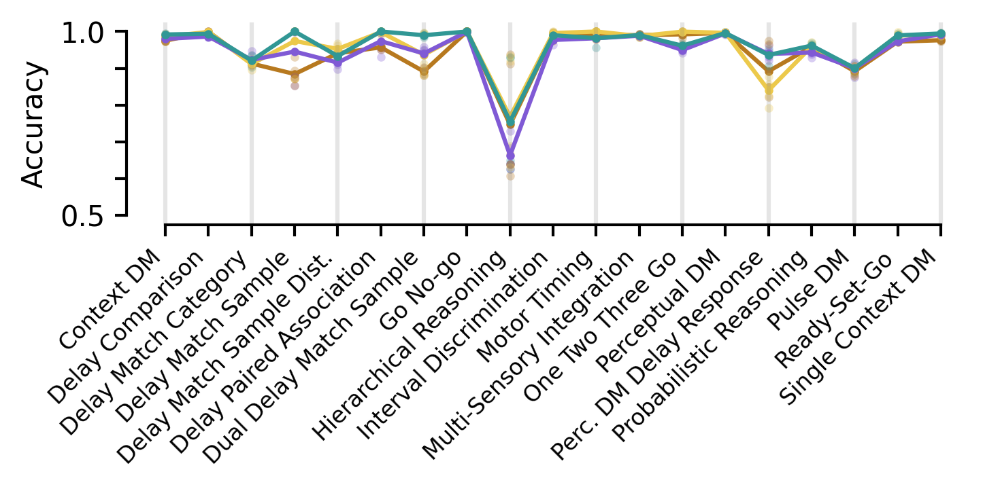

In [ ]:
task_names = (
    'Context DM', 
    'Delay Comparison', 
    'Delay Match Category',
    'Delay Match Sample',
    'Delay Match Sample Dist.',
    'Delay Paired Association',
    'Dual Delay Match Sample',
    'Go No-go',
    'Hierarchical Reasoning',
    'Interval Discrimination',
    'Motor Timing',
    'Multi-Sensory Integration',
    'One Two Three Go',
    'Perceptual DM',
    'Perc. DM Delay Response',
    'Probabilistic Reasoning',
    'Pulse DM',
    # 'ReachingDelayResponse-v0',
    'Ready-Set-Go',
    'Single Context DM',
)

load_colors = (c_vals[5], c_vals[3], c_vals_dl[8], '#ecc94b')
load_idx_names = ('MPN_2', 'MPN_1' , 'GRU', 'VanillaRNN')
load_order = (2, 1, -2, -1,) # Puts MPN first

fig1, ax1 = plt.subplots(1, 1, figsize=(5, 2.5))

for load_idx, load_type in enumerate(load_types):
    ax1.plot(np.arange(len(tasks)), np.mean(accs[load_idx], axis=-1), color=load_colors[load_idx],
             label=load_idx_names[load_idx], marker='.', zorder=load_order[load_idx])

    for task_idx, task in enumerate(tasks):
        ax1.scatter(task_idx * np.ones((n_trials,)), accs[load_idx, task_idx], 
                    color=load_colors[load_idx], marker='.', zorder=-1, alpha=0.3,
                    linewidth=0)

ax1.set_xticks(np.arange(len(tasks)))
ax1.set_xticklabels(task_names, rotation=45, fontsize=8, ha='right')

ax1.set_ylim((0.5, 1.0))
ax1.set_yticks((0.5, 0.6, 0.7, 0.8, 0.9, 1.0))
ax1.set_yticklabels((0.5, None, None, None, None, 1.0))
ax1.set_ylabel('Accuracy')
# ax1.legend()

for it in range(0, len(tasks), 2):
    ax1.axvline(it, color='grey', alpha=0.2, zorder=-1)



jetplot.breathe(ax=ax1)

Difference in positive versus negative eta:

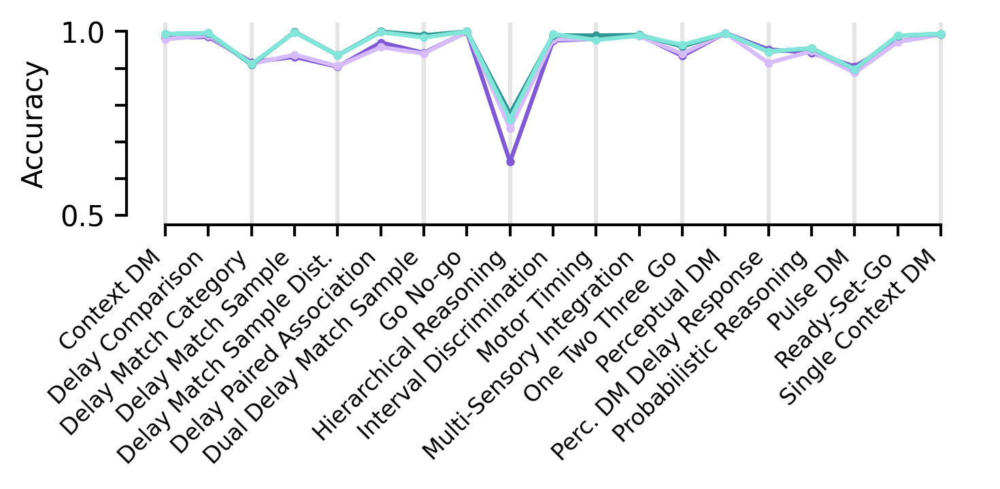

In [ ]:
task_names = (
    'Context DM', 
    'Delay Comparison', 
    'Delay Match Category',
    'Delay Match Sample',
    'Delay Match Sample Dist.',
    'Delay Paired Association',
    'Dual Delay Match Sample',
    'Go No-go',
    'Hierarchical Reasoning',
    'Interval Discrimination',
    'Motor Timing',
    'Multi-Sensory Integration',
    'One Two Three Go',
    'Perceptual DM',
    'Perc. DM Delay Response',
    'Probabilistic Reasoning',
    'Pulse DM',
    # 'ReachingDelayResponse-v0',
    'Ready-Set-Go',
    'Single Context DM',
)

accs_pos = np.zeros((len(load_types), len(tasks)))
accs_neg = np.zeros((len(load_types), len(tasks)))
for load_idx, load_type in enumerate(load_types[:2]):
    accs_pos[load_idx, :] = [np.mean(accs_pos_eta[load_idx][task_idx]) for task_idx in range(len(tasks))]
    accs_neg[load_idx, :] = [np.mean(accs_neg_eta[load_idx][task_idx]) for task_idx in range(len(tasks))]
                                    

load_color_idxs = (5, 3,)
load_order = (2, 1, -2, -1,) # Puts MPN first

fig1, ax1 = plt.subplots(1, 1, figsize=(5, 2.5))

for load_idx, load_type in enumerate(load_types[:2]):
    ax1.plot(np.arange(len(tasks)), accs_pos[load_idx], color=c_vals[load_color_idxs[load_idx]],
             marker='.', zorder=load_order[load_idx])
    ax1.plot(np.arange(len(tasks)), accs_neg[load_idx], color=c_vals_l[load_color_idxs[load_idx]],
             marker='.', zorder=load_order[load_idx])

ax1.set_xticks(np.arange(len(tasks)))
ax1.set_xticklabels(task_names, rotation=45, fontsize=8, ha='right')

ax1.set_ylim((0.5, 1.0))
ax1.set_yticks((0.5, 0.6, 0.7, 0.8, 0.9, 1.0))
ax1.set_yticklabels((0.5, None, None, None, None, 1.0))
ax1.set_ylabel('Accuracy')
# ax1.legend()

for it in range(0, len(tasks), 2):
    ax1.axvline(it, color='grey', alpha=0.2, zorder=-1)

jetplot.breathe(ax=ax1)

Visualization of single neuroGym task for figure

/usr/local/lib/python3.8/dist-packages/IPython/core/events.py:88: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  func(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/IPython/core/pylabtools.py:128: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  fig.canvas.print_figure(bytes_io, **kw)


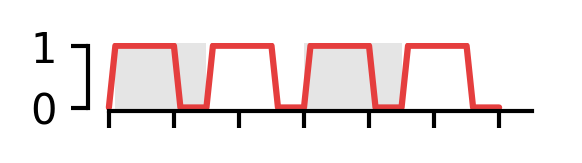

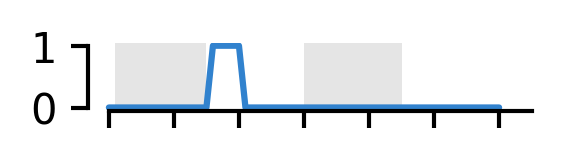

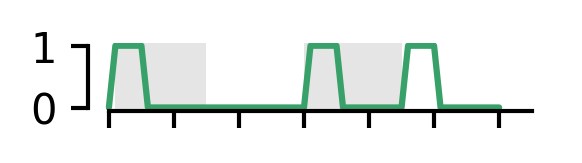

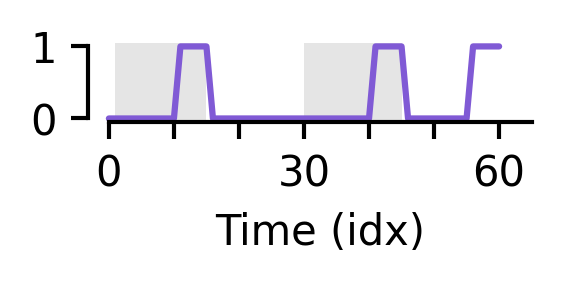

In [ ]:
batch_idx = 2
min_seq_idx = 4
max_seq_idx = 65

seq_idxs = np.arange(max_seq_idx-min_seq_idx) 

fig1, ax1 = plt.subplots(1, 1, figsize=(2, 0.3))
fig2, ax2 = plt.subplots(1, 1, figsize=(2, 0.3))
fig3, ax3 = plt.subplots(1, 1, figsize=(2, 0.3))
fig4, ax4 = plt.subplots(1, 1, figsize=(2, 0.35))

for ax_idx, ax in enumerate((ax1, ax2, ax3, ax4)):
    if ax_idx < 3:
        ax.plot(seq_idxs, inputs[min_seq_idx:max_seq_idx, batch_idx, ax_idx], color=c_vals[ax_idx])
    else:
        ax.plot(seq_idxs, labels[min_seq_idx:max_seq_idx, batch_idx], color=c_vals[ax_idx])

    ax.set_xlim((min_seq_idx, max_seq_idx))
    ax.set_xticks((0, 10, 20, 30, 40, 50, 60))

    ax.axvspan(1, 15, color='grey', zorder=-1, alpha=0.2, lw=0)
    ax.axvspan(30, 45, color='grey', zorder=-1, alpha=0.2, lw=0)
    if ax_idx < 3:
        ax.set_xticklabels((None, None, None, None, None))
    else:
        ax.set_xticklabels((0, None, None, 30, None, None, 60))
        ax.set_xlabel('Time (idx)')

    jetplot.breathe(ax=ax)

### **Jetplot stuff**

In [ ]:
!python -m pip install git+https://github.com/nirum/jetplot

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/nirum/jetplot to /tmp/pip-req-build-n372q4ec
  Running command git clone --filter=blob:none --quiet https://github.com/nirum/jetplot /tmp/pip-req-build-n372q4ec
  Resolved https://github.com/nirum/jetplot to commit 7e2fc15049870523acb3318a38ffeec73c0dfb67
  Preparing metadata (setup.py) ... done
  Created wheel for jetplot: filename=jetplot-0.5.4-py3-none-any.whl size=15265 sha256=6f7729d57e40d8bdf23850495704d50d5a2c671f1fad1737987982910df4e795
  Stored in directory: /tmp/pip-ephem-wheel-cache-m10vkryp/wheels/8d/d7/ea/50da1d92994e471c0f257efe56e136d0fba9251b2478f69719
Successfully built jetplot


In [ ]:
import jetplot

print('Jetpack version:', jetplot.__version__)

Jetpack version: 0.5.4


In [ ]:
from matplotlib import rcParams

rcParams.update({
    'lines.linewidth': 1.5,
    'lines.linestyle': '-',
    'lines.marker': None,
    'lines.markeredgewidth': 0.,
    'lines.markersize': 6.,
    'lines.antialiased': True,
    'lines.solid_joinstyle': 'round',
    'lines.solid_capstyle': 'round',

    'patch.linewidth': 1.,
    'patch.facecolor': '#cccccc',
    'patch.edgecolor': 'none',
    'patch.antialiased': True,

    'font.size': 10,
    'text.usetex': False,
    'mathtext.default': 'regular',

    'axes.linewidth': 1.0,
    'axes.grid': False,
    'axes.titlesize': 10,
    'axes.labelsize': 10,
    'axes.labelweight': 'normal',
    'axes.axisbelow': True,
    'axes.formatter.use_mathtext': False,
    'axes.xmargin': 0.,
    'axes.ymargin': 0.,
    'polaraxes.grid': True,

    'xtick.direction': 'out',
    'xtick.labelsize': 10.,
    'xtick.major.size': 4.,
    'xtick.minor.size': 2.,
    'xtick.major.width': 1.,
    'xtick.minor.width': 1.,

    'ytick.direction': 'out',
    'ytick.labelsize': 10.,
    'ytick.major.size': 4.,
    'ytick.minor.size': 2.,
    'ytick.major.width': 1.,
    'ytick.minor.width': 1.,

    'grid.linestyle': 'dotted',
    'grid.alpha': 0.5,
    'grid.linewidth': 1.0,

    'legend.frameon': False,
    'legend.fancybox': True,
    'legend.fontsize': 10.,
    'legend.loc': 'best',

    'figure.figsize': (5, 3),
    'figure.dpi': 300,
    'figure.autolayout': True,

    'image.cmap': 'viridis',
    'image.interpolation': None,
    'image.aspect': 'equal',

    'savefig.format': 'pdf',
    'savefig.bbox': 'tight',
    'savefig.pad_inches': 0.1,
    'pdf.fonttype': 42,
})

In [ ]:
# 0 Red, 1 blue, 2 green, 3 purple, 4 orange, 5 teal, 6 gray, 7 pink, 8 yellow
c_vals = ['#e53e3e', '#3182ce', '#38a169', '#805ad5','#dd6b20', '#319795', '#718096', '#d53f8c', '#d69e2e',] #v6
c_vals_l = ['#feb2b2', '#90cdf4', '#9ae6b4', '#d6bcfa', '#fbd38d', '#81e6d9', '#e2e8f0', '#fbb6ce', '#faf089',] #v3
c_vals_d = ['#9b2c2c', '#2c5282', '#276749', '#553c9a', '#9c4221', '#285e61', '#2d3748', '#97266d', '#975a16',] #v8

c_vals_ld = ['#fc8181', '#63b3ed', '#68d391', '#b794f4', '#f6ad55', '#4fd1c5', '#cbd5e0', '#f687b3', '#f6e05e'] #v4
c_vals_dl = ['#c53030', '#2b6cb0', '#2f855a', '#6b46c1', '#c05621', '#2c7a7b', '#4a5568', '#b83280', '#b7791f'] #v7

In [8]:
c_vals = [jetplot.colors.red.v6, jetplot.colors.blue.v6, jetplot.colors.green.v6, jetplot.colors.purple.v6,
         jetplot.colors.orange.v6, jetplot.colors.teal.v6, jetplot.colors.gray.v6, jetplot.colors.pink.v6, jetplot.colors.yellow.v6,
         jetplot.colors.pink.v6]
c_vals_l = [jetplot.colors.red.v3, jetplot.colors.blue.v3, jetplot.colors.green.v3, jetplot.colors.purple.v3,
                jetplot.colors.orange.v3, jetplot.colors.teal.v3, jetplot.colors.gray.v3, jetplot.colors.pink.v3,
            jetplot.colors.yellow.v3, jetplot.colors.pink.v3]
c_vals_ld = [jetplot.colors.red.v4, jetplot.colors.blue.v4, jetplot.colors.green.v4, jetplot.colors.purple.v4,
                jetplot.colors.orange.v4, jetplot.colors.teal.v4, jetplot.colors.gray.v4, jetplot.colors.pink.v4,
            jetplot.colors.yellow.v4, jetplot.colors.pink.v4]
c_vals_d = [jetplot.colors.red.v8, jetplot.colors.blue.v8, jetplot.colors.green.v8, jetplot.colors.purple.v8,
                jetplot.colors.orange.v8, jetplot.colors.teal.v8, jetplot.colors.gray.v8, jetplot.colors.pink.v8, jetplot.colors.yellow.v8,]
c_vals_dl = [jetplot.colors.red.v7, jetplot.colors.blue.v7, jetplot.colors.green.v7, jetplot.colors.purple.v7,
                jetplot.colors.orange.v7, jetplot.colors.teal.v7, jetplot.colors.gray.v7, jetplot.colors.pink.v7, jetplot.colors.yellow.v7,]

ordered_map = list(jetplot.colors.cmap_colors('RdYlGn', 7))
ordered_map[3] = jetplot.colors.yellow.v3

NameError: name 'jetplot' is not defined

### **Misc**

In [ ]:
# Confirmation of Haddamar identity

dim1 = 100
dim2 = 70

A = np.random.normal(0, 1, size=(dim1,dim2))
x = np.random.normal(0, 1, size=(dim1,))
y = np.random.normal(0, 1, size=(dim2,))
z = np.random.normal(0, 1, size=(dim2,))

first = np.matmul(np.outer(x, y) * A, z)
second = x * np.matmul(y[np.newaxis, :] * A, z)
third = x * np.matmul(A, y*z)

print(first[:5])
print(second[:5])
print(third[:5])

[ 0.17658084 -6.43607963 -0.48032106  1.12260747 22.49019564]
[ 0.17658084 -6.43607963 -0.48032106  1.12260747 22.49019564]
[ 0.17658084 -6.43607963 -0.48032106  1.12260747 22.49019564]


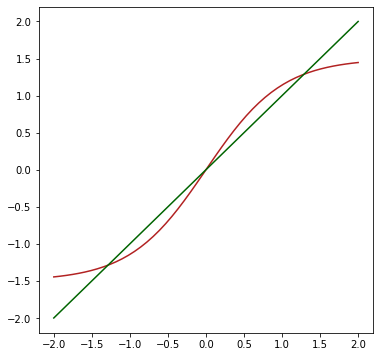

In [ ]:
fig, ax1 = plt.subplots(1, 1, figsize=(6,6))

xs = np.linspace(-2, 2, 50)

ax1.plot(xs, 1.5*np.tanh(xs), color=c_vals[0])
ax1.plot(xs, xs, color=c_vals[1])

In [ ]:
x = -1.0
b = 0.4
for i in range(20):
    print(x)
    x = 1.0*np.tanh(x+b)

-1.0
-0.5370495669980353
-0.13619791657809735
0.2578482975729859
0.5769296821806555
0.7517337135952535
0.8183276059126159
0.8391601581443873
0.8452158986279457
0.8469366506349284
0.8474223959298578
0.8475592591742931
0.8475978013192857
0.8476086535835945
0.8476117091143645
0.8476125694102403
0.84761281162889
0.8476128798261475
0.8476128990272485
0.8476129044333638


Checks noise scale

Mean L2 mag: 0.7306354205461884
Std of mags: 0.165 (s/sqrt(n): 0.274)


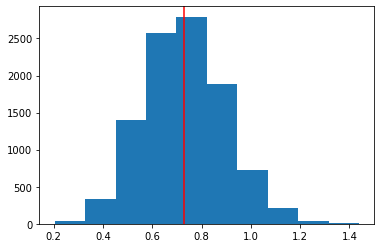

In [ ]:
n = 10
scale = 0.75

trials = 10000
mags = []

for _ in range(trials):
    rand_vec = scale*np.random.normal(0.0, 1/np.sqrt(n), size=n)
    mags.append(np.linalg.norm(rand_vec))

plt.hist(mags)
plt.axvline(np.mean(mags), color='red')
print("Mean L2 mag:", np.mean(mags))
print('Std of mags: {:.3f} (s/sqrt(n): {:.3f})'.format(
    np.std(mags), np.sqrt(scale/n)
))

In [ ]:
from sklearn.linear_model import LinearRegression
from scipy.odr import Model, Data, ODR

def orthoregress(x):
    """Perform an Orthogonal Distance Regression on the given data,
    using the same interface as the standard scipy.stats.linregress function.
    Arguments:
    x: (n_points, n_dims)
    """
    n_points = x.shape[0]
    n_dims = x.shape[-1]
    
    def f(p, x):
        """Linear model to use with ODR"""
        return p[0] + np.dot(p[1:], x)
    
    # Seeds ODR with linear regression, first dimension uses as "y-values"
    reg = LinearRegression().fit(x[:, 1:], x[:, 0:1])
    mod = Model(f)
    # Number of observations is given in -1 index, so much traponse these
    dat = Data(x[:, 1:].T, x[:, 0:1].T)
    od = ODR(dat, mod, beta0=np.concatenate((reg.intercept_, reg.coef_[0]), axis=0))
    out = od.run()
    return list(out.beta), f

100
